In [ ]:
{
  "nodes": [
    {
      "id": "utilized_amount",
      "label": "Utilized Amount",
      "description": "The amount of credit or loan that has been drawn down or used.",
      "type": "Concept",
      "themes": ["Reporting Requirements for Utilized Amounts", "Interest Rate Changes and Reporting"]
    },
    {
      "id": "interest_rate",
      "label": "Interest Rate",
      "description": "The percentage charged on the utilized amount of a loan or credit facility.",
      "type": "Concept",
      "themes": ["Interest Rate Changes and Reporting"]
    },
    {
      "id": "repriced_interest_rate",
      "label": "Repriced Interest Rate",
      "description": "The new interest rate applied after a rate change.",
      "type": "Concept",
      "themes": ["Interest Rate Changes and Reporting"]
    },
    {
      "id": "awpr_week",
      "label": "AWPR Week",
      "description": "A reporting period (likely weekly) referred to as \"AWPR week.\"",
      "type": "Concept",
      "themes": ["Reporting Requirements for Utilized Amounts"]
    },
    {
      "id": "reporting_threshold",
      "label": "Reporting Threshold",
      "description": "The minimum amount of change (Rs. 10 million or Rs. 1 million) that triggers reporting.",
      "type": "Concept",
      "themes": ["Reporting Requirements for Utilized Amounts"]
    },
    {
      "id": "maximum_utilized_amount",
      "label": "Maximum Utilized Amount",
      "description": "The highest utilized amount observed during a given period.",
      "type": "Concept",
      "themes": ["Reporting Requirements for Utilized Amounts"]
    },
    {
      "id": "utilized_balance_previous_week",
      "label": "Utilized Balance (Previous Week)",
      "description": "The utilized amount at the end of the preceding AWPR week.",
      "type": "Concept",
      "themes": ["Reporting Requirements for Utilized Amounts"]
    }
  ],
  "edges": [
    {
      "source": "interest_rate",
      "target": "utilized_amount",
      "label": "influences",
      "details": "Changes in the interest rate can affect the utilized amount."
    },
    {
      "source": "utilized_amount",
      "target": "reporting",
      "label": "triggers",
      "details": "Changes in the utilized amount exceeding the threshold trigger a reporting requirement."
    },
    {
      "source": "awpr_week",
      "target": "maximum_utilized_amount",
      "label": "defines period for",
      "details": "The maximum utilized amount is determined within the context of an AWPR week."
    },
    {
      "source": "reporting_threshold",
      "target": "reporting_requirement",
      "label": "determines",
      "details": "The reporting threshold dictates whether a change in utilized amount necessitates reporting."
    },
    {
      "source": "utilized_balance_previous_week",
      "target": "difference_in_utilized_amount",
      "label": "used to calculate",
      "details": "The previous week's utilized balance is compared to the current week's maximum utilized amount."
    }
  ]
}

Graph created successfully!
Number of nodes: 10
Number of edges: 5


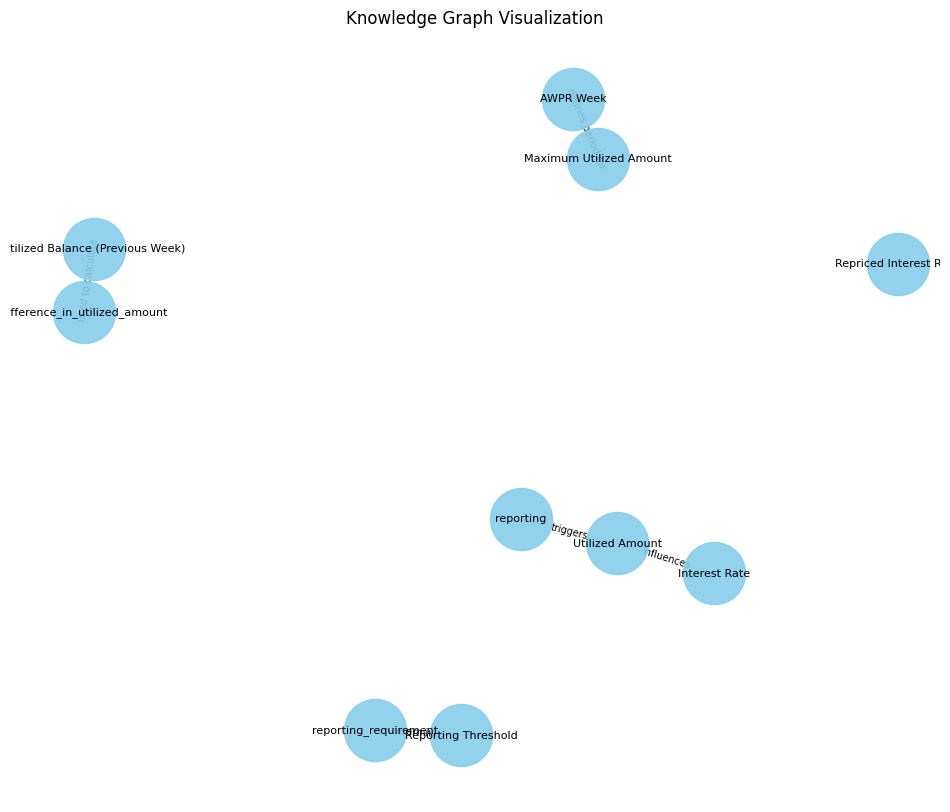

In [3]:
import json
import networkx as nx
import matplotlib.pyplot as plt # Optional: for basic visualization

def create_graph_from_json(data):
    """
    Creates a NetworkX graph from JSON data containing nodes and edges.

    Args:
        data (dict): A dictionary parsed from JSON with "nodes" and "edges" keys.

    Returns:
        networkx.Graph: The created graph.
                          Returns None if "nodes" or "edges" are missing.
    """
    if "nodes" not in data or "edges" not in data:
        print("Error: JSON data must contain 'nodes' and 'edges' keys.")
        return None

    G = nx.Graph() # Or nx.DiGraph() if your relationships are directed

    # Add nodes
    for node_data in data["nodes"]:
        node_id = node_data.get("id")
        if node_id:
            # Add all other attributes from the node_data dictionary
            attributes = {k: v for k, v in node_data.items() if k != "id"}
            G.add_node(node_id, **attributes)
        else:
            print(f"Warning: Node data missing 'id': {node_data}")

    # Add edges
    for edge_data in data["edges"]:
        source_id = edge_data.get("source")
        target_id = edge_data.get("target")
        
        if source_id and target_id:
            # Add all other attributes from the edge_data dictionary
            attributes = {k: v for k, v in edge_data.items() if k not in ["source", "target"]}
            
            # Check if target node exists, if not, add it (can happen if edge refers to a node not explicitly in nodes list)
            # This is a common scenario if the JSON is not perfectly consistent or if some nodes are implied.
            if not G.has_node(target_id):
                print(f"Warning: Target node '{target_id}' for edge from '{source_id}' not found in nodes list. Adding it implicitly.")
                G.add_node(target_id, label=target_id) # Add with a default label or handle as needed
            if not G.has_node(source_id):
                 print(f"Warning: Source node '{source_id}' for edge to '{target_id}' not found in nodes list. Adding it implicitly.")
                 G.add_node(source_id, label=source_id)


            G.add_edge(source_id, target_id, **attributes)
        else:
            print(f"Warning: Edge data missing 'source' or 'target': {edge_data}")
            
    return G

# Parse the JSON string
try:
    file = "/Users/shirsama/dtcc-hackathon/dtcc-ai-hackathon-2025/chunk_8.json"
    with open(file,"r") as f:
        graph_data = json.loads(f.read())
except json.JSONDecodeError as e:
    print(f"Error decoding JSON: {e}")
    graph_data = None

if graph_data:
    # Create the graph
    my_graph = create_graph_from_json(graph_data)

    if my_graph:
        print("Graph created successfully!")
        print(f"Number of nodes: {my_graph.number_of_nodes()}")
        print(f"Number of edges: {my_graph.number_of_edges()}")

        # You can now inspect the graph
        # print("\nNodes (with attributes):")
        # for node, attrs in my_graph.nodes(data=True):
        #     print(f"  {node}: {attrs}")

        # print("\nEdges (with attributes):")
        # for u, v, attrs in my_graph.edges(data=True):
        #     print(f"  ({u}) -> ({v}): {attrs}")

        # Optional: Basic visualization (requires matplotlib)
        # For more advanced visualization, consider tools like Gephi, Cytoscape,
        # or NetworkX drawing options with more customization.
        try:
            pos = nx.spring_layout(my_graph, k=0.5, iterations=50) # Position nodes using Fruchterman-Reingold force-directed algorithm
            plt.figure(figsize=(12, 10))
            
            # Draw nodes
            nx.draw_networkx_nodes(my_graph, pos, node_size=2000, node_color="skyblue", alpha=0.9)
            
            # Draw edges
            nx.draw_networkx_edges(my_graph, pos, width=1.0, alpha=0.5, edge_color="gray")
            
            # Draw node labels (using the 'label' attribute from your JSON)
            node_labels = {node: data.get('label', node) for node, data in my_graph.nodes(data=True)}
            nx.draw_networkx_labels(my_graph, pos, labels=node_labels, font_size=8)
            
            # Draw edge labels (using the 'label' attribute from your JSON)
            edge_labels = {(u, v): data.get('label', '') for u, v, data in my_graph.edges(data=True)}
            nx.draw_networkx_edge_labels(my_graph, pos, edge_labels=edge_labels, font_size=7)
            
            plt.title("Knowledge Graph Visualization")
            plt.axis('off') # Turn off the axis
            plt.show()
        except ImportError:
            print("\nMatplotlib not installed. Skipping visualization. Install with: pip install matplotlib")
        except Exception as e:
            print(f"\nError during visualization: {e}")

In [ ]:
{
  "nodes": [
    {
      "id": "utilized_amount",
      "label": "Utilized Amount",
      "description": "The amount of a facility or loan that has been drawn down or used.",
      "type": "FinancialMetric",
      "themes": ["Reporting Trigger: Interest Rate Change"]
    },
    {
      "id": "interest_rate",
      "label": "Interest Rate",
      "description": "The percentage charged for borrowing money.",
      "type": "FinancialMetric",
      "themes": ["Reporting Trigger: Interest Rate Change"]
    },
    {
      "id": "repriced_interest_rate",
      "label": "Repriced Interest Rate",
      "description": "The new interest rate after a rate change.",
      "type": "FinancialMetric",
      "themes": ["Reporting Trigger: Interest Rate Change"]
    },
    {
      "id": "awpr_week",
      "label": "AWPR Week",
      "description": "A reporting period, likely weekly, within a larger process (AWPR - potentially \"Average Weekly Portfolio Reporting\" or similar).",
      "type": "ReportingPeriod",
      "themes": ["Reporting Trigger: Stable Interest Rate"]
    },
    {
      "id": "rs_15_million",
      "label": "Rs. 15 million",
      "description": "A monetary threshold for reporting, likely representing a material amount.",
      "type": "Threshold",
      "themes": ["Reporting Trigger: Interest Rate Change", "Reporting Trigger: Stable Interest Rate"]
    },
    {
      "id": "rs_1_million",
      "label": "Rs. 1 million",
      "description": "A lower monetary threshold for reporting, triggered under specific, undefined conditions (point ‘2 applies).",
      "type": "Threshold",
      "themes": ["Reporting Trigger: Interest Rate Change", "Reporting Trigger: Stable Interest Rate"]
    },
    {
      "id": "point_2",
      "label": "Point ‘2",
      "description": "An undefined condition that triggers the lower reporting threshold of Rs. 1 million.",
      "type": "Condition",
      "themes": ["Reporting Trigger: Interest Rate Change", "Reporting Trigger: Stable Interest Rate"]
    },
    {
      "id": "maximum_utilized_amount",
      "label": "Maximum Utilized Amount",
      "description": "The highest utilized amount observed during a given AWPR week.",
      "type": "FinancialMetric",
      "themes": ["Reporting Trigger: Stable Interest Rate"]
    },
    {
      "id": "utilized_balance_previous_week",
      "label": "Utilized Balance (Previous Week)",
      "description": "The utilized amount observed on the last day of the previous AWPR week.",
      "type": "FinancialMetric",
      "themes": ["Reporting Trigger: Stable Interest Rate"]
    },
    {
      "id": "difference_in_utilized_amount",
      "label": "Difference in Utilized Amount",
      "description": "The variance between the maximum utilized amount of the current week and the utilized balance of the previous week.",
      "type": "FinancialCalculation",
      "themes": []
    },
    {
      "id": "reporting_requirement",
      "label": "Reporting Requirement",
      "description": "The obligation to report financial data based on specific triggers.",
      "type": "Process",
      "themes": []
    },
    {
      "id": "interest_rate_change",
      "label": "Interest Rate Change",
      "description": "An event where the interest rate is modified.",
      "type": "Event",
      "themes": []
    }
  ],
  "edges": [
    {
      "source": "interest_rate",
      "target": "repriced_interest_rate",
      "label": "changes to",
      "details": "When the interest rate changes, a new repriced interest rate is established."
    },
    {
      "source": "utilized_amount",
      "target": "rs_15_million",
      "label": "exceeds",
      "details": "If the utilized amount is greater than Rs. 15 million (or Rs. 1 million if point ‘2 applies), reporting is triggered."
    },
    {
      "source": "point_2",
      "target": "rs_1_million",
      "label": "triggers threshold",
      "details": "An undefined condition ('2 applies) lowers the reporting threshold to Rs. 1 million."
    },
    {
      "source": "maximum_utilized_amount",
      "target": "utilized_balance_previous_week",
      "label": "compared to",
      "details": "The difference between these two values is used to determine if reporting is required when the interest rate remains unchanged."
    },
    {
      "source": "difference_in_utilized_amount",
      "target": "rs_15_million",
      "label": "exceeds",
      "details": "If the difference between the maximum utilized amount and the previous week's utilized balance exceeds Rs. 15 million (or Rs. 1 million if point ‘2 applies), reporting is triggered."
    },
    {
      "source": "reporting_requirement",
      "target": "utilized_amount",
      "label": "triggered by",
      "details": "The reporting requirement is dependent on these factors exceeding specified thresholds."
    },
    {
      "source": "reporting_requirement",
      "target": "interest_rate_change",
      "label": "triggered by",
      "details": "The reporting requirement is dependent on these factors exceeding specified thresholds."
    },
    {
      "source": "reporting_requirement",
      "target": "difference_in_utilized_amount",
      "label": "triggered by",
      "details": "The reporting requirement is dependent on these factors exceeding specified thresholds."
    },
    {
      "source": "maximum_utilized_amount",
      "target": "difference_in_utilized_amount",
      "label": "calculates part of",
      "details": "Maximum utilized amount is used to calculate the difference."
    },
    {
      "source": "utilized_balance_previous_week",
      "target": "difference_in_utilized_amount",
      "label": "calculates part of",
      "details": "Utilized balance from previous week is used to calculate the difference."
    },
    {
      "source": "interest_rate",
      "target": "interest_rate_change",
      "label": "undergoes",
      "details": "An interest rate can undergo a change."
    }
  ]
}


In [9]:
import json
import networkx as nx
import matplotlib.pyplot as plt # Optional: for basic visualization

def create_graph_from_json(data):
    """
    Creates a NetworkX graph from JSON data containing nodes and edges.

    Args:
        data (dict): A dictionary parsed from JSON with "nodes" and "edges" keys.

    Returns:
        networkx.Graph: The created graph.
                          Returns None if "nodes" or "edges" are missing.
    """
    if "nodes" not in data or "edges" not in data:
        print("Error: JSON data must contain 'nodes' and 'edges' keys.")
        return None

    G = nx.Graph() # Or nx.DiGraph() if your relationships are directed

    # Add nodes
    for node_data in data["nodes"]:
        node_id = node_data.get("id")
        if node_id:
            # Add all other attributes from the node_data dictionary
            attributes = {k: v for k, v in node_data.items() if k != "id"}
            G.add_node(node_id, **attributes)
        else:
            print(f"Warning: Node data missing 'id': {node_data}")

    # Add edges
    for edge_data in data["edges"]:
        source_id = edge_data.get("source")
        target_id = edge_data.get("target")
        
        if source_id and target_id:
            # Add all other attributes from the edge_data dictionary
            attributes = {k: v for k, v in edge_data.items() if k not in ["source", "target"]}
            
            # Check if target node exists, if not, add it (can happen if edge refers to a node not explicitly in nodes list)
            # This is a common scenario if the JSON is not perfectly consistent or if some nodes are implied.
            if not G.has_node(target_id):
                print(f"Warning: Target node '{target_id}' for edge from '{source_id}' not found in nodes list. Adding it implicitly.")
                G.add_node(target_id, label=target_id) # Add with a default label or handle as needed
            if not G.has_node(source_id):
                 print(f"Warning: Source node '{source_id}' for edge to '{target_id}' not found in nodes list. Adding it implicitly.")
                 G.add_node(source_id, label=source_id)


            G.add_edge(source_id, target_id, **attributes)
        else:
            print(f"Warning: Edge data missing 'source' or 'target': {edge_data}")
            
    return G

# Parse the JSON string
try:
    file = "/Users/shirsama/dtcc-hackathon/dtcc-ai-hackathon-2025/chunk_8_modified_prompt1.json"
    with open(file,"r") as f:
        graph_data = json.loads(f.read())
except json.JSONDecodeError as e:
    print(f"Error decoding JSON: {e}")
    graph_data = None

if graph_data:
    # Create the graph
    my_graph = create_graph_from_json(graph_data)

    if my_graph:
        print("Graph created successfully!")
        print(f"Number of nodes: {my_graph.number_of_nodes()}")
        print(f"Number of edges: {my_graph.number_of_edges()}")

        # You can now inspect the graph
        # print("\nNodes (with attributes):")
        # for node, attrs in my_graph.nodes(data=True):
        #     print(f"  {node}: {attrs}")

        # print("\nEdges (with attributes):")
        # for u, v, attrs in my_graph.edges(data=True):
        #     print(f"  ({u}) -> ({v}): {attrs}")

        # Optional: Basic visualization (requires matplotlib)
        # For more advanced visualization, consider tools like Gephi, Cytoscape,
        # or NetworkX drawing options with more customization.
        try:
            pos = nx.spring_layout(my_graph, k=0.5, iterations=50) # Position nodes using Fruchterman-Reingold force-directed algorithm
            plt.figure(figsize=(12, 10))
            
            # Draw nodes
            nx.draw_networkx_nodes(my_graph, pos, node_size=2000, node_color="skyblue", alpha=0.9)
            
            # Draw edges
            nx.draw_networkx_edges(my_graph, pos, width=1.0, alpha=0.5, edge_color="gray")
            
            # Draw node labels (using the 'label' attribute from your JSON)
            node_labels = {node: data.get('label', node) for node, data in my_graph.nodes(data=True)}
            nx.draw_networkx_labels(my_graph, pos, labels=node_labels, font_size=8)
            
            # Draw edge labels (using the 'label' attribute from your JSON)
            edge_labels = {(u, v): data.get('label', '') for u, v, data in my_graph.edges(data=True)}
            nx.draw_networkx_edge_labels(my_graph, pos, edge_labels=edge_labels, font_size=7)
            
            plt.title("Knowledge Graph Visualization")
            plt.axis('off') # Turn off the axis
            plt.show()
        except ImportError:
            print("\nMatplotlib not installed. Skipping visualization. Install with: pip install matplotlib")
        except Exception as e:
            print(f"\nError during visualization: {e}")

Error: JSON data must contain 'nodes' and 'edges' keys.


In [13]:
import networkx as nx
import json


def create_new_graph(filepath):
    with open(filepath,"r") as f:
            data = json.loads(f.read())

    # Create a directed graph
    G = nx.DiGraph()

    # Add nodes with attributes
    for entity in data['entities']:
        G.add_node(entity['id'], name=entity['name'], type=entity['type'])

    # Add edges with attributes
    for relationship in data['relationships']:
        G.add_edge(
            relationship['subject_id'],
            relationship['object_id'],
            verb=relationship['verb'],
            confidence_score=relationship['confidence_score']
        )

    # You can now work with the graph G
    # For example, print nodes and edges:
    print("Nodes:", G.nodes(data=True))
    print("Edges:", G.edges(data=True))

    return G

In [22]:
import networkx as nx

def get_graph_differences(g1, g2, graph1_name="Graph1", graph2_name="Graph2"):
    """
    Compares two NetworkX graphs and identifies simplified differences.
    For common nodes/edges, it only flags if attributes differ.

    Args:
        g1 (nx.Graph or nx.DiGraph): The first graph.
        g2 (nx.Graph or nx.DiGraph): The second graph.
        graph1_name (str): Optional name for the first graph.
        graph2_name (str): Optional name for the second graph.

    Returns:
        dict: A dictionary containing the simplified differences:
            {
                "nodes_only_in_graph1": set of node IDs,
                "nodes_only_in_graph2": set of node IDs,
                "nodes_with_different_attributes": set of node IDs (common nodes with any attribute mismatch),
                "edges_only_in_graph1": set of edge tuples,
                "edges_only_in_graph2": set of edge tuples,
                "edges_with_different_attributes": set of edge tuples (common edges with any attribute mismatch)
            }
    """
    if not isinstance(g1, (nx.Graph, nx.DiGraph)) or \
       not isinstance(g2, (nx.Graph, nx.DiGraph)):
        raise TypeError("Inputs must be NetworkX Graph or DiGraph objects.")

    # Warning for comparing different graph types (e.g., Graph vs. DiGraph)
    if type(g1) != type(g2) and (g1.number_of_nodes() > 0 or g2.number_of_nodes() > 0):
        print(f"Warning: Comparing graphs of different types ({type(g1).__name__} and {type(g2).__name__}). "
              "Directedness will affect edge comparison.")

    # Prepare keys for the differences dictionary
    key_nodes_g1 = f"nodes_only_in_{graph1_name.lower().replace(' ', '_')}"
    key_nodes_g2 = f"nodes_only_in_{graph2_name.lower().replace(' ', '_')}"
    key_edges_g1 = f"edges_only_in_{graph1_name.lower().replace(' ', '_')}"
    key_edges_g2 = f"edges_only_in_{graph2_name.lower().replace(' ', '_')}"

    differences = {
        key_nodes_g1: set(),
        key_nodes_g2: set(),
        "nodes_with_different_attributes": set(),
        key_edges_g1: set(),
        key_edges_g2: set(),
        "edges_with_different_attributes": set()
    }

    g1_nodes = set(g1.nodes())
    g2_nodes = set(g2.nodes())

    differences[key_nodes_g1] = g1_nodes - g2_nodes
    differences[key_nodes_g2] = g2_nodes - g1_nodes

    # Check attributes for common nodes
    common_nodes = g1_nodes.intersection(g2_nodes)
    for node in common_nodes:
        if g1.nodes[node] != g2.nodes[node]:
            differences["nodes_with_different_attributes"].add(node)

    # Get edge sets correctly based on graph type (multigraph or not)
    if g1.is_multigraph():
        g1_edge_tuples = g1.edges(keys=True, data=False)
    else:
        g1_edge_tuples = g1.edges(data=False)
    g1_edges = set(g1_edge_tuples)

    if g2.is_multigraph():
        g2_edge_tuples = g2.edges(keys=True, data=False)
    else:
        g2_edge_tuples = g2.edges(data=False)
    g2_edges = set(g2_edge_tuples)

    differences[key_edges_g1] = g1_edges - g2_edges
    differences[key_edges_g2] = g2_edges - g1_edges

    # Check attributes for common edges
    common_edges = g1_edges.intersection(g2_edges)
    for edge in common_edges:
        u, v, *key_tuple = edge # Unpack edge; key_tuple is empty for non-multigraphs
        
        attrs1, attrs2 = None, None
        if key_tuple: # Multigraph edge (u,v,k)
            k = key_tuple[0]
            attrs1 = g1.get_edge_data(u, v, key=k)
            attrs2 = g2.get_edge_data(u, v, key=k)
        else: # Simple graph edge (u,v)
            attrs1 = g1.get_edge_data(u, v)
            attrs2 = g2.get_edge_data(u, v)
        
        # Ensure attributes are dicts for comparison, even if None (no attributes)
        attrs1 = attrs1 or {}
        attrs2 = attrs2 or {}

        if attrs1 != attrs2:
            differences["edges_with_different_attributes"].add(edge)
            
    return differences

if __name__ == '__main__':
    # --- Example Usage ---

    
    file = "/Users/shirsama/dtcc-hackathon/dtcc-ai-hackathon-2025/chunk_8.json"
    my_graph1  = create_new_graph(file)

    file = "/Users/shirsama/dtcc-hackathon/dtcc-ai-hackathon-2025/chunk_8_modified.json"
    my_graph2  = create_new_graph(file)
    

    print("--- Comparing g1 and g2 ---")
    diff_results = get_graph_differences(my_graph1, my_graph2, graph1_name="G1", graph2_name="G2")
    for key, value in diff_results.items():
        if value: # Only print if there are differences in this category
            print(f"{key}:")
            if isinstance(value, dict):
                for item_id, item_diffs in value.items():
                    print(f"  - {item_id}: differs in attributes {item_diffs}")
            else: # It's a set
                for item_id in value:
                    print(f"  - {item_id}")
            print() # Add a newline for readability


KeyError: 'entities'

Nodes: [('E1', {'name': 'Utilized Amount', 'type': 'concept'}), ('E2', {'name': 'Interest Rate', 'type': 'concept'}), ('E3', {'name': 'Repriced Interest Rate', 'type': 'concept'}), ('E4', {'name': 'AWPR Week', 'type': 'process'}), ('E5', {'name': 'Reporting Threshold', 'type': 'concept'}), ('E6', {'name': 'Maximum Utilized Amount', 'type': 'concept'}), ('E7', {'name': 'Utilized Balance (Previous Week)', 'type': 'concept'}), ('E8', {'name': 'Reporting', 'type': 'obligation'}), ('E9', {'name': 'Difference in Utilized Amount', 'type': 'concept'})]
Edges: [('E1', 'E8', {'verb': 'triggers', 'confidence_score': 0.95}), ('E2', 'E1', {'verb': 'influences', 'confidence_score': 0.9}), ('E4', 'E6', {'verb': 'defines period for', 'confidence_score': 0.95}), ('E5', 'E8', {'verb': 'determines', 'confidence_score': 0.95}), ('E7', 'E9', {'verb': 'used to calculate', 'confidence_score': 0.95})]


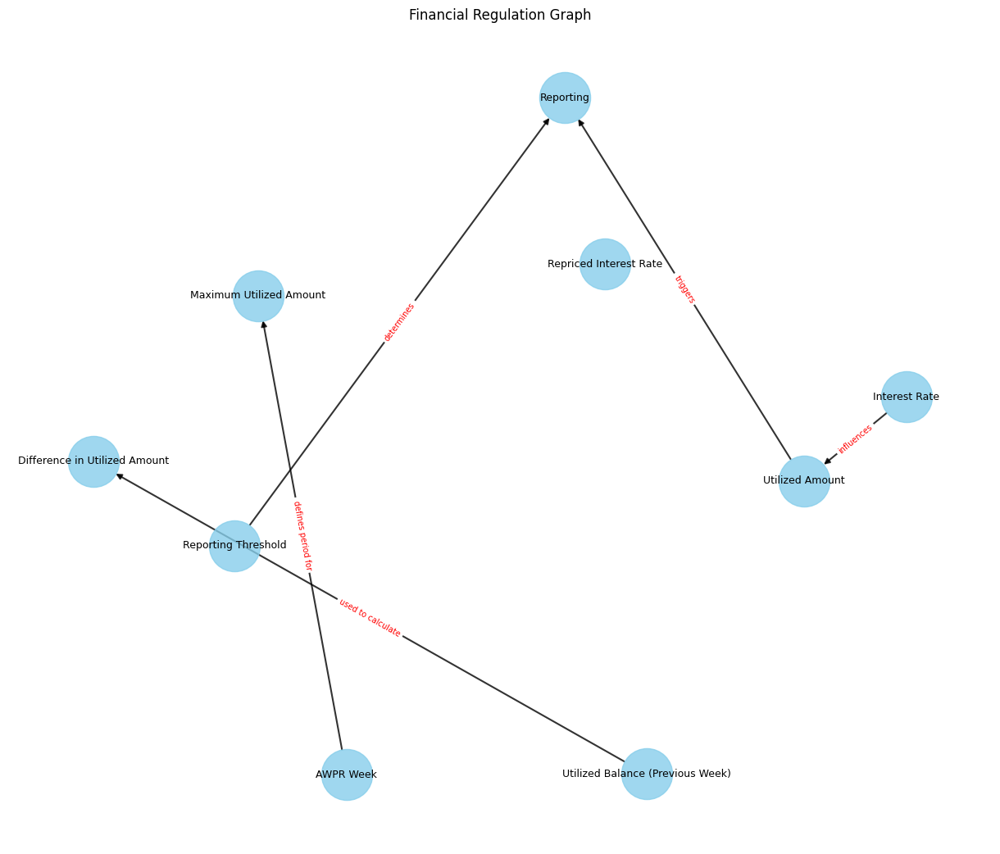

In [19]:
import networkx as nx
import json


def create_new_graph(filepath):
    with open(filepath,"r") as f:
            data = json.loads(f.read())

    # Create a directed graph
    G = nx.DiGraph()

    # Add nodes with attributes
    for entity in data['entities']:
        G.add_node(entity['id'], name=entity['name'], type=entity['type'])

    # Add edges with attributes
    for relationship in data['relationships']:
        G.add_edge(
            relationship['subject_id'],
            relationship['object_id'],
            verb=relationship['verb'],
            confidence_score=relationship['confidence_score']
        )

    # You can now work with the graph G
    # For example, print nodes and edges:
    print("Nodes:", G.nodes(data=True))
    print("Edges:", G.edges(data=True))

    import matplotlib.pyplot as plt
    pos = nx.spring_layout(G, k=0.9, iterations=20)
    labels = {node: G.nodes[node]['name'] for node in G.nodes()}
    edge_labels = {(u, v): d['verb'] for u, v, d in G.edges(data=True)}

    plt.figure(figsize=(12, 10))
    nx.draw(G, pos, with_labels=False, node_size=2000, node_color="skyblue", font_size=8, width=1.5, alpha=0.8)
    nx.draw_networkx_labels(G, pos, labels=labels, font_size=9)
    nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, font_color='red', font_size=7)
    plt.title("Financial Regulation Graph")
    plt.show()


filepath = "/Users/shirsama/dtcc-hackathon/dtcc-ai-hackathon-2025/chunk_8_prompt1.json"
create_new_graph(filepath)

Nodes: [('E1', {'name': 'Utilized Amount', 'type': 'concept'}), ('E2', {'name': 'Interest Rate', 'type': 'concept'}), ('E3', {'name': 'Repriced Interest Rate', 'type': 'concept'}), ('E4', {'name': 'AWPR Week', 'type': 'process'}), ('E5', {'name': 'Rs. 15 million', 'type': 'concept'}), ('E6', {'name': 'Rs. 1 million', 'type': 'concept'}), ('E7', {'name': 'Point ‘2', 'type': 'concept'}), ('E8', {'name': 'Maximum Utilized Amount', 'type': 'concept'}), ('E9', {'name': 'Utilized Balance (Previous Week)', 'type': 'concept'}), ('E10', {'name': 'Reporting Requirement', 'type': 'obligation'}), ('E11', {'name': 'Difference in Utilized Amount', 'type': 'concept'}), ('E12', {'name': 'Interest Rate Change', 'type': 'process'})]
Edges: [('E1', 'E5', {'verb': 'exceeds', 'confidence_score': 0.95}), ('E1', 'E10', {'verb': 'triggers', 'confidence_score': 0.92}), ('E2', 'E3', {'verb': 'changes to', 'confidence_score': 0.95}), ('E7', 'E6', {'verb': 'triggers use of', 'confidence_score': 0.95}), ('E8', 'E9

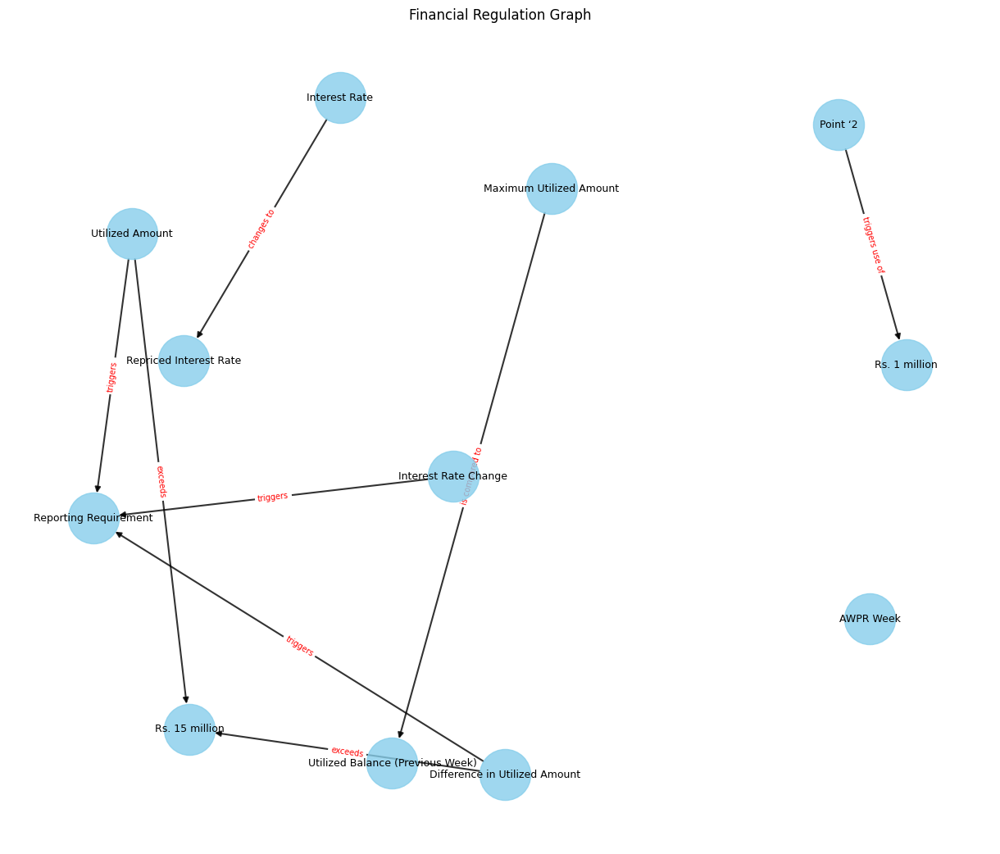

In [20]:
import networkx as nx
import json


def create_new_graph(filepath):
    with open(filepath,"r") as f:
            data = json.loads(f.read())

    # Create a directed graph
    G = nx.DiGraph()

    # Add nodes with attributes
    for entity in data['entities']:
        G.add_node(entity['id'], name=entity['name'], type=entity['type'])

    # Add edges with attributes
    for relationship in data['relationships']:
        G.add_edge(
            relationship['subject_id'],
            relationship['object_id'],
            verb=relationship['verb'],
            confidence_score=relationship['confidence_score']
        )

    # You can now work with the graph G
    # For example, print nodes and edges:
    print("Nodes:", G.nodes(data=True))
    print("Edges:", G.edges(data=True))

    import matplotlib.pyplot as plt
    pos = nx.spring_layout(G, k=0.9, iterations=20)
    labels = {node: G.nodes[node]['name'] for node in G.nodes()}
    edge_labels = {(u, v): d['verb'] for u, v, d in G.edges(data=True)}

    plt.figure(figsize=(12, 10))
    nx.draw(G, pos, with_labels=False, node_size=2000, node_color="skyblue", font_size=8, width=1.5, alpha=0.8)
    nx.draw_networkx_labels(G, pos, labels=labels, font_size=9)
    nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, font_color='red', font_size=7)
    plt.title("Financial Regulation Graph")
    plt.show()


filepath = "/Users/shirsama/dtcc-hackathon/dtcc-ai-hackathon-2025/chunk_8_modified_prompt1.json"
create_new_graph(filepath)


In [15]:
import networkx as nx
import json

def create_graph_from_json_data(json_string):
    data = json.loads(json_string)
    G = nx.DiGraph()
    for entity in data['entities']:
        G.add_node(entity['id'], name=entity['name'], type=entity['type'])
    for relationship in data['relationships']:
        G.add_edge(
            relationship['subject_id'],
            relationship['object_id'],
            verb=relationship['verb'],
            confidence_score=relationship['confidence_score']
        )
    return G

# Create the graphs
file = "/Users/shirsama/dtcc-hackathon/dtcc-ai-hackathon-2025/chunk_8_prompt1.json"
my_graph1  = create_new_graph(file)

file = "/Users/shirsama/dtcc-hackathon/dtcc-ai-hackathon-2025/chunk_8_modified_prompt1.json"
my_graph2  = create_new_graph(file)

def compare_nodes(graph1, graph2):
    if set(graph1.nodes()) != set(graph2.nodes()):
        print("Node sets are different.")
        print(f"Nodes only in G1: {set(graph1.nodes()) - set(graph2.nodes())}")
        print(f"Nodes only in G2: {set(graph2.nodes()) - set(graph1.nodes())}")
        return False
    for node in graph1.nodes():
        if graph1.nodes[node] != graph2.nodes[node]:
            print(f"Node '{node}' attributes are different:")
            print(f"  G1: {graph1.nodes[node]}")
            print(f"  G2: {graph2.nodes[node]}")
            return False
    print("Nodes and their attributes are identical.")
    return True

print("\nComparing G1 and G2 nodes:")
compare_nodes(my_graph1, my_graph2)


# 3. Compare Edges and their Attributes
def compare_edges(graph1, graph2):
    # Check if the set of edges (ignoring attributes for a moment) is the same
    # For DiGraphs, edges are (u, v) tuples. For MultiDiGraphs, they are (u, v, key)
    if set(graph1.edges()) != set(graph2.edges()):
        print("Edge sets are different (structure or count).")
        print(f"Edges only in G1: {set(graph1.edges()) - set(graph2.edges())}")
        print(f"Edges only in G2: {set(graph2.edges()) - set(graph1.edges())}")
        return False

    # If edge sets are structurally the same, compare attributes
    for u, v in graph1.edges():
        if graph1.edges[u, v] != graph2.edges[u, v]:
            print(f"Edge '({u}, {v})' attributes are different:")
            print(f"  G1: {graph1.edges[u,v]}")
            print(f"  G2: {graph2.edges[u,v]}")
            return False
    print("Edges and their attributes are identical.")
    return True

print("\nComparing G1 and G2 edges:")
compare_edges(my_graph1, my_graph2)


# 4. A comprehensive check for exact equality (nodes, edges, and all attributes)
def are_graphs_identical(graph1, graph2):
    nodes_identical = compare_nodes(graph1, graph2)
    edges_identical = compare_edges(graph1, graph2) # Call this after node check for clarity
    return nodes_identical and edges_identical

print("\nComprehensive check for G1 and G2:")
if are_graphs_identical(my_graph1, my_graph2):
    print("G1 and G2 are identical in nodes, edges, and attributes.")
else:
    print("G1 and G2 are NOT identical.")


Nodes: [('E1', {'name': 'Utilized Amount', 'type': 'concept'}), ('E2', {'name': 'Interest Rate', 'type': 'concept'}), ('E3', {'name': 'Repriced Interest Rate', 'type': 'concept'}), ('E4', {'name': 'AWPR Week', 'type': 'process'}), ('E5', {'name': 'Rs. 15 million', 'type': 'concept'}), ('E6', {'name': 'Rs. 1 million', 'type': 'concept'}), ('E7', {'name': 'Point ‘2', 'type': 'concept'}), ('E8', {'name': 'Maximum Utilized Amount', 'type': 'concept'}), ('E9', {'name': 'Utilized Balance (Previous Week)', 'type': 'concept'}), ('E10', {'name': 'Reporting Requirement', 'type': 'obligation'}), ('E11', {'name': 'Difference in Utilized Amount', 'type': 'concept'}), ('E12', {'name': 'Interest Rate Change', 'type': 'process'})]
Edges: [('E1', 'E5', {'verb': 'exceeds', 'confidence_score': 0.95}), ('E1', 'E10', {'verb': 'triggers', 'confidence_score': 0.92}), ('E2', 'E3', {'verb': 'changes to', 'confidence_score': 0.95}), ('E7', 'E6', {'verb': 'triggers use of', 'confidence_score': 0.95}), ('E8', 'E9

In [21]:
## Chunking code 

In [ ]:
import os

def get_random_chunks_from_file(filepath,min_chunk_length, max_chunk_length):
    if min_chunk_length > max_chunk_length:
        raise ValueError("min_chunk_length cannot be greater than max_chunk_length.")
    try:
        with open(filepath, 'r', encoding='utf-8') as f:
            text = f.read()
    except FileNotFoundError:
        return "Error: File not found."
    except Exception as e:
        return f"Error reading file: {e}"

    text_length = len(text)
    if text_length < min_chunk_length:
        return [text]
    
    chunks = []
    start_index = 0 
    end_index = len(text)
    max_chunk_end = max_chunk_length

    while start_index < end_index:

        if end_index > start_index + max_chunk_length:
            print(start_index,max_chunk_length)
            chunks.append(text[start_index:max_chunk_end])
            start_index = max_chunk_end
            max_chunk_end += max_chunk_length
            
        else:
            chunks.append(text[start_index:end_index])
            start_index = end_index
        
    return chunks

# def send_data_to_llm(chunk,number,filename):

#         print(f"--- Sending to Vertex AI (Placeholder) ---")
#         messages = []

#         template = get_prompt()
#         human_template = HumanMessagePromptTemplate.from_template(template)
#         messages.append(human_template)
#         chat_prompt = ChatPromptTemplate.from_messages(messages)
#         request = chat_prompt.format_prompt(section_name=str(number),
#                                             text_contents=chunk,
#                                             ).to_messages()
        
#         request_dicts = [{"role": msg.type, "content": msg.content} for msg in request]

#         print(f"request_dicts: {request_dicts}")

#         path = f"summary/{filename}"

#         from pathlib import Path
#         Path(path).mkdir(parents=True, exist_ok=True)

#         with open(f"{path}/chunk_{number}.txt",'w') as f:


#             llm = VertexAILangchainLLM({})
#             try:
#                 response = llm._call(prompt=str(request_dicts))
#                 f.write(response)
#                 return response

#             except Exception as e:
#                 print("Some error occered"+e)

def main():
    filepath = 'extracted_text_modified.txt'

    file_name = os.path.basename(filepath).split('.')[0]


    try:
        uniform_chunks = get_random_chunks_from_file(
            filepath, 
            min_chunk_length=100, 
            max_chunk_length=500,
        )

        if isinstance(uniform_chunks, str): 
            print(uniform_chunks)
        elif not uniform_chunks:
            print(f"Could not extract chunks from '{filepath}'. The file might be too short or empty.")
        else:
            for i, chunk in enumerate(uniform_chunks):
                number = i+1
                print(f"\n--- Uniform Chunk {number} (length: {len(chunk)}) ---")
                print(chunk)
                # send_data_to_llm(chunk,number,file_name)
    except ValueError as e:
        print(f"Error: {e}")
    print("\n--------------------------------------")

if __name__ == '__main__':
    main()

In [ ]:
{
  "nodes": [
    {
      "id": "InterestRate",
      "label": "Interest Rate",
      "description": "The rate at which interest is calculated on overdrafts and credit lines.",
      "theme": "Interest Calculation on Overdrafts and Credit Lines"
    },
    {
      "id": "RepricedAmount",
      "label": "Repriced Amount",
      "description": "The principal amount on which the interest is calculated after a rate change.",
      "theme": "Interest Calculation on Overdrafts and Credit Lines"
    },
    {
      "id": "Overdrafts",
      "label": "Overdrafts",
      "description": "A type of credit facility where the account balance goes below zero.",
      "theme": "Interest Calculation on Overdrafts and Credit Lines"
    },
    {
      "id": "PreAgreedCreditLines",
      "label": "Pre-agreed Credit Lines",
      "description": "Pre-approved loans with a set credit limit.",
      "theme": "Interest Calculation on Overdrafts and Credit Lines"
    },
    {
      "id": "MaximumUtilizedAmount",
      "label": "Maximum Utilized Amount",
      "description": "The highest amount borrowed within a given period (week, in this context).",
      "theme": "Interest Calculation on Overdrafts and Credit Lines"
    },
    {
      "id": "ThresholdAmount",
      "label": "Rs. 10 million (or Rs. 1 million)",
      "description": "Threshold amounts that trigger a specific calculation method.",
      "theme": "Interest Calculation on Overdrafts and Credit Lines"
    },
    {
      "id": "AppendixII",
      "label": "Appendix II",
      "description": "Contains an administrative example illustrating the calculation method.",
      "theme": "Supporting Documentation and Examples"
    }
  ],
  "edges": [
    {
      "source": "InterestRate",
      "target": "RepricedAmount",
      "label": "influences",
      "context": "Changes in the interest rate affect the repricing of the loan amount."
    },
    {
      "source": "InterestRate",
      "target": "Overdrafts",
      "label": "applied to",
      "context": "Interest is charged on the overdraft amount."
    },
    {
      "source": "InterestRate",
      "target": "PreAgreedCreditLines",
      "label": "applied to",
      "context": "Interest is charged on the utilized credit line amount."
    },
    {
      "source": "MaximumUtilizedAmount",
      "target": "ThresholdAmount",
      "label": "used for calculation when exceeding",
      "context": "If the maximum utilized amount is above the threshold, a specific calculation method is triggered."
    },
    {
      "source": "AppendixII",
      "target": "Overdrafts",
      "label": "provides example for",
      "context": "The appendix clarifies the calculation method with an example."
    },
    {
      "source": "AppendixII",
      "target": "PreAgreedCreditLines",
      "label": "provides example for",
      "context": "The appendix clarifies the calculation method with an example."
    }
  ]
}


In [53]:
import os
import requests

from google.oauth2 import service_account
from google.auth.transport.requests import Request
from langchain_core.callbacks import CallbackManagerForLLMRun
from typing import Any, Optional, ClassVar
from langchain_core.language_models.llms import LLM


# Set proxy environment variables for DB network
os.environ['HTTP_PROXY'] = 'http://sp-surf-proxy.intranet.db.com:8080'
os.environ['HTTPS_PROXY'] = 'http://sp-surf-proxy.intranet.db.com:8080'


class VertexAILangchainLLM(LLM):
    """
    LangChain LLM class for interacting with Vertex AI using direct HTTP requests.
    """
    project_id: ClassVar[str] = "db-dev-ny3a-flare-dev-1"
    location:ClassVar[str] = "europe-west3"
    model_name:ClassVar[str] = "gemini-1.5-pro-002"
    credentials_path:ClassVar[str] = 'keyfile_new.json'
    if os.getenv('HTTP_PROXY'):
        proxies = {
            'http': os.getenv('HTTP_PROXY'),
            'https': os.getenv('HTTPS_PROXY')
        }   
    else:
        proxies = {}

    temperature: int = 0
    credentials: str = ""

    def __init__(self, model_params: dict):
        """
        Initialize the VertexAILangchainLLM.

        Args:
            model_params: A dictionary containing model parameters.
                - location: The location of the Vertex AI endpoint.
                - model_name: The name of the model to use.
                - temperature: The temperature for text generation.
                - credentials_path: Optional path to service account key file.
        """
        super().__init__()
        if 'temperature' not in model_params:
            model_params['temperature'] = 0.5
        else:
            self.temperature = model_params['temperature']

        # if 'location' not in model_params:
        #     raise ValueError("location must be provided in model_params")

        # if 'model_name' not in model_params:
        #     raise ValueError("model_name must be provided in model_params")
        

        self.authenticate()

    @property
    def _llm_type(self) -> str:
        return "custom"

    def authenticate(self):
        """
        Authenticate with Vertex AI using service account credentials.

        Args:
            project_id: The GCP project ID
            credentials_path: Optional path to service account key file
        """

        if self.credentials_path:
            os.environ['GOOGLE_APPLICATION_CREDENTIALS'] = self.credentials_path

        if not os.getenv('GOOGLE_APPLICATION_CREDENTIALS'):
            raise ValueError("GOOGLE_APPLICATION_CREDENTIALS not set")

        self.credentials = service_account.Credentials.from_service_account_file(
            os.getenv('GOOGLE_APPLICATION_CREDENTIALS'),
            scopes=['https://www.googleapis.com/auth/cloud-platform']
        )

    def _call(self,
              prompt: str,
              run_manager: Optional[CallbackManagerForLLMRun] = None,
              **kwargs: Any
              ) -> str:
        try:
            if not self.credentials.valid:
                self.credentials.refresh(Request())

            url = f"https://{self.location}-aiplatform.googleapis.com/v1/projects/{self.project_id}/locations/{self.location}/publishers/google/models/{self.model_name}:generateContent"

            headers = {
                "Authorization": f"Bearer {self.credentials.token}",
                "Content-Type": "application/json",
                "x-goog-request-params": "vpc-sc-bypass=true",
                "x-goog-user-project": self.project_id,
                "x-goog-vpc-service-controls": "true"
            }

            data = {
                "contents": [{
                    "role": "user",
                    "parts": [{
                        "text": prompt
                    }]
                }],
                "generationConfig": {
                    "temperature": self.temperature
                }
            }

            response = requests.post(url, headers=headers, json=data) #proxies=self.proxies)
            if response.status_code == 200:
                response_json = response.json()
                if 'candidates' in response_json and len(response_json['candidates']) > 0:
                    text = response_json['candidates'][0]['content']['parts'][0]['text']
                    return text
                raise Exception("No text found in response")
            else:
                error_message = response.text
                print(f"Full error: {error_message}")
                if "VPC_SERVICE_CONTROLS" in error_message:
                    raise Exception("Please ensure you're connected to DB VPN")
                elif "PERMISSION_DENIED" in error_message:
                    raise Exception("Check service account permissions")
                else:
                    raise Exception(f"API Error: {error_message}")

        except requests.exceptions.RequestException as e:
            print(f"Error making API request: {str(e)}")
            raise
        except Exception as e:
            print(f"Error generating response: {str(e)}")
            raise

In [56]:
def get_prompt():
    prompt = """
                You are an AI assistant tasked with analyzing the differences between two network graphs, G1 and G2. Based on the following raw difference data, please generate a concise and human-readable summary these changes.

                graph differences
                -----------------
                {graph_difference}

                The report should clearly distinguish between:
                1.  Nodes and edges present only in G1.
                2.  Nodes and edges present only in G2.
                3.  Nodes that are common to both graphs but have differing attributes.
                4.  Edges that are common to both graphs but have differing attributes.

                

             """
    
    return prompt

Nodes: [('n1', {'label': 'Average Weighted Prime Lending Rate (AWPR)', 'description': 'key economic indicator'}), ('n2', {'label': 'Central Bank of Sri Lanka', 'description': 'regulatory authority'}), ('n3', {'label': 'Licensed Commercial Banks (LCBs)', 'description': 'banks providing loans'}), ('n4', {'label': 'Prime Lending Rate', 'description': 'rate for creditworthy customers'}), ('n5', {'label': 'Revised AWPR Guidelines', 'description': 'updated reporting procedures'}), ('n6', {'label': 'Weekly Publication', 'description': 'AWPR publication frequency'}), ('n7', {'label': 'Submission of AWPR', 'description': 'process for submitting data'}), ('n8', {'label': 'Domestic Rupee Operations', 'description': 'transactions in Indian Rupees'}), ('n9', {'label': 'Private Sector Customers', 'description': 'non-government customers'}), ('n10', {'label': 'Government and Government Corporations and Departments', 'description': 'public sector entities'}), ('n11', {'label': 'Subsidized Lending', 'd

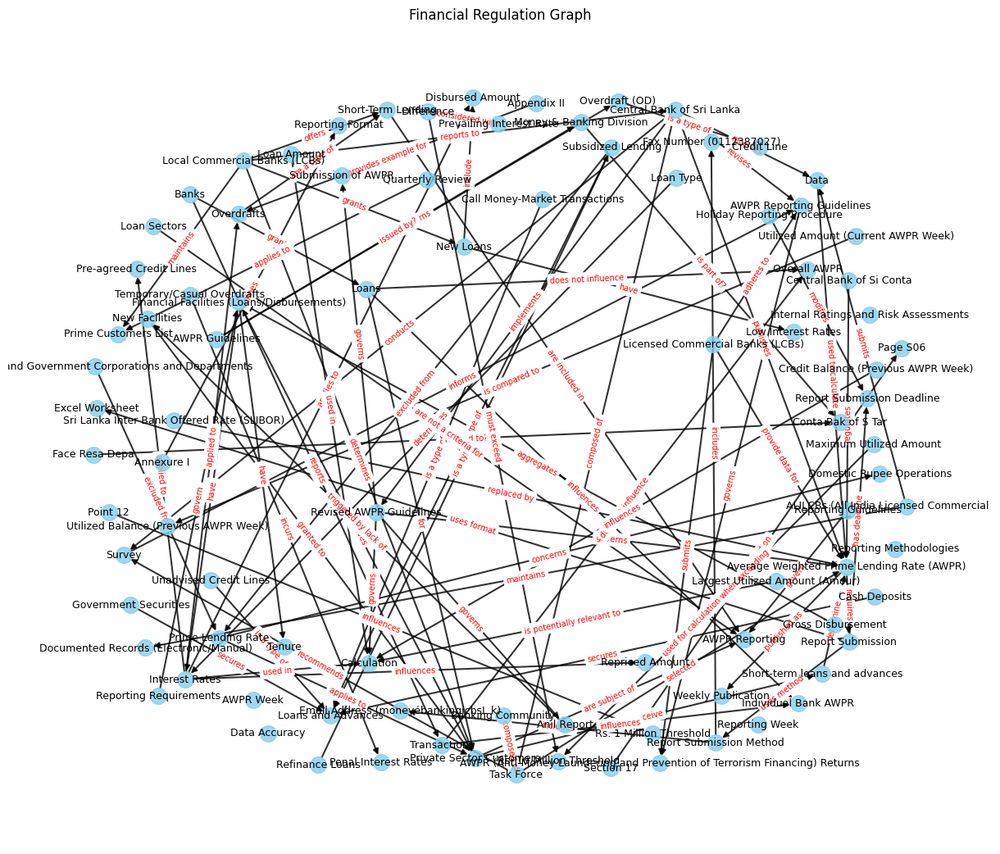

Looking in indexes: https://artifactory.intranet.db.com/artifactory/api/pypi/pypi-all/simple
  Using cached python_louvain-0.16-py3-none-any.whl
Attempting to plot graph in batches based on communities...
Using the undirected version of the graph for community detection.
Detected 19 communities. Plotting each as a batch.


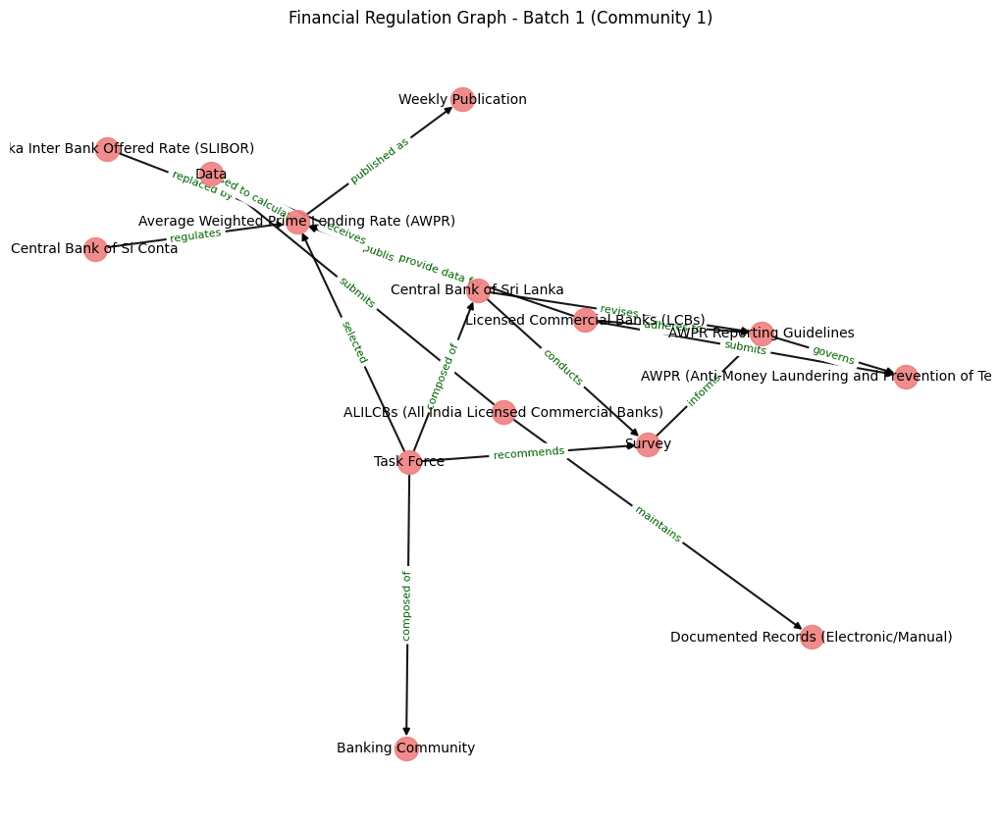

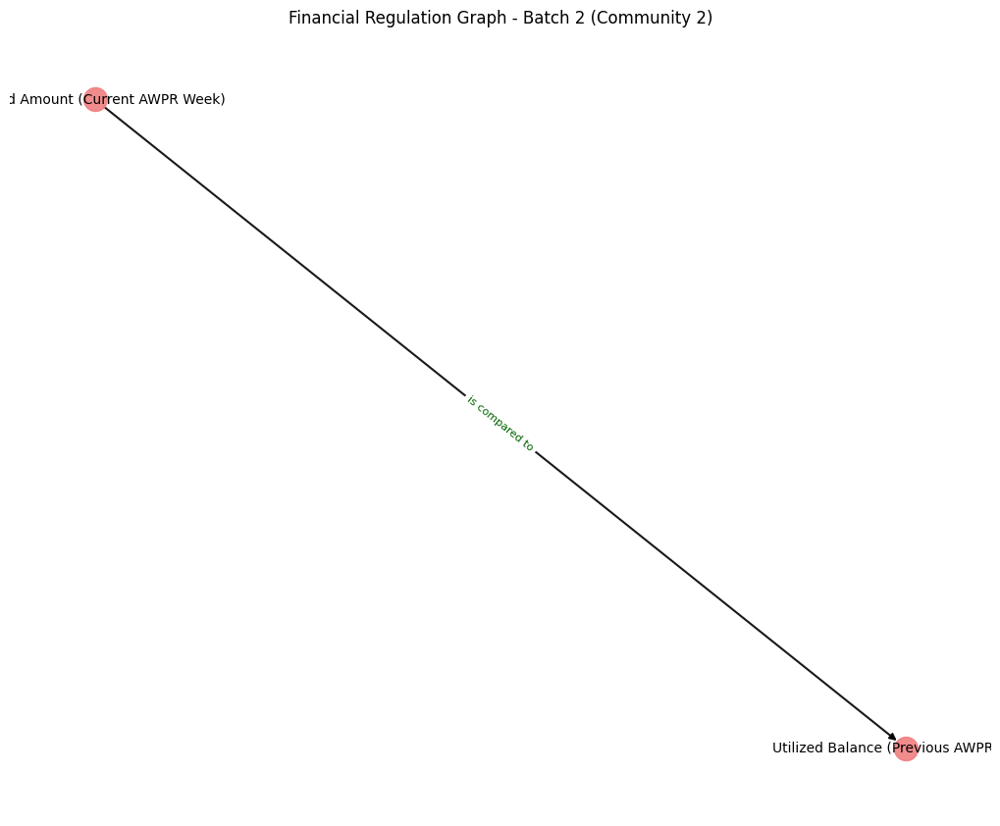

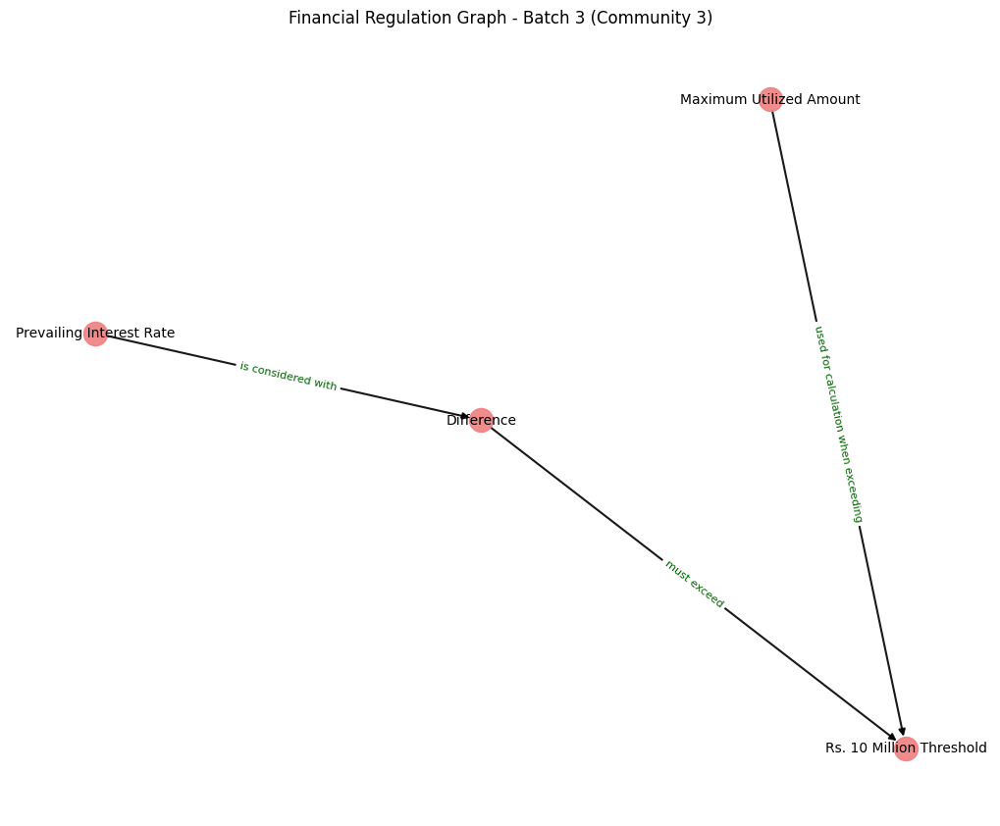

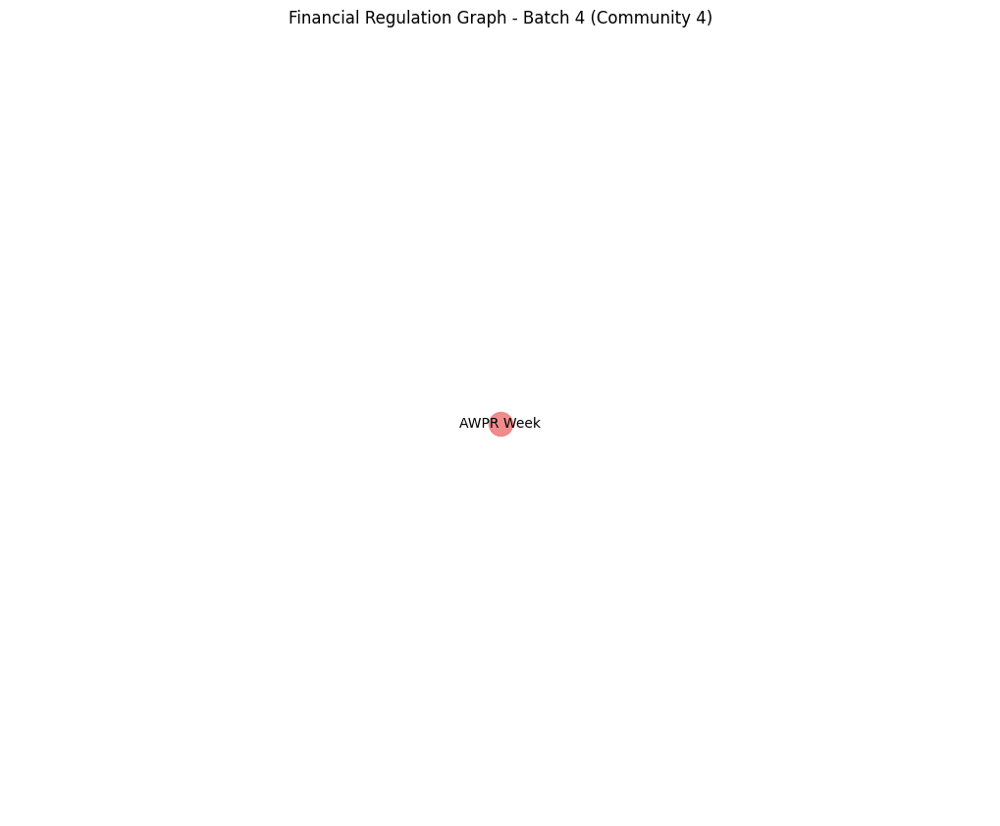

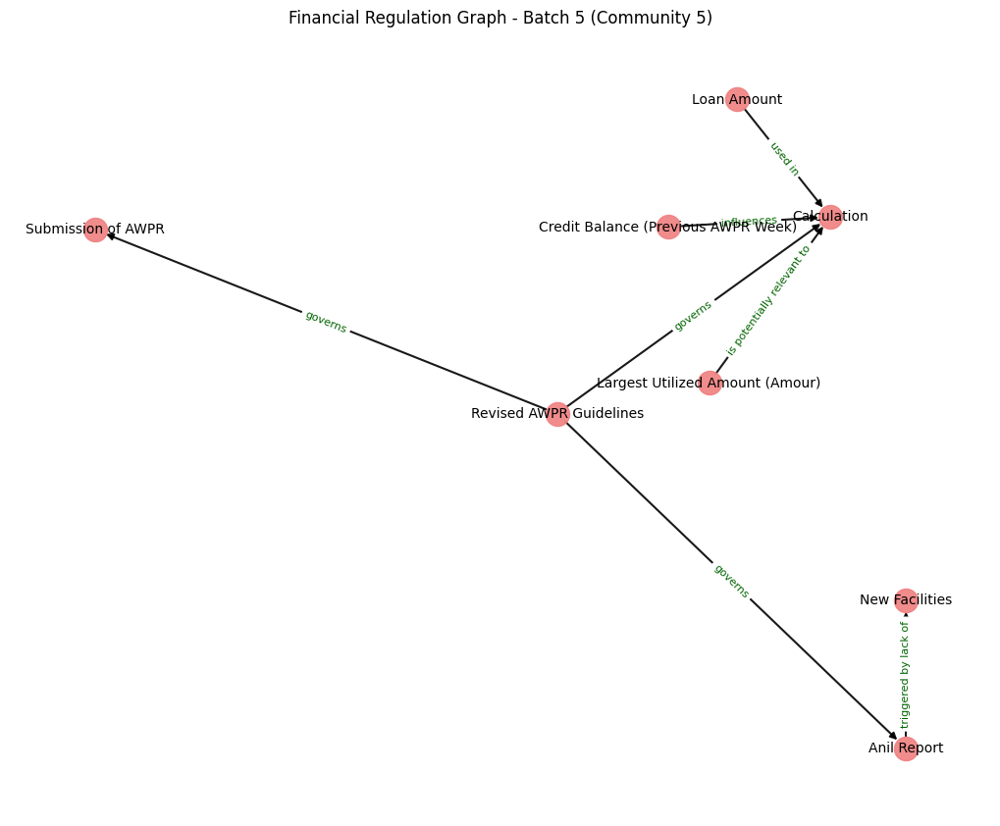

...

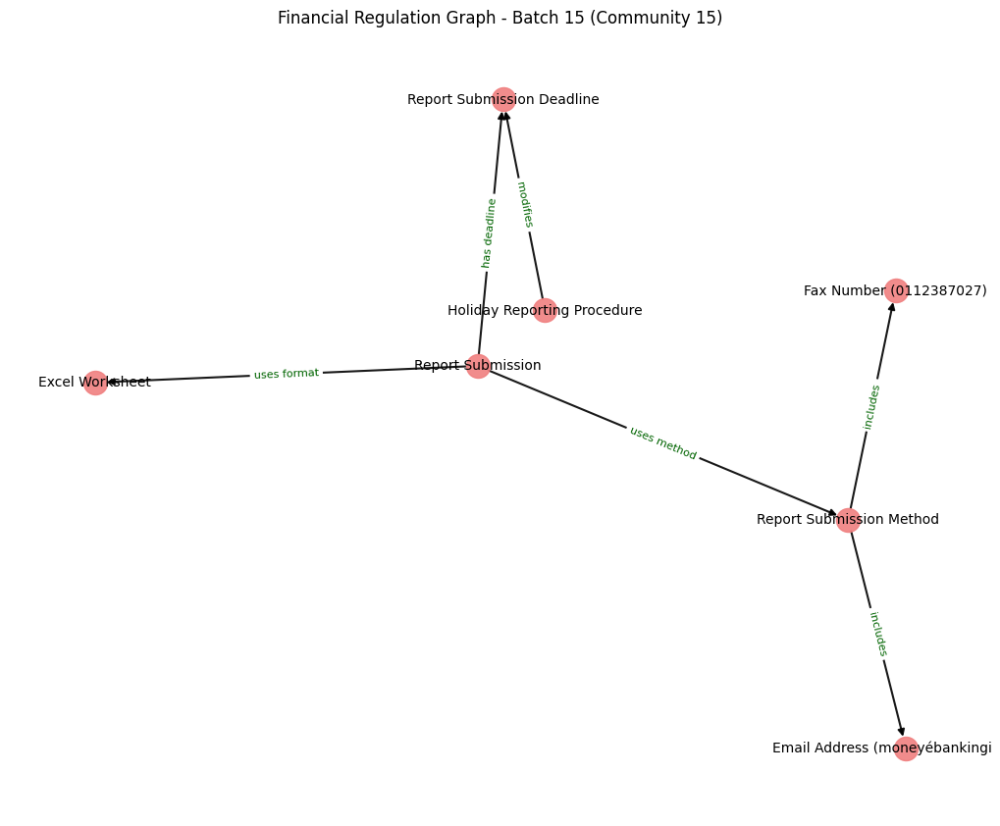

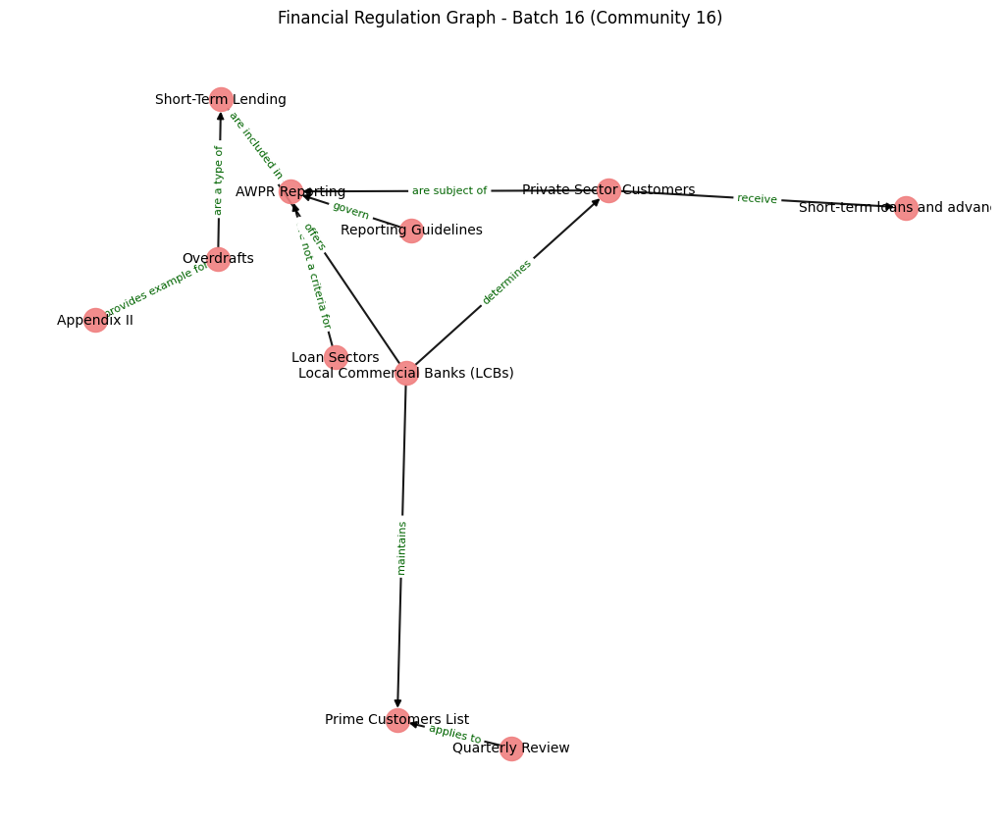

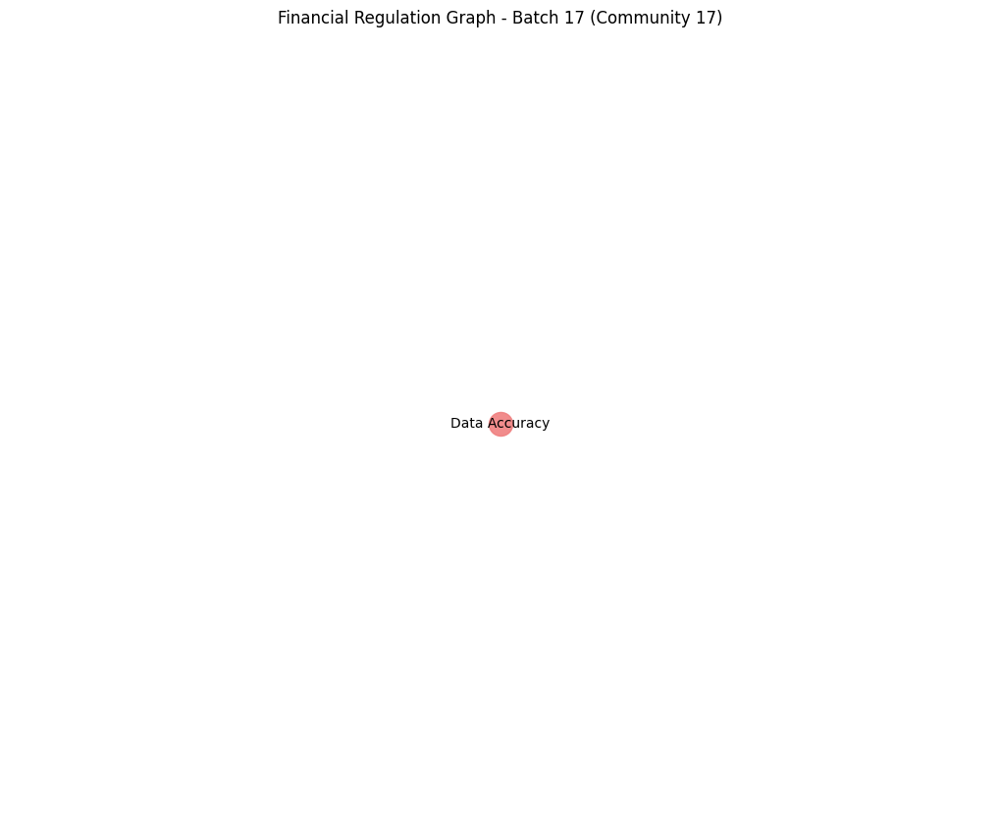

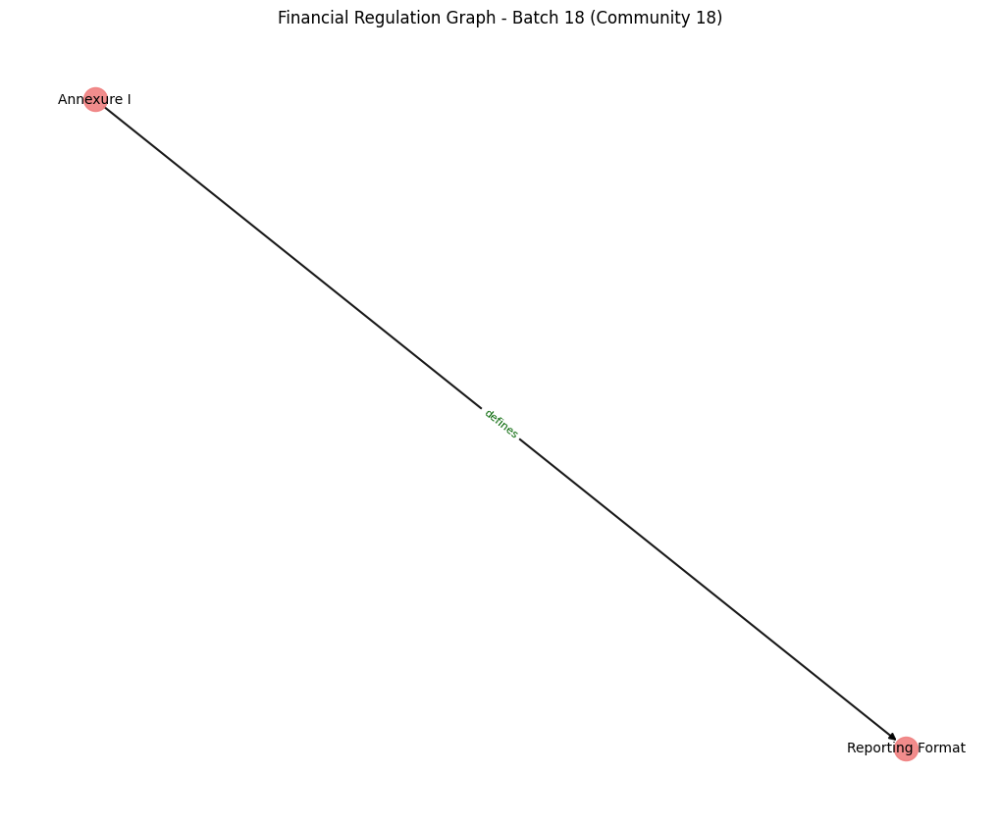

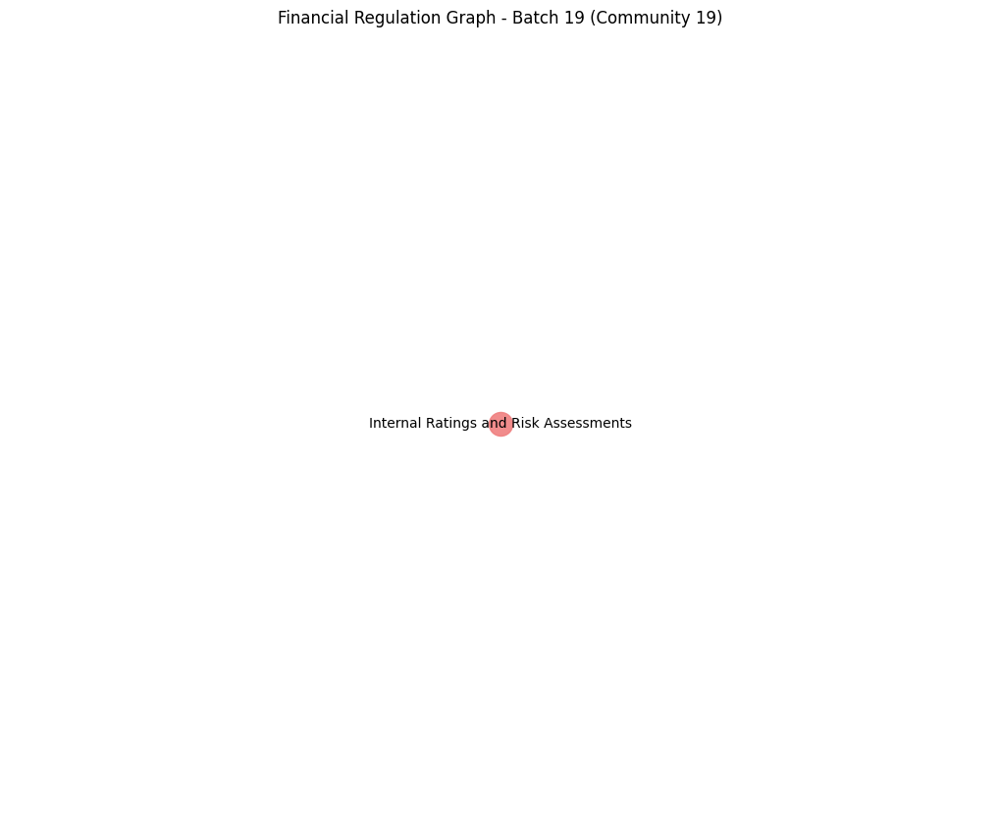

In [130]:
import networkx as nx
import json
import PyPDF2
import re
import json 
from langchain.prompts.chat import ChatPromptTemplate
from langchain.prompts.chat import HumanMessagePromptTemplate


def create_diff_report(graph_difference):
    print(f"--- Sending to Vertex AI (Placeholder) ---")
    messages = []

    template = get_prompt()
    human_template = HumanMessagePromptTemplate.from_template(template)
    messages.append(human_template)
    chat_prompt = ChatPromptTemplate.from_messages(messages)
    request = chat_prompt.format_prompt(graph_difference= graph_difference, 
                                        ).to_messages()
    
    request_dicts = [{"role": msg.type, "content": msg.content} for msg in request]

    print(f"request_dicts: {request_dicts}")

    llm = VertexAILangchainLLM({})
    try:
        response = llm._call(prompt=str(request_dicts))
        print(response)

    except Exception as e:
        print("Some error occered"+e)

def create_graph_from_json_new(json_data):
    """
    Creates a NetworkX MultiDiGraph from a JSON object.

    The JSON object should have 'nodes' and 'edges'.
    Nodes should have 'id', 'label', 'description', 
    Edges should have 'source', 'target', 'label' (used as edge key), and 'details'.
    """
    if isinstance(json_data, str):
        data = json.loads(json_data)
    else:
        data = json_data # Assuming it's already a Python dict

    graph = nx.MultiDiGraph()

    # Add nodes
    for node_info in data.get('nodes', []):
        node_id = node_info.get('id')
        if node_id:
            attributes = {
                'label': node_info.get('label'),
                'description': node_info.get('description'),
          }
            # Filter out None attributes to keep node data clean
            graph.add_node(node_id, **{k: v for k, v in attributes.items() if v is not None})

    # Add edges
    for edge_info in data.get('edges', []):
        source_id = edge_info.get('source')
        target_id = edge_info.get('target')
        edge_key = edge_info.get('label') # This is the relationship type
        context = edge_info.get('details')

        if source_id and target_id and edge_key:
            # Ensure nodes exist before adding edge, or handle as per requirement
            # For simplicity, we assume nodes are defined or NetworkX will create them.
            # However, it's better if nodes are explicitly added first with their attributes.
            if not graph.has_node(source_id):
                graph.add_node(source_id, label=source_id) # Add with default label if not defined
            if not graph.has_node(target_id):
                graph.add_node(target_id, label=target_id)

            attributes = {'context': context}
            # Store the original JSON label as an attribute if needed,
            # as 'key' is a special concept in MultiDiGraph
            attributes['relationship_type'] = edge_key
            graph.add_edge(source_id, target_id, key=edge_key, **attributes)
            
    return graph

def compare_graphs(g1, g2):
    """
    Compares two NetworkX MultiDiGraphs and reports differences.
    """
    diff_report = {
        "nodes_only_in_g1": list(set(g1.nodes) - set(g2.nodes)),
        "nodes_only_in_g2": list(set(g2.nodes) - set(g1.nodes)),
        "nodes_attributes_diff": [],
        "edges_only_in_g1": [],
        "edges_only_in_g2": [],
        "edges_attributes_diff": []
    }

    # Common nodes attribute comparison
    common_nodes = set(g1.nodes) & set(g2.nodes)
    for node in common_nodes:
        attrs1 = g1.nodes[node]
        attrs2 = g2.nodes[node]
        attr_diff = {}
        all_keys = set(attrs1.keys()) | set(attrs2.keys())
        for key in all_keys:
            val1 = attrs1.get(key)
            val2 = attrs2.get(key)
            if val1 != val2:
                attr_diff[key] = {"g1_value": val1, "g2_value": val2}
        if attr_diff:
            diff_report["nodes_attributes_diff"].append({
                "node": node,
                "differences": attr_diff
            })

    # Edge comparison
    # Represent edges as (u, v, key, frozenset_of_attributes) for easy comparison
    def get_edge_representation(graph):
        edge_set = set()
        for u, v, k, data in graph.edges(keys=True, data=True):
            # Sort items in data for consistent frozenset
            frozen_attrs = frozenset(sorted(data.items()))
            edge_set.add((u, v, k, frozen_attrs))
        return edge_set
    
    def get_edge_details(graph, u, v, k):
        return graph.get_edge_data(u,v,k)

    edges_repr1 = {} # (u,v,k) -> data
    for u, v, k, data in g1.edges(keys=True, data=True):
        edges_repr1[(u,v,k)] = data
        
    edges_repr2 = {} # (u,v,k) -> data
    for u, v, k, data in g2.edges(keys=True, data=True):
        edges_repr2[(u,v,k)] = data

    all_edge_keys = set(edges_repr1.keys()) | set(edges_repr2.keys())

    for u, v, k in all_edge_keys:
        data1 = edges_repr1.get((u,v,k))
        data2 = edges_repr2.get((u,v,k))

        if data1 is not None and data2 is None:
            diff_report["edges_only_in_g1"].append({"edge": (u,v,k), "attributes": data1})
        elif data1 is None and data2 is not None:
            diff_report["edges_only_in_g2"].append({"edge": (u,v,k), "attributes": data2})
        elif data1 != data2: # Both exist but attributes differ
            attr_diff = {}
            all_attr_keys = set(data1.keys()) | set(data2.keys())
            for attr_key in all_attr_keys:
                val1 = data1.get(attr_key)
                val2 = data2.get(attr_key)
                if val1 != val2:
                    attr_diff[attr_key] = {"g1_value": val1, "g2_value": val2}
            if attr_diff: # Should always be true if data1 != data2
                 diff_report["edges_attributes_diff"].append({
                    "edge": (u,v,k),
                    "differences": attr_diff
                })
                
    return diff_report

# --- Example Usage ---
# Your JSON data from the previous turn

file = "/Users/shirsama/dtcc-hackathon/dtcc-ai-hackathon-2025/graph_json/combined_extracted_text.json"
with open(file,'r') as f:
    graph1_data = json.loads(f.read())
g1 = create_graph_from_json(graph1_data)

# file = "/Users/shirsama/dtcc-hackathon/dtcc-ai-hackathon-2025/chunk_8_modified.json"
# with open(file,'r') as f:
#     graph2_data = json.loads(f.read())
# g2 = create_graph_from_json(graph2_data)


# differences = compare_graphs(g1, g2)

# report_parts = ["\n--- Graph Differences ---"]

# if differences.get("nodes_only_in_g1"):
#     report_parts.append(f"\nNodes only in G1: {differences['nodes_only_in_g1']}")
# if differences.get("nodes_only_in_g2"):
#     report_parts.append(f"Nodes only in G2: {differences['nodes_only_in_g2']}")

# if differences.get("nodes_attributes_diff"):
#     report_parts.append("\nNodes with attribute differences:")
#     for diff in differences["nodes_attributes_diff"]:
#         report_parts.append(f"  Node '{diff['node']}': {diff['differences']}")

# if differences.get("edges_only_in_g1"):
#     report_parts.append("\nEdges only in G1:")
#     for diff in differences["edges_only_in_g1"]:
#         report_parts.append(f"  Edge {diff['edge']} with attributes: {diff['attributes']}")

# if differences.get("edges_only_in_g2"):
#     report_parts.append("\nEdges only in G2:")
#     for diff in differences["edges_only_in_g2"]:
#         report_parts.append(f"  Edge {diff['edge']} with attributes: {diff['attributes']}")

# if differences.get("edges_attributes_diff"):
#     report_parts.append("\nEdges with attribute differences:")
#     for diff in differences["edges_attributes_diff"]:
#         report_parts.append(f"  Edge {diff['edge']}: {diff['differences']}")

# diff = "\n".join(report_parts)


# create_diff_report(diff)


print("Nodes:", g1.nodes(data=True))
print("Edges:", g1.edges(data=True))

# import matplotlib.pyplot as plt
# pos = nx.spring_layout(g1, k=0.9, iterations=20)
# labels = {node: g1.nodes[node]['label'] for node in g1.nodes()}
# edge_labels = {(u, v): d['relationship_type'] for u, v, d in g1.edges(data=True)}

# plt.figure(figsize=(12, 10))
# nx.draw(g1, pos, with_labels=False, node_size=200, node_color="skyblue", font_size=8, width=1.5, alpha=0.8)
# nx.draw_networkx_labels(g1, pos, labels=labels, font_size=9)
# nx.draw_networkx_edge_labels(g1, pos, edge_labels=edge_labels, font_color='red', font_size=7)
# plt.title("Financial Regulation Graph")
# plt.show()

import matplotlib.pyplot as plt
import networkx as nx

# Ensure g1 is your graph object, loaded with nodes and edges.
# Example:
# g1 = nx.karate_club_graph() # Replace with your actual graph
# # Ensure your nodes have 'label' attributes and edges have 'relationship_type'
# for i, node in enumerate(g1.nodes()):
#     g1.nodes[node]['label'] = g1.nodes[node].get('club', f'Node {i}') # Example: using 'club' or default
# for u, v in g1.edges():
#     g1.edges[u,v]['relationship_type'] = 'connects'


# Attempt to use community detection for batching
try:
    !pip install python-louvain
    import community as community_louvain
    print("Attempting to plot graph in batches based on communities...")

    # For Louvain algorithm, it's common to use an undirected version of the graph
    if g1.is_directed():
        graph_for_communities = g1.to_undirected()
        print("Using the undirected version of the graph for community detection.")
    else:
        graph_for_communities = g1

    partition = community_louvain.best_partition(graph_for_communities)
    num_communities = len(set(partition.values()))

    if num_communities > 0 and num_communities < g1.number_of_nodes():
        print(f"Detected {num_communities} communities. Plotting each as a batch.")
        
        # Group nodes by community
        communities_nodes = [[] for _ in range(num_communities)]
        for node, comm_id in partition.items():
            communities_nodes[comm_id].append(node)

        for i, nodes_in_comm in enumerate(communities_nodes):
            if not nodes_in_comm:
                continue
            
            subgraph = g1.subgraph(nodes_in_comm)
            if subgraph.number_of_nodes() == 0:
                continue

            plt.figure(figsize=(10, 8)) # Adjust size as needed for subgraphs
            
            # Layout for the subgraph (k and iterations might need tuning)
            # Using k=0.5 as a starting point for subgraphs, adjust as needed.
            # Iterations increased for potentially better layout in subgraphs.
            pos_subgraph = nx.spring_layout(subgraph, k=0.5, iterations=50, seed=42)

            labels_subgraph = {node: subgraph.nodes[node].get('label', str(node)) for node in subgraph.nodes()}
            edge_labels_subgraph = {(u, v): d.get('relationship_type', '') for u, v, d in subgraph.edges(data=True)}

            nx.draw(subgraph, pos_subgraph, with_labels=False, node_size=300, node_color="lightcoral", font_size=10, width=1.5, alpha=0.9)
            nx.draw_networkx_labels(subgraph, pos_subgraph, labels=labels_subgraph, font_size=10)
            nx.draw_networkx_edge_labels(subgraph, pos_subgraph, edge_labels=edge_labels_subgraph, font_color='darkgreen', font_size=8)
            
            plt.title(f"Financial Regulation Graph - Batch {i+1} (Community {i+1})")
            plt.show()
    else:
        print("Community detection did not result in multiple batches, or graph is too small. Plotting the full graph.")
        raise RuntimeError("Not enough distinct communities found for batch plotting.")

except (ImportError, RuntimeError) as e:
    if isinstance(e, ImportError):
        print("`python-louvain` library not found. Please install it (`pip install python-louvain`) for community-based batching.")
    print("Falling back to plotting the full graph.")

    # Your original plotting code as a fallback
    pos = nx.spring_layout(g1, k=0.9, iterations=20, seed=42) # Added seed for reproducibility
    labels = {node: g1.nodes[node].get('label', str(node)) for node in g1.nodes()}
    edge_labels = {(u, v): d.get('relationship_type', '') for u, v, d in g1.edges(data=True)}

    plt.figure(figsize=(12, 10))
    nx.draw(g1, pos, with_labels=False, node_size=200, node_color="skyblue", font_size=8, width=1.5, alpha=0.8)
    nx.draw_networkx_labels(g1, pos, labels=labels, font_size=9)
    nx.draw_networkx_edge_labels(g1, pos, edge_labels=edge_labels, font_color='red', font_size=7)
    plt.title("Financial Regulation Graph (Full)")
    plt.show()



# print("Nodes:", g2.nodes(data=True))
# print("Edges:", g2.edges(data=True))

# import matplotlib.pyplot as plt
# pos = nx.spring_layout(g2, k=0.9, iterations=20)
# labels = {node: g2.nodes[node]['label'] for node in g2.nodes()}
# edge_labels = {(u, v): d['relationship_type'] for u, v, d in g2.edges(data=True)}

# plt.figure(figsize=(12, 10))
# nx.draw(g2, pos, with_labels=False, node_size=2000, node_color="skyblue", font_size=8, width=1.5, alpha=0.8)
# nx.draw_networkx_labels(g2, pos, labels=labels, font_size=9)
# nx.draw_networkx_edge_labels(g2, pos, edge_labels=edge_labels, font_color='red', font_size=7)
# plt.title("Financial Regulation Graph")
# plt.show()

In [33]:
"""
This module is designed to call LLM GCP
"""

import vertexai
from google.oauth2 import service_account
from langchain_google_vertexai import HarmBlockThreshold, HarmCategory, VertexAI


class VertexAiEndpoint:  # pylint: disable=too-few-public-methods
    """
    This class is designed to call GCP endpoint
    """

    def __init__(self):
        self.project_id = "db-dev-ny3a-flare-dev-1"
        self.location = "europe-west3"
        self.model_name = "gemini-1.5-pro-002"
        self._credentials = service_account.Credentials.from_service_account_file(
            'keyfile_new.json'
        )

    @property
    def _llm_type(self) -> str:
        return "custom"

    def create_llm(self, model_params) -> VertexAI:
        """
        Create a VertexAI object based on user specifications
        """
        vertexai.init(
            project=self.project_id,
            location=self.location,
            credentials=self._credentials,
        )
        if "temperature" not in model_params:
            model_params["temperature"] = 0

        safety_settings = {
            HarmCategory.HARM_CATEGORY_UNSPECIFIED: HarmBlockThreshold.BLOCK_MEDIUM_AND_ABOVE,
            HarmCategory.HARM_CATEGORY_DANGEROUS_CONTENT: HarmBlockThreshold.BLOCK_MEDIUM_AND_ABOVE,
            HarmCategory.HARM_CATEGORY_HATE_SPEECH: HarmBlockThreshold.BLOCK_MEDIUM_AND_ABOVE,
            HarmCategory.HARM_CATEGORY_HARASSMENT: HarmBlockThreshold.BLOCK_MEDIUM_AND_ABOVE,
            HarmCategory.HARM_CATEGORY_SEXUALLY_EXPLICIT: HarmBlockThreshold.BLOCK_MEDIUM_AND_ABOVE,
        }

        return VertexAI(
            project=self.project_id,
            location=self.location,
            credentials=self._credentials,
            model_name=self.model_name,
            temperature=model_params["temperature"],
            safety_settings=safety_settings,
        )
 

In [51]:
# Assume llm, graph1, and graph2 are already defined
# For example:
# from langchain_community.graphs import Neo4jGraph
# graph1 = Neo4jGraph(url="bolt://localhost:7687", username="neo4j", password="password1", database="db1")
# graph2 = Neo4jGraph(url="bolt://localhost:7687", username="neo4j", password="password2", database="db2")
# from langchain_openai import ChatOpenAI
# llm = ChatOpenAI(temperature=0)


import networkx as nx
from langchain_google_vertexai import VertexAI
from google.oauth2 import service_account
from langchain.chains.graph_qa.base import GraphQAChain
import json



file = "/Users/shirsama/dtcc-hackathon/dtcc-ai-hackathon-2025/chunk_8.json"
with open(file,'r') as f:
    graph1_data = json.loads(f.read())
graph1 = create_graph_from_json_new(graph1_data)

file = "/Users/shirsama/dtcc-hackathon/dtcc-ai-hackathon-2025/chunk_8_modified.json"
with open(file,'r') as f:
    graph2_data = json.loads(f.read())
graph2 = create_graph_from_json_new(graph2_data)


chain1 = None
chain2 = None

llm = VertexAiEndpoint()

try:
    chain1 = GraphQAChain.from_llm(
        llm=llm,
        graph=graph1, # Use the first graph
        verbose=True, # Set to False if intermediate outputs are too noisy
    )
    print("GraphQAChain for graph1 created successfully!")
except Exception as e:
    print(f"Error creating GraphQAChain for graph1: {e}")
    # Consider how to handle this error, e.g., exit or skip comparison

try:
    chain2 = GraphQAChain.from_llm(
        llm=llm,
        graph=graph2, # Use the second graph
        verbose=True, # Set to False if intermediate outputs are too noisy
    )
    print("GraphQAChain for graph2 created successfully!")
except Exception as e:
    print(f"Error creating GraphQAChain for graph2: {e}")
    # Consider how to handle this error

if chain1 and chain2:
    try:
        # Define a query to extract relevant information from each graph
        # This query should be designed to get comparable information
        # For example, to get a general overview:
        query = "Describe the main types of nodes and relationships in this graph and their counts."
        # Or, for more specific comparisons:
        # query = "List all nodes with label 'User' and their properties."

        print(f"\nQuerying graph1: {query}")
        response1_raw = chain1.invoke({"query": query}) # Or chain1.run(query)
        response1 = response1_raw.get("result", str(response1_raw)) # Adapt based on actual response structure
        print(f"Response from graph1:\n{response1}")

        print(f"\nQuerying graph2: {query}")
        response2_raw = chain2.invoke({"query": query}) # Or chain2.run(query)
        response2 = response2_raw.get("result", str(response2_raw)) # Adapt based on actual response structure
        print(f"Response from graph2:\n{response2}")

        # Now, use the LLM to compare the two responses
        comparison_prompt_template = """
        You are an expert graph analyst. Based on the information provided below from two different graphs,
        identify and summarize the key differences between them.

        Information from Graph 1:
        ---
        {graph1_info}
        ---

        Information from Graph 2:
        ---
        {graph2_info}
        ---

        What are the main differences between Graph 1 and Graph 2 regarding their node types, relationship types, counts, or any other salient features mentioned?
        Be specific and clear.
        """
        
        comparison_prompt = comparison_prompt_template.format(graph1_info=response1, graph2_info=response2)

        print("\nComparing responses using LLM...")
        # Assuming your llm object can be invoked directly for chat/completion
        # This might be llm.invoke(comparison_prompt) or llm(comparison_prompt)
        # depending on the LLM library (e.g., LangChain)
        comparison_result = llm.invoke(comparison_prompt) 
        # If llm.invoke returns a complex object, extract the content:
        # e.g., comparison_output = comparison_result.content if hasattr(comparison_result, 'content') else str(comparison_result)
        
        print("\n--- Comparison Result ---")
        # Adjust access to content based on your LLM object's response structure
        if hasattr(comparison_result, 'content'):
            print(comparison_result.content)
        else:
            print(comparison_result)
        print("--- End of Comparison ---")

    except Exception as e:
        print(f"Error during graph querying or comparison: {e}")
else:
    print("One or both GraphQAChains could not be initialized. Comparison aborted.")

RuntimeError: no validator found for <class 'langchain_core.callbacks.base.BaseCallbackHandler'>, see `arbitrary_types_allowed` in Config

In [59]:
import os
import json
import networkx as nx

def create_combined_graph_from_jsons(directory_path):
    """
    Creates a single NetworkX graph by combining data from all JSON files
    in a given directory.

    Assumptions about JSON structure:
    - Each JSON file contains a list of dictionaries.
    - Each dictionary in the list represents an edge.
    - Each edge dictionary must have 'source' and 'target' keys for node identifiers.
    - Any other key-value pairs in the edge dictionary are treated as edge attributes.
    - Nodes are implicitly created from the edges.

    Args:
        directory_path (str): The path to the directory containing JSON files.

    Returns:
        networkx.Graph: A NetworkX graph object. It will be an undirected graph.
                        Use nx.DiGraph() if a directed graph is needed.
    """
    combined_graph = nx.Graph()  # Use nx.DiGraph() for directed graphs

    if not os.path.isdir(directory_path):
        print(f"Error: Directory not found at '{directory_path}'")
        return combined_graph

    print(f"Scanning directory: {directory_path}")
    json_files_processed = 0

    for filename in os.listdir(directory_path):
        if filename.lower().endswith(".json"):
            file_path = os.path.join(directory_path, filename)
            print(f"Processing file: {filename}...")
            json_files_processed += 1
            try:
                with open(file_path, 'r', encoding='utf-8') as f:
                    data = json.load(f)

                if isinstance(data, list):
                    edges_added_from_file = 0
                    for item_index, item in enumerate(data):
                        if isinstance(item, dict):
                            source_node = item.get('source')
                            target_node = item.get('target')

                            if source_node is not None and target_node is not None:
                                # Use a copy for attributes, remove source/target
                                attributes = item.copy()
                                attributes.pop('source', None) # Use None to avoid KeyError if not present
                                attributes.pop('target', None)
                                
                                combined_graph.add_edge(source_node, target_node, **attributes)
                                edges_added_from_file += 1
                            else:
                                print(f"  Warning: Item {item_index} in {filename} is missing 'source' or 'target'. Skipping item: {item}")
                        else:
                            print(f"  Warning: Item {item_index} in {filename} is not a dictionary. Skipping item: {item}")
                    
                    if edges_added_from_file > 0:
                        print(f"  Added {edges_added_from_file} edges from {filename}.")
                    elif isinstance(data, list) and not data: # Empty list
                        print(f"  File {filename} contains an empty list.")
                    elif isinstance(data, list): # List, but no valid edges found
                        print(f"  No valid edges (with 'source' and 'target') found in {filename}.")

                else:
                    print(f"  Warning: Content of {filename} is not a list as expected. Skipping file.")
            
            except json.JSONDecodeError:
                print(f"  Error: Could not decode JSON from {filename}. Skipping file.")
            except Exception as e:
                print(f"  Error: An unexpected error occurred while processing {filename}: {e}. Skipping file.")
    
    if json_files_processed == 0:
        print("No JSON files found in the directory.")

    return combined_graph

if __name__ == "__main__":
    # Directory containing the JSON files, as specified in your request
    target_directory = "/Users/shirsama/dtcc-hackathon/dtcc-ai-hackathon-2025/summary/extracted_text"

    # Create the combined graph
    master_graph = create_combined_graph_from_jsons(target_directory)

    # Print some information about the created graph
    print(f"\n--- Graph Creation Summary ---")
    if master_graph.number_of_nodes() > 0 or master_graph.number_of_edges() > 0 :
        print(f"Total nodes in the combined graph: {master_graph.number_of_nodes()}")
        print(f"Total edges in the combined graph: {master_graph.number_of_edges()}")

        # Example: You can print a few nodes/edges if needed for verification
        # print("First 5 nodes (if any):", list(master_graph.nodes(data=True))[:5])
        # print("First 5 edges (if any):", list(master_graph.edges(data=True))[:5])
    else:
        print("The combined graph is empty (no nodes or edges were added).")
        print("Please check the directory contents and JSON file structures.")

    # You can now work with 'master_graph'. For example, to save it:
    # if master_graph.number_of_nodes() > 0:
    #     output_filename = "combined_graph.gexf" # or .graphml, .gml etc.
    #     nx.write_gexf(master_graph, output_filename)
    #     print(f"Graph saved to {output_filename}")


Scanning directory: /Users/shirsama/dtcc-hackathon/dtcc-ai-hackathon-2025/summary/extracted_text
No JSON files found in the directory.

--- Graph Creation Summary ---
The combined graph is empty (no nodes or edges were added).
Please check the directory contents and JSON file structures.


In [99]:
import os
import json
import re

# --- Helper function for generating node IDs (remains the same) ---
def generate_node_id(label):
    if not isinstance(label, str):
        return ""
    return re.sub(r'\s+', '_', label.lower().strip())

# --- Parser for the structured text format ---
def parse_structured_text_summary(text_content):
    """
    Parses the structured text content of a summary file.

    Args:
        text_content (str): The string content of the .txt summary file.

    Returns:
        dict: A dictionary with keys 'Key Entities/Concepts',
              'Key Relationships/Interactions', and 'Main Themes/Information Clusters',
              populated with parsed data, or None if parsing fails.
    """
    parsed_data = {
        "Key Entities/Concepts": [],
        "Key Relationships/Interactions": [],
        "Main Themes/Information Clusters": []
    }

    try:
        # --- 1. Extract Key Entities/Concepts ---
        entities_match = re.search(
            r"2\.\s*\*\*Key Entities/Concepts \(Nodes\):\*\*(.*?)(?=3\.\s*\*\*Key Relationships/Interactions|\Z)",
            text_content, re.DOTALL | re.MULTILINE
        )
        if entities_match:
            entities_text = entities_match.group(1).strip()
            # Regex to find individual entities and their descriptions
            # Handles optional type
            entity_pattern = re.compile(
                    r"^\s*\*\s*\*\*Entity/Concept:\*\*\s*(?P<name>.+?)\s*$"  # Capture entity name
                    r"\s*^\s*\*\s*\*\*Description:\*\*\s*(?P<description>.+?)\s*$",  # Capture description on the next line
                    re.MULTILINE
                )
            for match in entity_pattern.finditer(entities_text):
                name = match.group("name").strip()
                description = match.group("description")
                parsed_data["Key Entities/Concepts"].append({
                    "name": name,
                    "description": description.strip() if description else ""
                    # "type" could be added if present in text and regex is updated
                })

        # --- 2. Extract Key Relationships/Interactions ---
        relationships_match = re.search(
            r"3\.\s*\*\*Key Relationships/Interactions \(Edges\):\*\*(.*?)(?=4\.\s*\*\*Main Themes/Information Clusters|\Z)",
            text_content, re.DOTALL | re.MULTILINE
        )
        if relationships_match:
            relationships_text = relationships_match.group(1).strip()
            # Regex for relationships: `Source` --(Label)--> `Target`
            # And optional Context/Details
            relationship_pattern = re.compile(
                    r"^\s*\*\s*\*\*Relationship:\*\*\s*`(?P<source>.+?)`\s*--\((?P<label>.+?)\)-->\s*`(?P<target>.+?)`\s*$"
                    r"(?:\s*^\s*\*\s*\*\*Context/Details:\*\*\s*(?P<context>.+?)\s*$)?", # Context/Details is optional
                    re.MULTILINE
            )
            for match in relationship_pattern.finditer(relationships_text):
                parsed_data["Key Relationships/Interactions"].append({
                "source":match.group("source").strip(),
                "label":match.group("label").strip(),
                "target":match.group("target").strip(),
                "context":match.group("context")
                })

        # --- 3. Extract Main Themes/Information Clusters ---
        themes_match = re.search(
            r"4\.\s*\*\*Main Themes/Information Clusters:\*\*(.*?)(?=\Z)", # Assuming it's the last section
            text_content, re.DOTALL | re.MULTILINE
        )
        if themes_match:
            themes_text = themes_match.group(1).strip()
            # Split by theme cluster title
            theme_blocks = re.split(r"(?=\s*\*\s*Theme/Cluster Title:)", themes_text)
            theme_pattern = re.compile(
                r"^\s*\*\s*Theme/Cluster Title:\s*(?P<title>.+?)\s*$"
                r"\s*\*\s*Summary:\s*(?P<summary>.+?)\s*$"
                r"\s*\*\s*Central Entities/Concepts:\s*(?P<entities>.+?)\s*$",
                re.DOTALL | re.MULTILINE
            )
            for block in theme_blocks:
                if not block.strip():
                    continue
                match = theme_pattern.search(block)
                if match:
                    central_entities_str = match.group("entities").strip()
                    # Split central entities string by comma and strip whitespace
                    central_entities_list = [e.strip() for e in central_entities_str.split(',')]
                    parsed_data["Main Themes/Information Clusters"].append({
                        "title": match.group("title").strip(),
                        "summary": match.group("summary").strip(),
                        "central_entities": central_entities_list
                    })
        
        # Basic validation: if nothing was parsed, maybe the format was unexpected
        if not parsed_data["Key Entities/Concepts"] and \
           not parsed_data["Key Relationships/Interactions"] and \
           not parsed_data["Main Themes/Information Clusters"]:
            print("  Warning: Parser did not extract any structured data. Check input format.")
            return None # Or return the empty parsed_data if preferred

        return parsed_data

    except Exception as e:
        print(f"  Error during parsing structured text: {e}")
        import traceback
        traceback.print_exc()
        return None


# --- Transformer function (remains largely the same, expects dict input) ---
def transform_summary_to_graph_json(summary_data):
    if not summary_data:
        return None

    nodes = []
    edges = []
    node_id_map = {}

    key_entities = summary_data.get("Key Entities/Concepts", [])
    if not isinstance(key_entities, list):
        print("  Warning: 'Key Entities/Concepts' is not a list or is missing in parsed data.")
        key_entities = []

    for entity in key_entities:
        if not isinstance(entity, dict):
            print(f"  Warning: Skipping entity, not a dictionary: {entity}")
            continue

        label = entity.get("name") # From parser
        description = entity.get("description", "")
        entity_type = entity.get("type", "Entity")

        if not label:
            print(f"  Warning: Skipping entity due to missing name/label: {entity}")
            continue

        node_id = generate_node_id(label)
        if not node_id:
            print(f"  Warning: Could not generate ID for entity with label '{label}'. Skipping.")
            continue
        
        original_node_id = node_id
        counter = 1
        while node_id in node_id_map:
            node_id = f"{original_node_id}_{counter}"
            counter += 1
        node_id_map[label] = node_id

        node_obj = {
            "id": node_id,
            "label": label,
            "description": description,
            "type": entity_type,
            "themes": []
        }
        nodes.append(node_obj)

    main_themes = summary_data.get("Main Themes/Information Clusters", [])
    if not isinstance(main_themes, list):
        print("  Warning: 'Main Themes/Information Clusters' is not a list or is missing in parsed data.")
        main_themes = []

    for theme_info in main_themes:
        if not isinstance(theme_info, dict):
            print(f"  Warning: Skipping theme, not a dictionary: {theme_info}")
            continue
        theme_title = theme_info.get("title")
        central_entities = theme_info.get("central_entities", [])
        if not isinstance(central_entities, list):
            central_entities = []

        if theme_title:
            for node in nodes:
                if node["label"] in central_entities: # Comparing original labels
                    if theme_title not in node["themes"]: # Avoid duplicate themes
                         node["themes"].append(theme_title)


    key_relationships = summary_data.get("Key Relationships/Interactions", [])
    if not isinstance(key_relationships, list):
        print("  Warning: 'Key Relationships/Interactions' is not a list or is missing in parsed data.")
        key_relationships = []

    for rel in key_relationships:
        if not isinstance(rel, dict):
            print(f"  Warning: Skipping relationship, not a dictionary: {rel}")
            continue

        source_label = rel.get("source")
        target_label = rel.get("target")
        relationship_label = rel.get("relationship")
        details = rel.get("details", "")

        if not source_label or not target_label or not relationship_label:
            print(f"  Warning: Skipping relationship due to missing source, target, or label: {rel}")
            continue

        source_id = node_id_map.get(source_label)
        target_id = node_id_map.get(target_label)

        # If source or target entities were not found (e.g. "Submission of AWPR" from example)
        # we might need to create them on the fly or log a more specific warning.
        # For now, we'll skip edges if nodes don't exist from the "Key Entities" section.
        # This adheres to the prompt that nodes come from "Key Entities/Concepts".
        # An alternative would be to create missing nodes here.
        if not source_id:
            print(f"  Warning: Source entity '{source_label}' for relationship not found in parsed nodes. Skipping edge: {rel}")
            # Optionally, create a placeholder node:
            # source_id = generate_node_id(source_label)
            # if source_label not in node_id_map:
            #     nodes.append({"id": source_id, "label": source_label, "description": "Implicitly created entity", "type": "Implicit", "themes": []})
            #     node_id_map[source_label] = source_id
            # else: # Should not happen if node_id_map is consistent
            #     source_id = node_id_map[source_label]
            continue
        if not target_id:
            print(f"  Warning: Target entity '{target_label}' for relationship not found in parsed nodes. Skipping edge: {rel}")
            # Optionally, create a placeholder node (similar to above)
            continue


        edge_obj = {
            "source": source_id,
            "target": target_id,
            "label": relationship_label
        }
        if details:
            edge_obj["details"] = details
        
        edges.append(edge_obj)

    return {"nodes": nodes, "edges": edges}


# --- Main processing function (updated for .txt input) ---
def process_summaries_in_folder(input_folder_path, output_folder_path):
    if not os.path.isdir(input_folder_path):
        print(f"Error: Input folder not found: {input_folder_path}")
        return

    if not os.path.exists(output_folder_path):
        os.makedirs(output_folder_path)
        print(f"Created output folder: {output_folder_path}")

    print(f"Processing summaries from: {input_folder_path}")
    print(f"Saving graph JSONs to: {output_folder_path}")

    processed_files = 0
    for filename in os.listdir(input_folder_path):
        if filename.lower().endswith(".txt"): # MODIFIED to look for .txt
            input_file_path = os.path.join(input_folder_path, filename)
            # Keep _graph.json suffix for output
            output_filename = os.path.splitext(filename)[0] + "_graph.json"
            output_file_path = os.path.join(output_folder_path, output_filename)

            print(f"\nProcessing file: {filename}...")
            try:
                with open(input_file_path, 'r', encoding='utf-8') as f:
                    text_content = f.read() # MODIFIED to read text

                summary_data = parse_structured_text_summary(text_content) # MODIFIED to use parser

                print(summary_data)

                # if summary_data: # Check if parser returned data
                #     graph_json = transform_summary_to_graph_json(summary_data)

                #     if graph_json and (graph_json["nodes"] or graph_json["edges"]):
                #         with open(output_file_path, 'w', encoding='utf-8') as f_out:
                #             json.dump(graph_json, f_out, indent=2)
                #         print(f"  Successfully transformed and saved to {output_filename}")
                #         processed_files += 1
                #     elif graph_json: # graph_json exists but is empty
                #         print(f"  Transformation resulted in empty graph for {filename} (no nodes/edges). Output not saved.")
                #     else: # transform_summary_to_graph_json returned None
                #          print(f"  Transformation failed or resulted in no data for {filename}. Output not saved.")
                # else:
                #     print(f"  Parsing failed or returned no data for {filename}. Skipping transformation.")

            except Exception as e: # Catch any other unexpected errors during file processing
                print(f"  Error: An unexpected error occurred while processing {filename}: {e}")
                import traceback
                traceback.print_exc()

    if processed_files > 0:
        print(f"\nFinished processing. {processed_files} files transformed.")
    else:
        print("\nNo TXT files were successfully processed and transformed.")

if __name__ == "__main__":
    input_directory = "/Users/shirsama/dtcc-hackathon/dtcc-ai-hackathon-2025/summary/extracted_text"
    output_directory = "/Users/shirsama/dtcc-hackathon/dtcc-ai-hackathon-2025/summary/graph_jsons_from_txt" # Changed output dir name

    process_summaries_in_folder(input_directory, output_directory)

    # --- Saving the prompt (remains the same) ---
    prompt_text = """
**Objective:** Convert the previously generated structured document summary into a graph representation. The output should be a JSON object containing lists of nodes and edges, suitable for programmatic use in graph visualization or analysis tools.

**Input:**
You will use the structured summary generated from the previous prompt. This summary includes:
1.  Overall Document Summary
2.  Key Entities/Concepts (Nodes) with descriptions
3.  Key Relationships/Interactions (Edges) with source, target, and nature of relationship
4.  Main Themes/Information Clusters with summaries and central entities

**Instructions:**

Based on the provided structured summary, generate a JSON object with two main keys: `"nodes"` and `"edges"`.

**1. Nodes:**
   *   The `"nodes"` value should be an array of objects.
   *   Each node object should represent an entity or concept identified in the "Key Entities/Concepts" section of the input summary.
   *   **Node Object Attributes:**
        *   `"id"`: (String) A unique, machine-readable identifier for the node. Generate this by taking the entity/concept name, converting it to lowercase, and replacing spaces with underscores (e.g., "ESMA Report 2023" becomes "esma_report_2023"). Ensure these IDs are unique.
        *   `"label"`: (String) The original human-readable name of the entity/concept (e.g., "ESMA Report 2023").
        *   `"description"`: (String) The description of the entity/concept provided in the input summary.
        *   `"type"`: (String) (Optional, but preferred) Attempt to categorize the entity (e.g., "Document", "Regulation", "Organization", "Person", "Concept", "Process"). If unsure, use a generic type like "Entity" or omit.
        *   `"themes"`: (Array of Strings) A list of the titles of the "Main Themes/Information Clusters" from the input summary where this entity/concept was listed as central.

**2. Edges:**
   *   The `"edges"` value should be an array of objects.
   *   Each edge object should represent a relationship or interaction identified in the "Key Relationships/Interactions" section of the input summary.
   *   **Edge Object Attributes:**
        *   `"source"`: (String) The `"id"` of the source node for this relationship (must match one of the generated node IDs).
        *   `"target"`: (String) The `"id"` of the target node for this relationship (must match one of the generated node IDs).
        *   `"label"`: (String) The nature of the relationship as described in the input summary (e.g., "influences", "proposes changes to", "is part of").
        *   `"details"`: (String) (Optional) Any additional context or details provided for the relationship in the input summary.

**Processing Guidelines:**
*   Carefully map the information from the "Key Entities/Concepts" section of the input summary to the node objects.
*   Carefully map the information from the "Key Relationships/Interactions" section of the input summary to the edge objects, ensuring you use the generated node `"id"` values for `"source"` and `"target"`.
*   Use the "Main Themes/Information Clusters" section to populate the `"themes"` attribute for each node.
*   Ensure consistency between the node IDs generated and those used in the source/target fields of the edges.
*   The final output should be a single JSON object.

**Example Snippet of Expected JSON Output:**
```json
{
  "nodes": [
    {
      "id": "esma_report_2023",
      "label": "ESMA Report 2023",
      "description": "The main document discussing regulatory changes.",
      "type": "Document",
      "themes": ["Regulatory Updates", "Reporting Standards"]
    },
    {
      "id": "emir_regulation",
      "label": "EMIR Regulation",
      "description": "A key financial regulation being updated.",
      "type": "Regulation",
      "themes": ["Regulatory Updates"]
    }
    // ... more nodes
  ],
  "edges": [
    {
      "source": "esma_report_2023",
      "target": "emir_regulation",
      "label": "proposes changes to",
      "details": "The report outlines new reporting standards for EMIR."
    }
    // ... more edges
  ]
}
"""
    # # Ensure output directory exists for the prompt file as well
    # if not os.path.exists(output_directory):
    #     try:
    #         os.makedirs(output_directory)
    #         print(f"Created output directory for prompt: {output_directory}")
    #     except OSError as e:
    #         print(f"Error creating output directory {output_directory}: {e}")
    #         # Fallback or decide how to handle if directory creation fails
    #         # For now, we'll just print the error and attempt to save anyway,
    #         # which might fail if the path doesn't exist.
            
    # prompt_output_file = os.path.join(output_directory, "transformation_prompt_definition.json")
    # try:
    #     with open(prompt_output_file, 'w', encoding='utf-8') as f_prompt:
    #         json.dump({"prompt_text": prompt_text}, f_prompt, indent=2)
    #     print(f"\nSaved the transformation prompt definition to: {prompt_output_file}")
    # except Exception as e:
    #     print(f"\nError saving the prompt definition JSON: {e}")



Processing summaries from: /Users/shirsama/dtcc-hackathon/dtcc-ai-hackathon-2025/summary/extracted_text
Saving graph JSONs to: /Users/shirsama/dtcc-hackathon/dtcc-ai-hackathon-2025/summary/graph_jsons_from_txt

Processing file: chunk_2.txt...
{'Key Entities/Concepts': [{'name': 'Average Weighted Prime Lending Rate (AWPR)', 'description': 'The benchmark interest rate selected to replace SLIBOR, based on rates for short-term loans to prime customers.'}, {'name': 'Sri Lanka Inter Bank Offered Rate (SLIBOR)', 'description': 'The former benchmark interest rate, discontinued in July 2020.'}, {'name': 'Task Force', 'description': 'A group formed by the banking community and the Central Bank to review benchmark interest rates.'}, {'name': 'Licensed Commercial Banks (LCBs)', 'description': 'Banks whose lending rates to prime customers are used to calculate the AWPR.'}, {'name': 'Prime Customers', 'description': 'The customers of LCBs whose loan interest rates contribute to the AWPR calculation.

In [102]:
with open("summary/extracted_text/chunk_3.txt", 'r', encoding='utf-8') as f:
        text_content = f.read() # MODIFIED to read text

entities_match = re.search(
            r"2\.\s*\*\*Key Entities/Concepts \(Nodes\):\*\*(.*?)(?=3\.\s*\*\*Key Relationships/Interactions|\Z)",
            text_content, re.DOTALL | re.MULTILINE
        )

if entities_match:
        entities_text = entities_match.group(1).strip()

        # Regex to find individual entities and their descriptions
        # Handles optional type
        
        print(entities_text)
        # entity_pattern = re.compile(
        #     r"^\s*\*\s*\*\*Entity/Concept:\*\*\s*(?P<name>.+?)\s*$"  # Capture entity name
        #     r"\s*^\s*\*\s*\*\*Description:\*\*\s*(?P<description>.+?)\s*$",  # Capture description on the next line
        #     re.MULTILINE
        # )

        # for match in entity_pattern.finditer(entities_text):
        #     entity_name = match.group("name").strip()
        #     description = match.group("description").strip()
        #     print(f"Entity: {entity_name}")
        #     print(f"Description: {description}")
        #     print("-" * 20)


# relationships_match = re.search(
#             r"3\.\s*\*\*Key Relationships/Interactions \(Edges\):\*\*(.*?)(?=4\.\s*\*\*Main Themes/Information Clusters|\Z)",
#             text_content, re.DOTALL | re.MULTILINE
#         )
# if relationships_match:
#     relationships_text = relationships_match.group(1).strip()
#     # Regex for relationships: `Source` --(Label)--> `Target`
#     # And optional Context/Details

#     # print(relationships_text)
#     relationship_pattern = re.compile(
#         r"^\s*\*\s*\*\*Relationship:\*\*\s*`(?P<source>.+?)`\s*--\((?P<label>.+?)\)-->\s*`(?P<target>.+?)`\s*$"
#         r"(?:\s*^\s*\*\s*\*\*Context/Details:\*\*\s*(?P<context>.+?)\s*$)?", # Context/Details is optional
#         re.MULTILINE
#     )
#     extracted_info_list = []
  
#     for match in relationship_pattern.finditer(relationships_text):
#         source = match.group("source").strip()
#         label = match.group("label").strip()
#         target = match.group("target").strip()
#         context = match.group("context") # Will be None if not found

#         extracted_info = {
#             "source": source,
#             "target": target,
#             "label": label,
#         }
#         if context: # Only add context if it was found and is not empty
#             extracted_info["context"] = context.strip()
        
#         extracted_info_list.append(extracted_info)

#     # Print the extracted information
#     for info in extracted_info_list:
#         print(info)

In [142]:
import os
import requests

from google.oauth2 import service_account
from google.auth.transport.requests import Request
from langchain_core.callbacks import CallbackManagerForLLMRun
from typing import Any, Optional, ClassVar
from langchain_core.language_models.llms import LLM


# Set proxy environment variables for DB network
os.environ['HTTP_PROXY'] = 'http://sp-surf-proxy.intranet.db.com:8080'
os.environ['HTTPS_PROXY'] = 'http://sp-surf-proxy.intranet.db.com:8080'


class VertexAILangchainLLMO(LLM):
    """
    LangChain LLM class for interacting with Vertex AI using direct HTTP requests.
    """
    project_id: ClassVar[str] = "db-dev-ny3a-flare-dev-1"
    location:ClassVar[str] = "europe-west3"
    model_name:ClassVar[str] = "gemini-1.5-pro-002"
    credentials_path:ClassVar[str] = 'keyfile_new.json'
    if os.getenv('HTTP_PROXY'):
        proxies = {
            'http': os.getenv('HTTP_PROXY'),
            'https': os.getenv('HTTPS_PROXY')
        }   
    else:
        proxies = {}

    temperature: int = 0
    credentials: str = ""

    def __init__(self, model_params: dict):
        """
        Initialize the VertexAILangchainLLM.

        Args:
            model_params: A dictionary containing model parameters.
                - location: The location of the Vertex AI endpoint.
                - model_name: The name of the model to use.
                - temperature: The temperature for text generation.
                - credentials_path: Optional path to service account key file.
        """
        super().__init__()
        if 'temperature' not in model_params:
            model_params['temperature'] = 0.5
        else:
            self.temperature = model_params['temperature']

        # if 'location' not in model_params:
        #     raise ValueError("location must be provided in model_params")

        # if 'model_name' not in model_params:
        #     raise ValueError("model_name must be provided in model_params")
        

        self.authenticate()

    @property
    def _llm_type(self) -> str:
        return "custom"

    def authenticate(self):
        """
        Authenticate with Vertex AI using service account credentials.

        Args:
            project_id: The GCP project ID
            credentials_path: Optional path to service account key file
        """

        if self.credentials_path:
            os.environ['GOOGLE_APPLICATION_CREDENTIALS'] = self.credentials_path

        if not os.getenv('GOOGLE_APPLICATION_CREDENTIALS'):
            raise ValueError("GOOGLE_APPLICATION_CREDENTIALS not set")

        self.credentials = service_account.Credentials.from_service_account_file(
            os.getenv('GOOGLE_APPLICATION_CREDENTIALS'),
            scopes=['https://www.googleapis.com/auth/cloud-platform']
        )

    def _call(self,
              prompt: str,
              run_manager: Optional[CallbackManagerForLLMRun] = None,
              **kwargs: Any
              ) -> str:
        try:
            if not self.credentials.valid:
                self.credentials.refresh(Request())

            url = f"https://{self.location}-aiplatform.googleapis.com/v1/projects/{self.project_id}/locations/{self.location}/publishers/google/models/{self.model_name}:generateContent"

            headers = {
                "Authorization": f"Bearer {self.credentials.token}",
                "Content-Type": "application/json",
                "x-goog-request-params": "vpc-sc-bypass=true",
                "x-goog-user-project": self.project_id,
                "x-goog-vpc-service-controls": "true"
            }

            data = {
                "contents": [{
                    "role": "user",
                    "parts": [{
                        "text": prompt
                    }]
                }],
                "generationConfig": {
                    "temperature": self.temperature,
                }
            }

            response = requests.post(url, headers=headers, json=data) #proxies=self.proxies)
            if response.status_code == 200:
                response_json = response.json()
                if 'candidates' in response_json and len(response_json['candidates']) > 0:
                    text = response_json['candidates'][0]['content']['parts'][0]['text']
                    return text
                raise Exception("No text found in response")
            else:
                error_message = response.text
                print(f"Full error: {error_message}")
                if "VPC_SERVICE_CONTROLS" in error_message:
                    raise Exception("Please ensure you're connected to DB VPN")
                elif "PERMISSION_DENIED" in error_message:
                    raise Exception("Check service account permissions")
                else:
                    raise Exception(f"API Error: {error_message}")

        except requests.exceptions.RequestException as e:
            print(f"Error making API request: {str(e)}")
            raise
        except Exception as e:
            print(f"Error generating response: {str(e)}")
            raise

In [184]:
import os

def get_graph_prompt():
    prompt ="""**Objective:** You will be provided with a collection of structured document summaries. Your goal is to synthesize these summaries, processed in conceptual chunks, into a single, consolidated graph representation. This involves identifying common entities and relationships across the summaries and merging them appropriately. The final output MUST be a single, valid, and complete JSON object containing lists of unique nodes and edges, suitable for programmatic use in graph visualization or analysis tools. If nodes or relationships are similar across different summaries, they should be merged into a single representation in the output graph.

            text_content
            ---------------
            {text_content}

            **Input:**
            You will receive a combined text (`{text_content}`) containing multiple structured summaries. Each individual summary within this combined text includes:
            1.  Overall Document Summary
            2.  Key Entities/Concepts (Nodes) with descriptions (and potentially page numbers if available in the source summaries)
            3.  Key Relationships/Interactions (Edges) with source, target, and nature of relationship (and potentially page numbers)
            4.  Main Theme/Information Clusters with summaries and central entities.

            **Instructions:**

            Based on the provided combined structured summaries, generate a single JSON object with two main keys: `"nodes"` and `"edges"`. Conceptually process the input in chunks if it is extensive.

            **1. Nodes:**
            *   The `"nodes"` value should be an array of unique node objects.
            *   Each node object should represent a distinct entity or concept identified across all input summaries.
            *   If the same entity (e.g., "EMIR Regulation") appears in multiple summaries, it should be represented as a single node in the output. Merge descriptions and page numbers if appropriate.
            *   **Node Object Attributes:**
                    *   `"id"`: (String) A unique, sequential identifier for the node (e.g., "n1", "n2", "n3", ...). Assign these IDs sequentially as you identify unique nodes.
                    *   `"label"`: (String) The original human-readable name of the entity/concept (e.g., "ESMA Report 2023").
                    *   `"description"`: (String) The description of the entity/concept provided in the input summary.                    *   `"category"` : (Array of Strings) A list of "Main Category/Information Clusters" upto two words from the input summary merge if same node has same theme.
                    *   `"page_numbers"`: (Array of Integers or Strings, Optional) A list of page numbers (e.g., `[5, 12]` or `["5", "12-14"]`) where this entity/concept is mentioned or defined in the original documents, if this information is available in the input summaries. Consolidate if merged from multiple sources.

            **2. Edges:**
            *   The `"edges"` value should be an array of unique edge objects.
            *   Each edge object should represent a distinct relationship or interaction identified across all input summaries.
            *   If the same relationship (e.g., "ESMA Report 2023 proposes changes to EMIR Regulation") appears in multiple summaries, it should be represented as a single edge in the output. Merge details and page numbers if appropriate.
            *   **Edge Object Attributes:**
                    *   `"source"`: (String) The `"id"` of the source node for this relationship (must match one of the generated sequential node IDs like "n1", "n2").
                    *   `"target"`: (String) The `"id"` of the target node for this relationship (must match one of the generated sequential node IDs like "n1", "n2").
                    *   `"label"`: (String) The nature of the relationship as described in the input summary (e.g., "influences", "proposes changes to", "is part of").
                    *   `"details"`: (String) (Optional) Any additional context or details provided for the relationship, potentially synthesized from multiple summaries if the relationship is merged.
                    *   `"page_numbers"`: (Array of Integers or Strings, Optional) A list of page numbers (e.g., `[7, 10]` or `["7", "10-11"]`) where this relationship is described or evidenced in the original documents, if this information is available in the input summaries. Consolidate if merged.

            **Processing Guidelines:**
            *   First, parse all individual summaries from the combined `text_content`. If the content is extensive, conceptually divide it into manageable chunks for processing. Assign a sequential number to each conceptual chunk (1, 2, 3, ...).
            *   Identify all unique entities/concepts. If an entity with the same or very similar label appears in multiple summaries, treat it as the same entity and merge its description and `page_numbers`. Assign a `chunk_number` to each node based on its primary conceptual source chunk.
            *   Assign unique sequential IDs (n1, n2, n3, ...) to these consolidated entities. Keep a mapping of entity labels to these new sequential IDs.
            *   Identify all unique relationships. If a relationship between the same source and target entities with the same or very similar label appears in multiple summaries, treat it as the same relationship and merge its details and `page_numbers`.
            *   Carefully map the information from the "Key Entities/Concepts" sections to the consolidated node objects, using the new sequential IDs and assigning the appropriate `chunk_number` and `page_numbers` (if available).
            *   Carefully map the information from the "Key Relationships/Interactions" sections to the consolidated edge objects, ensuring you use the generated sequential node `"id"` values for `"source"` and `"target"`, and include `page_numbers` (if available).
            *   Ensure consistency between the node IDs generated and those used in the source/target fields of the edges.
            *   The final output MUST be a single JSON object representing the merged graph. Do not include any explanatory text before or after the JSON object. Ensure the JSON is complete and correctly structured according to the example.


            **CRITICAL: The entire response must be ONLY the JSON object described above. Ensure it is complete, valid, and not truncated.**

            **Example Snippet of Expected JSON Output (Illustrative, actual content will depend on input):**

            ```
            {{
              "nodes": [
                {{
                  "id": "n1",
                  "label": "ESMA Report 2023",
                  "description": "document discussing regulatory changes.",
                  "category": ["Regulatory Updates", "Reporting Standards"],
                  "page_numbers": [5, 8]
                }},
                {{
                  "id": "n2",
                  "label": "EMIR Regulation",
                  "description": "financial regulation being updated",
                  "category": ["Regulatory Updates"],
                  "page_numbers": ["5-7", 10]
                }},
                {{
                  "id": "n3",
                  "label": "New Trading Platform",
                  "description": "platform for financial instruments",
                  "category": ["Market Infrastructure"],
                  "page_numbers": [22]
                }}
              ],
              "edges": [
                {{
                  "source": "n1",
                  "target": "n2",
                  "label": "proposes changes to",
                  "details": "The report outlines new reporting standards for EMIR, and also clarifies existing obligations based on feedback from various stakeholders (details merged from multiple sources if applicable).",
                  "page_numbers": [6, 9]
                }}
              ]
            }}
            """

    
    return prompt

def send_data_to_vertex_ai():

    path = "/Users/shirsama/dtcc-hackathon/dtcc-ai-hackathon-2025/summary/AWPR Version 2_text.txt"

    with open (path,'r') as f:
        text =f.read()

    if len(text) > 10:
        print(f"--- Sending to Vertex AI (Placeholder) ---")
        messages = []

        template = get_graph_prompt()
        human_template = HumanMessagePromptTemplate.from_template(template)
        messages.append(human_template)
        chat_prompt = ChatPromptTemplate.from_messages(messages)
        request = chat_prompt.format_prompt(text_content=text).to_messages()
        
        request_dicts = [{"role": msg.type, "content": msg.content} for msg in request]

        print(f"request_dicts: {request_dicts}")

        name = os.path.basename(path).split('.')[0]
        print(name)

        with open(f"graph_json/{name}.json",'w') as f:
            llm = VertexAILangchainLLMO({})
            try:
                response = llm._call(prompt=str(request_dicts))
                f.write(response)
                return response

            except Exception as e:
                print("Some error occered"+e)
    return True

def join_text_files(input_folder_path, output_file_path):
    """
    Joins the content of all .txt files in a given folder into a single output file.

    Args:
        input_folder_path (str): The path to the folder containing the .txt files.
        output_file_path (str): The path where the combined text file will be saved.
    """
    combined_content = []
    files_processed_count = 0

    if not os.path.isdir(input_folder_path):
        print(f"Error: Input folder '{input_folder_path}' not found.")
        return

    print(f"Looking for .txt files in: {input_folder_path}")

    for filename in sorted(os.listdir(input_folder_path)): # sorted() for consistent order
        if filename.endswith(".txt"):
            file_path = os.path.join(input_folder_path, filename)
            try:
                with open(file_path, 'r', encoding='utf-8') as f:
                    print(f"Reading content from: {filename}")
                    # Add a separator to distinguish content from different files
                    # You can customize this separator or remove it if not needed
                    if combined_content: # Add separator only if not the first file
                        combined_content.append(f"\n\n--- Content from: {filename} ---\n\n")
                    else:
                        combined_content.append(f"--- Content from: {filename} ---\n\n")
                    
                    combined_content.append(f.read())
                    files_processed_count += 1
            except Exception as e:
                print(f"Error reading file {filename}: {e}")
    
    if not combined_content:
        print("No .txt files found or read from the input folder.")
        return

    try:
        # Ensure the output directory exists
        output_dir = os.path.dirname(output_file_path)
        if output_dir and not os.path.exists(output_dir):
            os.makedirs(output_dir)
            print(f"Created output directory: {output_dir}")

        with open(output_file_path, 'w', encoding='utf-8') as outfile:
            outfile.write("".join(combined_content))
        print(f"\nSuccessfully joined {files_processed_count} .txt files into: {output_file_path}")
    except IOError as e:
        print(f"Error writing to output file {output_file_path}: {e}")
    except Exception as e:
        print(f"An unexpected error occurred: {e}")

if __name__ == "__main__":
    INPUT_FOLDER = "/Users/shirsama/dtcc-hackathon/dtcc-ai-hackathon-2025/summary/AWPR Version 2_text"
    # Place the output file in the parent 'summary' directory
    OUTPUT_FILE = "/Users/shirsama/dtcc-hackathon/dtcc-ai-hackathon-2025/summary/AWPR Version 2_text.txt"

    join_text_files(INPUT_FOLDER, OUTPUT_FILE)
    send_data_to_vertex_ai()
    

Looking for .txt files in: /Users/shirsama/dtcc-hackathon/dtcc-ai-hackathon-2025/summary/AWPR Version 2_text
Reading content from: chunk_1.txt
Reading content from: chunk_2.txt
Reading content from: chunk_3.txt
Reading content from: chunk_4.txt
Reading content from: chunk_5.txt
Reading content from: chunk_6.txt
Reading content from: chunk_7.txt

Successfully joined 7 .txt files into: /Users/shirsama/dtcc-hackathon/dtcc-ai-hackathon-2025/summary/AWPR Version 2_text.txt
--- Sending to Vertex AI (Placeholder) ---
request_dicts: [{'role': 'human', 'content': '**Objective:** You will be provided with a collection of structured document summaries. Your goal is to synthesize these summaries, processed in conceptual chunks, into a single, consolidated graph representation. This involves identifying common entities and relationships across the summaries and merging them appropriately. The final output MUST be a single, valid, and complete JSON object containing lists of unique nodes and edges, 

In [ ]:
import os 

path = "/Users/shirsama/dtcc-hackathon/dtcc-ai-hackathon-2025/summary/combined_extracted_text.txt"


In [105]:
os.path.basename(path)

'combined_extracted_text.txt'

Successfully loaded JSON data from: /Users/shirsama/dtcc-hackathon/dtcc-ai-hackathon-2025/graph_json/combined_extracted_text.json
Graph created with 83 nodes and 94 edges.


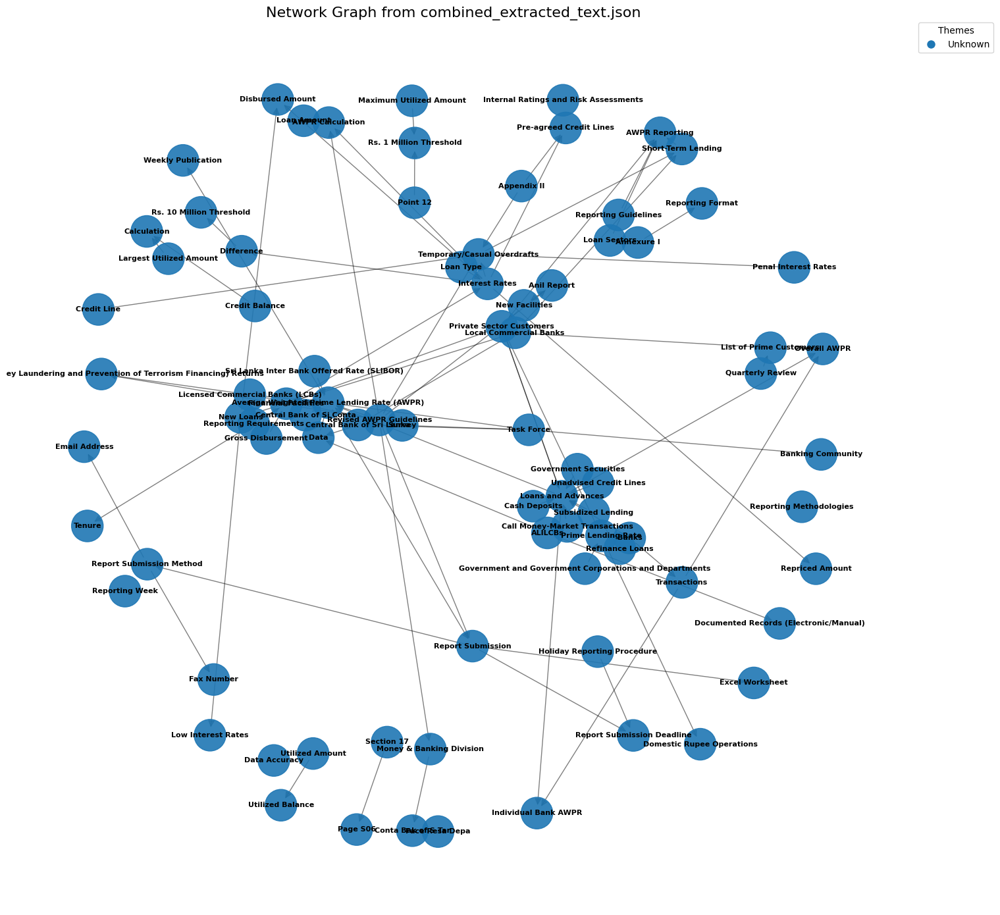

In [149]:
import networkx as nx
import json
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

def create_graph_from_json_data(json_data):
    """
    Creates a NetworkX MultiDiGraph from a JSON object.

    The JSON object should have 'nodes' and 'edges'.
    Nodes should have 'id', and optionally 'label', 'description', 'theme'.
    Edges should have 'source', 'target', 'label' (used as edge key), and optionally 'context'.
    """
    if isinstance(json_data, str):
        data = json.loads(json_data)
    else:
        data = json_data  # Assuming it's already a Python dict

    graph = nx.MultiDiGraph()

    # Add nodes
    for node_info in data.get('nodes', []):
        node_id = node_info.get('id')
        if node_id:
            attributes = {
                'label': node_info.get('label', node_id), # Default label to node_id if not present
                'description': node_info.get('description'),
                'theme': node_info.get('theme', 'Unknown') # Default theme if not present
            }
            # Filter out None attributes to keep node data clean, but keep 'theme'
            graph.add_node(node_id, **{k: v for k, v in attributes.items() if v is not None or k == 'theme'})

    # Add edges
    for edge_info in data.get('edges', []):
        source_id = edge_info.get('source')
        target_id = edge_info.get('target')
        edge_key = edge_info.get('label')  # This is the relationship type
        context = edge_info.get('context')

        if source_id and target_id and edge_key:
            # Ensure nodes exist. If not, add them with default attributes.
            if not graph.has_node(source_id):
                graph.add_node(source_id, label=source_id, theme='Unknown')
            if not graph.has_node(target_id):
                graph.add_node(target_id, label=target_id, theme='Unknown')

            edge_attributes = {'context': context}
            # Store the original JSON label as an attribute
            edge_attributes['relationship_type'] = edge_key
            graph.add_edge(source_id, target_id, key=edge_key, **{k:v for k,v in edge_attributes.items() if v is not None})
            
    return graph

def visualize_graph_by_theme(graph, title="Network Graph by Theme"):
    """
    Visualizes the graph with nodes colored by their 'theme' attribute.
    """
    if not graph.nodes:
        print("Graph has no nodes to visualize.")
        return

    # Extract themes and assign colors
    node_themes = [graph.nodes[node].get('theme', 'Unknown') for node in graph.nodes()]
    unique_themes = sorted(list(set(node_themes)))

    # Generate a color for each theme
    # Using a predefined list of colors for consistency, extend if more themes
    base_colors = list(mcolors.TABLEAU_COLORS.values()) + \
                  ['#FFC0CB', '#DDA0DD', '#8A2BE2', '#FF7F50', '#DC143C', 
                   '#00FFFF', '#00BFFF', '#ADFF2F', '#FFD700', '#A9A9A9']
                   
    if len(unique_themes) > len(base_colors):
        # Generate additional random distinct colors if needed
        import random
        for _ in range(len(unique_themes) - len(base_colors)):
            base_colors.append("#"+''.join([random.choice('0123456789ABCDEF') for j in range(6)]))

    theme_to_color = {theme: base_colors[i % len(base_colors)] for i, theme in enumerate(unique_themes)}
    if 'Unknown' not in theme_to_color: # Ensure 'Unknown' has a color
        theme_to_color['Unknown'] = '#CCCCCC' 
    else: # If 'Unknown' was a theme, ensure it gets its specific color or a default grey
        theme_to_color['Unknown'] = theme_to_color.get('Unknown', '#CCCCCC')


    node_colors_list = [theme_to_color.get(graph.nodes[node].get('theme', 'Unknown'), '#CCCCCC') for node in graph.nodes()]

    plt.figure(figsize=(18, 14)) # Increased figure size
    
    # Using a layout that spreads nodes better for larger graphs
    try:
        # Fruchterman-Reingold layout often works well
        pos = nx.spring_layout(graph, k=1.5/((len(graph.nodes()))**0.5) if len(graph.nodes()) > 1 else 1.5, iterations=50, seed=42)
    except: # Fallback for very small or disconnected graphs
        pos = nx.spring_layout(graph, k=0.9, iterations=30, seed=42)


    node_labels = {node: graph.nodes[node].get('label', node) for node in graph.nodes()}
    
    nx.draw_networkx_nodes(graph, pos, node_color=node_colors_list, node_size=1200, alpha=0.9)
    nx.draw_networkx_edges(graph, pos, alpha=0.5, width=1.0, arrowsize=15)
    nx.draw_networkx_labels(graph, pos, labels=node_labels, font_size=8, font_weight='bold')

    # Optional: Add edge labels if they are important and not too cluttered
    # edge_labels = {(u, v): d.get('relationship_type', '') for u, v, k, d in graph.edges(data=True, keys=True)}
    # nx.draw_networkx_edge_labels(graph, pos, edge_labels=edge_labels, font_color='black', font_size=6)

    # Create a legend for themes
    legend_handles = []
    # Only add themes present in the graph to the legend
    themes_in_graph = set(graph.nodes[node].get('theme', 'Unknown') for node in graph.nodes())
    
    for theme in sorted(list(themes_in_graph)):
        color = theme_to_color.get(theme, '#CCCCCC')
        legend_handles.append(plt.Line2D([0], [0], marker='o', color='w', label=str(theme),
                                         markerfacecolor=color, markersize=10))
    
    if legend_handles:
        plt.legend(handles=legend_handles, title="Themes", bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0.)

    plt.title(title, fontsize=16)
    plt.axis('off') # Turn off the axis
    plt.tight_layout(rect=[0, 0, 0.85, 1]) # Adjust layout to make room for legend if it's outside
    plt.show()

if __name__ == "__main__":
    json_file_path = "/Users/shirsama/dtcc-hackathon/dtcc-ai-hackathon-2025/graph_json/combined_extracted_text.json"
    
    try:
        with open(json_file_path, 'r') as f:
            graph_data = json.load(f)
        
        print(f"Successfully loaded JSON data from: {json_file_path}")
        
        # Create the graph
        my_graph = create_graph_from_json_data(graph_data)
        print(f"Graph created with {my_graph.number_of_nodes()} nodes and {my_graph.number_of_edges()} edges.")
        
        # Print some node data to verify themes
        # for i, (node_id, data) in enumerate(my_graph.nodes(data=True)):
        #     if i < 5: # Print details for first 5 nodes
        #         print(f"Node ID: {node_id}, Data: {data}")
        #     else:
        #         break

        # Visualize the graph
        visualize_graph_by_theme(my_graph, title=f"Network Graph from {json_file_path.split('/')[-1]}")
        
    except FileNotFoundError:
        print(f"Error: The file '{json_file_path}' was not found.")
    except json.JSONDecodeError:
        print(f"Error: Could not decode JSON from the file '{json_file_path}'. Please check its format.")
    except Exception as e:
        print(f"An unexpected error occurred: {e}")

In [155]:
import networkx as nx
import json
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from collections import defaultdict

def create_graph_from_json_data(json_data):
    """
    Creates a NetworkX MultiDiGraph from a JSON object.

    The JSON object should have 'nodes' and 'edges'.
    Nodes should have 'id', and optionally 'label', 'description', 'theme'.
    Edges should have 'source', 'target', 'label' (used as edge key), and optionally 'context'.
    """
    if isinstance(json_data, str):
        data = json.loads(json_data)
    else:
        data = json_data 

    graph = nx.MultiDiGraph()

    for node_info in data.get('nodes', []):
        node_id = node_info.get('id')
        if node_id:
            attributes = {
                'label': node_info.get('label', node_id),
                'description': node_info.get('description'),
                'category': node_info.get('category', 'Unknown') 
            }
            print(attributes)
            graph.add_node(node_id, **{k: v for k, v in attributes.items() if v is not None or k == 'category'})

    # Add edges
    for edge_info in data.get('edges', []):
        source_id = edge_info.get('source')
        target_id = edge_info.get('target')
        edge_key = edge_info.get('label')
        context = edge_info.get('context')

        if source_id and target_id and edge_key:
            if not graph.has_node(source_id): # Add if missing, e.g. if only edges define some nodes
                graph.add_node(source_id, label=source_id, theme='Unknown')
            if not graph.has_node(target_id):
                graph.add_node(target_id, label=target_id, theme='Unknown')

            edge_attributes = {'context': context, 'relationship_type': edge_key}
            graph.add_edge(source_id, target_id, key=edge_key, **{k:v for k,v in edge_attributes.items() if v is not None})
            
    return graph

def visualize_themed_graph(graph, theme_name, theme_color='skyblue'):
    """
    Visualizes a single graph, typically representing a specific theme.
    Nodes are colored with a specific theme_color.
    """
    if not graph.nodes:
        print(f"Graph for theme '{theme_name}' has no nodes to visualize.")
        return

    plt.figure(figsize=(16, 12))
    
    try:
        pos = nx.spring_layout(graph, k=1.5/((len(graph.nodes()))**0.5) if len(graph.nodes()) > 1 else 1.5, iterations=50, seed=42)
    except:
        pos = nx.spring_layout(graph, k=0.9, iterations=30, seed=42)

    node_labels = {node: graph.nodes[node].get('label', node) for node in graph.nodes()}
    
    nx.draw_networkx_nodes(graph, pos, node_color=theme_color, node_size=1000, alpha=0.9)
    nx.draw_networkx_edges(graph, pos, alpha=0.5, width=1.0, arrowsize=15)
    nx.draw_networkx_labels(graph, pos, labels=node_labels, font_size=8, font_weight='bold')

    # Optional: Edge labels (can be cluttered)
    # edge_labels = {(u, v): d.get('relationship_type', '') for u, v, k, d in graph.edges(data=True, keys=True)}
    # nx.draw_networkx_edge_labels(graph, pos, edge_labels=edge_labels, font_color='black', font_size=6)

    plt.title(f"Network Graph for Theme: {theme_name}", fontsize=16)
    plt.axis('off')
    plt.tight_layout()
    plt.show()

def create_and_visualize_graphs_by_theme(main_graph, json_file_name):
    """
    Creates and visualizes separate graphs for each theme in the main_graph.
    """
    if not main_graph.nodes:
        print("Main graph has no nodes. Cannot create theme-specific graphs.")
        return

    # 1. Group nodes by theme
    nodes_by_theme = defaultdict(list)
    for node, data in main_graph.nodes(data=True):
        category = data.get('category', 'Unknown')
        nodes_by_theme[category].append(node)

    if not nodes_by_theme:
        print("No themes found in the graph nodes.")
        return

    # Generate distinct colors for themes
    unique_themes = sorted(list(nodes_by_theme.keys()))
    base_colors = list(mcolors.TABLEAU_COLORS.values()) + \
                  ['#FFC0CB', '#DDA0DD', '#8A2BE2', '#FF7F50', '#DC143C', 
                   '#00FFFF', '#00BFFF', '#ADFF2F', '#FFD700', '#A9A9A9']
    if len(unique_themes) > len(base_colors):
        import random
        for _ in range(len(unique_themes) - len(base_colors)):
            base_colors.append("#"+''.join([random.choice('0123456789ABCDEF') for _ in range(6)]))
    
    theme_to_color = {theme: base_colors[i % len(base_colors)] for i, theme in enumerate(unique_themes)}
    theme_to_color['Unknown'] = theme_to_color.get('Unknown', '#CCCCCC') # Ensure 'Unknown' has a color

    print(f"\nFound themes: {', '.join(unique_themes)}")

    # 2. For each theme, create and visualize a subgraph
    for theme, theme_nodes in nodes_by_theme.items():
        print(f"\nProcessing theme: {theme} (Nodes: {len(theme_nodes)})")
        
        theme_graph = nx.MultiDiGraph()
        
        # Add nodes of the current theme
        for node_id in theme_nodes:
            theme_graph.add_node(node_id, **main_graph.nodes[node_id])
            
        # Add edges where both source and target nodes are in the current theme_graph
        for u, v, k, data in main_graph.edges(keys=True, data=True):
            if theme_graph.has_node(u) and theme_graph.has_node(v):
                theme_graph.add_edge(u, v, key=k, **data)
        
        if theme_graph.number_of_nodes() > 0:
            print(f"  Theme graph for '{theme}' has {theme_graph.number_of_nodes()} nodes and {theme_graph.number_of_edges()} edges.")
            visualize_themed_graph(theme_graph, theme, theme_color=theme_to_color.get(theme, '#CCCCCC'))
        else:
            print(f"  No nodes or edges for theme '{theme}' after filtering. Skipping visualization.")


if __name__ == "__main__":
    json_file_path = "/Users/shirsama/dtcc-hackathon/dtcc-ai-hackathon-2025/graph_json/combined_extracted_text.json"
    
    try:
        with open(json_file_path, 'r') as f:
            graph_data = json.load(f)
        
        print(f"Successfully loaded JSON data from: {json_file_path}")
        
        # Create the main graph from all data
        main_graph = create_graph_from_json_data(graph_data)
        print(f"Main graph created with {main_graph.number_of_nodes()} nodes and {main_graph.number_of_edges()} edges.")

        # Create and visualize graphs for each theme
    #     json_file_name = json_file_path.split('/')[-1]
    #     create_and_visualize_graphs_by_theme(main_graph, json_file_name)
        
    except FileNotFoundError:
        print(f"Error: The file '{json_file_path}' was not found.")
    # except json.JSONDecodeError:
    #     print(f"Error: Could not decode JSON from the file '{json_file_path}'. Please check its format.")
    # except Exception as e:
    #     print(f"An unexpected error occurred: {e}")
    #     import traceback
    #     traceback.print_exc()

Successfully loaded JSON data from: /Users/shirsama/dtcc-hackathon/dtcc-ai-hackathon-2025/graph_json/combined_extracted_text.json
{'label': 'Average Weighted Prime Lending Rate (AWPR)', 'description': 'key economic indicator', 'category': ['AWPR Publication', 'Revised AWPR', 'Transition from', 'Calculation of', 'AWPR Calculation', 'AWPR Reporting', 'Impact of New']}
{'label': 'Central Bank of Sri Lanka', 'description': 'central bank of Sri', 'category': ['AWPR Publication', 'Revised AWPR', 'Transition from', 'Prime Customer', 'AWPR Reporting']}
{'label': 'Licensed Commercial Banks (LCBs)', 'description': 'commercial banks in', 'category': ['AWPR Publication', 'Calculation of', 'Prime Customer', 'Low-Interest Short-Term']}
{'label': 'Prime Lending Rate', 'description': 'interest rate at', 'category': ['Prime Lending Rate', 'Excluded Loan Types']}
{'label': 'Revised AWPR Guidelines', 'description': 'updated procedures for', 'category': ['Revised AWPR', 'AWPR Calculation', 'AWPR Reporting

Successfully loaded JSON data from: /Users/shirsama/dtcc-hackathon/dtcc-ai-hackathon-2025/graph_json/combined_extracted_text.json
Main graph created with 83 nodes and 94 edges.

Found categories: AWPR Calculation, AWPR Compliance, AWPR Guideline, AWPR Publication, AWPR Reporting, Aggregation and, Calculation of, Data Reporting, Difference Calculation, Document Structure, Excluded Loan Types, Exclusions from Prime, Financial Institution(s), Impact of New, Interest Calculation, Largest Utilized, Loan Reporting, Low-Interest Short-Term, Overdraft Interest, Prime Customer, Prime Lending Rate, Reporting of, Revised AWPR, Secured Loans, Supporting Documentation, Transaction Reporting, Transition from

Processing category: AWPR Publication (Nodes: 4)
  Graph for 'AWPR Publication' has 4 nodes and 3 edges.


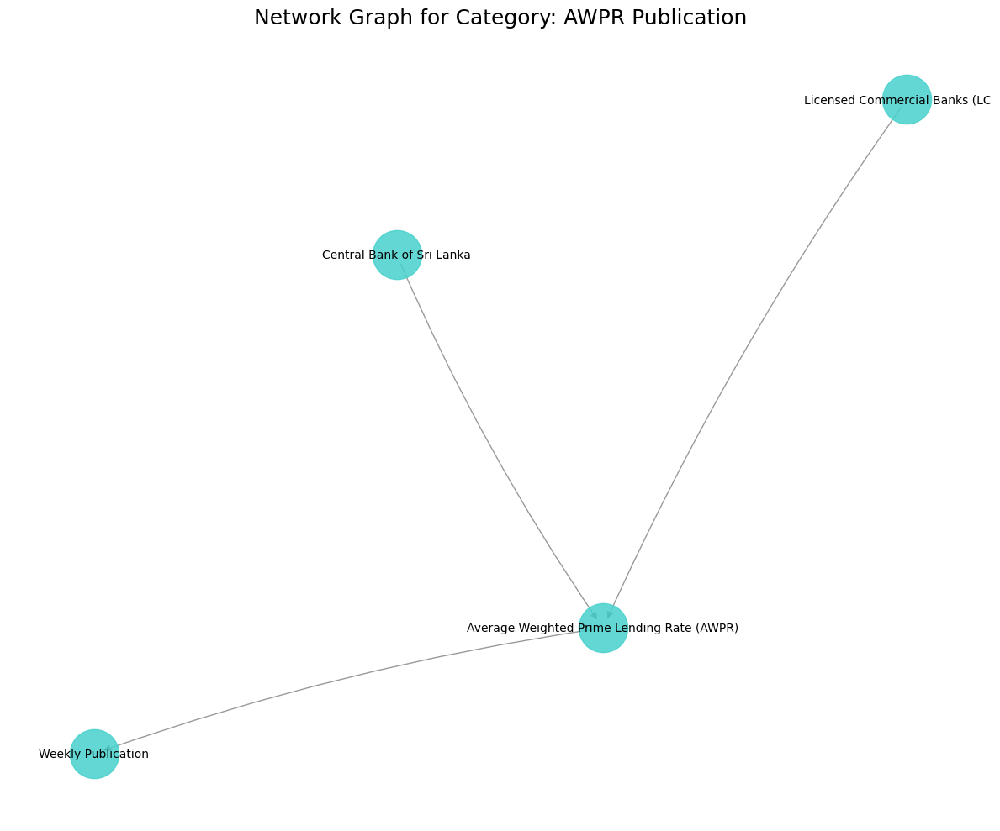


Processing category: Revised AWPR (Nodes: 3)
  Graph for 'Revised AWPR' has 3 nodes and 4 edges.


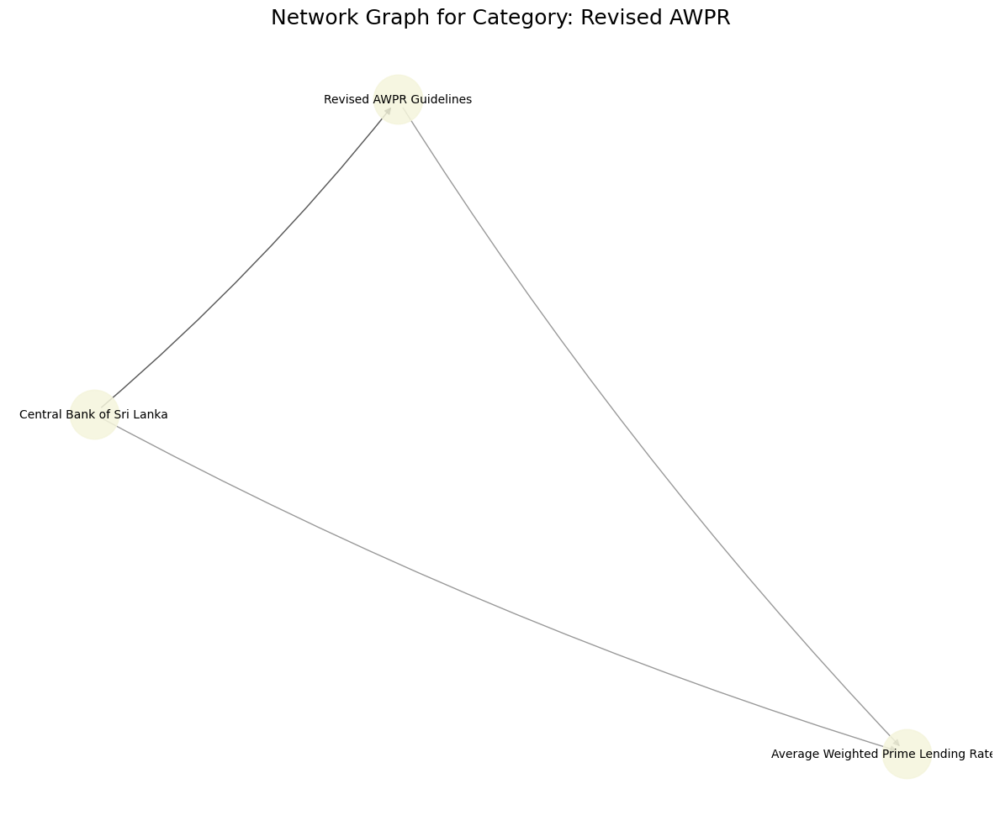


Processing category: Transition from (Nodes: 5)
  Graph for 'Transition from' has 5 nodes and 5 edges.


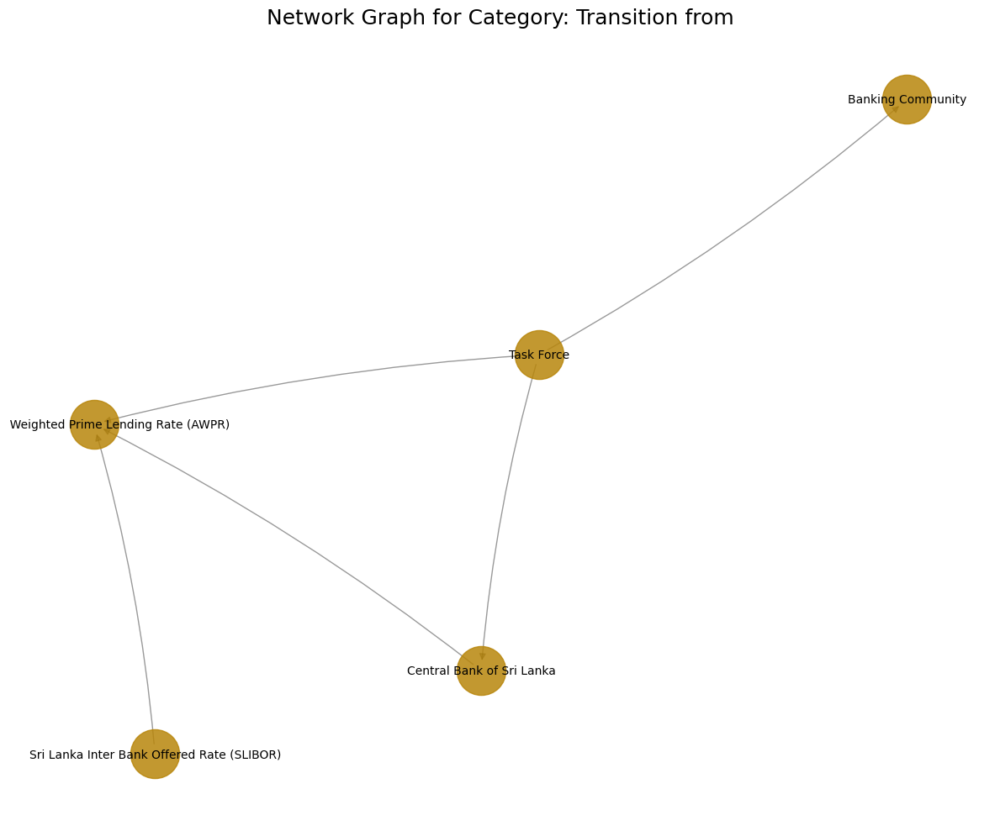


Processing category: Calculation of (Nodes: 3)
  Graph for 'Calculation of' has 3 nodes and 2 edges.


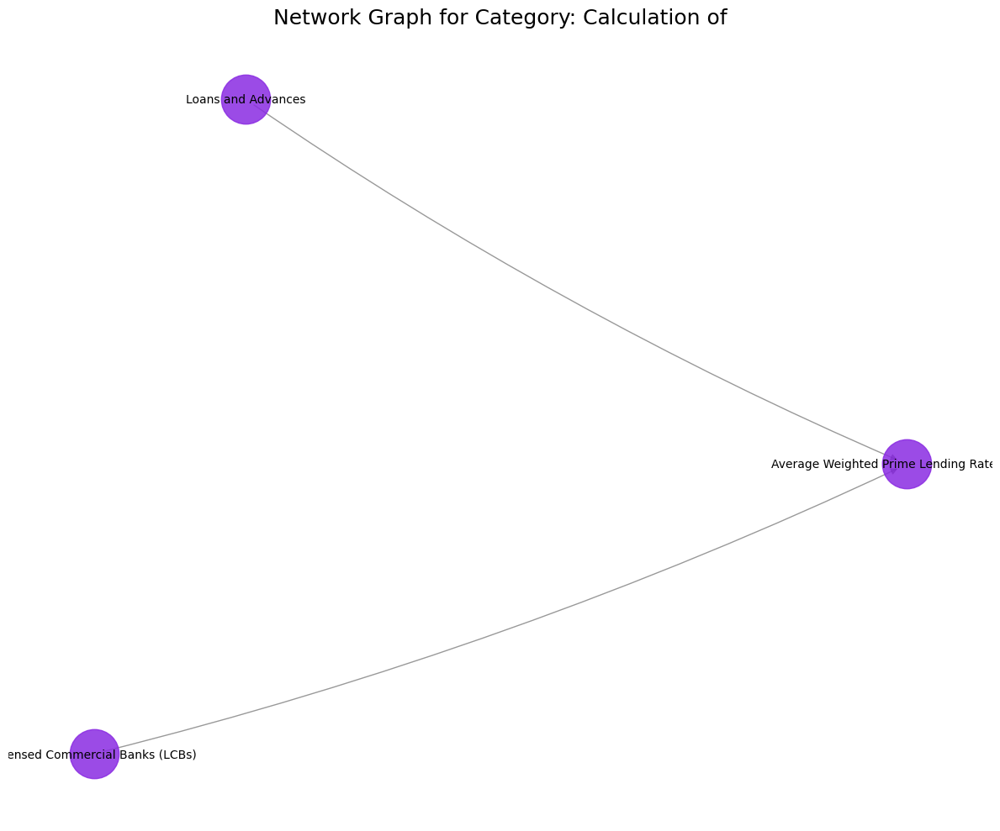


Processing category: AWPR Calculation (Nodes: 11)
  Graph for 'AWPR Calculation' has 11 nodes and 8 edges.


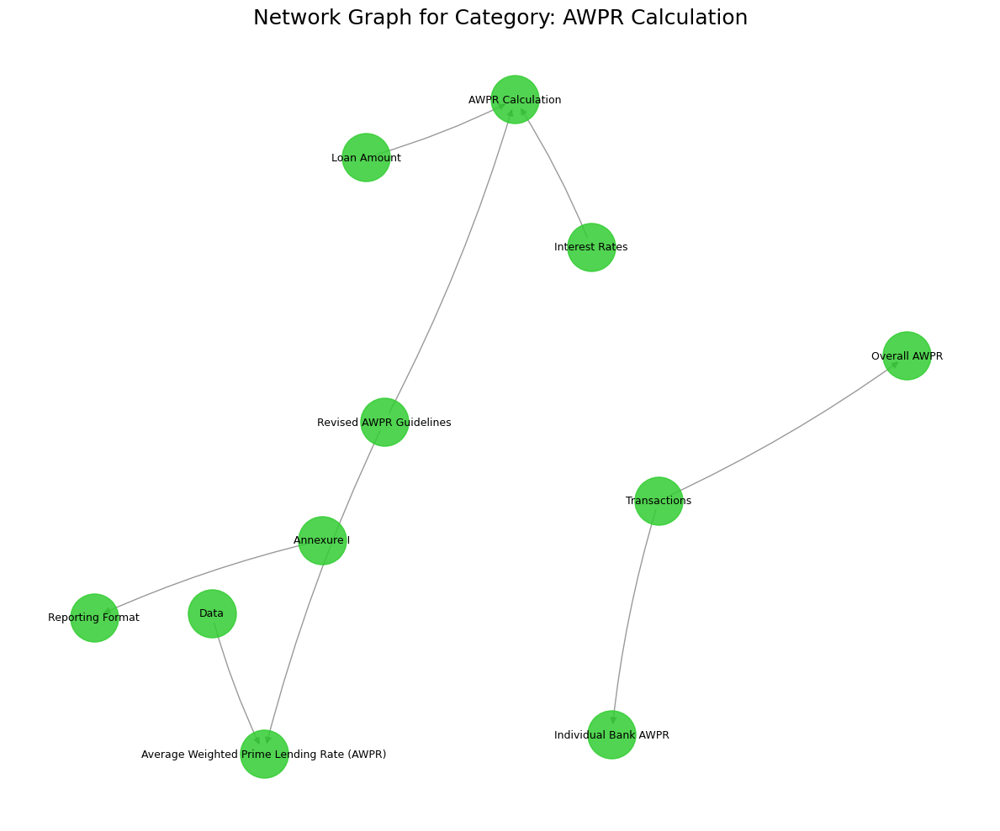


Processing category: AWPR Reporting (Nodes: 24)
  Graph for 'AWPR Reporting' has 24 nodes and 27 edges.


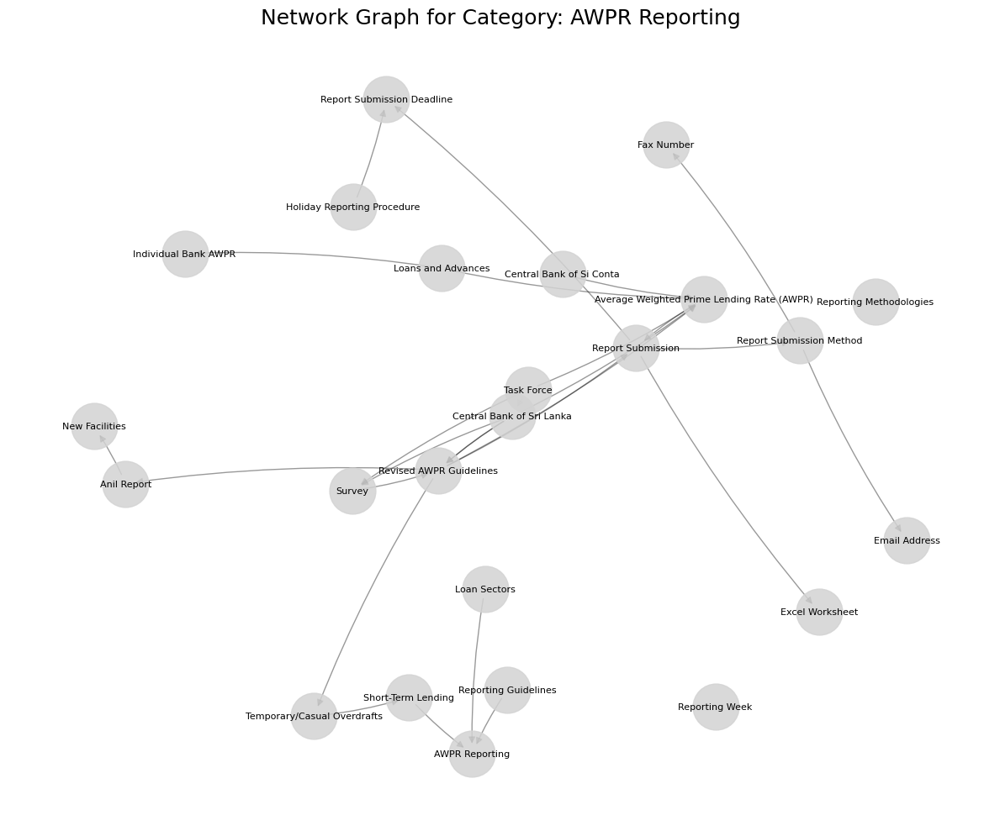


Processing category: Impact of New (Nodes: 3)
  Graph for 'Impact of New' has 3 nodes and 1 edges.


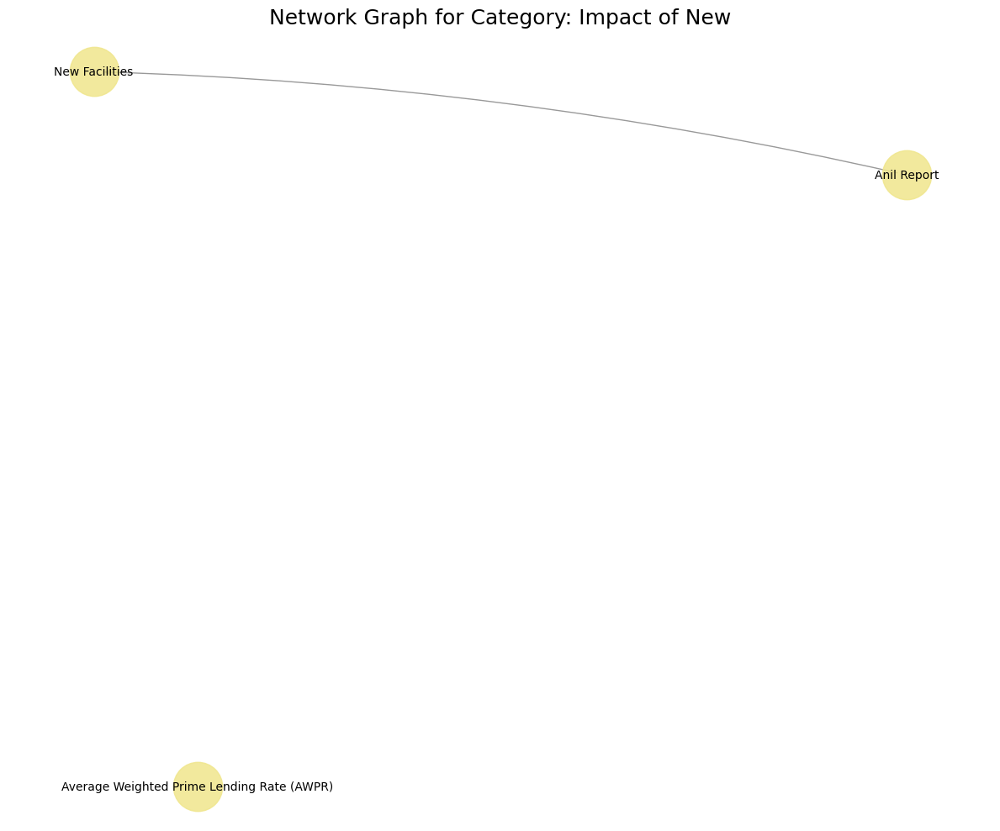


Processing category: Prime Customer (Nodes: 6)
  Graph for 'Prime Customer' has 6 nodes and 3 edges.


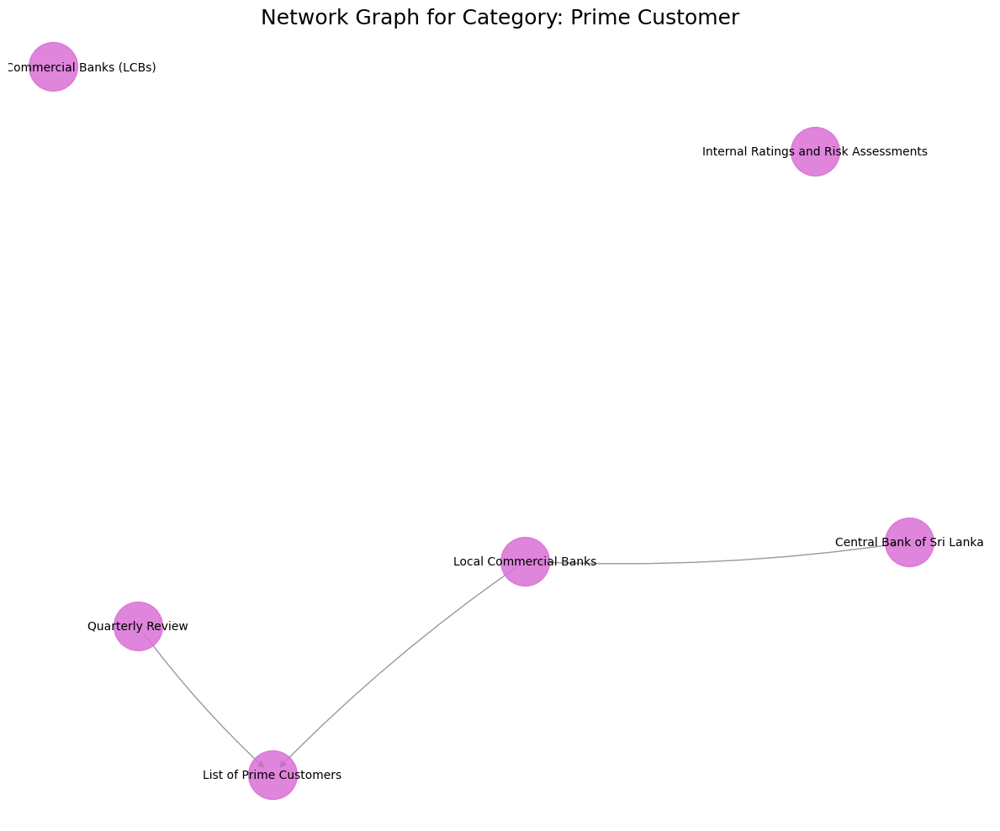


Processing category: Low-Interest Short-Term (Nodes: 7)
  Graph for 'Low-Interest Short-Term' has 7 nodes and 4 edges.


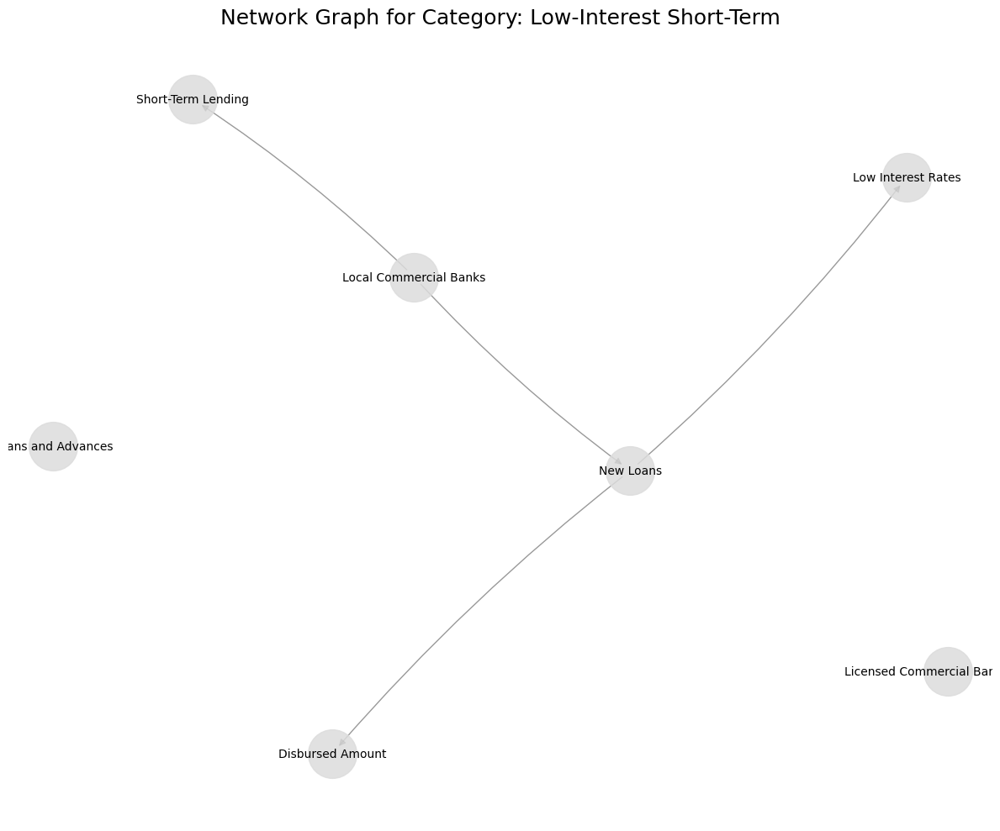


Processing category: Prime Lending Rate (Nodes: 3)
  Graph for 'Prime Lending Rate' has 3 nodes and 2 edges.


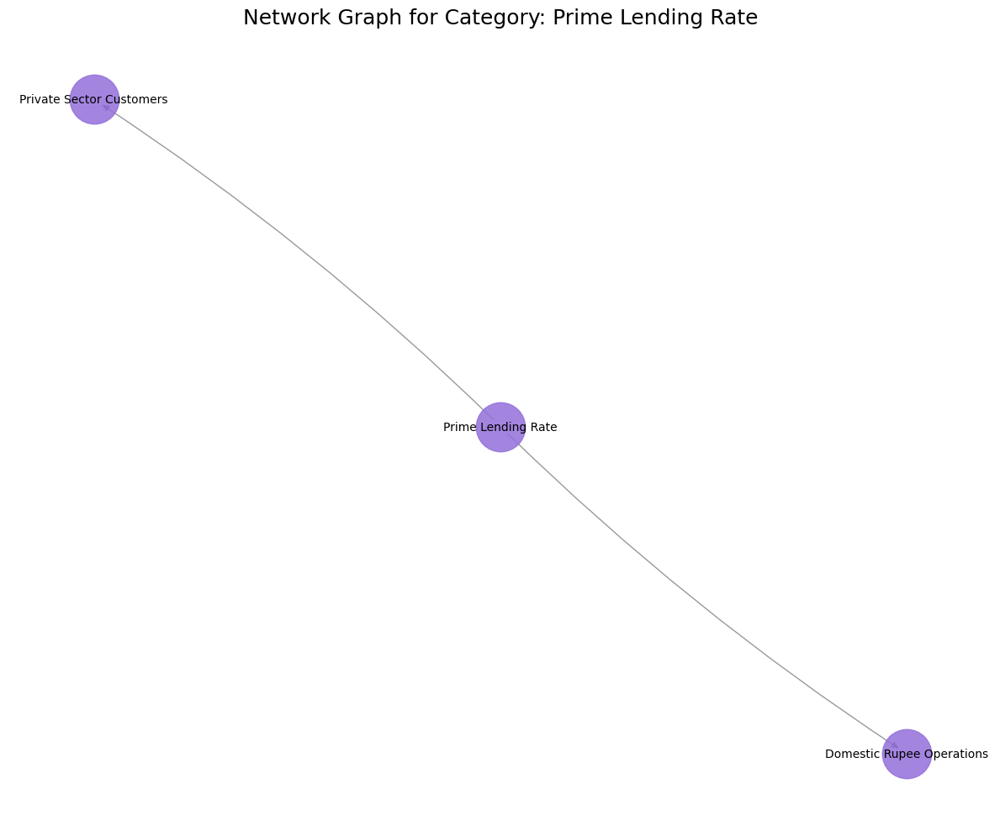


Processing category: Excluded Loan Types (Nodes: 11)
  Graph for 'Excluded Loan Types' has 11 nodes and 9 edges.


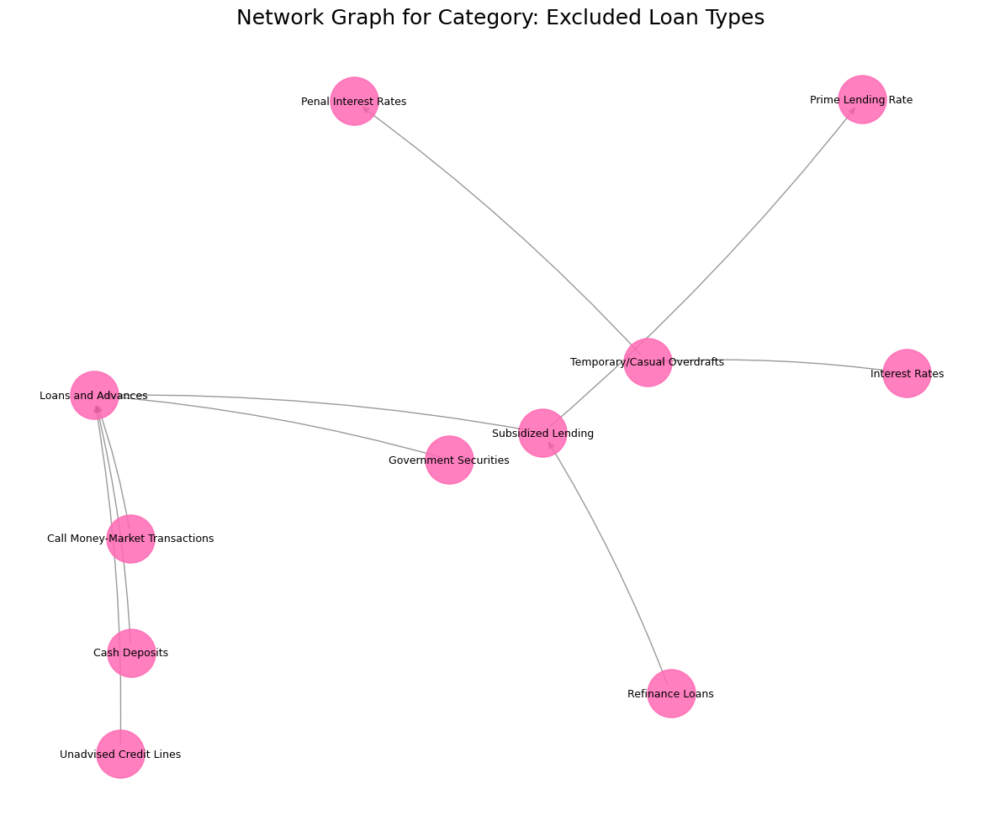


Processing category: AWPR Guideline (Nodes: 1)
  Graph for 'AWPR Guideline' has 1 nodes and 0 edges.


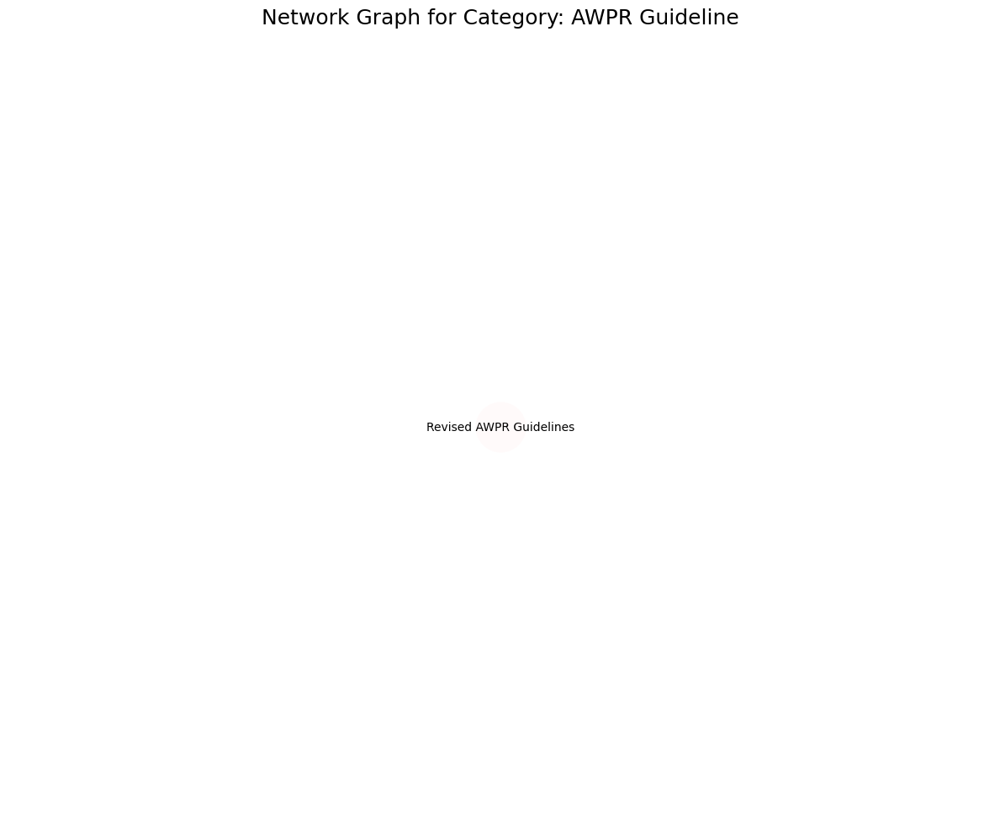


Processing category: Exclusions from Prime (Nodes: 3)
  Graph for 'Exclusions from Prime' has 3 nodes and 1 edges.


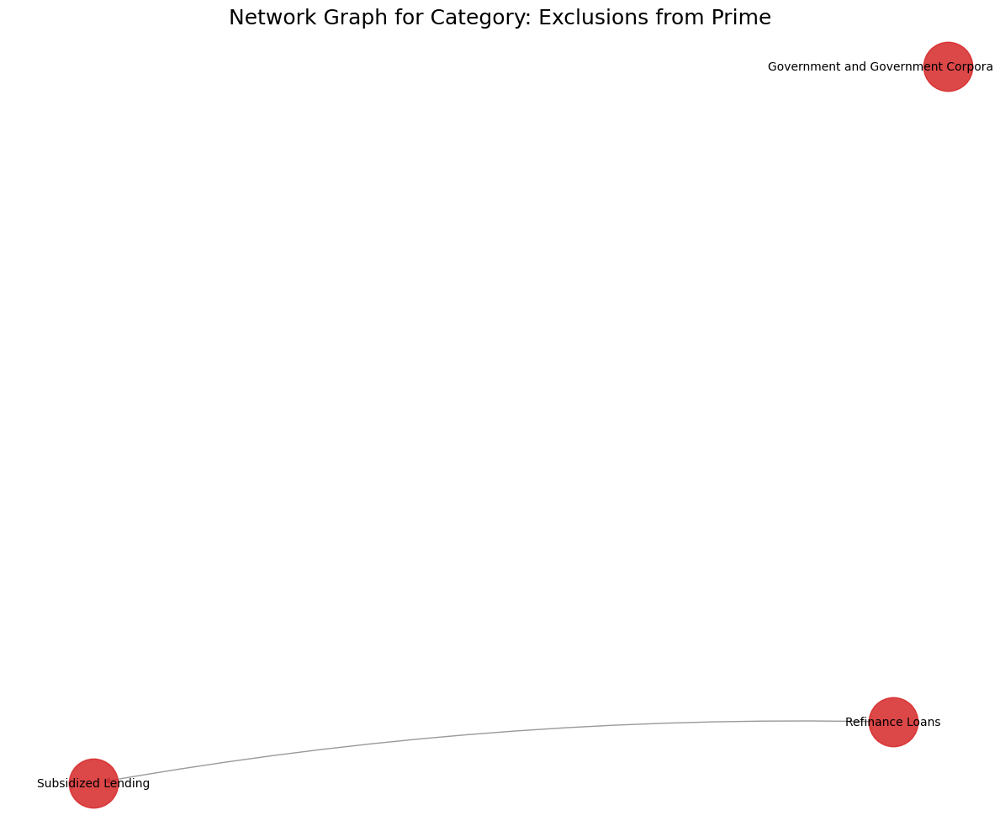


Processing category: Secured Loans (Nodes: 3)
  Graph for 'Secured Loans' has 3 nodes and 2 edges.


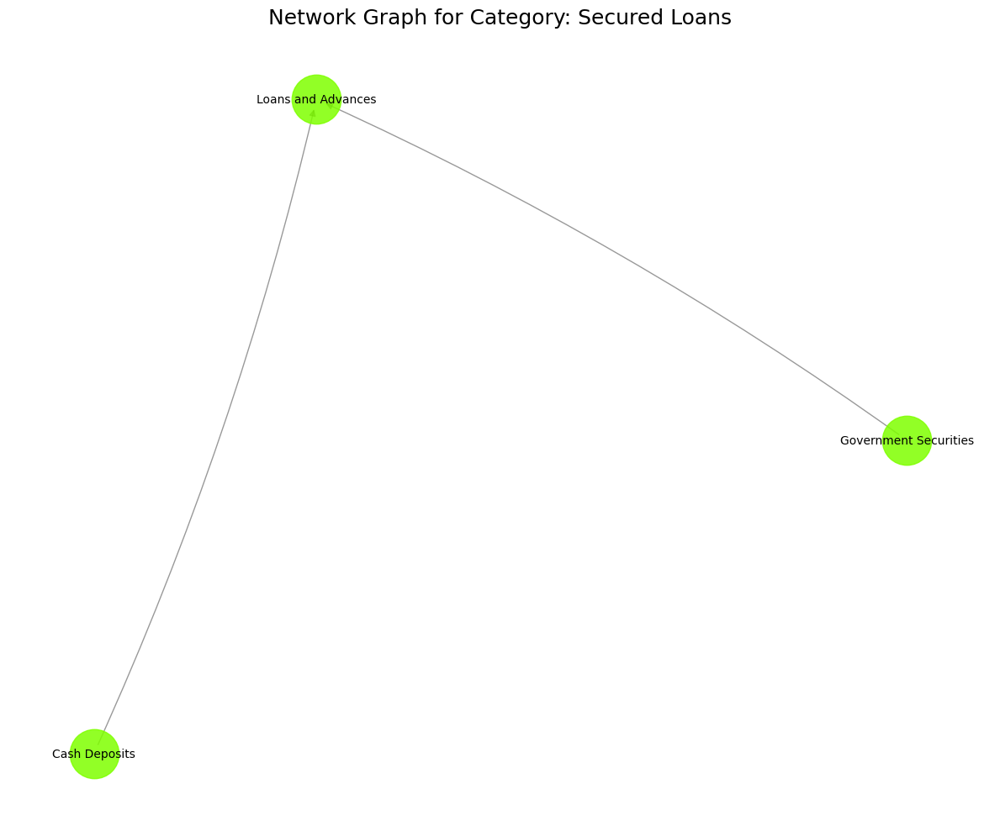


Processing category: Reporting of (Nodes: 7)
  Graph for 'Reporting of' has 7 nodes and 5 edges.


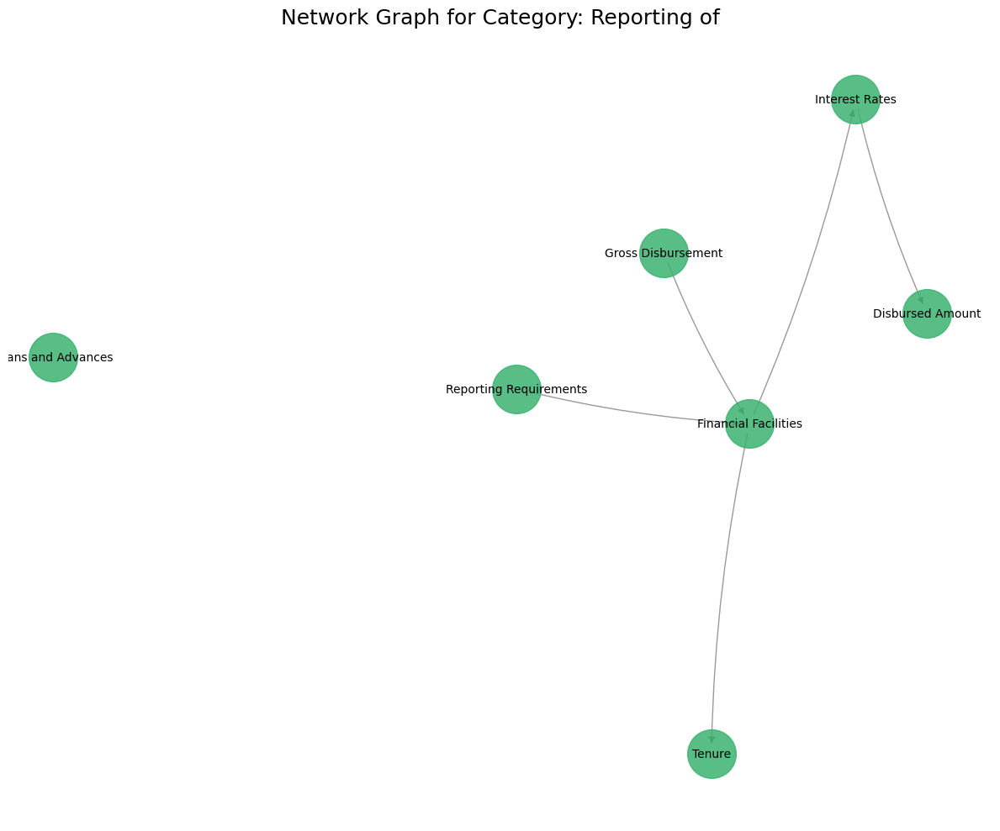


Processing category: Interest Calculation (Nodes: 10)
  Graph for 'Interest Calculation' has 10 nodes and 6 edges.


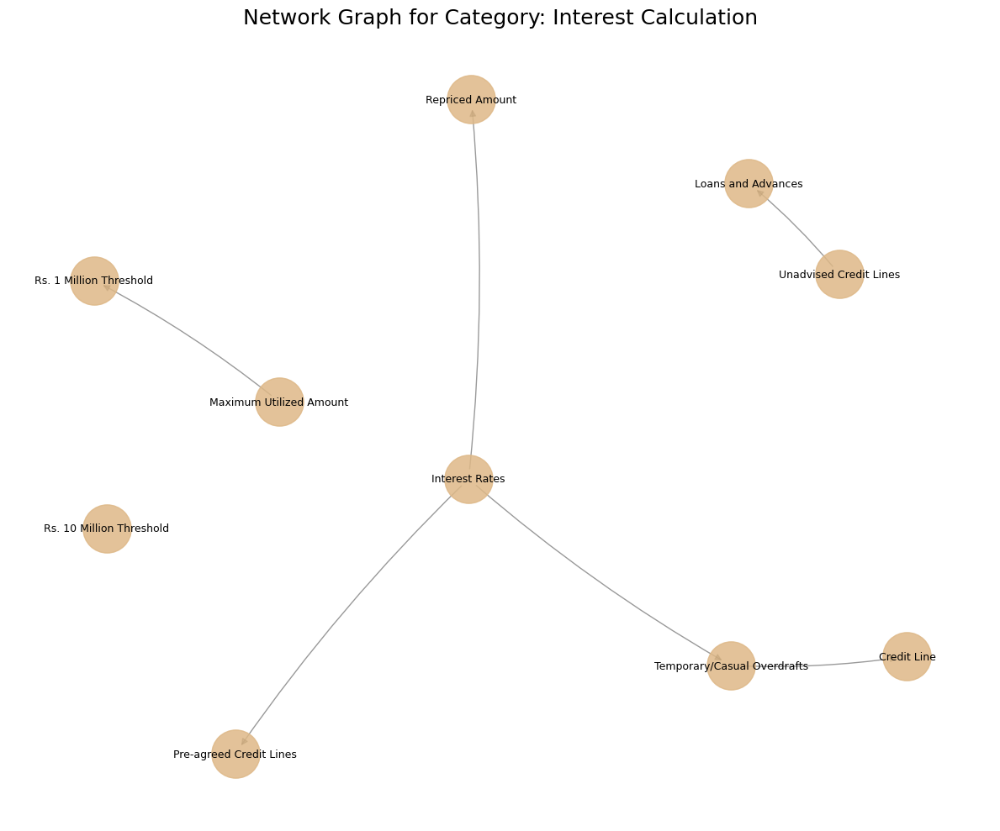


Processing category: Overdraft Interest (Nodes: 5)
  Graph for 'Overdraft Interest' has 5 nodes and 4 edges.


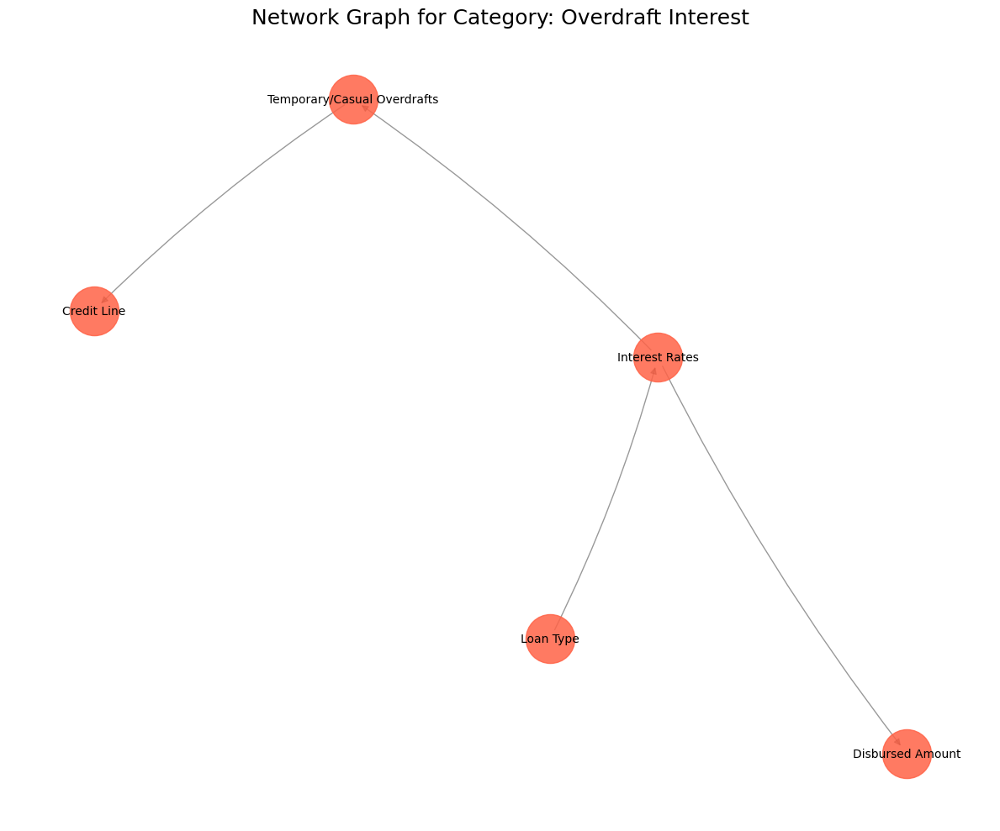


Processing category: Difference Calculation (Nodes: 11)
  Graph for 'Difference Calculation' has 11 nodes and 6 edges.


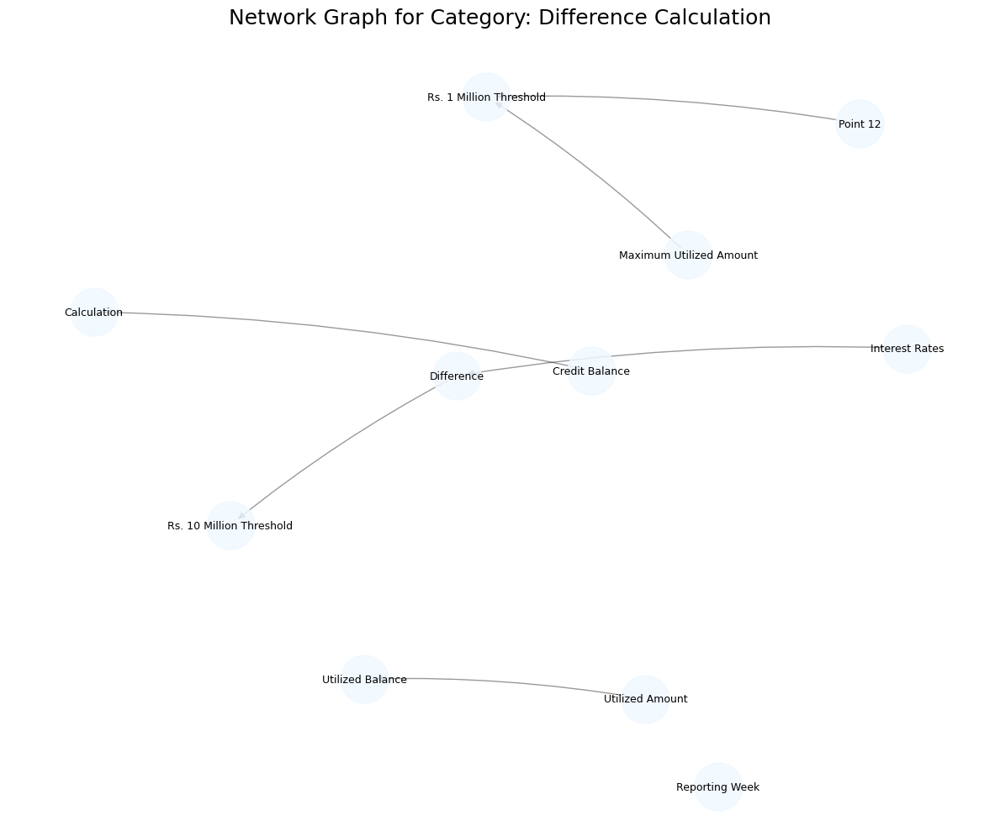


Processing category: Transaction Reporting (Nodes: 4)
  Graph for 'Transaction Reporting' has 4 nodes and 1 edges.


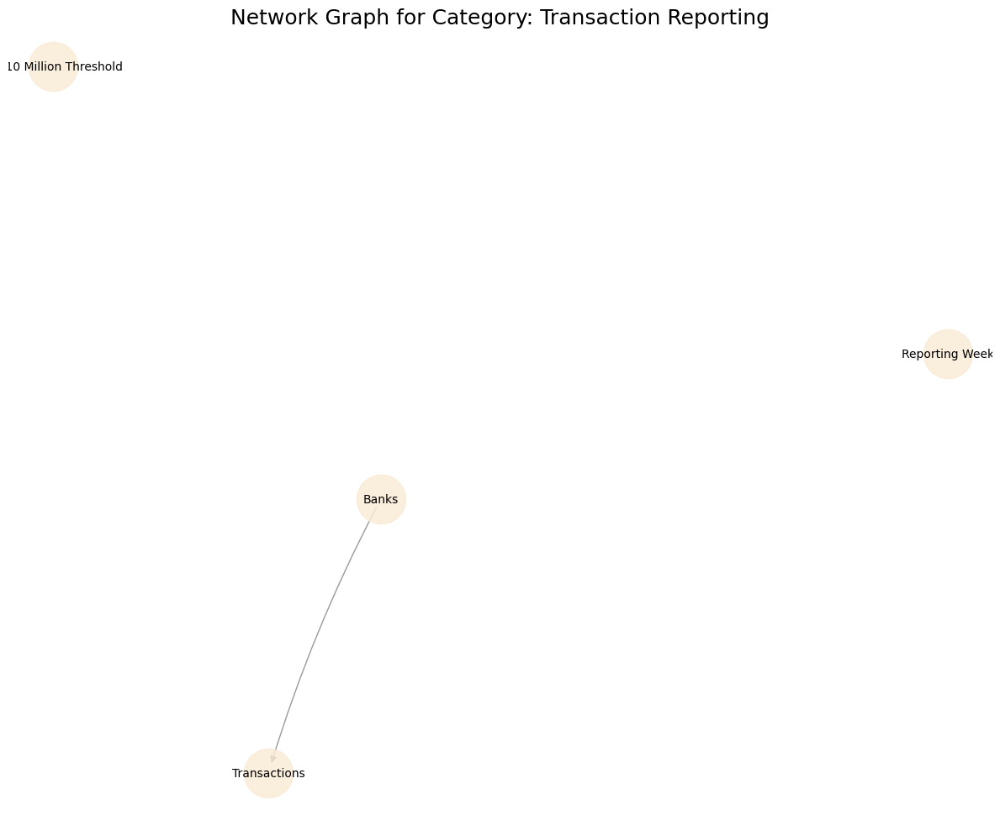


Processing category: Loan Reporting (Nodes: 3)
  Graph for 'Loan Reporting' has 3 nodes and 0 edges.


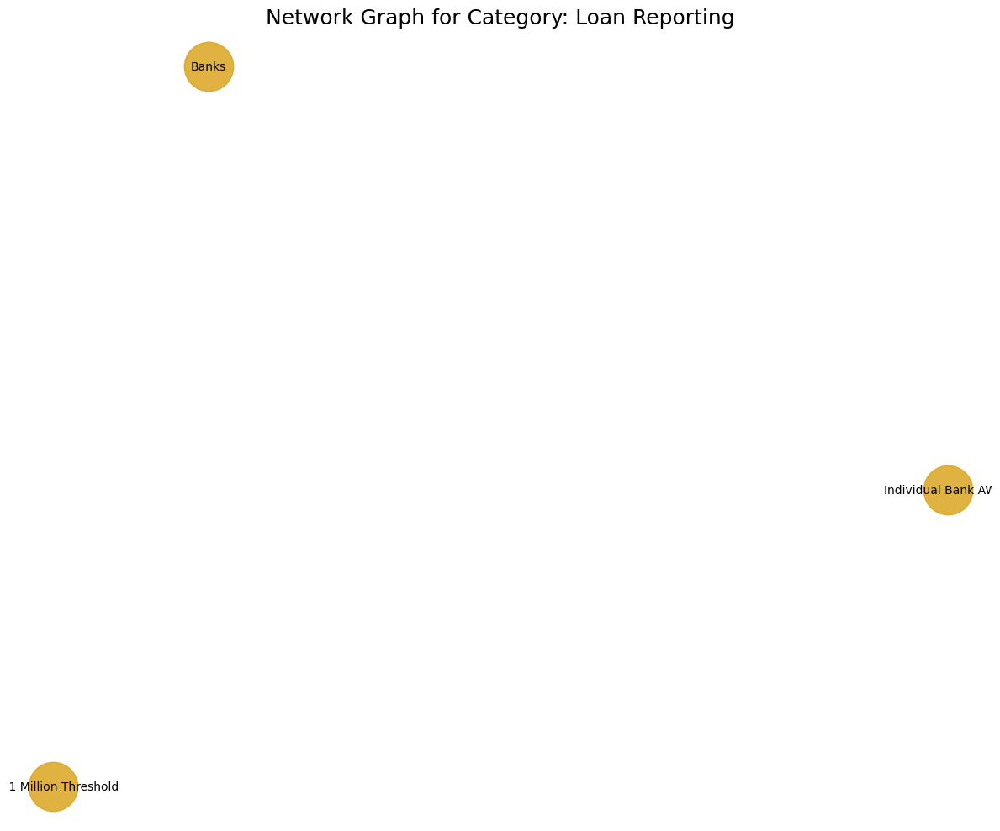


Processing category: Data Reporting (Nodes: 5)
  Graph for 'Data Reporting' has 5 nodes and 2 edges.


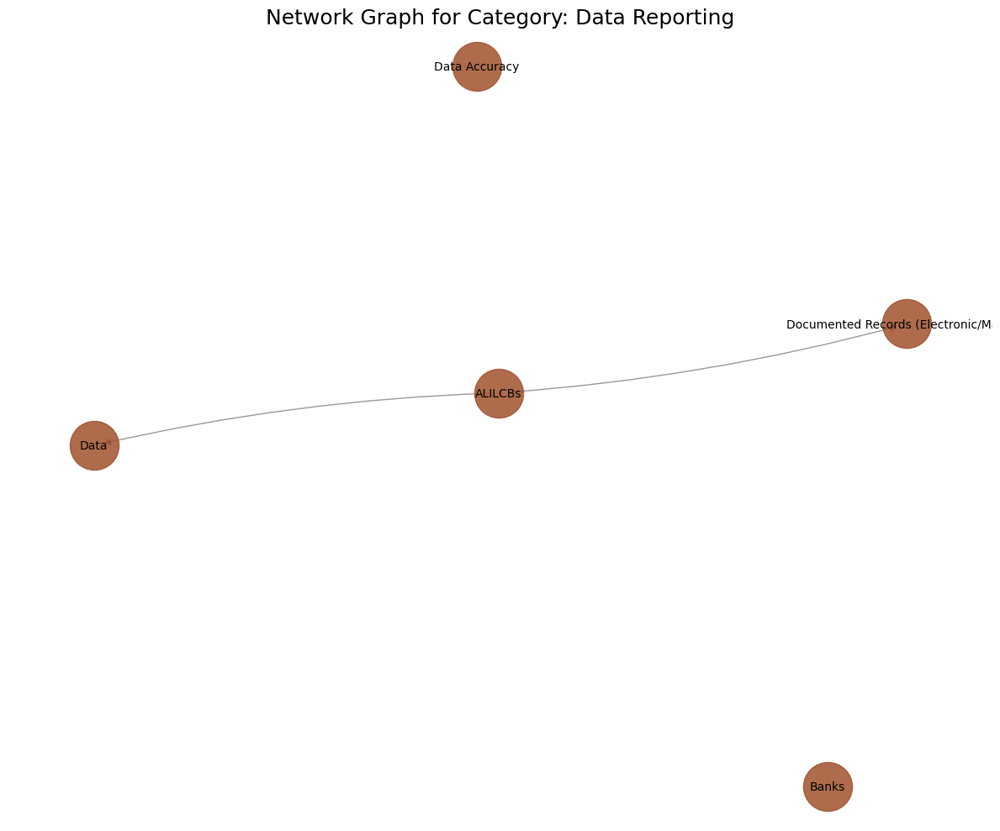


Processing category: Financial Institution(s) (Nodes: 3)
  Graph for 'Financial Institution(s)' has 3 nodes and 2 edges.


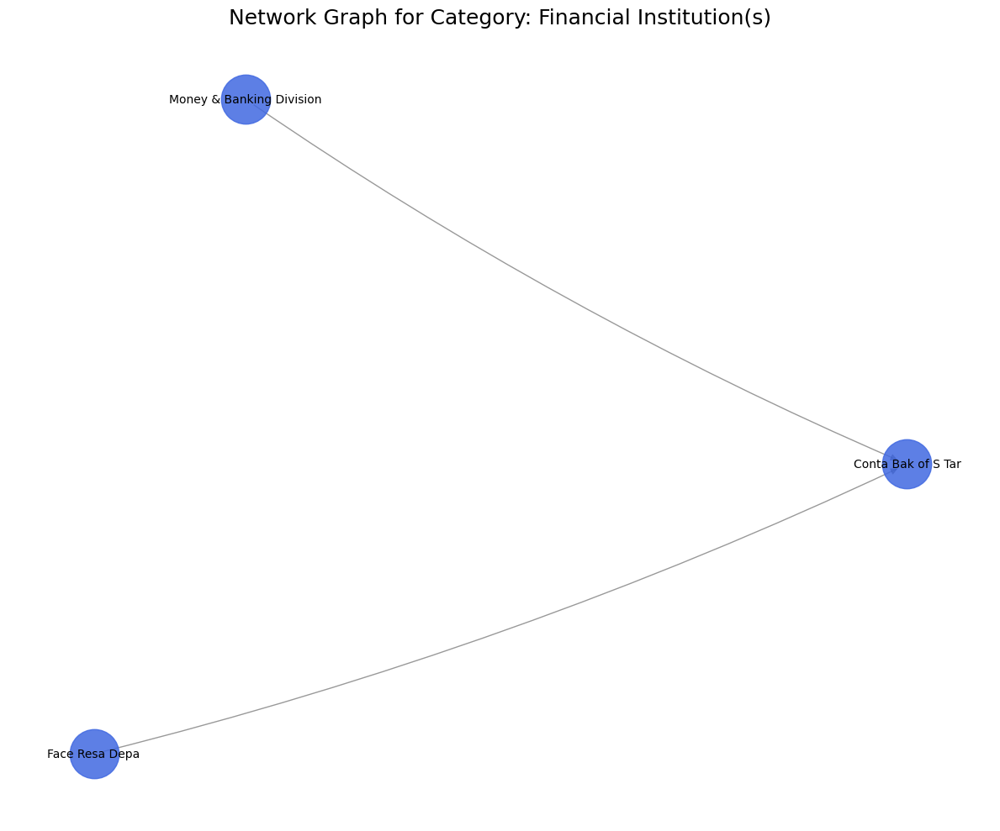


Processing category: Document Structure (Nodes: 2)
  Graph for 'Document Structure' has 2 nodes and 1 edges.


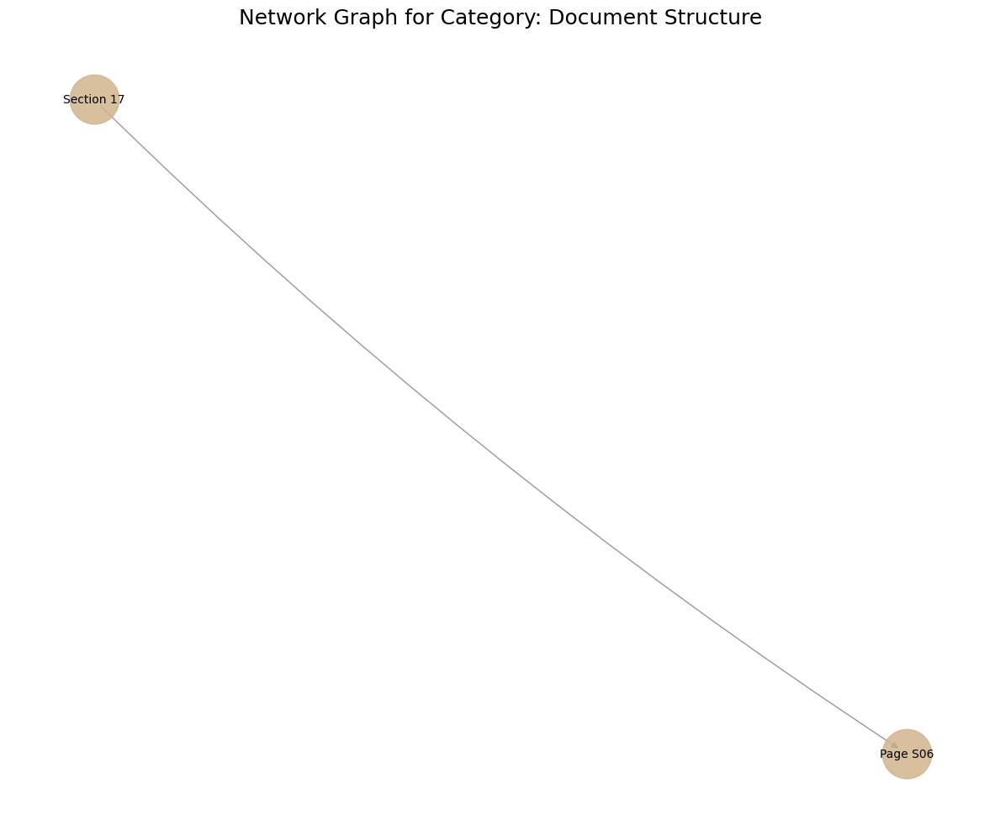


Processing category: AWPR Compliance (Nodes: 2)
  Graph for 'AWPR Compliance' has 2 nodes and 0 edges.


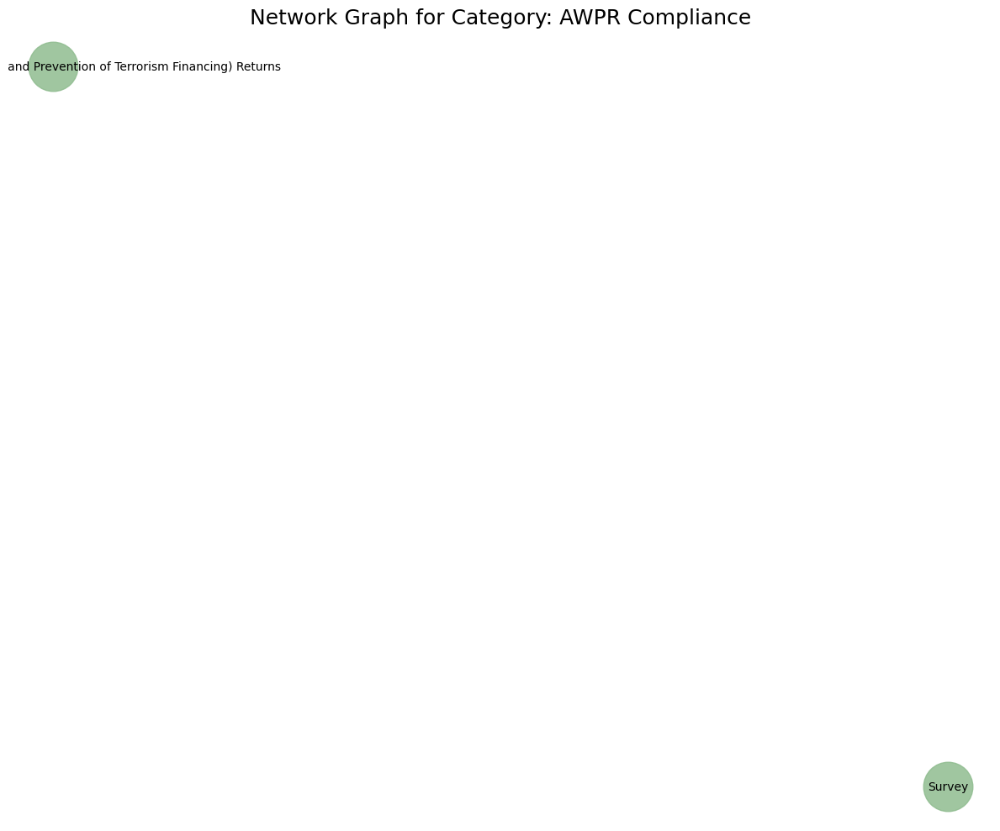


Processing category: Aggregation and (Nodes: 4)
  Graph for 'Aggregation and' has 4 nodes and 3 edges.


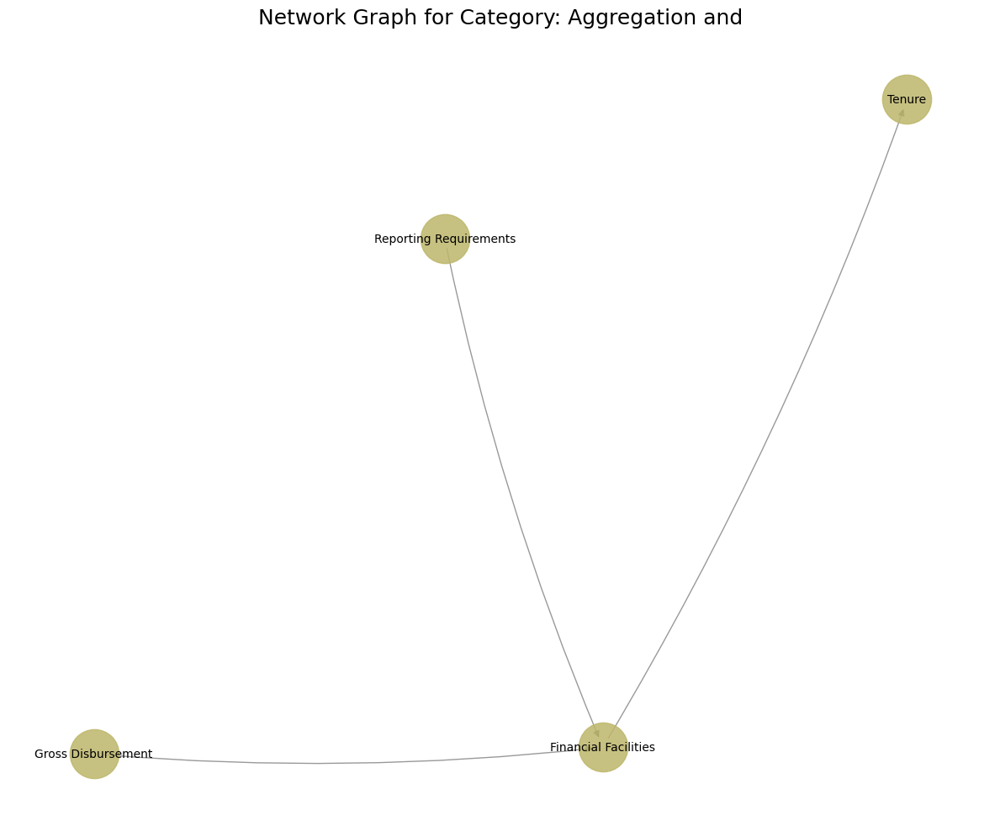


Processing category: Supporting Documentation (Nodes: 1)
  Graph for 'Supporting Documentation' has 1 nodes and 0 edges.


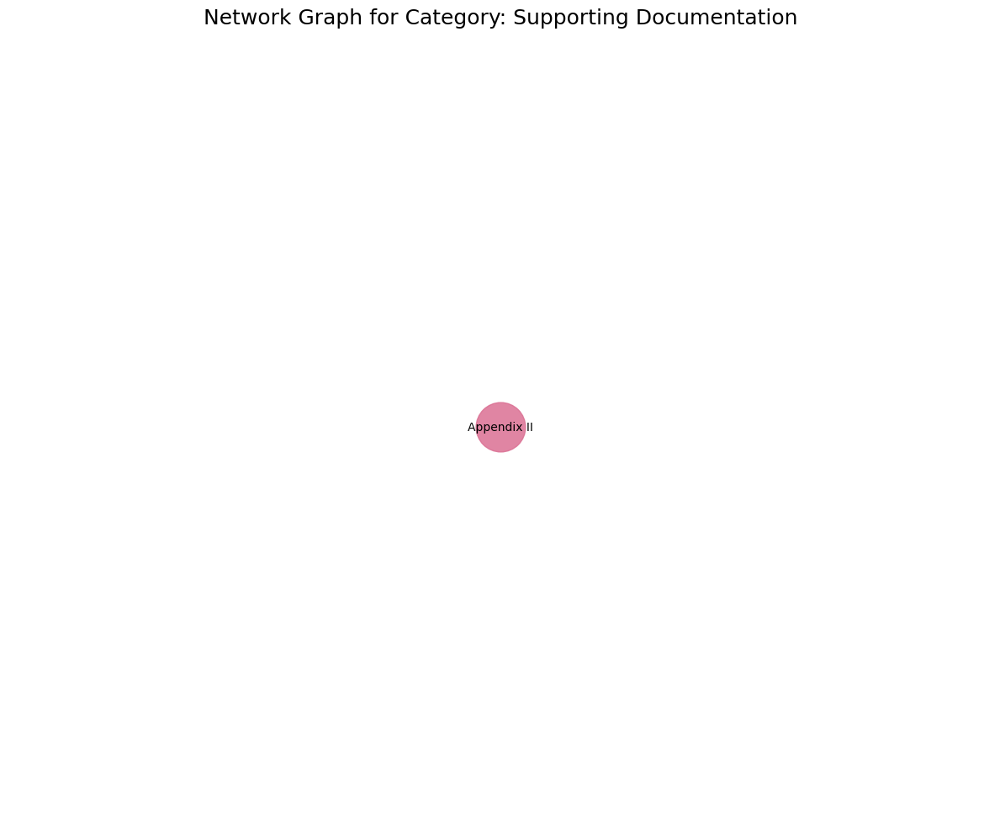


Processing category: Largest Utilized (Nodes: 1)
  Graph for 'Largest Utilized' has 1 nodes and 0 edges.


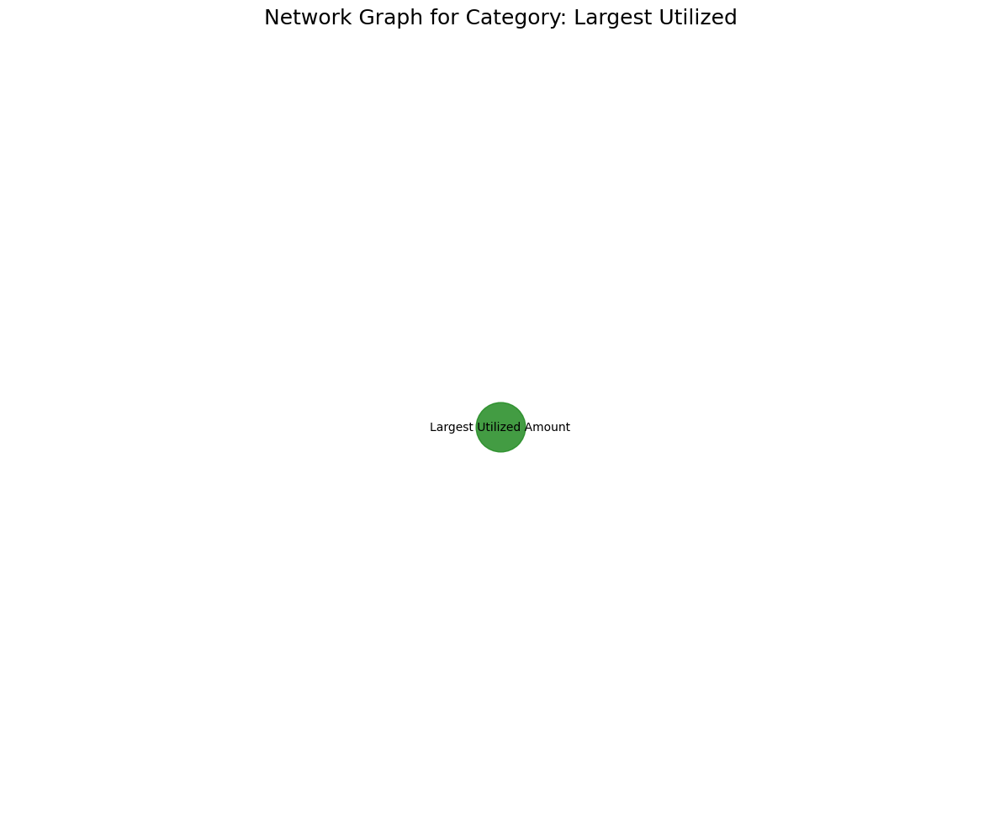

In [156]:
import networkx as nx
import json
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from collections import defaultdict
import random

def create_graph_from_json_data(json_data):
    """
    Creates a NetworkX MultiDiGraph from a JSON object.
    Nodes are expected to have an 'id' and optionally a 'label' and 'category' (list of strings).
    Edges should have 'source', 'target', and 'label' (relationship type).
    """
    if isinstance(json_data, str):
        data = json.loads(json_data)
    else:
        data = json_data

    graph = nx.MultiDiGraph()

    # Add nodes
    for node_info in data.get('nodes', []):
        node_id = node_info.get('id')
        if node_id:
            # Ensure category is a list, default to ['Uncategorized'] if missing or not a list
            categories = node_info.get('category', ['Uncategorized'])
            if not isinstance(categories, list) or not categories:
                categories = ['Uncategorized']
            
            attributes = {
                'label': node_info.get('label', node_id),
                'description': node_info.get('description'),
                'category': categories
            }
            graph.add_node(node_id, **{k: v for k, v in attributes.items() if v is not None})

    # Add edges
    for edge_info in data.get('edges', []):
        source_id = edge_info.get('source')
        target_id = edge_info.get('target')
        edge_key = edge_info.get('label')  # Relationship type
        context = edge_info.get('context')

        if source_id and target_id and edge_key:
            # Ensure nodes exist. If not, add them with default attributes.
            if not graph.has_node(source_id):
                graph.add_node(source_id, label=source_id, category=['Uncategorized'])
            if not graph.has_node(target_id):
                graph.add_node(target_id, label=target_id, category=['Uncategorized'])

            edge_attributes = {'context': context, 'relationship_type': edge_key}
            graph.add_edge(source_id, target_id, key=edge_key, **{k:v for k,v in edge_attributes.items() if v is not None})
            
    return graph

def visualize_category_graph(graph, category_name, category_color='skyblue'):
    """
    Visualizes a single graph, typically representing a specific category.
    Nodes are colored with a specific category_color.
    Focuses on readability.
    """
    if not graph.nodes:
        print(f"Graph for category '{category_name}' has no nodes to visualize.")
        return

    num_nodes = len(graph.nodes())
    plt.figure(figsize=(min(20, max(12, num_nodes * 0.5)), min(18, max(10, num_nodes * 0.4)))) # Dynamic figure size
    
    # Layout: Spring layout is generally good. Adjust k for spread.
    # k controls the optimal distance between nodes.
    # iterations for convergence.
    k_val = 2.0 / (num_nodes**0.5) if num_nodes > 1 else 2.0
    try:
        pos = nx.spring_layout(graph, k=k_val, iterations=max(50, num_nodes * 2), seed=42, scale=2)
        # For very dense small graphs, sometimes fruchterman_reingold works better
        if num_nodes < 20 and graph.number_of_edges() > num_nodes * 1.5:
             pos = nx.kamada_kawai_layout(graph, scale=2)

    except Exception as e: # Fallback for very small or disconnected graphs
        print(f"Layout failed for {category_name}, using simpler spring_layout. Error: {e}")
        pos = nx.spring_layout(graph, k=0.9, iterations=30, seed=42)


    node_labels = {node: graph.nodes[node].get('label', node) for node in graph.nodes()}
    
    # Node drawing parameters
    node_size = max(300, 1800 - num_nodes * 10) if num_nodes < 150 else 300
    font_size = max(6, 10 - num_nodes // 10) if num_nodes < 80 else 6
    
    nx.draw_networkx_nodes(graph, pos, node_color=category_color, node_size=node_size, alpha=0.85)
    nx.draw_networkx_edges(graph, pos, alpha=0.4, width=1.0, arrowsize=12, connectionstyle='arc3,rad=0.05')
    nx.draw_networkx_labels(graph, pos, labels=node_labels, font_size=font_size, font_weight='normal')

    plt.title(f"Network Graph for Category: {category_name}", fontsize=18)
    plt.axis('off')
    plt.tight_layout()
    plt.show()

def create_and_visualize_graphs_by_category(main_graph):
    """
    Creates and visualizes separate graphs for each category.
    A node can belong to multiple categories and will appear in each respective graph.
    """
    if not main_graph.nodes:
        print("Main graph has no nodes. Cannot create category-specific graphs.")
        return

    # 1. Group nodes by each of their categories
    nodes_by_category = defaultdict(set) # Use set to avoid duplicate nodes within a category
    all_categories = set()

    for node, data in main_graph.nodes(data=True):
        node_categories = data.get('category', ['Uncategorized'])
        if not isinstance(node_categories, list) or not node_categories: # Ensure it's a list and not empty
            node_categories = ['Uncategorized']
        for cat in node_categories:
            nodes_by_category[cat].add(node)
            all_categories.add(cat)

    if not all_categories:
        print("No categories found in the graph nodes.")
        return

    # Generate distinct colors for categories
    unique_categories = sorted(list(all_categories))
    
    # More diverse color palette
    base_colors = list(mcolors.TABLEAU_COLORS.values()) + \
                  list(mcolors.CSS4_COLORS.values()) # Using CSS4 for more variety
    random.shuffle(base_colors) # Shuffle to get more distinct colors early on

    if len(unique_categories) > len(base_colors):
        for _ in range(len(unique_categories) - len(base_colors)):
            base_colors.append("#"+''.join([random.choice('0123456789ABCDEF') for _ in range(6)]))
    
    category_to_color = {cat: base_colors[i % len(base_colors)] for i, cat in enumerate(unique_categories)}
    if 'Uncategorized' not in category_to_color:
        category_to_color['Uncategorized'] = '#CCCCCC'
    else:
        category_to_color['Uncategorized'] = category_to_color.get('Uncategorized', '#CCCCCC')


    print(f"\nFound categories: {', '.join(unique_categories)}")

    # 2. For each category, create and visualize a subgraph
    for category_name, category_node_ids in nodes_by_category.items():
        print(f"\nProcessing category: {category_name} (Nodes: {len(category_node_ids)})")
        
        category_graph = nx.MultiDiGraph()
        
        # Add nodes of the current category
        for node_id in category_node_ids:
            if main_graph.has_node(node_id): # Ensure node exists in main_graph
                 category_graph.add_node(node_id, **main_graph.nodes[node_id])
            
        # Add edges where both source and target nodes are in the current category_node_ids set
        for u, v, k, data in main_graph.edges(keys=True, data=True):
            if u in category_node_ids and v in category_node_ids:
                category_graph.add_edge(u, v, key=k, **data)
        
        if category_graph.number_of_nodes() > 0:
            print(f"  Graph for '{category_name}' has {category_graph.number_of_nodes()} nodes and {category_graph.number_of_edges()} edges.")
            visualize_category_graph(category_graph, category_name, category_color=category_to_color.get(category_name, '#AAAAAA'))
        else:
            print(f"  No nodes or only isolated nodes for category '{category_name}' after filtering. Skipping visualization or graph is empty.")


if __name__ == "__main__":
    json_file_path = "/Users/shirsama/dtcc-hackathon/dtcc-ai-hackathon-2025/graph_json/combined_extracted_text.json" # Replace with your actual path
    
    try:
        with open(json_file_path, 'r') as f:
            graph_data = json.load(f)
        
        print(f"Successfully loaded JSON data from: {json_file_path}")
        
        main_graph = create_graph_from_json_data(graph_data)
        print(f"Main graph created with {main_graph.number_of_nodes()} nodes and {main_graph.number_of_edges()} edges.")

        # Verify category parsing for a few nodes
        # count = 0
        # for node_id, data in main_graph.nodes(data=True):
        #     if count < 5:
        #         print(f"Node ID: {node_id}, Categories: {data.get('category')}")
        #         count += 1
        #     else:
        #         break
        
        create_and_visualize_graphs_by_category(main_graph)
        
    except FileNotFoundError:
        print(f"Error: The file '{json_file_path}' was not found.")
    except json.JSONDecodeError:
        print(f"Error: Could not decode JSON from the file '{json_file_path}'. Please check its format.")
    except Exception as e:
        print(f"An unexpected error occurred: {e}")
        import traceback
        traceback.print_exc()


Successfully loaded JSON data from: /Users/shirsama/dtcc-hackathon/dtcc-ai-hackathon-2025/graph_json/combined_extracted_text_modified.json
Main graph created with 49 nodes and 53 edges.

Found categories: AWPR Calculation, AWPR Guidelines, AWPR Reporting, Contingency Plan, Credit Line, Data Usage, Disbursement Reporting, Document Structure, Impact of, Inclusion and, Interest Rate, Prime Customer, Prime Lending, Regulatory Context, Reporting Threshold, Review of Benchmark

Processing category: AWPR Calculation (Nodes: 7)
  Graph for 'AWPR Calculation' has 7 nodes and 12 edges.


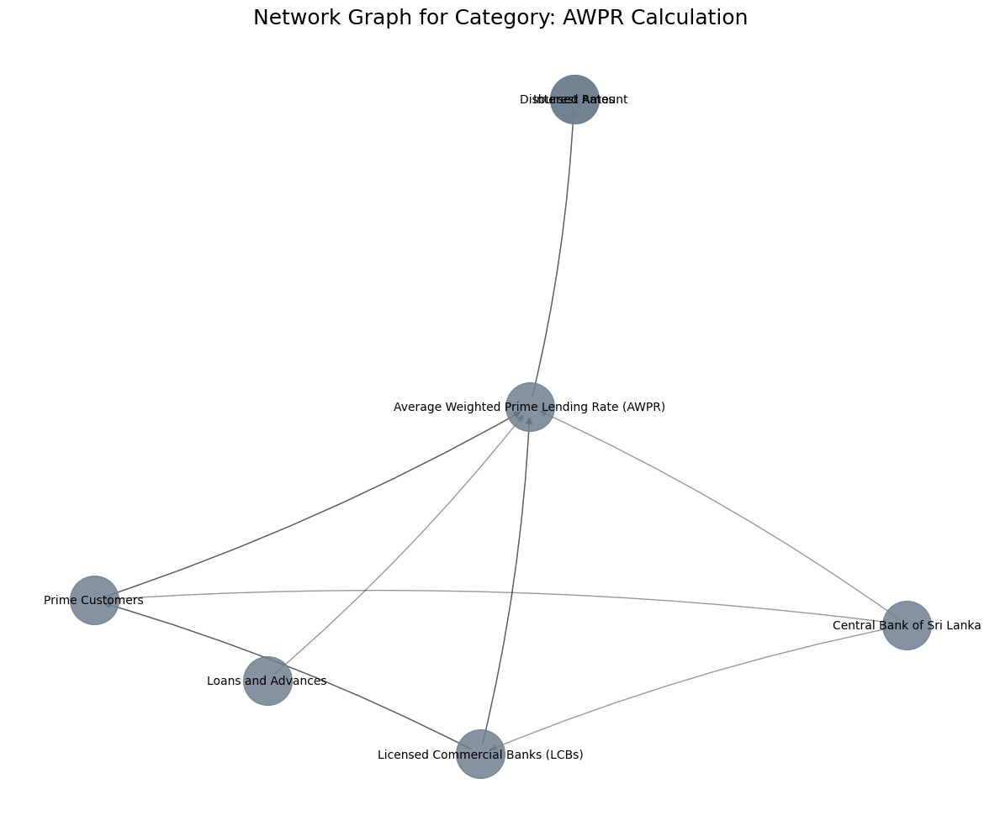


Processing category: Review of Benchmark (Nodes: 6)
  Graph for 'Review of Benchmark' has 6 nodes and 7 edges.


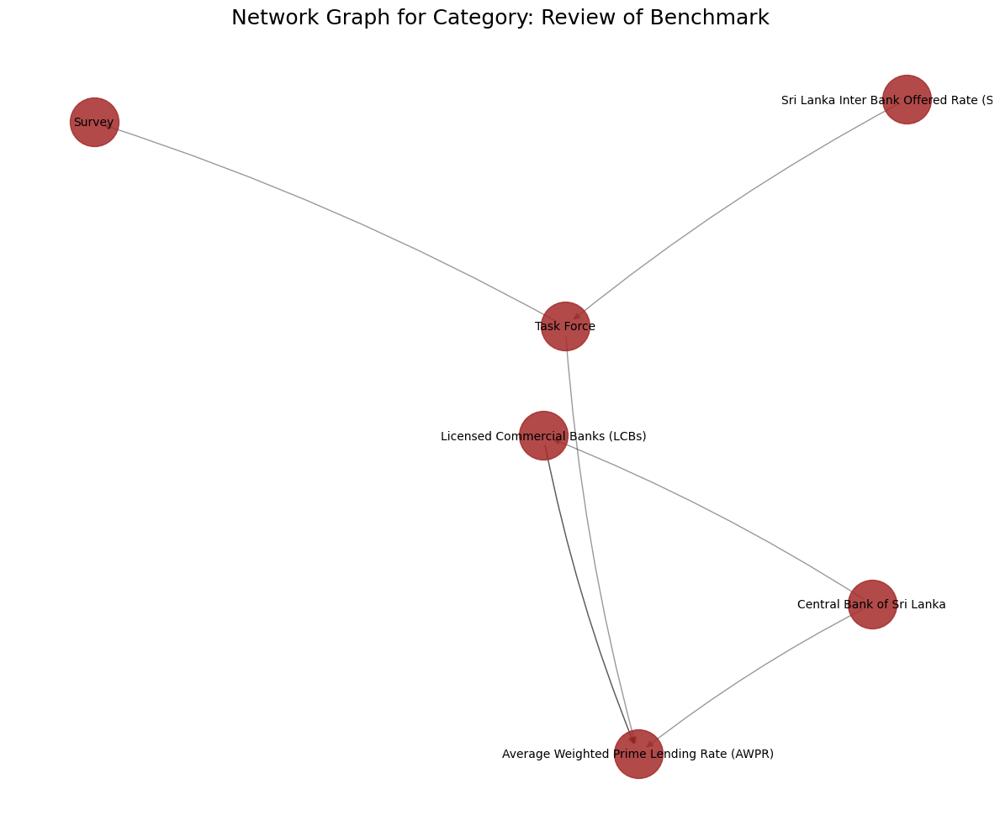


Processing category: AWPR Reporting (Nodes: 20)
  Graph for 'AWPR Reporting' has 20 nodes and 26 edges.


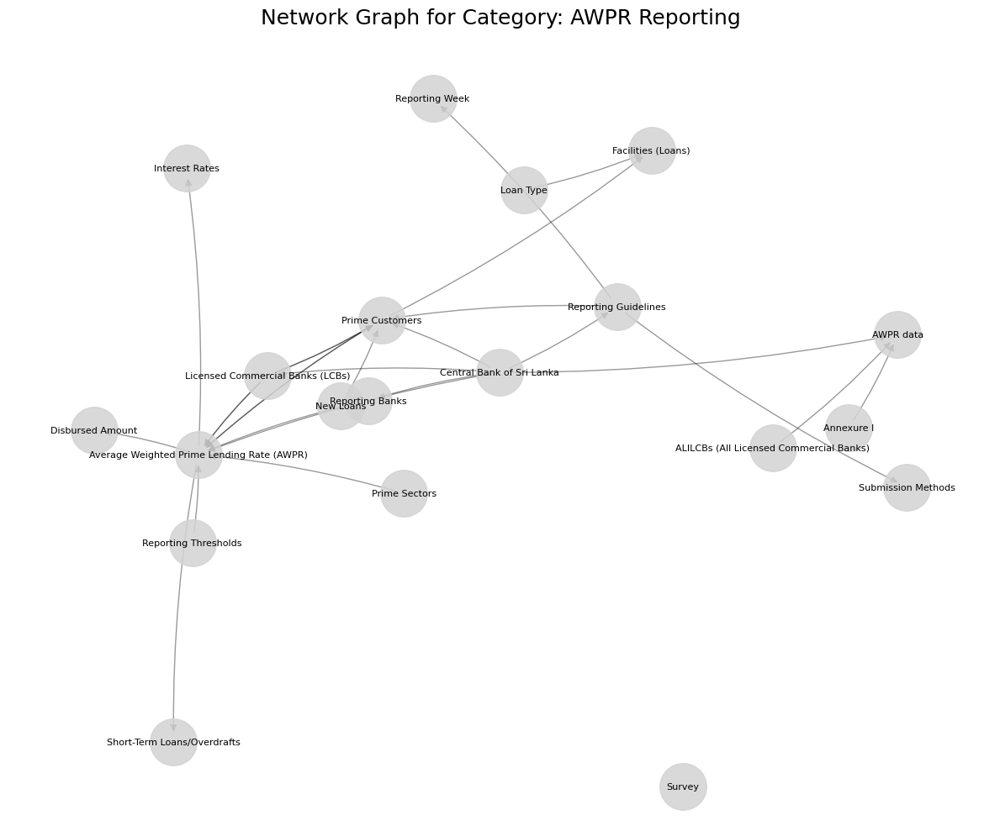


Processing category: Prime Customer (Nodes: 5)
  Graph for 'Prime Customer' has 5 nodes and 10 edges.


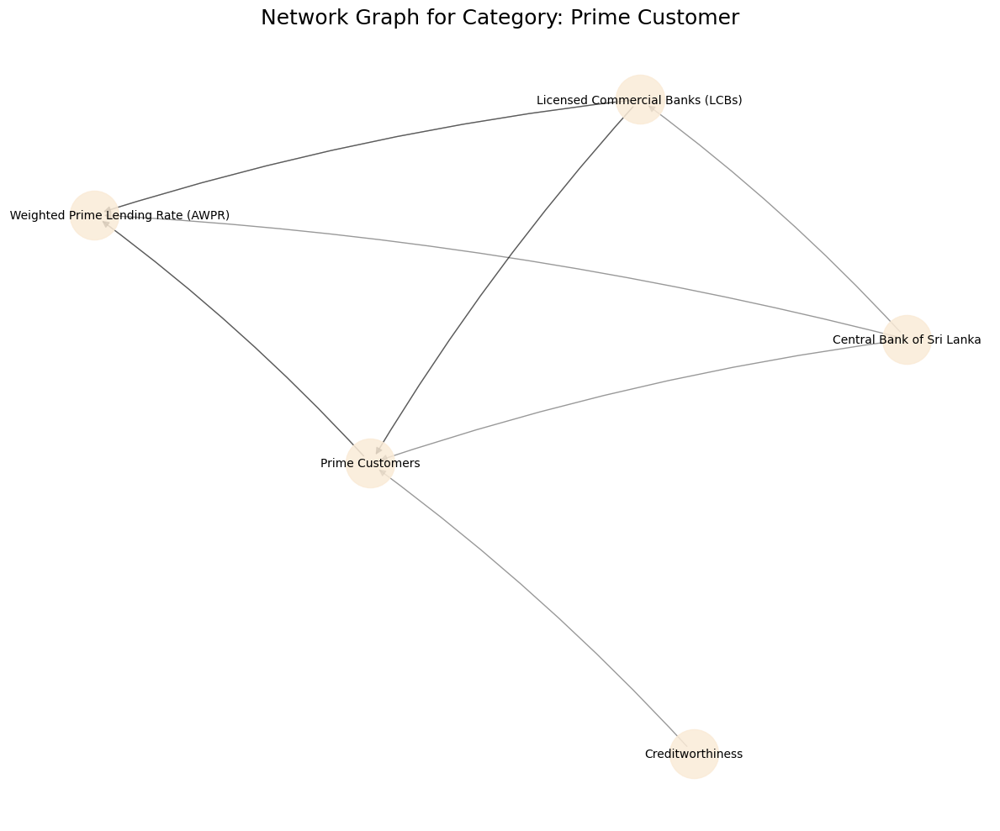


Processing category: Inclusion and (Nodes: 8)
  Graph for 'Inclusion and' has 8 nodes and 7 edges.


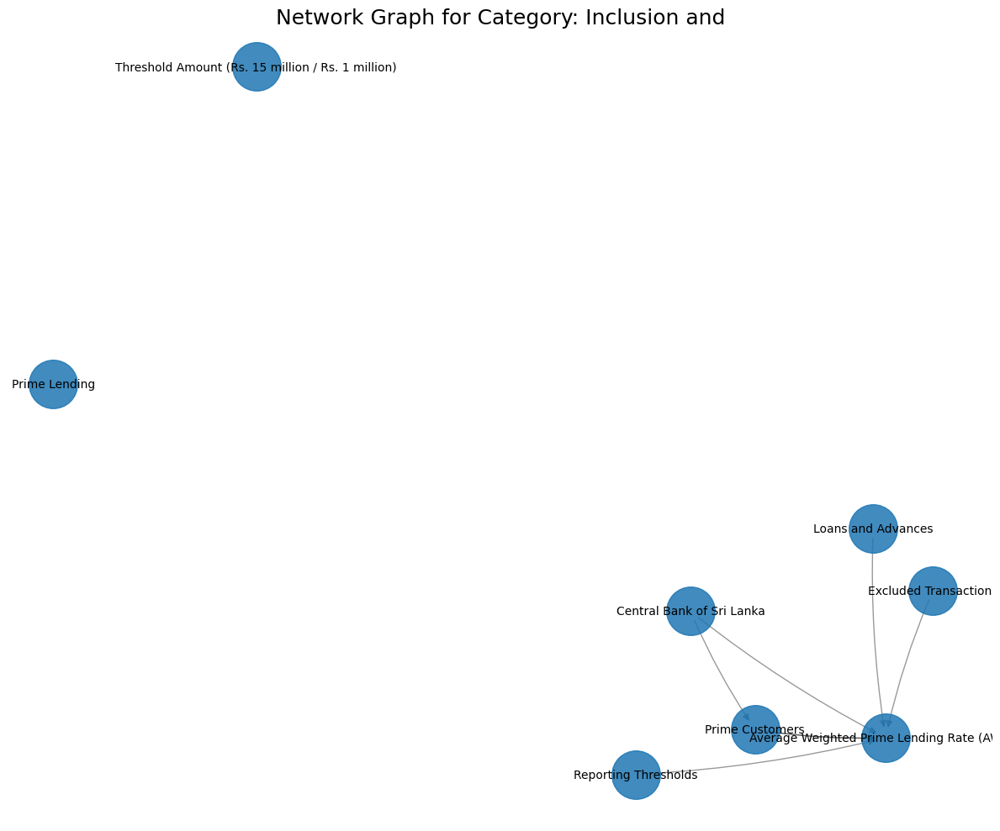


Processing category: Data Usage (Nodes: 5)
  Graph for 'Data Usage' has 5 nodes and 7 edges.


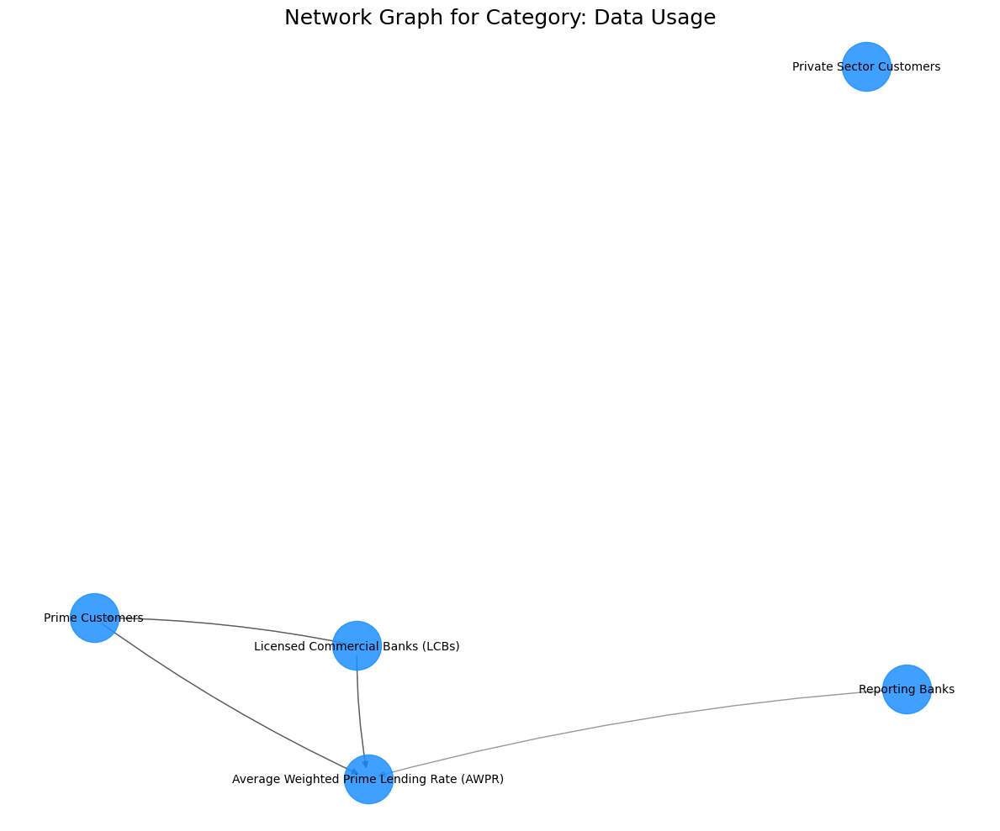


Processing category: Contingency Plan (Nodes: 5)
  Graph for 'Contingency Plan' has 5 nodes and 10 edges.


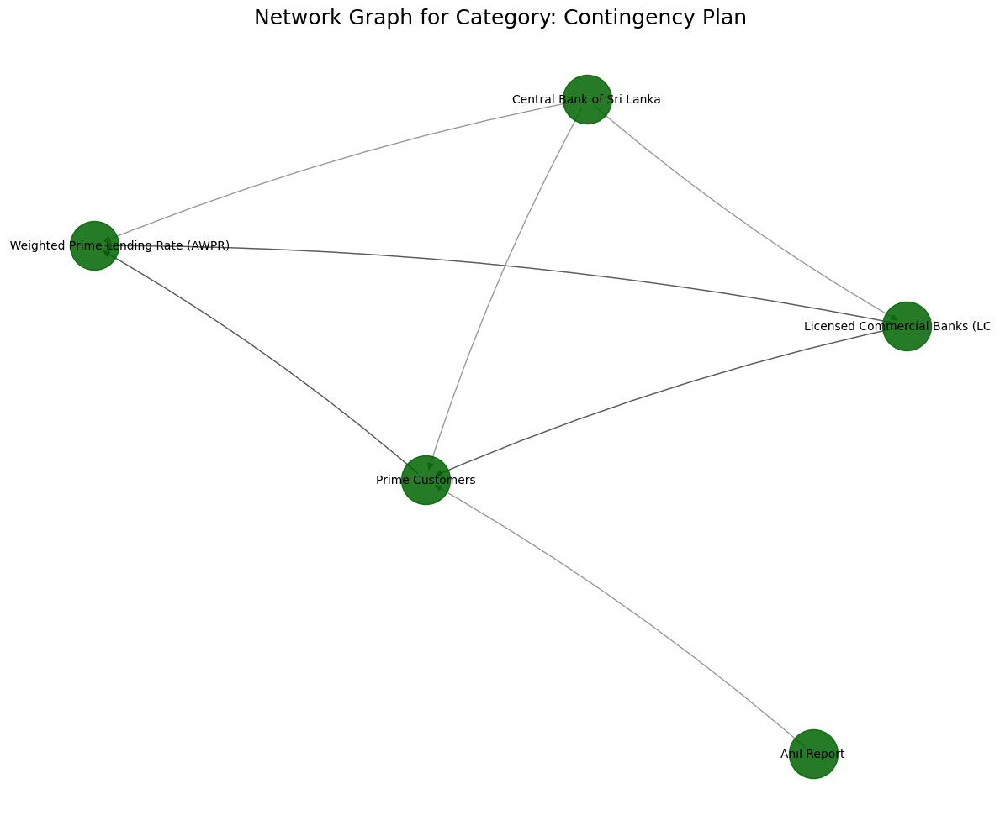


Processing category: Impact of (Nodes: 5)
  Graph for 'Impact of' has 5 nodes and 3 edges.


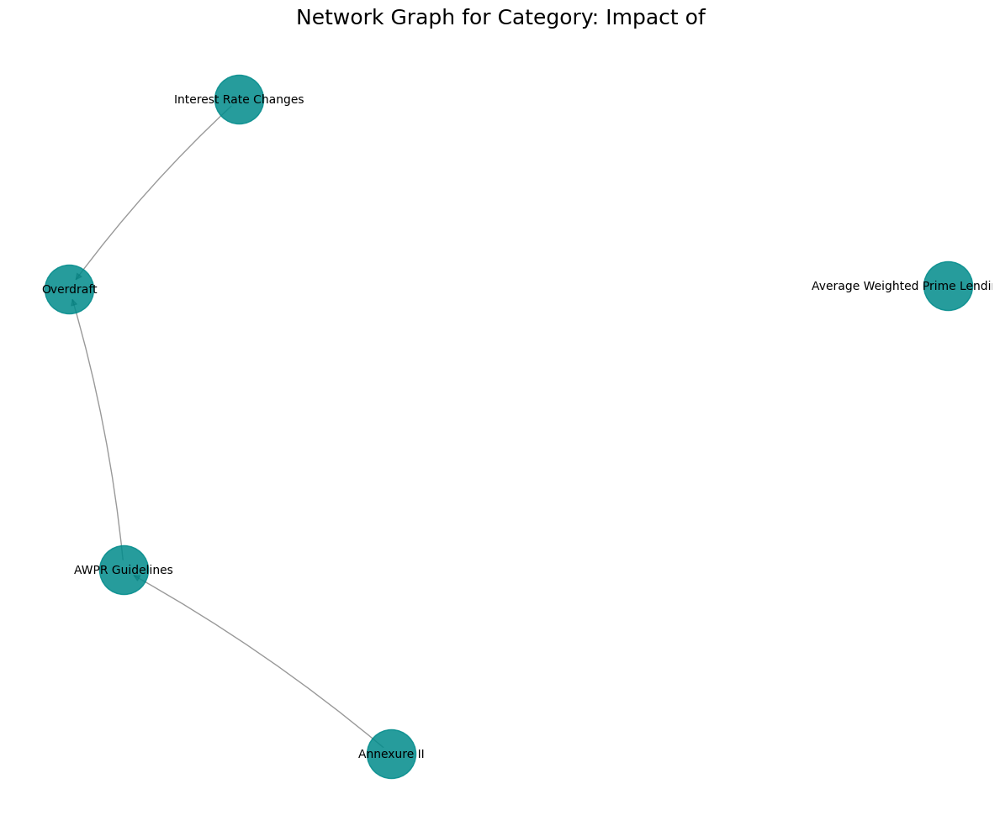


Processing category: AWPR Guidelines (Nodes: 2)
  Graph for 'AWPR Guidelines' has 2 nodes and 0 edges.


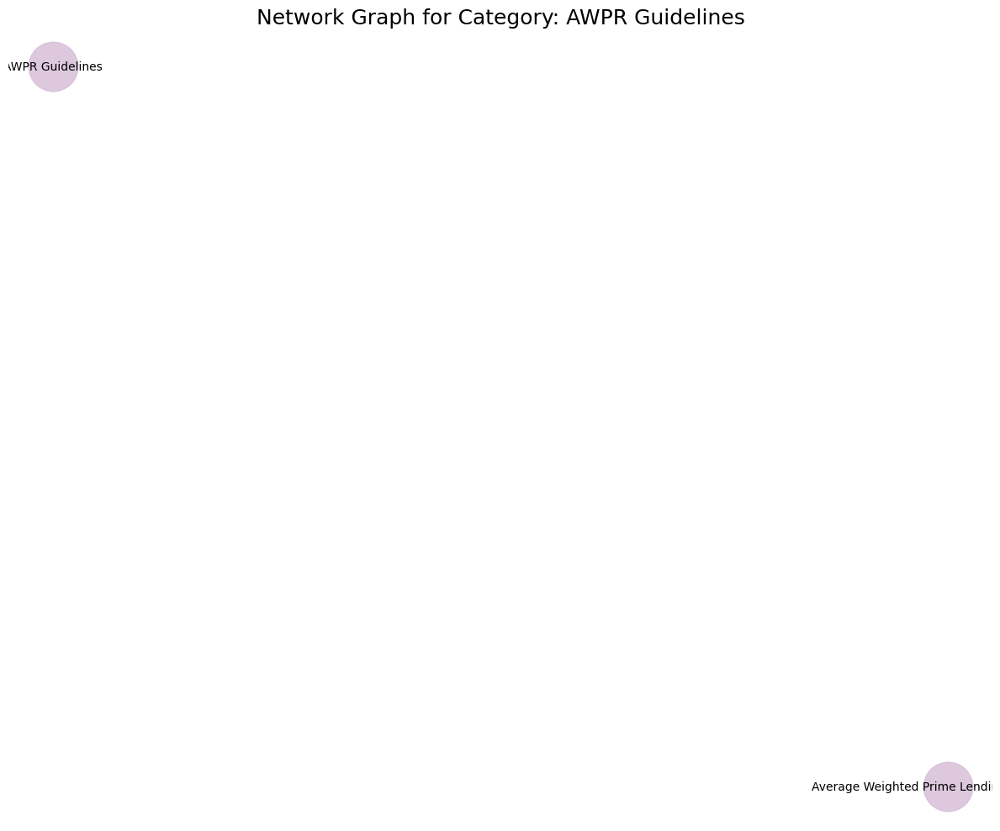


Processing category: Regulatory Context (Nodes: 3)
  Graph for 'Regulatory Context' has 3 nodes and 1 edges.


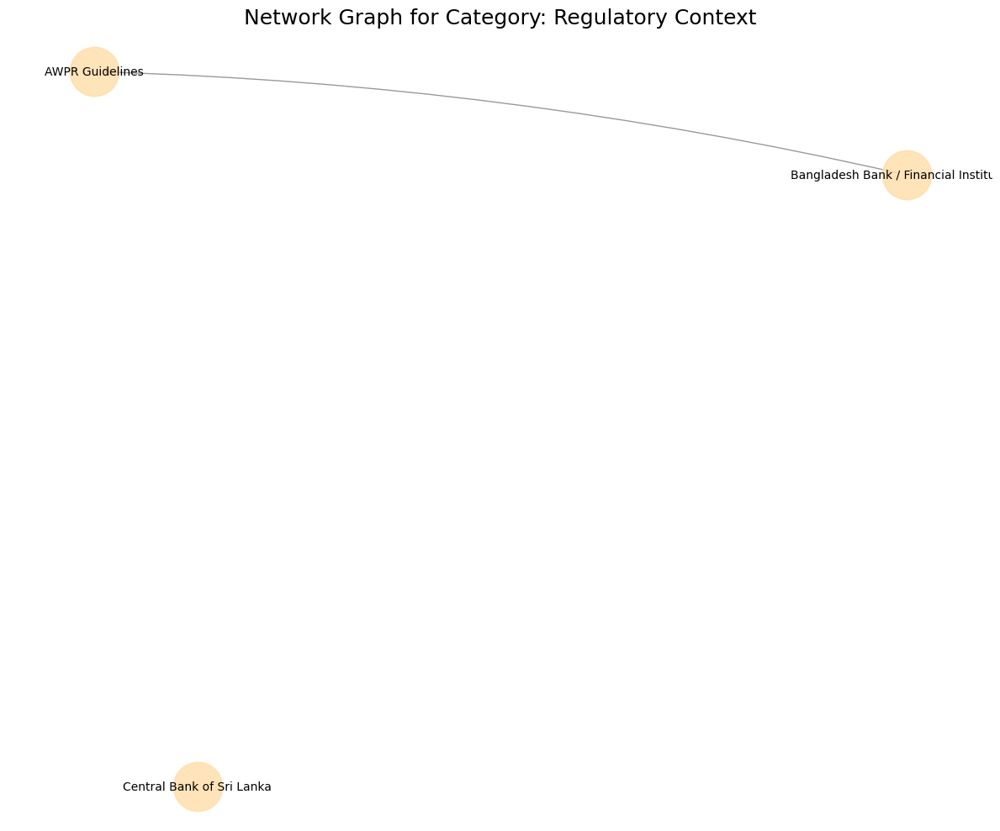


Processing category: Disbursement Reporting (Nodes: 7)
  Graph for 'Disbursement Reporting' has 7 nodes and 5 edges.


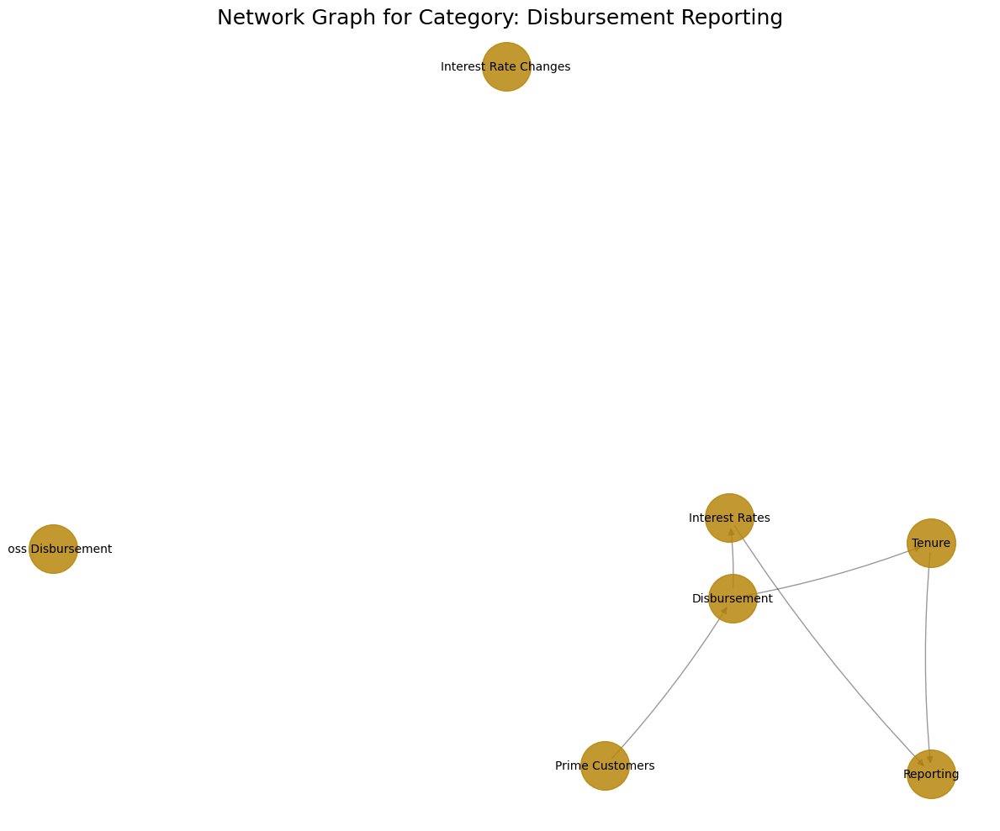


Processing category: Credit Line (Nodes: 9)
  Graph for 'Credit Line' has 9 nodes and 6 edges.


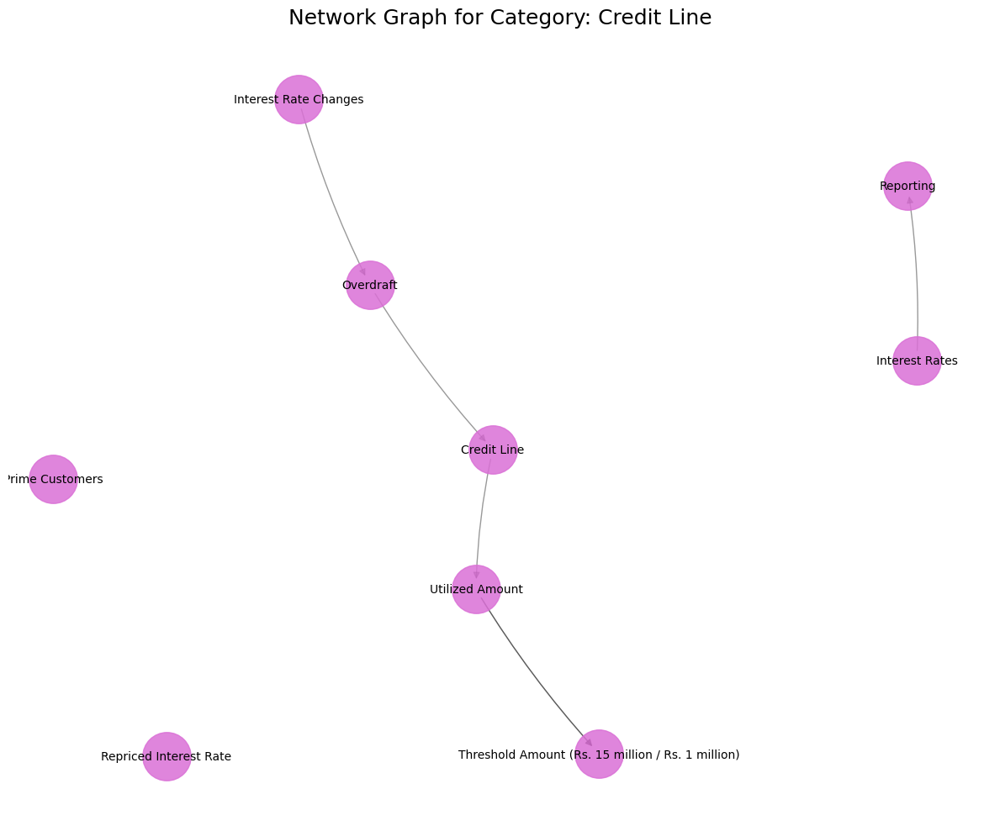


Processing category: Interest Rate (Nodes: 6)
  Graph for 'Interest Rate' has 6 nodes and 4 edges.


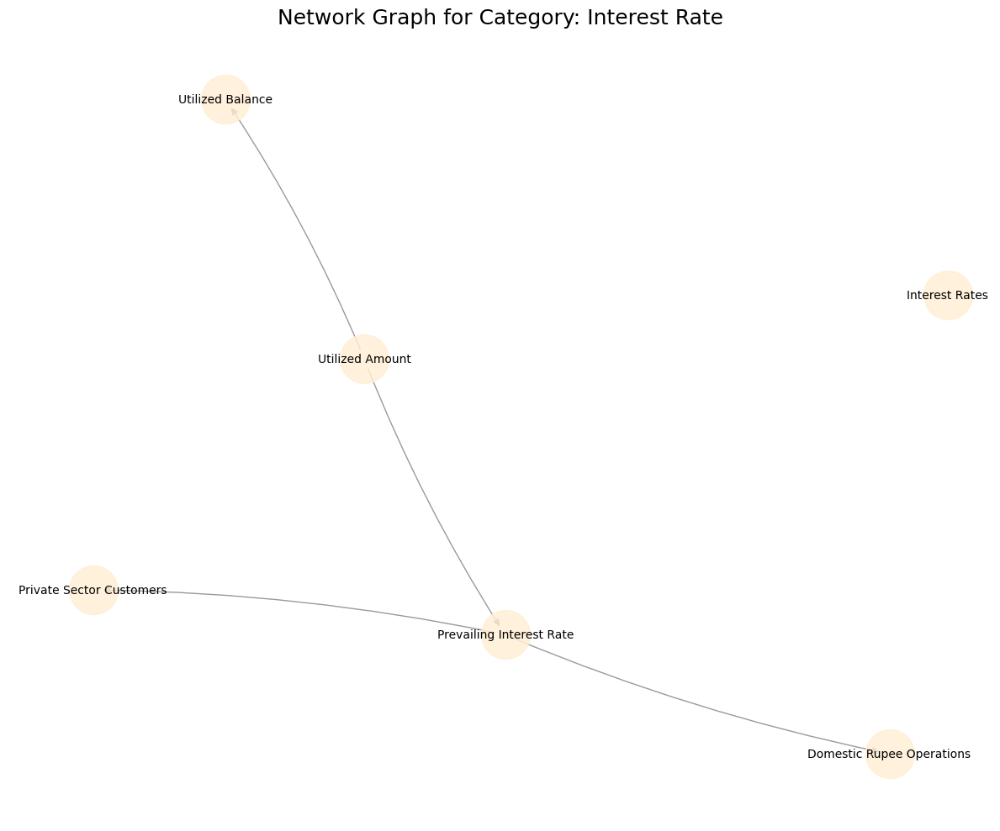


Processing category: Reporting Threshold (Nodes: 4)
  Graph for 'Reporting Threshold' has 4 nodes and 3 edges.


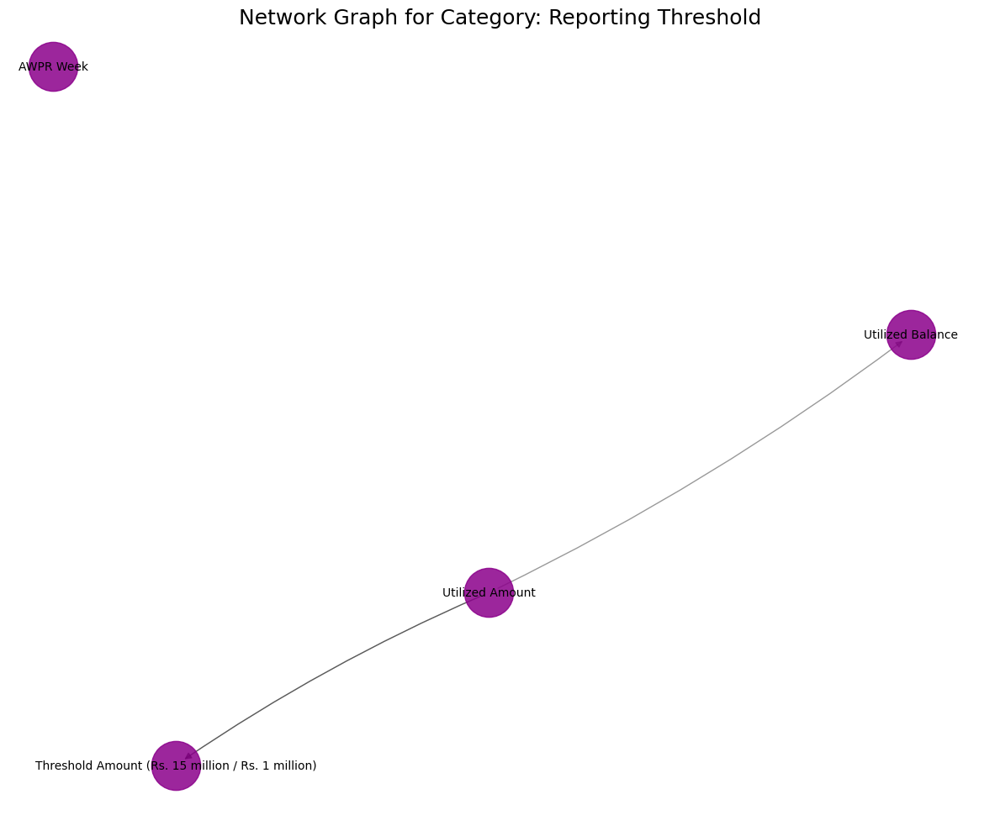


Processing category: Prime Lending (Nodes: 3)
  Graph for 'Prime Lending' has 3 nodes and 2 edges.


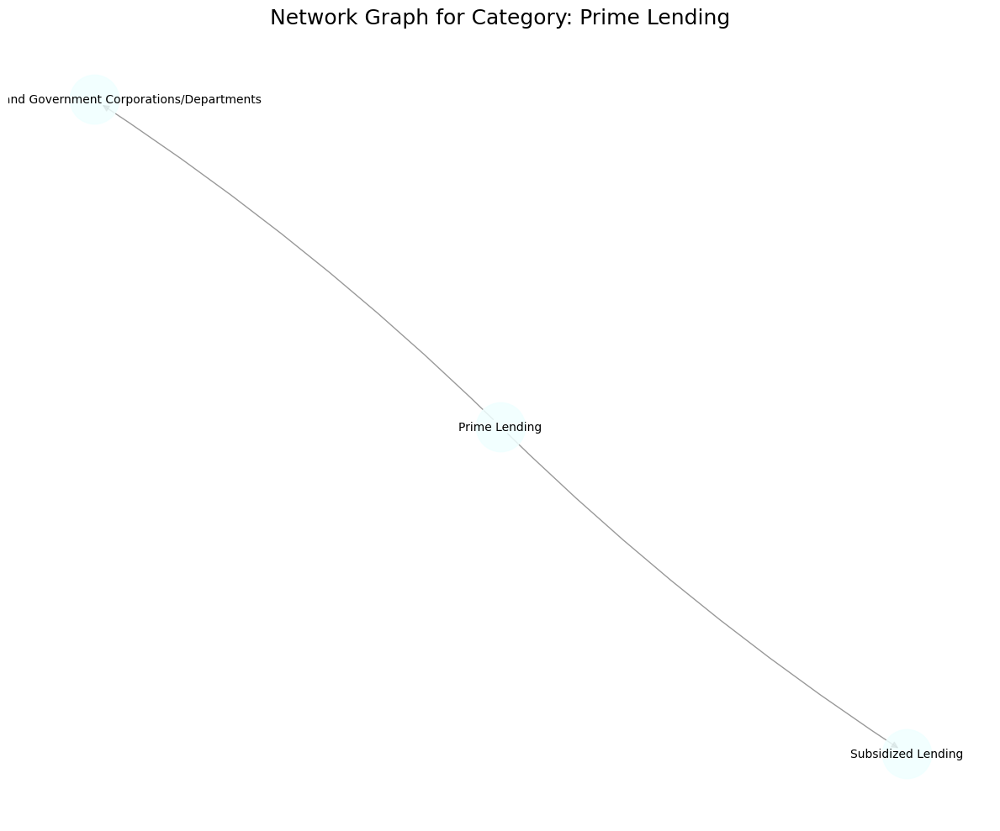


Processing category: Document Structure (Nodes: 2)
  Graph for 'Document Structure' has 2 nodes and 1 edges.


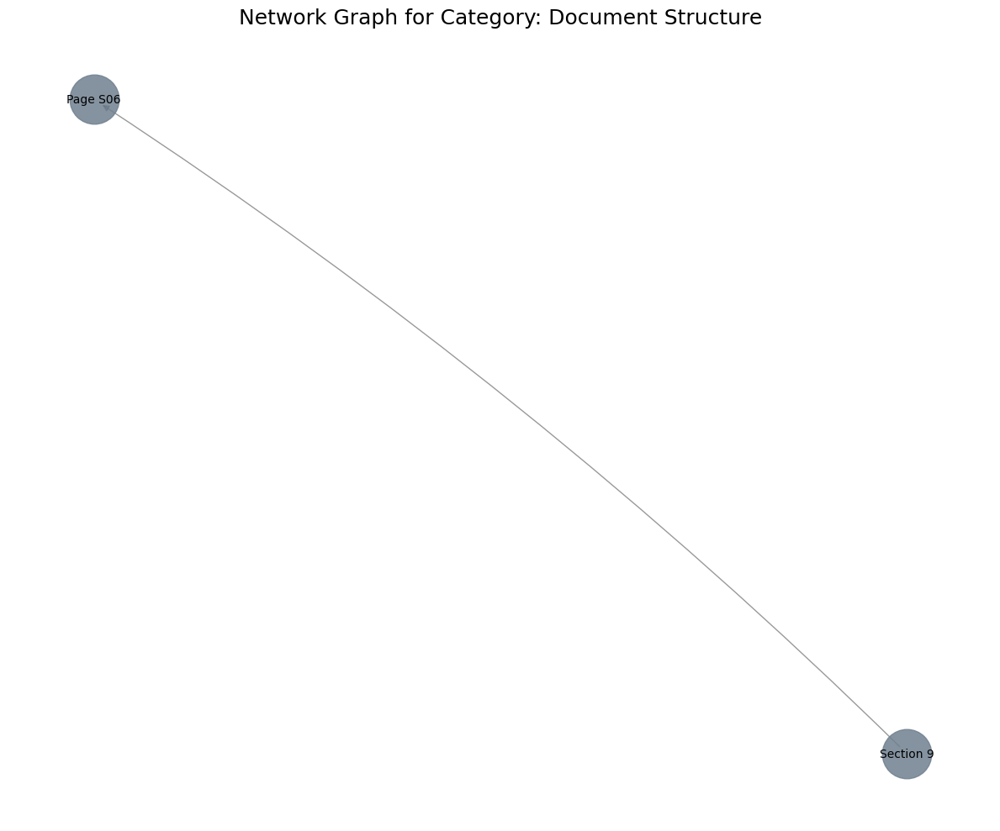

In [162]:
import networkx as nx
import json
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from collections import defaultdict
import random

def create_graph_from_json_data(json_data):
    """
    Creates a NetworkX MultiDiGraph from a JSON object.
    Nodes are expected to have an 'id' and optionally a 'label' and 'category' (list of strings).
    Edges should have 'source', 'target', and 'label' (relationship type).
    """
    if isinstance(json_data, str):
        data = json.loads(json_data)
    else:
        data = json_data

    graph = nx.MultiDiGraph()

    # Add nodes
    for node_info in data.get('nodes', []):
        node_id = node_info.get('id')
        if node_id:
            # Ensure category is a list, default to ['Uncategorized'] if missing or not a list
            categories = node_info.get('category', ['Uncategorized'])
            if not isinstance(categories, list) or not categories:
                categories = ['Uncategorized']
            
            attributes = {
                'label': node_info.get('label', node_id),
                'description': node_info.get('description'),
                'category': categories
            }
            graph.add_node(node_id, **{k: v for k, v in attributes.items() if v is not None})

    # Add edges
    for edge_info in data.get('edges', []):
        source_id = edge_info.get('source')
        target_id = edge_info.get('target')
        edge_key = edge_info.get('label')  # Relationship type
        context = edge_info.get('context')

        if source_id and target_id and edge_key:
            # Ensure nodes exist. If not, add them with default attributes.
            if not graph.has_node(source_id):
                graph.add_node(source_id, label=source_id, category=['Uncategorized'])
            if not graph.has_node(target_id):
                graph.add_node(target_id, label=target_id, category=['Uncategorized'])

            edge_attributes = {'context': context, 'relationship_type': edge_key}
            graph.add_edge(source_id, target_id, key=edge_key, **{k:v for k,v in edge_attributes.items() if v is not None})
            
    return graph

def visualize_category_graph(graph, category_name, category_color='skyblue'):
    """
    Visualizes a single graph, typically representing a specific category.
    Nodes are colored with a specific category_color.
    Focuses on readability.
    """
    if not graph.nodes:
        print(f"Graph for category '{category_name}' has no nodes to visualize.")
        return

    num_nodes = len(graph.nodes())
    plt.figure(figsize=(min(20, max(12, num_nodes * 0.5)), min(18, max(10, num_nodes * 0.4)))) # Dynamic figure size
    
    # Layout: Spring layout is generally good. Adjust k for spread.
    # k controls the optimal distance between nodes.
    # iterations for convergence.
    k_val = 2.0 / (num_nodes**0.5) if num_nodes > 1 else 2.0
    try:
        pos = nx.spring_layout(graph, k=k_val, iterations=max(50, num_nodes * 2), seed=42, scale=2)
        # For very dense small graphs, sometimes fruchterman_reingold works better
        if num_nodes < 20 and graph.number_of_edges() > num_nodes * 1.5:
             pos = nx.kamada_kawai_layout(graph, scale=2)

    except Exception as e: # Fallback for very small or disconnected graphs
        print(f"Layout failed for {category_name}, using simpler spring_layout. Error: {e}")
        pos = nx.spring_layout(graph, k=0.9, iterations=30, seed=42)


    node_labels = {node: graph.nodes[node].get('label', node) for node in graph.nodes()}
    
    # Node drawing parameters
    node_size = max(300, 1800 - num_nodes * 10) if num_nodes < 150 else 300
    font_size = max(6, 10 - num_nodes // 10) if num_nodes < 80 else 6
    
    nx.draw_networkx_nodes(graph, pos, node_color=category_color, node_size=node_size, alpha=0.85)
    nx.draw_networkx_edges(graph, pos, alpha=0.4, width=1.0, arrowsize=12, connectionstyle='arc3,rad=0.05')
    nx.draw_networkx_labels(graph, pos, labels=node_labels, font_size=font_size, font_weight='normal')

    plt.title(f"Network Graph for Category: {category_name}", fontsize=18)
    plt.axis('off')
    plt.tight_layout()
    plt.show()

def create_and_visualize_graphs_by_category(main_graph):
    """
    Creates and visualizes separate graphs for each category.
    A node can belong to multiple categories and will appear in each respective graph.
    """
    if not main_graph.nodes:
        print("Main graph has no nodes. Cannot create category-specific graphs.")
        return

    # 1. Group nodes by each of their categories
    nodes_by_category = defaultdict(set) # Use set to avoid duplicate nodes within a category
    all_categories = set()

    for node, data in main_graph.nodes(data=True):
        node_categories = data.get('category', ['Uncategorized'])
        if not isinstance(node_categories, list) or not node_categories: # Ensure it's a list and not empty
            node_categories = ['Uncategorized']
        for cat in node_categories:
            nodes_by_category[cat].add(node)
            all_categories.add(cat)

    if not all_categories:
        print("No categories found in the graph nodes.")
        return

    # Generate distinct colors for categories
    unique_categories = sorted(list(all_categories))
    
    # More diverse color palette
    base_colors = list(mcolors.TABLEAU_COLORS.values()) + \
                  list(mcolors.CSS4_COLORS.values()) # Using CSS4 for more variety
    random.shuffle(base_colors) # Shuffle to get more distinct colors early on

    if len(unique_categories) > len(base_colors):
        for _ in range(len(unique_categories) - len(base_colors)):
            base_colors.append("#"+''.join([random.choice('0123456789ABCDEF') for _ in range(6)]))
    
    category_to_color = {cat: base_colors[i % len(base_colors)] for i, cat in enumerate(unique_categories)}
    if 'Uncategorized' not in category_to_color:
        category_to_color['Uncategorized'] = '#CCCCCC'
    else:
        category_to_color['Uncategorized'] = category_to_color.get('Uncategorized', '#CCCCCC')


    print(f"\nFound categories: {', '.join(unique_categories)}")

    # 2. For each category, create and visualize a subgraph
    for category_name, category_node_ids in nodes_by_category.items():
        print(f"\nProcessing category: {category_name} (Nodes: {len(category_node_ids)})")
        
        category_graph = nx.MultiDiGraph()
        
        # Add nodes of the current category
        for node_id in category_node_ids:
            if main_graph.has_node(node_id): # Ensure node exists in main_graph
                 category_graph.add_node(node_id, **main_graph.nodes[node_id])
            
        # Add edges where both source and target nodes are in the current category_node_ids set
        for u, v, k, data in main_graph.edges(keys=True, data=True):
            if u in category_node_ids and v in category_node_ids:
                category_graph.add_edge(u, v, key=k, **data)
        
        if category_graph.number_of_nodes() > 0:
            print(f"  Graph for '{category_name}' has {category_graph.number_of_nodes()} nodes and {category_graph.number_of_edges()} edges.")
            visualize_category_graph(category_graph, category_name, category_color=category_to_color.get(category_name, '#AAAAAA'))
        else:
            print(f"  No nodes or only isolated nodes for category '{category_name}' after filtering. Skipping visualization or graph is empty.")


if __name__ == "__main__":
    json_file_path = "/Users/shirsama/dtcc-hackathon/dtcc-ai-hackathon-2025/graph_json/combined_extracted_text_modified.json" # Replace with your actual path
    
    try:
        with open(json_file_path, 'r') as f:
            graph_data = json.load(f)
        
        print(f"Successfully loaded JSON data from: {json_file_path}")
        
        main_graph = create_graph_from_json_data(graph_data)
        print(f"Main graph created with {main_graph.number_of_nodes()} nodes and {main_graph.number_of_edges()} edges.")

        # Verify category parsing for a few nodes
        # count = 0
        # for node_id, data in main_graph.nodes(data=True):
        #     if count < 5:
        #         print(f"Node ID: {node_id}, Categories: {data.get('category')}")
        #         count += 1
        #     else:
        #         break
        
        create_and_visualize_graphs_by_category(main_graph)
        
    except FileNotFoundError:
        print(f"Error: The file '{json_file_path}' was not found.")
    except json.JSONDecodeError:
        print(f"Error: Could not decode JSON from the file '{json_file_path}'. Please check its format.")
    except Exception as e:
        print(f"An unexpected error occurred: {e}")
        import traceback
        traceback.print_exc()

Successfully loaded JSON data from: /Users/shirsama/dtcc-hackathon/dtcc-ai-hackathon-2025/graph_json/AWPR Version 1_text.json
Main graph created with 43 nodes and 38 edges.

Found categories: AWPR Calculation, AWPR Calculation Methodology, AWPR Reporting, AWPR Reporting Process, Data Accuracy, Data Requirements, Definition and Identification, Illustrative Examples, Loan Inclusion, Regulatory Context, Reporting Requirements, Uncategorized

Processing category: AWPR Reporting Process (Nodes: 10)
  Graph for 'AWPR Reporting Process' has 10 nodes and 8 edges.


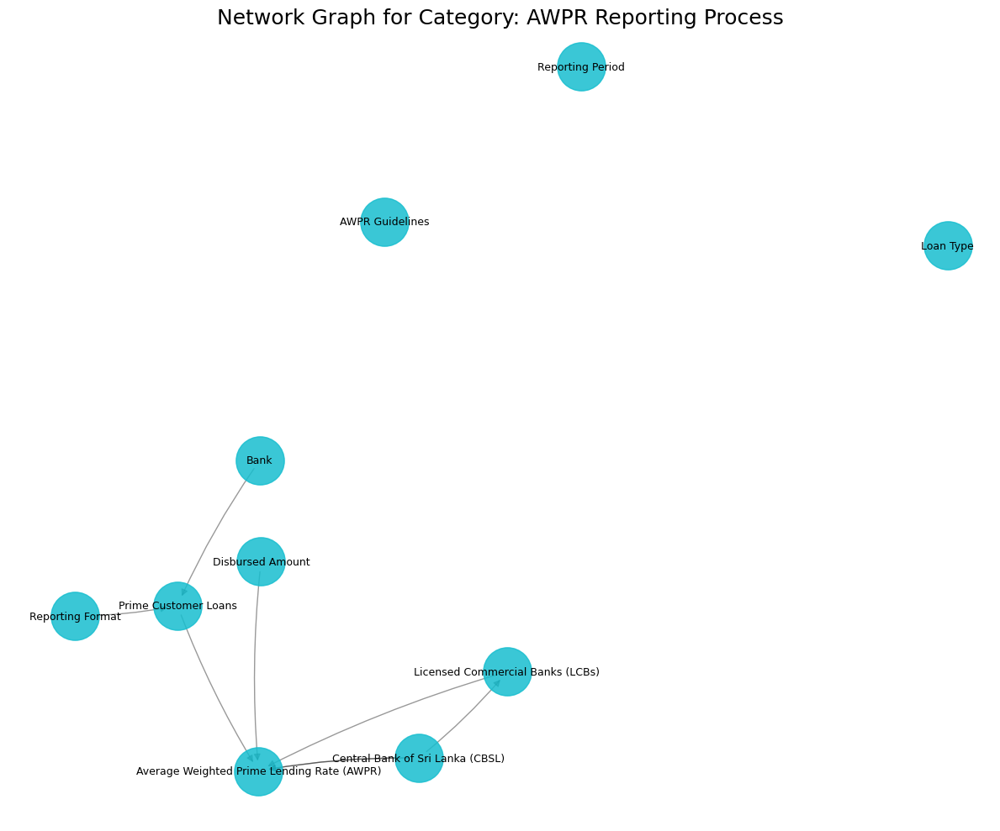


Processing category: Data Requirements (Nodes: 5)
  Graph for 'Data Requirements' has 5 nodes and 5 edges.


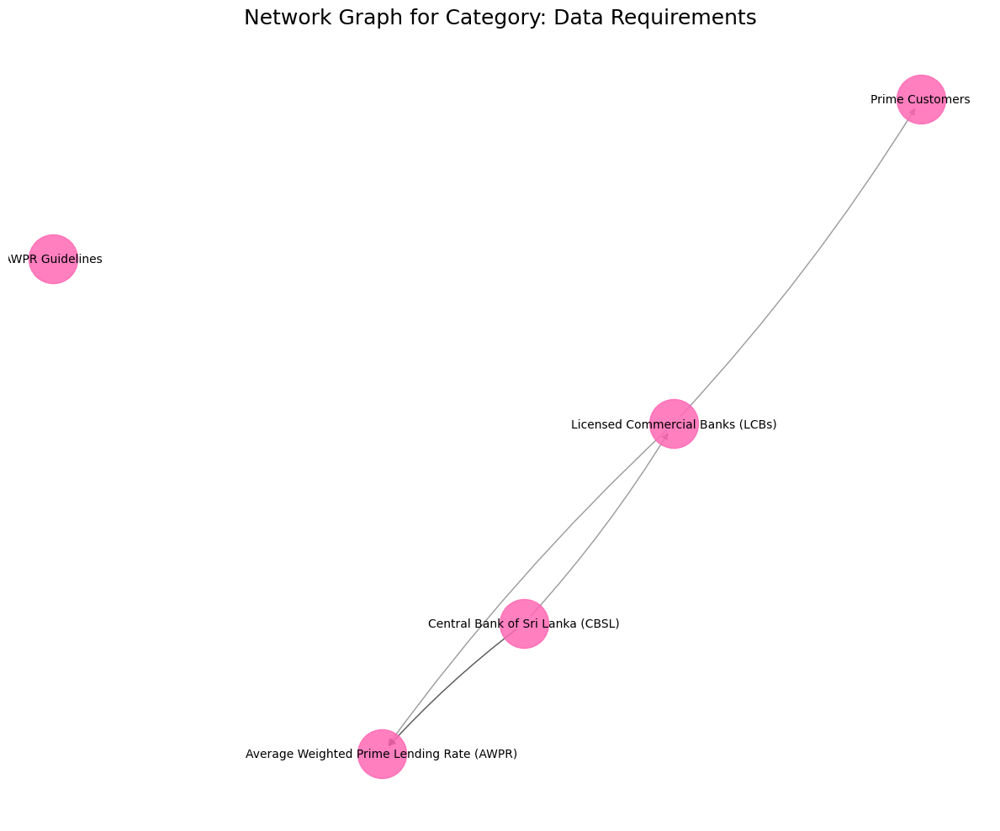


Processing category: AWPR Calculation Methodology (Nodes: 8)
  Graph for 'AWPR Calculation Methodology' has 8 nodes and 6 edges.


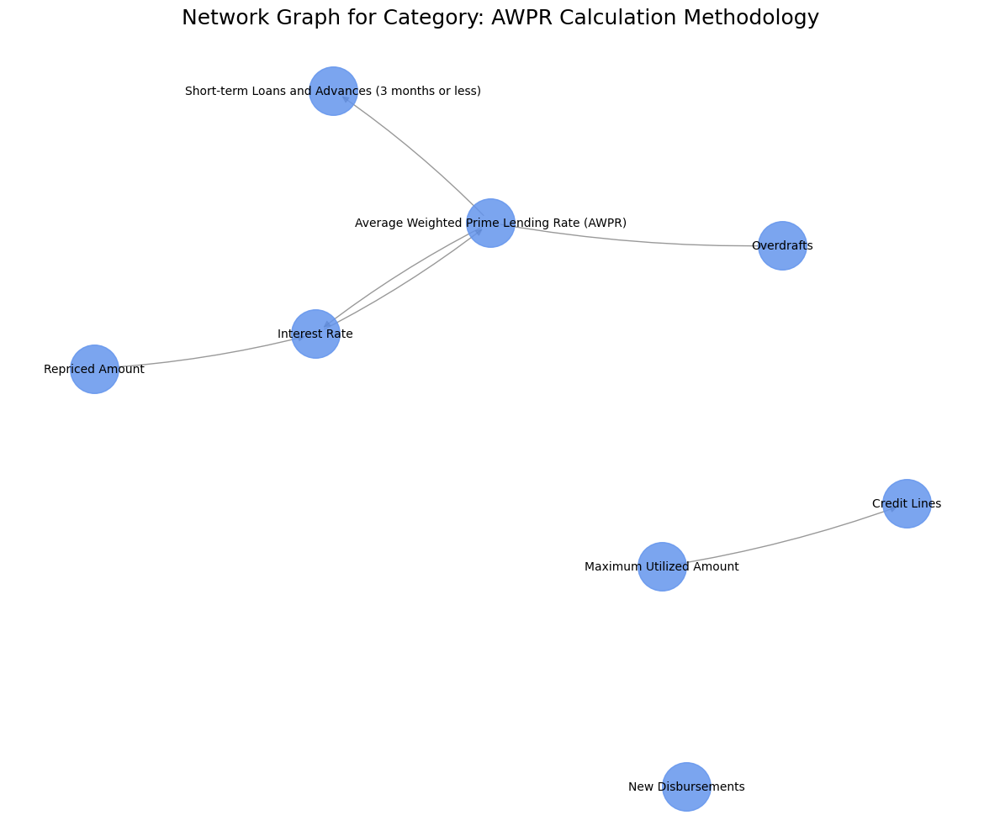


Processing category: Loan Inclusion (Nodes: 5)
  Graph for 'Loan Inclusion' has 5 nodes and 1 edges.


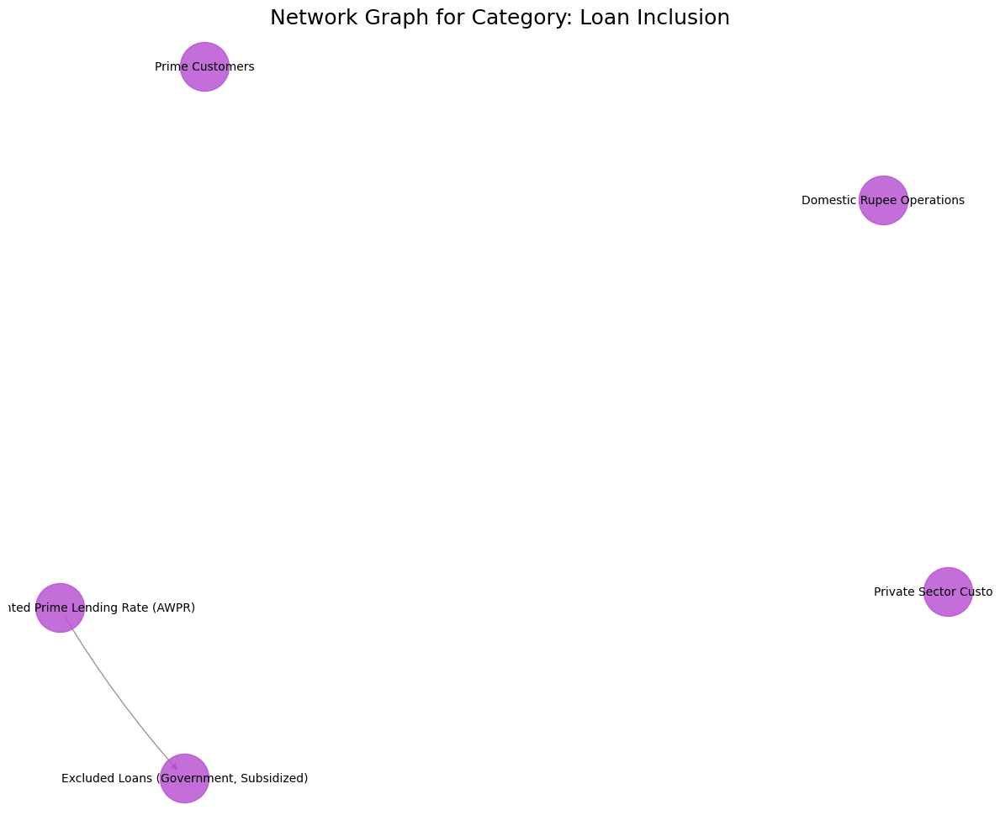


Processing category: Reporting Requirements (Nodes: 10)
  Graph for 'Reporting Requirements' has 10 nodes and 12 edges.


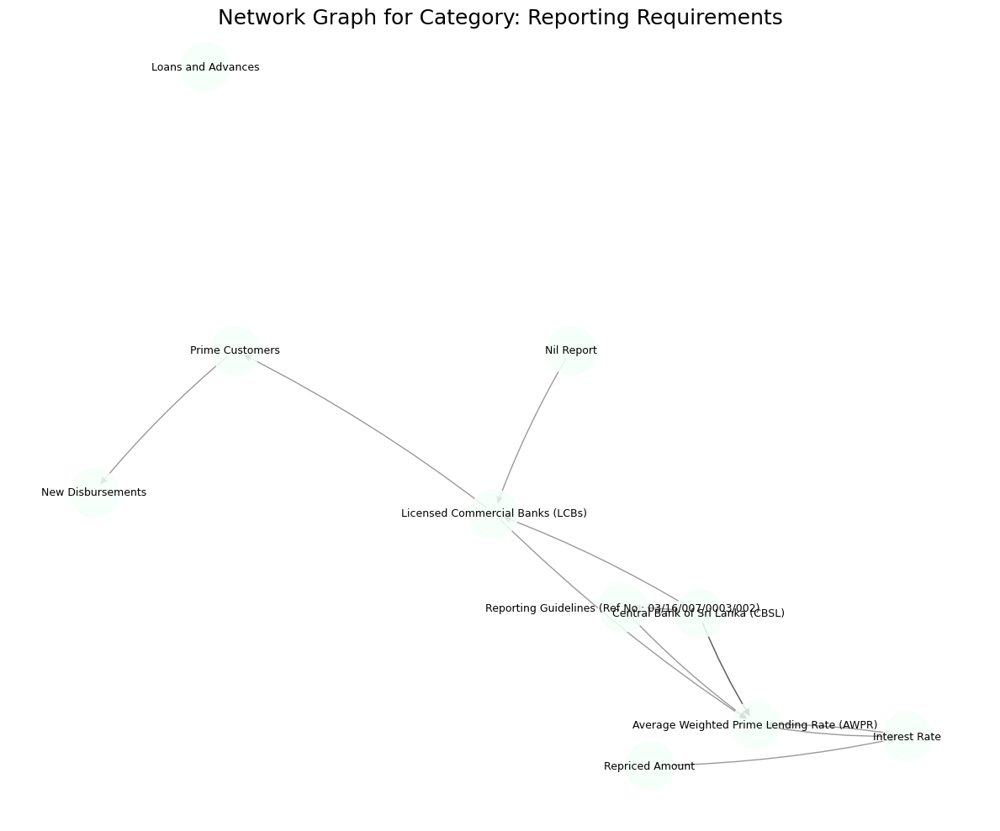


Processing category: AWPR Calculation (Nodes: 14)
  Graph for 'AWPR Calculation' has 14 nodes and 15 edges.


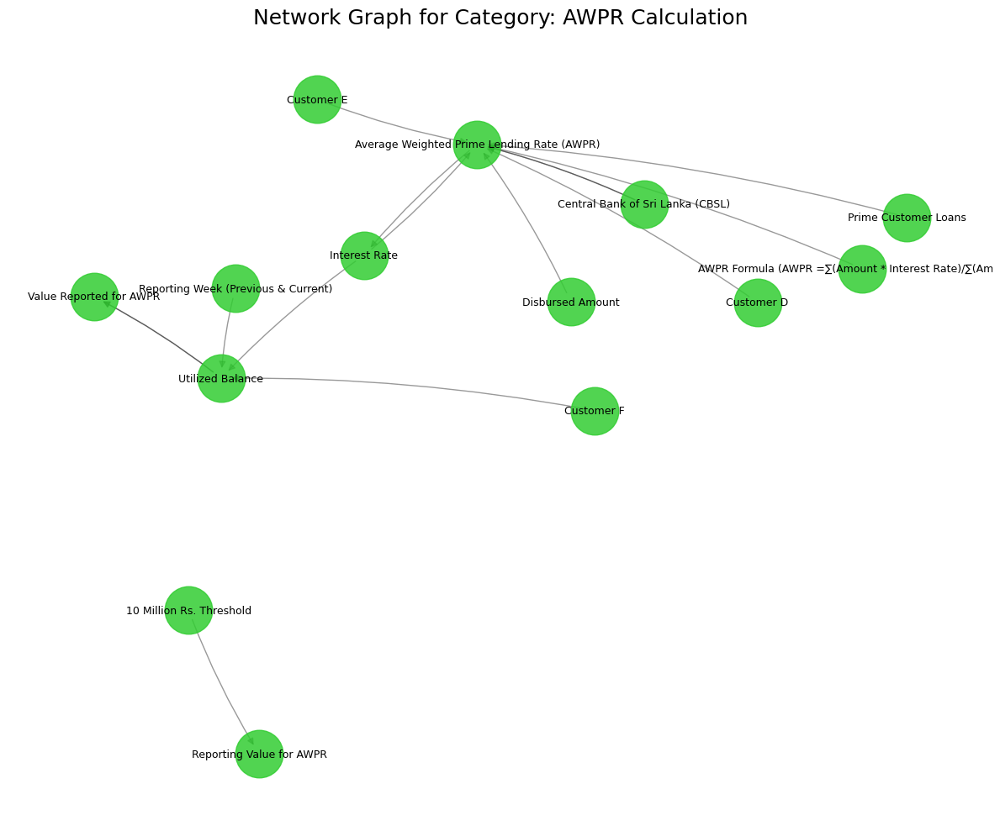


Processing category: AWPR Reporting (Nodes: 7)
  Graph for 'AWPR Reporting' has 7 nodes and 4 edges.


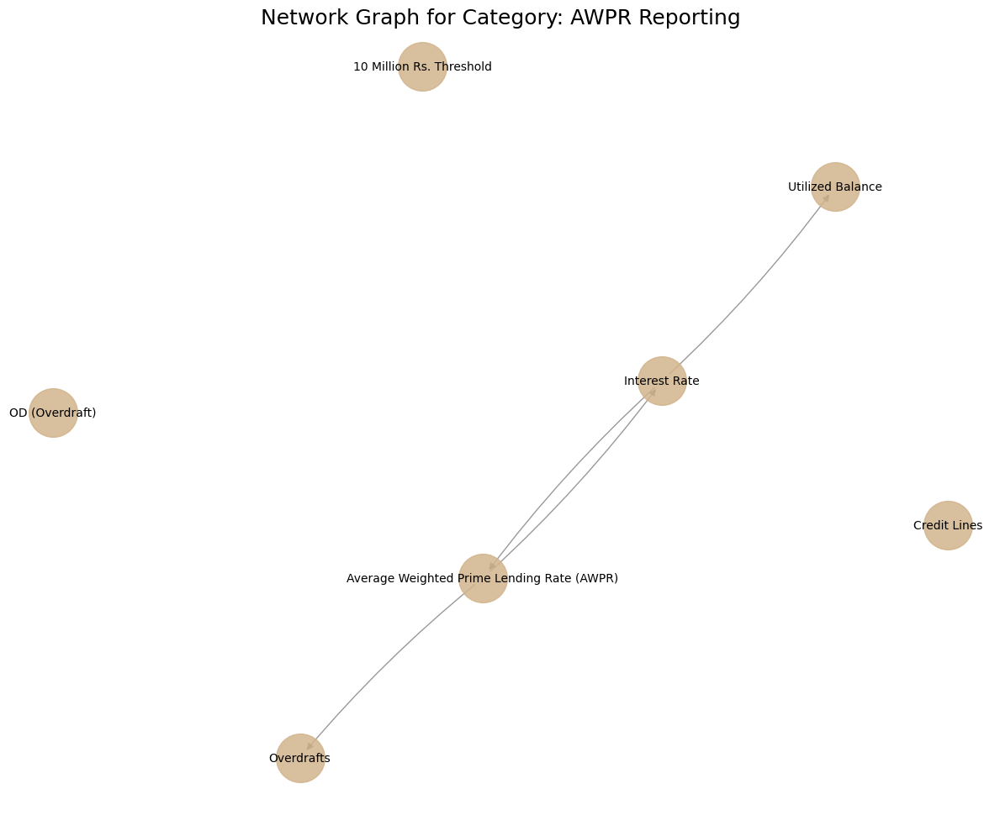


Processing category: Definition and Identification (Nodes: 3)
  Graph for 'Definition and Identification' has 3 nodes and 2 edges.


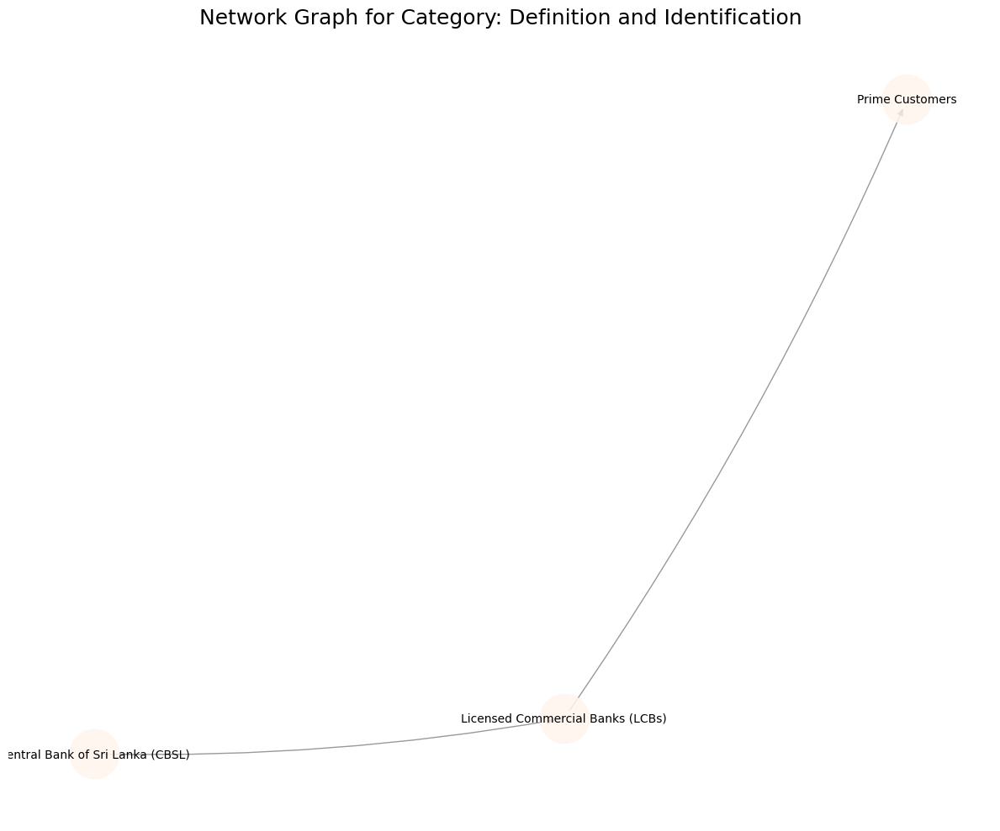


Processing category: Data Accuracy (Nodes: 2)
  Graph for 'Data Accuracy' has 2 nodes and 1 edges.


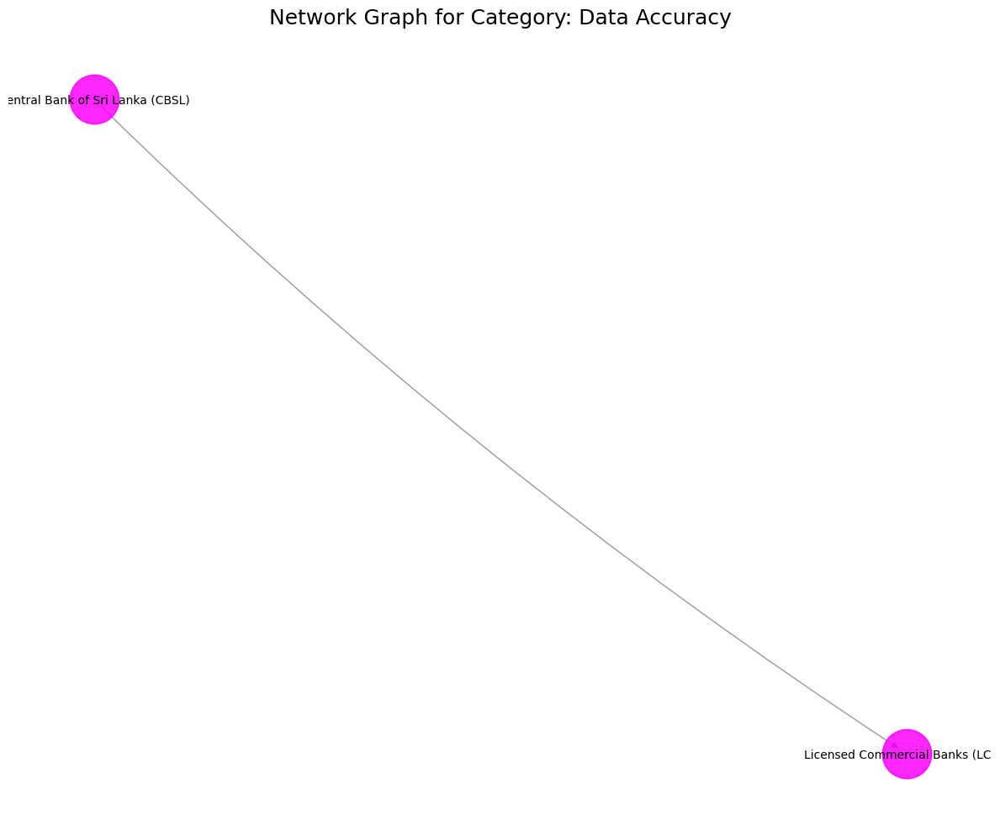


Processing category: Regulatory Context (Nodes: 2)
  Graph for 'Regulatory Context' has 2 nodes and 1 edges.


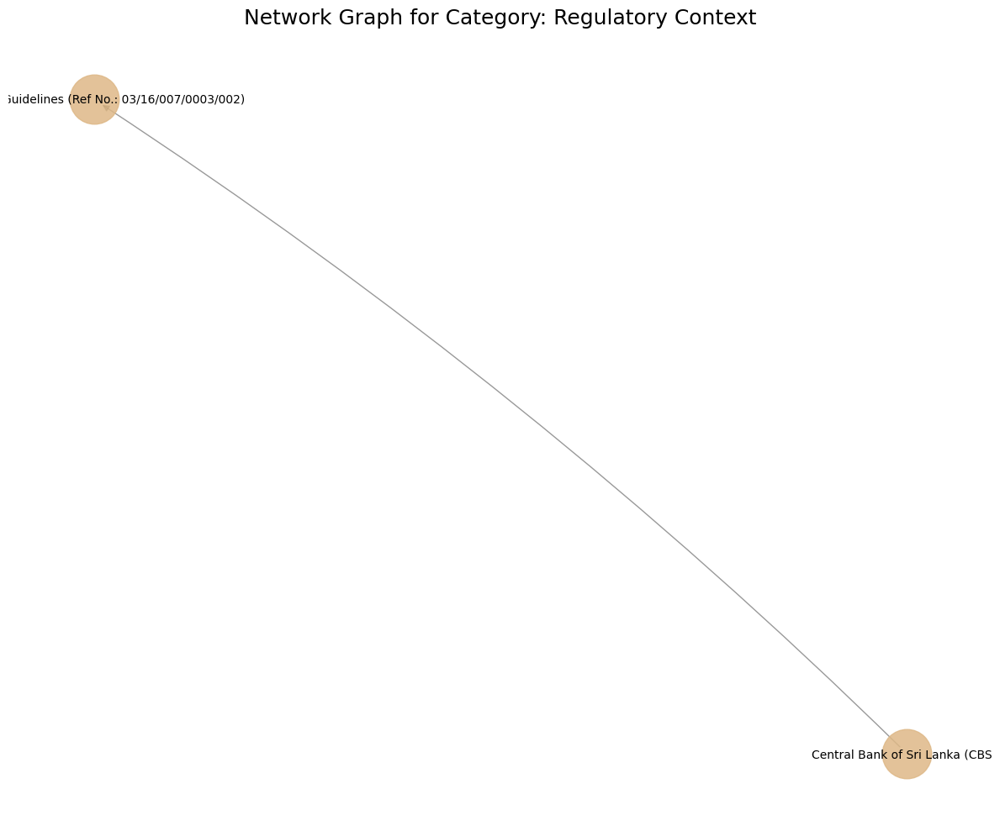


Processing category: Uncategorized (Nodes: 8)
  Graph for 'Uncategorized' has 8 nodes and 1 edges.


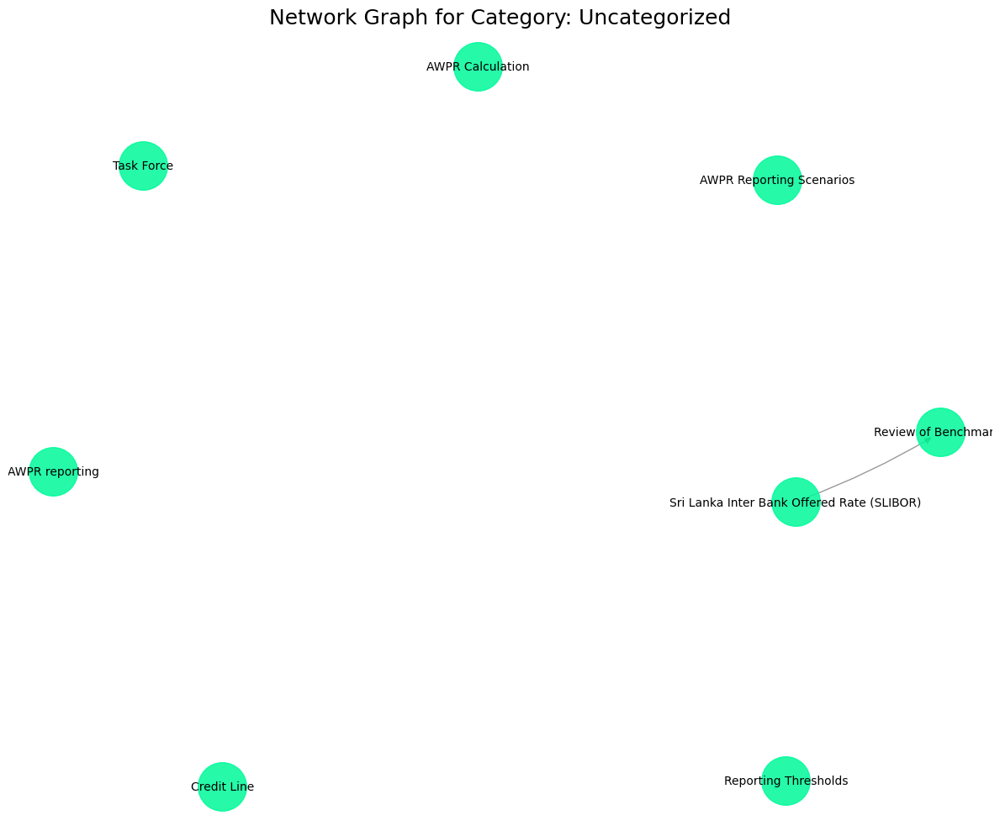


Processing category: Illustrative Examples (Nodes: 1)
  Graph for 'Illustrative Examples' has 1 nodes and 0 edges.


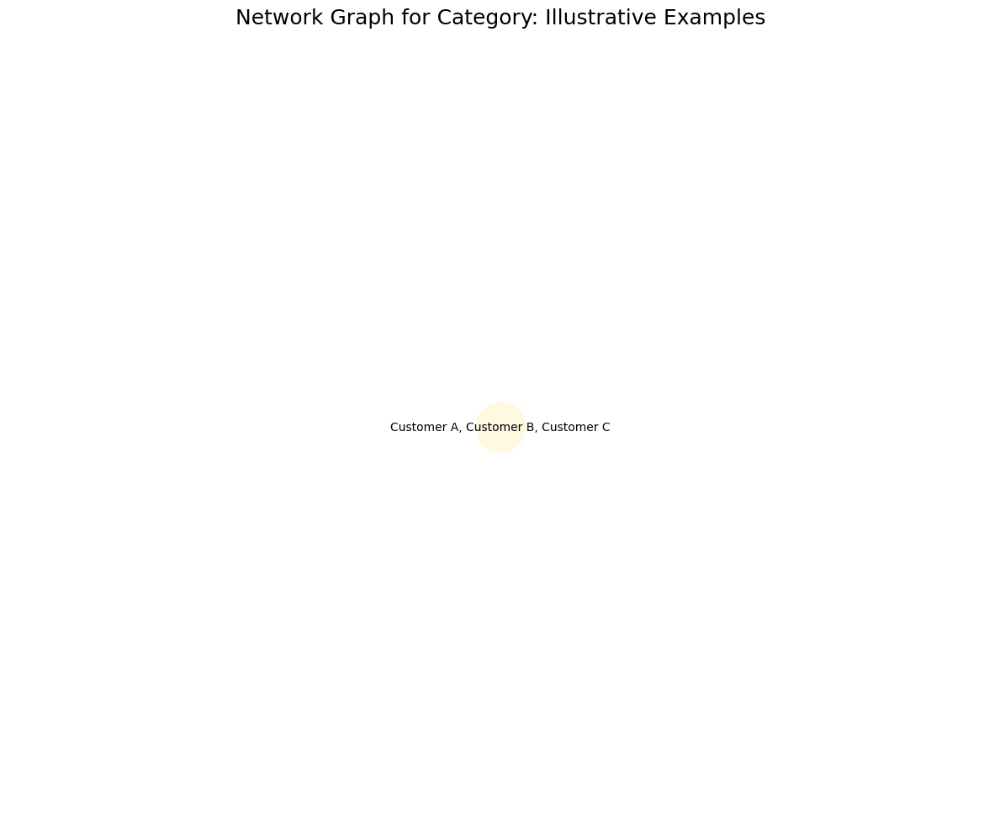

In [167]:
import networkx as nx
import json
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from collections import defaultdict
import random

def create_graph_from_json_data(json_data):
    """
    Creates a NetworkX MultiDiGraph from a JSON object.
    Nodes are expected to have an 'id' and optionally a 'label' and 'category' (list of strings).
    Edges should have 'source', 'target', and 'label' (relationship type).
    """
    if isinstance(json_data, str):
        data = json.loads(json_data)
    else:
        data = json_data

    graph = nx.MultiDiGraph()

    # Add nodes
    for node_info in data.get('nodes', []):
        node_id = node_info.get('id')
        if node_id:
            # Ensure category is a list, default to ['Uncategorized'] if missing or not a list
            categories = node_info.get('category', ['Uncategorized'])
            if not isinstance(categories, list) or not categories:
                categories = ['Uncategorized']
            
            attributes = {
                'label': node_info.get('label', node_id),
                'description': node_info.get('description'),
                'category': categories
            }
            graph.add_node(node_id, **{k: v for k, v in attributes.items() if v is not None})

    # Add edges
    for edge_info in data.get('edges', []):
        source_id = edge_info.get('source')
        target_id = edge_info.get('target')
        edge_key = edge_info.get('label')  # Relationship type
        context = edge_info.get('context')

        if source_id and target_id and edge_key:
            # Ensure nodes exist. If not, add them with default attributes.
            if not graph.has_node(source_id):
                graph.add_node(source_id, label=source_id, category=['Uncategorized'])
            if not graph.has_node(target_id):
                graph.add_node(target_id, label=target_id, category=['Uncategorized'])

            edge_attributes = {'context': context, 'relationship_type': edge_key}
            graph.add_edge(source_id, target_id, key=edge_key, **{k:v for k,v in edge_attributes.items() if v is not None})
            
    return graph

def visualize_category_graph(graph, category_name, category_color='skyblue'):
    """
    Visualizes a single graph, typically representing a specific category.
    Nodes are colored with a specific category_color.
    Focuses on readability.
    """
    if not graph.nodes:
        print(f"Graph for category '{category_name}' has no nodes to visualize.")
        return

    num_nodes = len(graph.nodes())
    plt.figure(figsize=(min(20, max(12, num_nodes * 0.5)), min(18, max(10, num_nodes * 0.4)))) # Dynamic figure size
    
    # Layout: Spring layout is generally good. Adjust k for spread.
    # k controls the optimal distance between nodes.
    # iterations for convergence.
    k_val = 2.0 / (num_nodes**0.5) if num_nodes > 1 else 2.0
    try:
        pos = nx.spring_layout(graph, k=k_val, iterations=max(50, num_nodes * 2), seed=42, scale=2)
        # For very dense small graphs, sometimes fruchterman_reingold works better
        if num_nodes < 20 and graph.number_of_edges() > num_nodes * 1.5:
             pos = nx.kamada_kawai_layout(graph, scale=2)

    except Exception as e: # Fallback for very small or disconnected graphs
        print(f"Layout failed for {category_name}, using simpler spring_layout. Error: {e}")
        pos = nx.spring_layout(graph, k=0.9, iterations=30, seed=42)


    node_labels = {node: graph.nodes[node].get('label', node) for node in graph.nodes()}
    
    # Node drawing parameters
    node_size = max(300, 1800 - num_nodes * 10) if num_nodes < 150 else 300
    font_size = max(6, 10 - num_nodes // 10) if num_nodes < 80 else 6
    
    nx.draw_networkx_nodes(graph, pos, node_color=category_color, node_size=node_size, alpha=0.85)
    nx.draw_networkx_edges(graph, pos, alpha=0.4, width=1.0, arrowsize=12, connectionstyle='arc3,rad=0.05')
    nx.draw_networkx_labels(graph, pos, labels=node_labels, font_size=font_size, font_weight='normal')

    plt.title(f"Network Graph for Category: {category_name}", fontsize=18)
    plt.axis('off')
    plt.tight_layout()
    plt.show()

def create_and_visualize_graphs_by_category(main_graph):
    """
    Creates and visualizes separate graphs for each category.
    A node can belong to multiple categories and will appear in each respective graph.
    """
    if not main_graph.nodes:
        print("Main graph has no nodes. Cannot create category-specific graphs.")
        return

    # 1. Group nodes by each of their categories
    nodes_by_category = defaultdict(set) # Use set to avoid duplicate nodes within a category
    all_categories = set()

    for node, data in main_graph.nodes(data=True):
        node_categories = data.get('category', ['Uncategorized'])
        if not isinstance(node_categories, list) or not node_categories: # Ensure it's a list and not empty
            node_categories = ['Uncategorized']
        for cat in node_categories:
            nodes_by_category[cat].add(node)
            all_categories.add(cat)

    if not all_categories:
        print("No categories found in the graph nodes.")
        return

    # Generate distinct colors for categories
    unique_categories = sorted(list(all_categories))
    
    # More diverse color palette
    base_colors = list(mcolors.TABLEAU_COLORS.values()) + \
                  list(mcolors.CSS4_COLORS.values()) # Using CSS4 for more variety
    random.shuffle(base_colors) # Shuffle to get more distinct colors early on

    if len(unique_categories) > len(base_colors):
        for _ in range(len(unique_categories) - len(base_colors)):
            base_colors.append("#"+''.join([random.choice('0123456789ABCDEF') for _ in range(6)]))
    
    category_to_color = {cat: base_colors[i % len(base_colors)] for i, cat in enumerate(unique_categories)}
    if 'Uncategorized' not in category_to_color:
        category_to_color['Uncategorized'] = '#CCCCCC'
    else:
        category_to_color['Uncategorized'] = category_to_color.get('Uncategorized', '#CCCCCC')


    print(f"\nFound categories: {', '.join(unique_categories)}")

    # 2. For each category, create and visualize a subgraph
    for category_name, category_node_ids in nodes_by_category.items():
        print(f"\nProcessing category: {category_name} (Nodes: {len(category_node_ids)})")
        
        category_graph = nx.MultiDiGraph()
        
        # Add nodes of the current category
        for node_id in category_node_ids:
            if main_graph.has_node(node_id): # Ensure node exists in main_graph
                 category_graph.add_node(node_id, **main_graph.nodes[node_id])
            
        # Add edges where both source and target nodes are in the current category_node_ids set
        for u, v, k, data in main_graph.edges(keys=True, data=True):
            if u in category_node_ids and v in category_node_ids:
                category_graph.add_edge(u, v, key=k, **data)
        
        if category_graph.number_of_nodes() > 0:
            print(f"  Graph for '{category_name}' has {category_graph.number_of_nodes()} nodes and {category_graph.number_of_edges()} edges.")
            visualize_category_graph(category_graph, category_name, category_color=category_to_color.get(category_name, '#AAAAAA'))
        else:
            print(f"  No nodes or only isolated nodes for category '{category_name}' after filtering. Skipping visualization or graph is empty.")


if __name__ == "__main__":
    json_file_path = "/Users/shirsama/dtcc-hackathon/dtcc-ai-hackathon-2025/graph_json/AWPR Version 1_text.json" # Replace with your actual path
    
    try:
        with open(json_file_path, 'r') as f:
            graph_data = json.load(f)
        
        print(f"Successfully loaded JSON data from: {json_file_path}")
        
        main_graph = create_graph_from_json_data(graph_data)
        print(f"Main graph created with {main_graph.number_of_nodes()} nodes and {main_graph.number_of_edges()} edges.")

        # Verify category parsing for a few nodes
        # count = 0
        # for node_id, data in main_graph.nodes(data=True):
        #     if count < 5:
        #         print(f"Node ID: {node_id}, Categories: {data.get('category')}")
        #         count += 1
        #     else:
        #         break
        
        create_and_visualize_graphs_by_category(main_graph)
        
    except FileNotFoundError:
        print(f"Error: The file '{json_file_path}' was not found.")
    except json.JSONDecodeError:
        print(f"Error: Could not decode JSON from the file '{json_file_path}'. Please check its format.")
    except Exception as e:
        print(f"An unexpected error occurred: {e}")
        import traceback
        traceback.print_exc()

In [186]:
import networkx as nx
import json
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from collections import defaultdict
import random

def create_graph_from_json_data(json_data):
    """
    Creates a NetworkX MultiDiGraph from a JSON object.
    Nodes are expected to have an 'id' and optionally a 'label' and 'category' (list of strings).
    Edges should have 'source', 'target', and 'label' (relationship type).
    """
    if isinstance(json_data, str):
        data = json.loads(json_data)
    else:
        data = json_data

    graph = nx.MultiDiGraph()

    # Add nodes
    for node_info in data.get('nodes', []):
        node_id = node_info.get('id')
        if node_id:
            # Ensure category is a list, default to ['Uncategorized'] if missing or not a list
            categories = node_info.get('category', ['Uncategorized'])
            if not isinstance(categories, list) or not categories:
                categories = ['Uncategorized']
            
            attributes = {
                'label': node_info.get('label', node_id),
                'description': node_info.get('description'),
                'category': categories
            }
            graph.add_node(node_id, **{k: v for k, v in attributes.items() if v is not None})

    # Add edges
    for edge_info in data.get('edges', []):
        source_id = edge_info.get('source')
        target_id = edge_info.get('target')
        edge_key = edge_info.get('label')  # Relationship type
        context = edge_info.get('context')

        if source_id and target_id and edge_key:
            # Ensure nodes exist. If not, add them with default attributes.
            if not graph.has_node(source_id):
                graph.add_node(source_id, label=source_id, category=['Uncategorized'])
            if not graph.has_node(target_id):
                graph.add_node(target_id, label=target_id, category=['Uncategorized'])

            edge_attributes = {'context': context, 'relationship_type': edge_key}
            graph.add_edge(source_id, target_id, key=edge_key, **{k:v for k,v in edge_attributes.items() if v is not None})
            
    return graph

def visualize_category_graph(graph, category_name, category_color='skyblue'):
    """
    Visualizes a single graph, typically representing a specific category.
    Nodes are colored with a specific category_color.
    Focuses on readability.
    """
    if not graph.nodes:
        print(f"Graph for category '{category_name}' has no nodes to visualize.")
        return

    num_nodes = len(graph.nodes())
    plt.figure(figsize=(min(20, max(12, num_nodes * 0.5)), min(18, max(10, num_nodes * 0.4)))) # Dynamic figure size
    
    # Layout: Spring layout is generally good. Adjust k for spread.
    # k controls the optimal distance between nodes.
    # iterations for convergence.
    k_val = 2.0 / (num_nodes**0.5) if num_nodes > 1 else 2.0
    try:
        pos = nx.spring_layout(graph, k=k_val, iterations=max(50, num_nodes * 2), seed=42, scale=2)
        # For very dense small graphs, sometimes fruchterman_reingold works better
        if num_nodes < 20 and graph.number_of_edges() > num_nodes * 1.5:
             pos = nx.kamada_kawai_layout(graph, scale=2)

    except Exception as e: # Fallback for very small or disconnected graphs
        print(f"Layout failed for {category_name}, using simpler spring_layout. Error: {e}")
        pos = nx.spring_layout(graph, k=0.9, iterations=30, seed=42)


    node_labels = {node: graph.nodes[node].get('label', node) for node in graph.nodes()}
    
    # Node drawing parameters
    node_size = max(300, 1800 - num_nodes * 10) if num_nodes < 150 else 300
    font_size = max(6, 10 - num_nodes // 10) if num_nodes < 80 else 6
    
    nx.draw_networkx_nodes(graph, pos, node_color=category_color, node_size=node_size, alpha=0.85)
    nx.draw_networkx_edges(graph, pos, alpha=0.4, width=1.0, arrowsize=12, connectionstyle='arc3,rad=0.05')
    nx.draw_networkx_labels(graph, pos, labels=node_labels, font_size=font_size, font_weight='normal')

    plt.title(f"Network Graph for Category: {category_name}", fontsize=18)
    plt.axis('off')
    plt.tight_layout()
    plt.show()

def create_and_visualize_graphs_by_category(main_graph):
    """
    Creates and visualizes separate graphs for each category.
    A node can belong to multiple categories and will appear in each respective graph.
    """
    if not main_graph.nodes:
        print("Main graph has no nodes. Cannot create category-specific graphs.")
        return

    # 1. Group nodes by each of their categories
    nodes_by_category = defaultdict(set) # Use set to avoid duplicate nodes within a category
    all_categories = set()

    for node, data in main_graph.nodes(data=True):
        node_categories = data.get('category', ['Uncategorized'])
        if not isinstance(node_categories, list) or not node_categories: # Ensure it's a list and not empty
            node_categories = ['Uncategorized']
        for cat in node_categories:
            nodes_by_category[cat].add(node)
            all_categories.add(cat)

    if not all_categories:
        print("No categories found in the graph nodes.")
        return

    # Generate distinct colors for categories
    unique_categories = sorted(list(all_categories))
    
    # More diverse color palette
    base_colors = list(mcolors.TABLEAU_COLORS.values()) + \
                  list(mcolors.CSS4_COLORS.values()) # Using CSS4 for more variety
    random.shuffle(base_colors) # Shuffle to get more distinct colors early on

    if len(unique_categories) > len(base_colors):
        for _ in range(len(unique_categories) - len(base_colors)):
            base_colors.append("#"+''.join([random.choice('0123456789ABCDEF') for _ in range(6)]))
    
    category_to_color = {cat: base_colors[i % len(base_colors)] for i, cat in enumerate(unique_categories)}
    if 'Uncategorized' not in category_to_color:
        category_to_color['Uncategorized'] = '#CCCCCC'
    else:
        category_to_color['Uncategorized'] = category_to_color.get('Uncategorized', '#CCCCCC')


    print(f"\nFound categories: {', '.join(unique_categories)}")

    # 2. For each category, create and visualize a subgraph
    for category_name, category_node_ids in nodes_by_category.items():
        print(f"\nProcessing category: {category_name} (Nodes: {len(category_node_ids)})")
        
        category_graph = nx.MultiDiGraph()
        
        # Add nodes of the current category
        for node_id in category_node_ids:
            if main_graph.has_node(node_id): # Ensure node exists in main_graph
                 category_graph.add_node(node_id, **main_graph.nodes[node_id])
            
        # Add edges where both source and target nodes are in the current category_node_ids set
        for u, v, k, data in main_graph.edges(keys=True, data=True):
            if u in category_node_ids and v in category_node_ids:
                category_graph.add_edge(u, v, key=k, **data)
        
        if category_graph.number_of_nodes() > 0:
            print(f"  Graph for '{category_name}' has {category_graph.number_of_nodes()} nodes and {category_graph.number_of_edges()} edges.")
            visualize_category_graph(category_graph, category_name, category_color=category_to_color.get(category_name, '#AAAAAA'))
        else:
            print(f"  No nodes or only isolated nodes for category '{category_name}' after filtering. Skipping visualization or graph is empty.")


if __name__ == "__main__":
    json_file_path = "/Users/shirsama/dtcc-hackathon/dtcc-ai-hackathon-2025/graph_json/AWPR Version 2_text.json" # Replace with your actual path
    
    try:
        with open(json_file_path, 'r') as f:
            graph_data = json.load(f)
        
        print(f"Successfully loaded JSON data from: {json_file_path}")
        
        main_graph = create_graph_from_json_data(graph_data)
        print(f"Main graph created with {main_graph.number_of_nodes()} nodes and {main_graph.number_of_edges()} edges.")

        print("saved graph to file")

        import pickle

        file_name = os.path.basename(json_file_path).split('.')[0]


        # save graph object to file
        pickle.dump(main_graph, open(f'{file_name}_graph.pickle', 'wb'))



        # Verify category parsing for a few nodes
        # count = 0
        # for node_id, data in main_graph.nodes(data=True):
        #     if count < 5:
        #         print(f"Node ID: {node_id}, Categories: {data.get('category')}")
        #         count += 1
        #     else:
        #         break
        
        # create_and_visualize_graphs_by_category(main_graph)
        
    except FileNotFoundError:
        print(f"Error: The file '{json_file_path}' was not found.")
    except json.JSONDecodeError:
        print(f"Error: Could not decode JSON from the file '{json_file_path}'. Please check its format.")
    except Exception as e:
        print(f"An unexpected error occurred: {e}")
        import traceback
        traceback.print_exc()

Successfully loaded JSON data from: /Users/shirsama/dtcc-hackathon/dtcc-ai-hackathon-2025/graph_json/AWPR Version 2_text.json
Main graph created with 43 nodes and 38 edges.
saved graph to file


In [177]:
import networkx as nx
import json
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from collections import defaultdict
import random
import traceback
import os # Added for path operations

# Milvus related imports
from pymilvus import connections, utility
from pymilvus import CollectionSchema, FieldSchema, DataType, Collection

# No need for DefaultServer explicitly if using URI connection with pymilvus >= 2.4

# --- Constants for Milvus ---
# MILVUS_HOST and MILVUS_PORT are not needed for Milvus Lite when connecting via local URI
MILVUS_LITE_DATA_PATH = "./AWPR_Version_1" # Define where Milvus Lite will store its files
NODE_COLLECTION_NAME = "graph_nodes_lite_demo"
EDGE_COLLECTION_NAME = "graph_edges_lite_demo"
EMBEDDING_DIM = 384

# --- Original Graph Functions (create_graph_from_json_data, visualize_category_graph, create_and_visualize_graphs_by_category) ---
# These functions remain unchanged from your provided script. I'll omit them here for brevity
# but assume they are present.

def create_graph_from_json_data(json_data):
    """
    Creates a NetworkX MultiDiGraph from a JSON object.
    Nodes are expected to have an 'id' and optionally a 'label' and 'category' (list of strings).
    Edges should have 'source', 'target', and 'label' (relationship type).
    """
    if isinstance(json_data, str):
        data = json.loads(json_data)
    else:
        data = json_data

    graph = nx.MultiDiGraph()

    for node_info in data.get('nodes', []):
        node_id = node_info.get('id')
        if node_id:
            categories = node_info.get('category', ['Uncategorized'])
            if not isinstance(categories, list) or not categories:
                categories = ['Uncategorized']
            
            attributes = {
                'label': node_info.get('label', node_id),
                'description': node_info.get('description'),
                'category': categories
            }
            # Filter out None attributes to keep node data clean
            graph.add_node(node_id, **{k: v for k, v in attributes.items() if v is not None})

    for edge_info in data.get('edges', []):
        source_id = edge_info.get('source')
        target_id = edge_info.get('target')
        edge_key = edge_info.get('label') 
        context = edge_info.get('context')

        if source_id and target_id and edge_key:
            if not graph.has_node(source_id):
                graph.add_node(source_id, label=source_id, category=['Uncategorized'])
            if not graph.has_node(target_id):
                graph.add_node(target_id, label=target_id, category=['Uncategorized'])

            edge_attributes = {'context': context, 'relationship_type': edge_key}
            graph.add_edge(source_id, target_id, key=edge_key, **{k:v for k,v in edge_attributes.items() if v is not None})
            
    return graph

def visualize_category_graph(graph, category_name, category_color='skyblue'):
    if not graph.nodes:
        print(f"Graph for category '{category_name}' has no nodes to visualize.")
        return
    num_nodes = len(graph.nodes())
    plt.figure(figsize=(min(20, max(12, num_nodes * 0.5)), min(18, max(10, num_nodes * 0.4))))
    k_val = 2.0 / (num_nodes**0.5) if num_nodes > 1 else 2.0
    try:
        pos = nx.spring_layout(graph, k=k_val, iterations=max(50, num_nodes * 2), seed=42, scale=2)
        if num_nodes < 20 and graph.number_of_edges() > num_nodes * 1.5:
             pos = nx.kamada_kawai_layout(graph, scale=2)
    except Exception as e:
        print(f"Layout failed for {category_name}, using simpler spring_layout. Error: {e}")
        pos = nx.spring_layout(graph, k=0.9, iterations=30, seed=42)
    node_labels = {node: graph.nodes[node].get('label', node) for node in graph.nodes()}
    node_size = max(300, 1800 - num_nodes * 10) if num_nodes < 150 else 300
    font_size = max(6, 10 - num_nodes // 10) if num_nodes < 80 else 6
    nx.draw_networkx_nodes(graph, pos, node_color=category_color, node_size=node_size, alpha=0.85)
    nx.draw_networkx_edges(graph, pos, alpha=0.4, width=1.0, arrowsize=12, connectionstyle='arc3,rad=0.05')
    nx.draw_networkx_labels(graph, pos, labels=node_labels, font_size=font_size, font_weight='normal')
    plt.title(f"Network Graph for Category: {category_name}", fontsize=18)
    plt.axis('off')
    plt.tight_layout()
    # plt.show() # Comment out if running many visualizations or in a script

def create_and_visualize_graphs_by_category(main_graph):
    if not main_graph.nodes:
        print("Main graph has no nodes. Cannot create category-specific graphs.")
        return
    nodes_by_category = defaultdict(set)
    all_categories = set()
    for node, data_node in main_graph.nodes(data=True):
        node_categories = data_node.get('category', ['Uncategorized'])
        if not isinstance(node_categories, list) or not node_categories:
            node_categories = ['Uncategorized']
        for cat in node_categories:
            nodes_by_category[cat].add(node)
            all_categories.add(cat)
    if not all_categories:
        print("No categories found in the graph nodes.")
        return
    unique_categories = sorted(list(all_categories))
    base_colors = list(mcolors.TABLEAU_COLORS.values()) + list(mcolors.CSS4_COLORS.values())
    random.shuffle(base_colors)
    if len(unique_categories) > len(base_colors):
        for _ in range(len(unique_categories) - len(base_colors)):
            base_colors.append("#"+''.join([random.choice('0123456789ABCDEF') for _ in range(6)]))
    category_to_color = {cat: base_colors[i % len(base_colors)] for i, cat in enumerate(unique_categories)}
    category_to_color['Uncategorized'] = category_to_color.get('Uncategorized', '#CCCCCC')
    print(f"\nFound categories: {', '.join(unique_categories)}")
    for category_name, category_node_ids in nodes_by_category.items():
        # print(f"\nProcessing category: {category_name} (Nodes: {len(category_node_ids)})") # Reduced verbosity
        category_graph = nx.MultiDiGraph()
        for node_id in category_node_ids:
            if main_graph.has_node(node_id):
                 category_graph.add_node(node_id, **main_graph.nodes[node_id])
        for u, v, k, data_edge in main_graph.edges(keys=True, data=True):
            if u in category_node_ids and v in category_node_ids:
                category_graph.add_edge(u, v, key=k, **data_edge)
        if category_graph.number_of_nodes() > 0:
            # print(f"  Graph for '{category_name}' has {category_graph.number_of_nodes()} nodes and {category_graph.number_of_edges()} edges.")
            visualize_category_graph(category_graph, category_name, category_color=category_to_color.get(category_name, '#AAAAAA'))
        # else:
            # print(f"  No nodes or only isolated nodes for category '{category_name}' after filtering.")


# --- Milvus Helper Functions ---
def connect_to_milvus_lite():
    
    """Connects to Milvus Lite, storing data in the specified path."""
    print(f"Initializing or connecting to Milvus Lite.")
    
    # Ensure the directory for Milvus Lite data exists
    os.makedirs(MILVUS_LITE_DATA_PATH, exist_ok=True)
    
    # Construct the path to the .db file Milvus Lite will use
    # This is typically 'milvus.db' inside your data directory
    db_file_path = os.path.join(MILVUS_LITE_DATA_PATH, "milvus.db")
    
    print(f"Milvus Lite will use database file: {os.path.abspath(db_file_path)}")
    
    try:
        # Connect using the path to the .db file as the URI
        connections.connect(alias="default", uri=db_file_path)
        print(f"Successfully connected to Milvus Lite. Data is at: {os.path.abspath(db_file_path)}")
    except Exception as e:
        print(f"Failed to connect to or initialize Milvus Lite: {e}")
        print("Please ensure you have 'milvus-lite' installed (pip install milvus-lite).")
        raise

def create_milvus_collection(collection_name, schema, description=""):
    # This function remains the same
    if utility.has_collection(collection_name, using="default"):
        print(f"Collection '{collection_name}' already exists. Re-creating for fresh start.")
        utility.drop_collection(collection_name, using="default")
        # return Collection(collection_name, using="default") # If you want to use existing
    
    print(f"Creating collection '{collection_name}'...")
    collection = Collection(collection_name, schema=schema, description=description, using="default")
    print(f"Collection '{collection_name}' created successfully.")
    return collection

# --- create_node_collection_if_not_exists and create_edge_collection_if_not_exists ---
# These functions remain largely the same.
# Make sure to use the new collection names (NODE_COLLECTION_NAME, EDGE_COLLECTION_NAME)
# And ensure they use the "default" alias for connections.

def create_node_collection_if_not_exists():
    node_id_field = FieldSchema(name="node_id", dtype=DataType.VARCHAR, is_primary=True, max_length=255)
    label_field = FieldSchema(name="label", dtype=DataType.VARCHAR, max_length=1024) # Increased length
    description_field = FieldSchema(name="description", dtype=DataType.VARCHAR, max_length=65530) # Max for VARCHAR in Milvus
    categories_json_field = FieldSchema(name="categories_json", dtype=DataType.VARCHAR, max_length=2048) # Increased length
    attributes_json_field = FieldSchema(name="attributes_json", dtype=DataType.VARCHAR, max_length=65530)
    node_embedding_field = FieldSchema(name="node_embedding", dtype=DataType.FLOAT_VECTOR, dim=EMBEDDING_DIM)

    schema = CollectionSchema(
        fields=[node_id_field, label_field, description_field, categories_json_field, attributes_json_field, node_embedding_field],
        description="Collection for graph nodes (Lite)",
        enable_dynamic_field=False # Explicitly set
    )
    collection = create_milvus_collection(NODE_COLLECTION_NAME, schema) # Uses new name
    
    index_name = "idx_node_embedding_lite"
    if not collection.has_index(index_name=index_name):
        print(f"Creating index '{index_name}' for 'node_embedding' field in '{NODE_COLLECTION_NAME}'...")
        index_params = {"metric_type": "L2", "index_type": "FLAT", "params": {}} # IVF_FLAT needs nlist, FLAT is simpler for small/test
        collection.create_index(field_name="node_embedding", index_params=index_params, index_name=index_name)
        print(f"Index '{index_name}' created.")
    else:
        print(f"Index '{index_name}' already exists on 'node_embedding'.")
    

    current_load_state = utility.load_state(NODE_COLLECTION_NAME, using="default")
    if current_load_state.name != 'Loaded':
        print(f"Collection '{NODE_COLLECTION_NAME}' current state: {current_load_state.name}. Loading...")
        collection.load()
        print(f"Collection '{NODE_COLLECTION_NAME}' loaded.")
    else:
        print(f"Collection '{NODE_COLLECTION_NAME}' is already loaded.")
    return collection
    # if utility.load_state(NODE_COLLECTION_NAME, using="default") != LoadState.Loaded:
    #     collection.load()
    #     print(f"Collection '{NODE_COLLECTION_NAME}' loaded.")
    # return collection

def create_edge_collection_if_not_exists():
    edge_pk_id_field = FieldSchema(name="edge_pk_id", dtype=DataType.INT64, is_primary=True, auto_id=True)
    source_node_id_field = FieldSchema(name="source_node_id", dtype=DataType.VARCHAR, max_length=255)
    target_node_id_field = FieldSchema(name="target_node_id", dtype=DataType.VARCHAR, max_length=255)
    relationship_type_field = FieldSchema(name="relationship_type", dtype=DataType.VARCHAR, max_length=255)
    attributes_json_field = FieldSchema(name="attributes_json", dtype=DataType.VARCHAR, max_length=65530)

    schema = CollectionSchema(
        fields=[edge_pk_id_field, source_node_id_field, target_node_id_field, relationship_type_field, attributes_json_field],
        description="Collection for graph edges (Lite)",
        enable_dynamic_field=False # Explicitly set
    )
    collection = create_milvus_collection(EDGE_COLLECTION_NAME, schema) # Uses new name

    scalar_fields_to_index = ["source_node_id", "target_node_id", "relationship_type"]
    for field_name in scalar_fields_to_index:
        index_name = f"idx_edge_{field_name}_lite"
        if not collection.has_index(index_name=index_name):
            print(f"Creating scalar index '{index_name}' for field '{field_name}' in '{EDGE_COLLECTION_NAME}'...")
            collection.create_index(field_name=field_name, index_name=index_name) # Milvus auto-chooses index for scalar if not specified
            print(f"Scalar index '{index_name}' created.")
        else:
            print(f"Scalar index '{index_name}' already exists on '{field_name}'.")
            
    current_load_state = utility.load_state(EDGE_COLLECTION_NAME, using="default")
    if current_load_state.name != 'Loaded': # Compare by name
        print(f"Collection '{EDGE_COLLECTION_NAME}' current state: {current_load_state.name}. Loading...")
        collection.load()
        print(f"Collection '{EDGE_COLLECTION_NAME}' loaded.")
    else:
        print(f"Collection '{EDGE_COLLECTION_NAME}' is already loaded.")
    return collection

# --- save_graph_to_milvus ---
# This function also remains largely the same, just ensure it uses the "default" alias
# for collection operations if not explicitly passed.

def save_graph_to_milvus(graph, node_collection, edge_collection):
    node_data_to_insert = []
    print(f"Preparing {graph.number_of_nodes()} nodes for Milvus Lite insertion...")
    for node_id, attributes_orig in graph.nodes(data=True):
        attributes = dict(attributes_orig) 
        node_id_str = str(node_id)[:255]
        label = str(attributes.pop('label', node_id_str))[:1024]
        description = str(attributes.pop('description', ''))[:65530]
        categories_list = attributes.pop('category', ['Uncategorized'])
        if not isinstance(categories_list, list): categories_list = [str(categories_list)]
        categories_json_str = json.dumps(categories_list)
        if len(categories_json_str) > 2048:
            print(f"Warning: categories_json for node {node_id_str} is too long ({len(categories_json_str)} chars), truncating.")
            categories_json_str = categories_json_str[:2048]
        
        attributes_json_str = json.dumps(attributes)
        if len(attributes_json_str) > 65530:
            print(f"Warning: attributes_json for node {node_id_str} is too long ({len(attributes_json_str)} chars), truncating.")
            attributes_json_str = attributes_json_str[:65530]
            
        node_embedding = [random.uniform(-1,1) for _ in range(EMBEDDING_DIM)] # Example random embedding

        node_data_to_insert.append({
            "node_id": node_id_str, "label": label, "description": description,
            "categories_json": categories_json_str, 
            "attributes_json": attributes_json_str,
            "node_embedding": node_embedding
        })

    if node_data_to_insert:
        print(f"Inserting {len(node_data_to_insert)} nodes into '{node_collection.name}'...")
        try:
            # Batch insertion is generally more efficient
            batch_size = 500
            for i in range(0, len(node_data_to_insert), batch_size):
                batch = node_data_to_insert[i:i + batch_size]
                insert_result_nodes = node_collection.insert(batch)
                if insert_result_nodes.err_count > 0:
                    print(f"Node insertion errors: IDs {insert_result_nodes.err_ids}, Reasons: {insert_result_nodes.err_reasons}")
            node_collection.flush() # Ensure data is written
            print(f"Nodes inserted successfully into {node_collection.name}.")
        except Exception as e:
            print(f"Error inserting nodes: {e}")
            raise
    else:
        print("No node data to insert.")

    edge_data_to_insert = []
    print(f"Preparing {graph.number_of_edges()} edges for Milvus Lite insertion...")
    for u, v, key, attributes_orig in graph.edges(data=True, keys=True):
        attributes = dict(attributes_orig)
        source_node_id_str = str(u)[:255]
        target_node_id_str = str(v)[:255]
        relationship_type = str(attributes.pop('relationship_type', str(key) if key is not None else 'related_to'))[:255]
        if key is not None and 'original_key' not in attributes and str(key) != relationship_type:
            attributes['original_key'] = str(key)
        
        edge_attributes_json_str = json.dumps(attributes)
        if len(edge_attributes_json_str) > 65530:
            print(f"Warning: attributes_json for edge ({source_node_id_str} -> {target_node_id_str}) is too long, truncating.")
            edge_attributes_json_str = edge_attributes_json_str[:65530]

        edge_data_to_insert.append({
            "source_node_id": source_node_id_str, "target_node_id": target_node_id_str,
            "relationship_type": relationship_type, "attributes_json": edge_attributes_json_str
        })
    
    if edge_data_to_insert:
        print(f"Inserting {len(edge_data_to_insert)} edges into '{edge_collection.name}'...")
        try:
            batch_size = 500
            for i in range(0, len(edge_data_to_insert), batch_size):
                batch = edge_data_to_insert[i:i + batch_size]
                insert_result_edges = edge_collection.insert(batch)
                if insert_result_edges.err_count > 0:
                     print(f"Edge insertion errors: IDs {insert_result_edges.err_ids}, Reasons: {insert_result_edges.err_reasons}")
            edge_collection.flush() # Ensure data is written
            print(f"Edges inserted successfully into {edge_collection.name}.")
        except Exception as e:
            print(f"Error inserting edges: {e}")
            raise
    else:
        print("No edge data to insert.")
    print("Graph data saving to Milvus Lite complete.")


# --- Main Execution ---
if __name__ == "__main__":
    json_file_path = "/Users/shirsama/dtcc-hackathon/dtcc-ai-hackathon-2025/graph_json/AWPR Version 1_text.json" 
    
    try:
        with open(json_file_path, 'r') as f:
            graph_data = json.load(f)
        print(f"Successfully loaded JSON data from: {json_file_path}")
        
        main_graph = create_graph_from_json_data(graph_data)
        print(f"Main graph created with {main_graph.number_of_nodes()} nodes and {main_graph.number_of_edges()} edges.")

        # --- Milvus Lite Integration ---
        connect_to_milvus_lite() # Use the new connection function
        
        node_collection = create_node_collection_if_not_exists()
        edge_collection = create_edge_collection_if_not_exists()
        
        if main_graph.number_of_nodes() > 0 or main_graph.number_of_edges() > 0:
            save_graph_to_milvus(main_graph, node_collection, edge_collection)
        else:
            print("Graph is empty, skipping save to Milvus Lite.")
        
        # Example Query (Optional)
        if node_collection.has_collection and node_collection.num_entities > 0:
            print(f"\nQuerying Milvus Lite for up to 5 nodes from '{NODE_COLLECTION_NAME}':")
            node_collection.load() # Ensure collection is loaded for querying
            results = node_collection.query(
                expr = "node_id != ''", # Simple expression to get some entities
                output_fields = ["node_id", "label", "categories_json"],
                limit = 5
            )
            for result in results:
                print(result)
        # --- End Milvus Lite Integration ---
        
        # Optional: Visualize (can be slow, consider commenting out plt.show() in visualize_category_graph)
        print("\nProceeding with visualization...")
        create_and_visualize_graphs_by_category(main_graph)
        plt.show() # Call once after all plots are generated if not shown individually
        
    except FileNotFoundError:
        print(f"Error: The file '{json_file_path}' was not found.")
    except json.JSONDecodeError:
        print(f"Error: Could not decode JSON from the file '{json_file_path}'. Please check its format.")
    except Exception as e:
        print(f"An unexpected error occurred: {e}")
        traceback.print_exc()
    finally:
        try:
            # For Milvus Lite, disconnecting might not be strictly necessary
            # as it's an embedded process, but it's good practice.
            connections.disconnect("default")
            print("Disconnected from Milvus Lite.")
        except Exception as e:
            print(f"Error disconnecting from Milvus Lite: {e}")
        print("Script finished.")


Successfully loaded JSON data from: /Users/shirsama/dtcc-hackathon/dtcc-ai-hackathon-2025/graph_json/AWPR Version 1_text.json
Main graph created with 43 nodes and 38 edges.
Initializing or connecting to Milvus Lite.
Milvus Lite will use database file: /Users/shirsama/dtcc-hackathon/dtcc-ai-hackathon-2025/AWPR_Version_1/milvus.db
Failed to connect to or initialize Milvus Lite: <MilvusException: (code=2, message=Fail connecting to server on unix:/var/folders/pd/nfxqlfps7qv76y74b76rg3_w0000gp/T/tmpu9v7iycc_milvus.db.sock, illegal connection params or server unavailable)>
Please ensure you have 'milvus-lite' installed (pip install milvus-lite).
An unexpected error occurred: <MilvusException: (code=2, message=Fail connecting to server on unix:/var/folders/pd/nfxqlfps7qv76y74b76rg3_w0000gp/T/tmpu9v7iycc_milvus.db.sock, illegal connection params or server unavailable)>
Disconnected from Milvus Lite.
Script finished.


Traceback (most recent call last):
  File "/Users/shirsama/Python/envs/ragapp/lib/python3.10/site-packages/pymilvus/client/grpc_handler.py", line 155, in _wait_for_channel_ready
    grpc.channel_ready_future(self._channel).result(timeout=timeout)
  File "/Users/shirsama/Python/envs/ragapp/lib/python3.10/site-packages/grpc/_utilities.py", line 162, in result
    self._block(timeout)
  File "/Users/shirsama/Python/envs/ragapp/lib/python3.10/site-packages/grpc/_utilities.py", line 106, in _block
    raise grpc.FutureTimeoutError()
grpc.FutureTimeoutError

The above exception was the direct cause of the following exception:

Traceback (most recent call last):
  File "/var/folders/pd/nfxqlfps7qv76y74b76rg3_w0000gp/T/ipykernel_99579/2552926382.py", line 353, in <module>
    connect_to_milvus_lite() # Use the new connection function
  File "/var/folders/pd/nfxqlfps7qv76y74b76rg3_w0000gp/T/ipykernel_99579/2552926382.py", line 155, in connect_to_milvus_lite
    connections.connect(alias="defaul

Successfully loaded JSON data from: /Users/shirsama/dtcc-hackathon/dtcc-ai-hackathon-2025/graph_json/AWPR Version 1_text.json
Main graph created with 39 nodes and 31 edges.
saved graph to file

Found categories: AWPR Calculation, AWPR Reporting, AWPR Reporting Process, AWPR Reporting for ODs, Data Governance, Definition and Selection, Exclusions from AWPR, Impact of Interest, Influence of Utilized, Loan Data, Loan Data Requirements, Rationale for Revised, Regulatory Context, Reporting Requirements

Processing category: AWPR Reporting (Nodes: 12)
  Graph for 'AWPR Reporting' has 12 nodes and 7 edges.


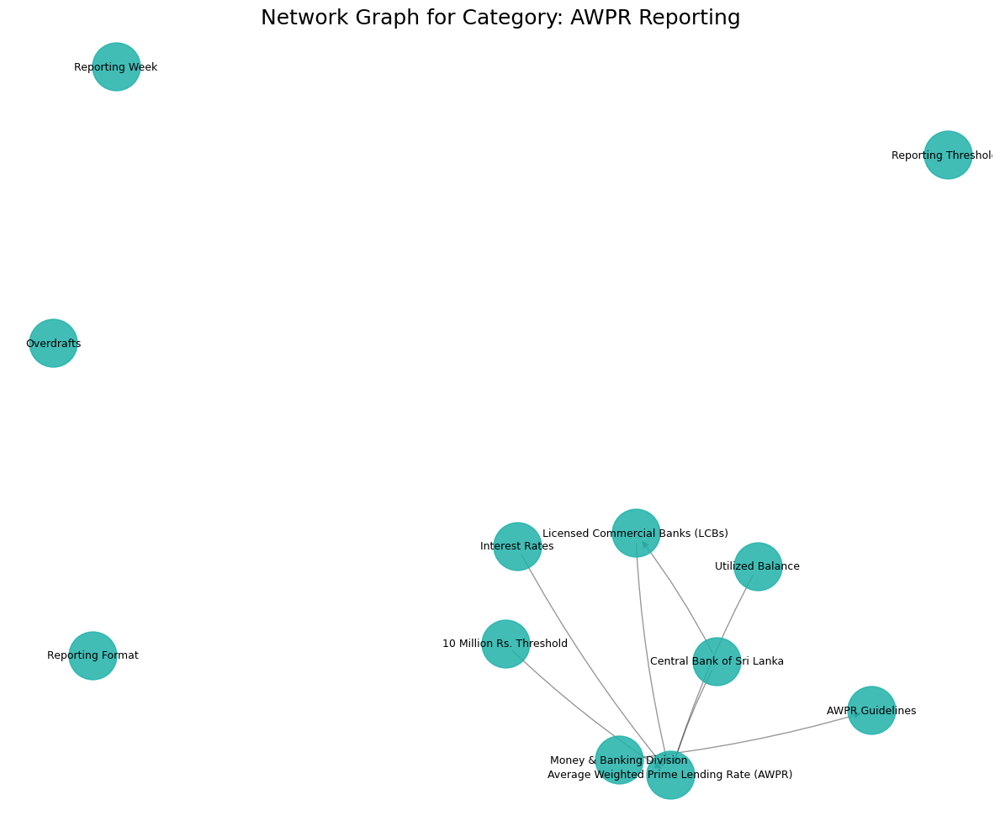


Processing category: Definition and Selection (Nodes: 3)
  Graph for 'Definition and Selection' has 3 nodes and 2 edges.


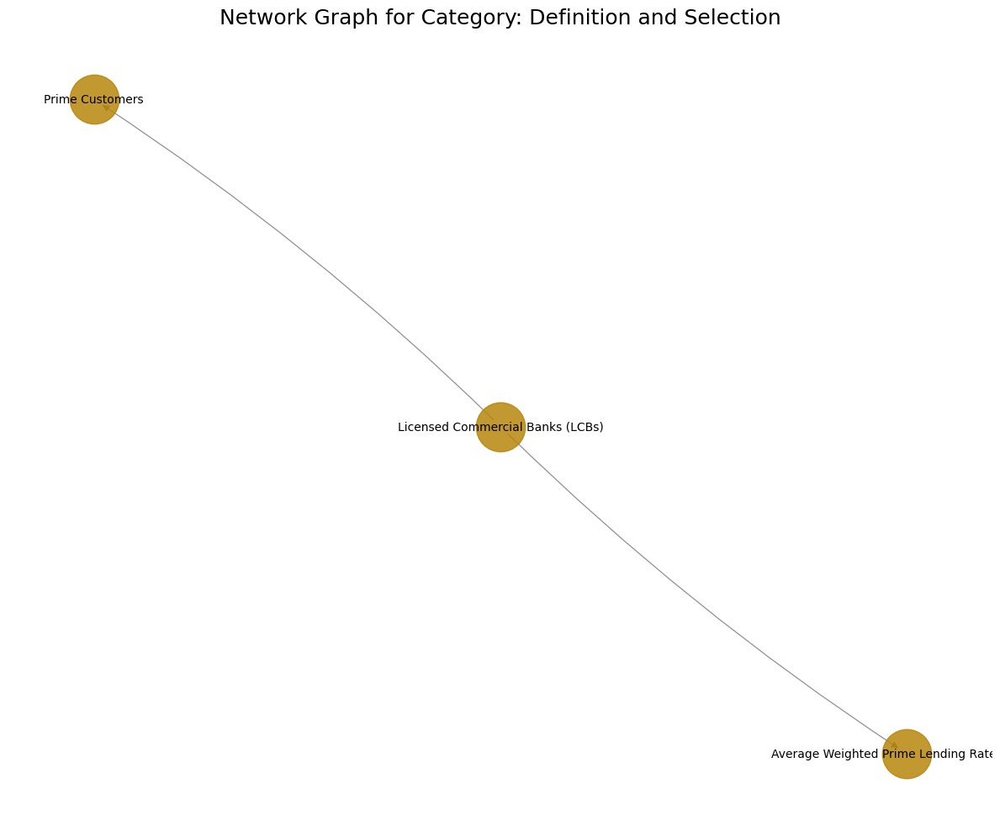


Processing category: Rationale for Revised (Nodes: 5)
  Graph for 'Rationale for Revised' has 5 nodes and 4 edges.


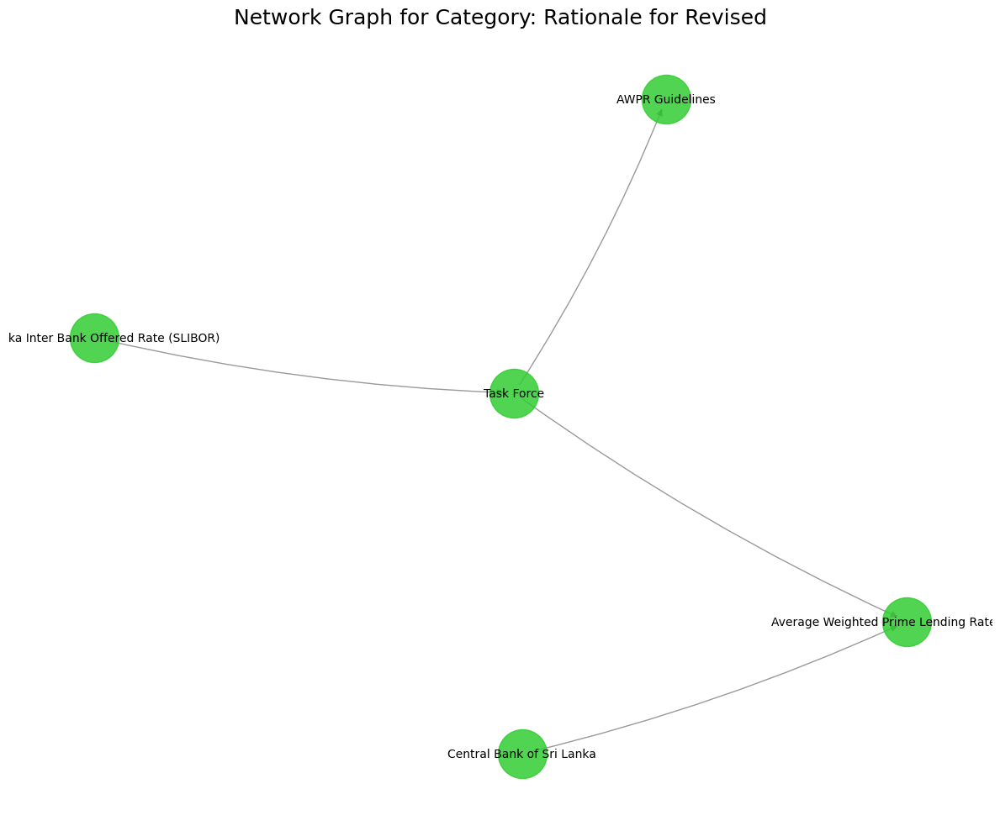


Processing category: AWPR Calculation (Nodes: 20)
  Graph for 'AWPR Calculation' has 20 nodes and 15 edges.


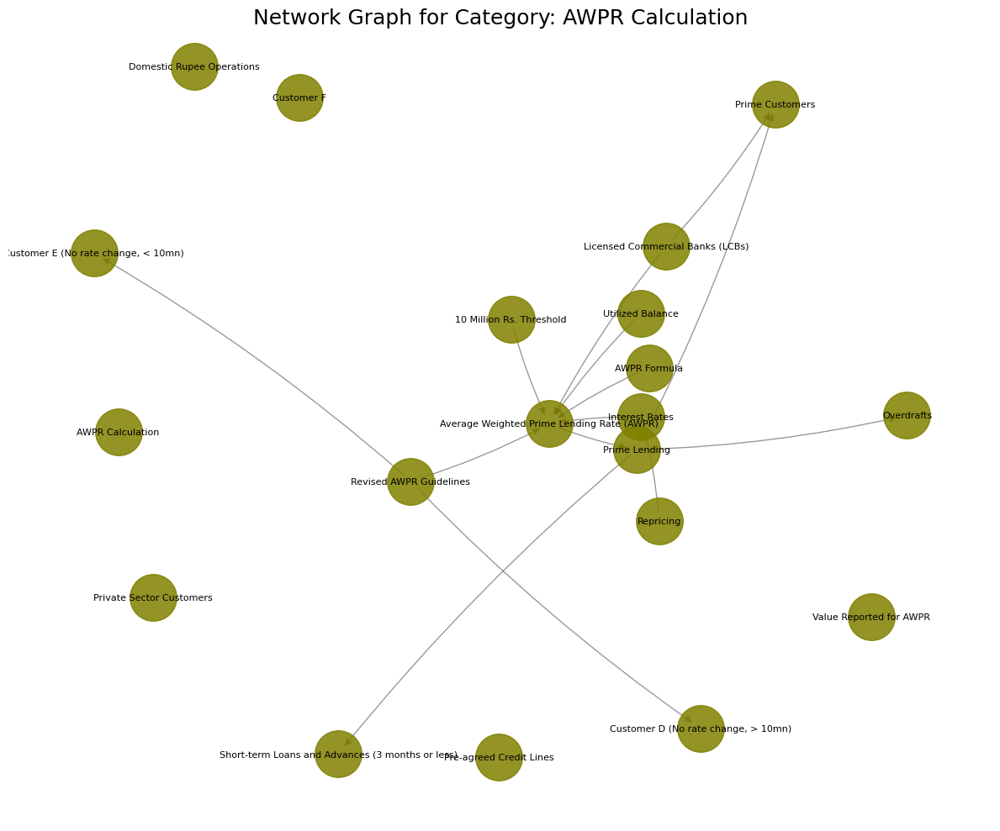


Processing category: Exclusions from AWPR (Nodes: 5)
  Graph for 'Exclusions from AWPR' has 5 nodes and 4 edges.


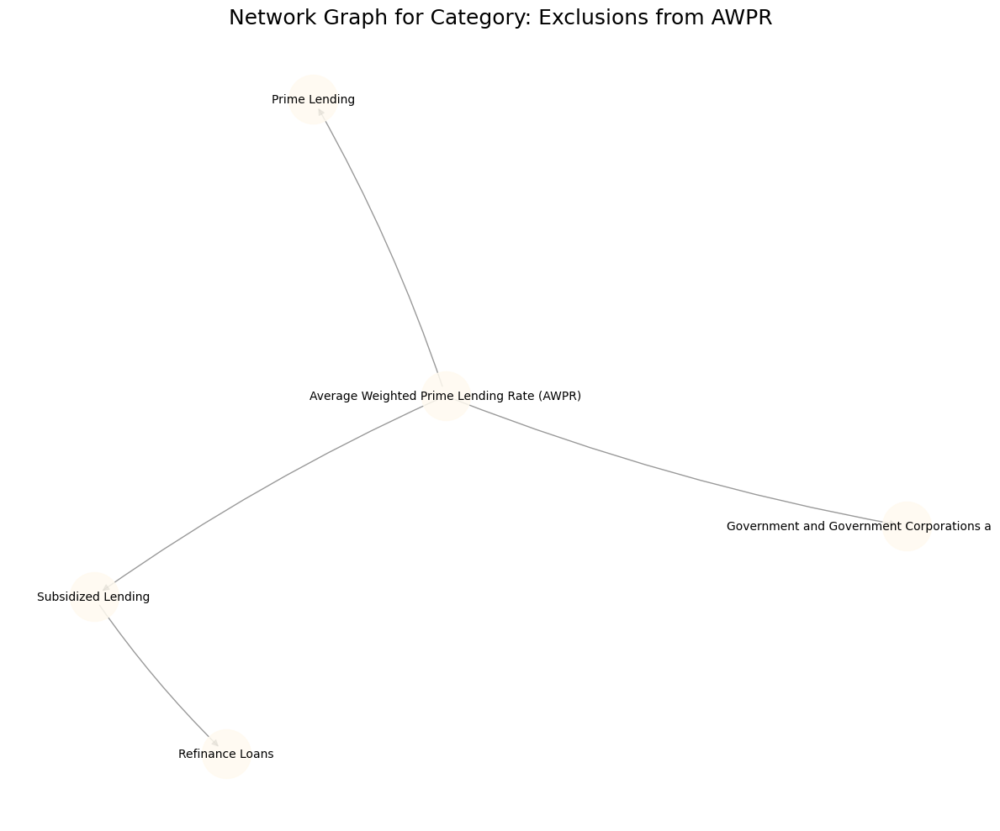


Processing category: Data Governance (Nodes: 3)
  Graph for 'Data Governance' has 3 nodes and 3 edges.


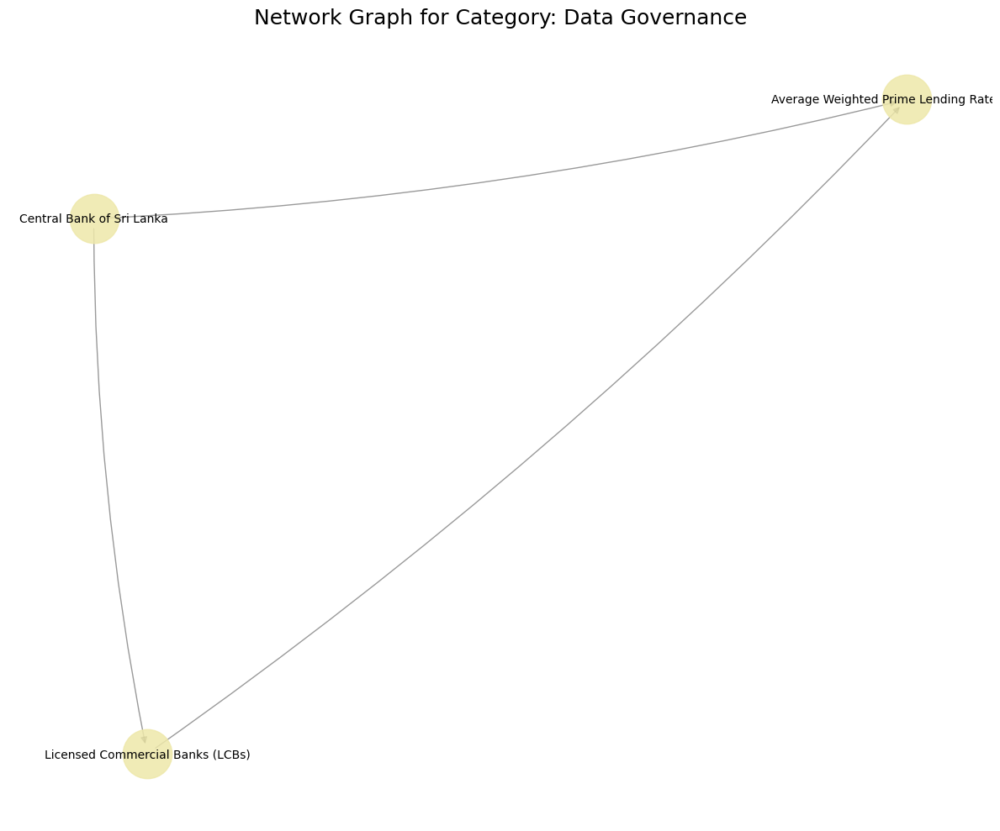


Processing category: Loan Data (Nodes: 5)
  Graph for 'Loan Data' has 5 nodes and 1 edges.


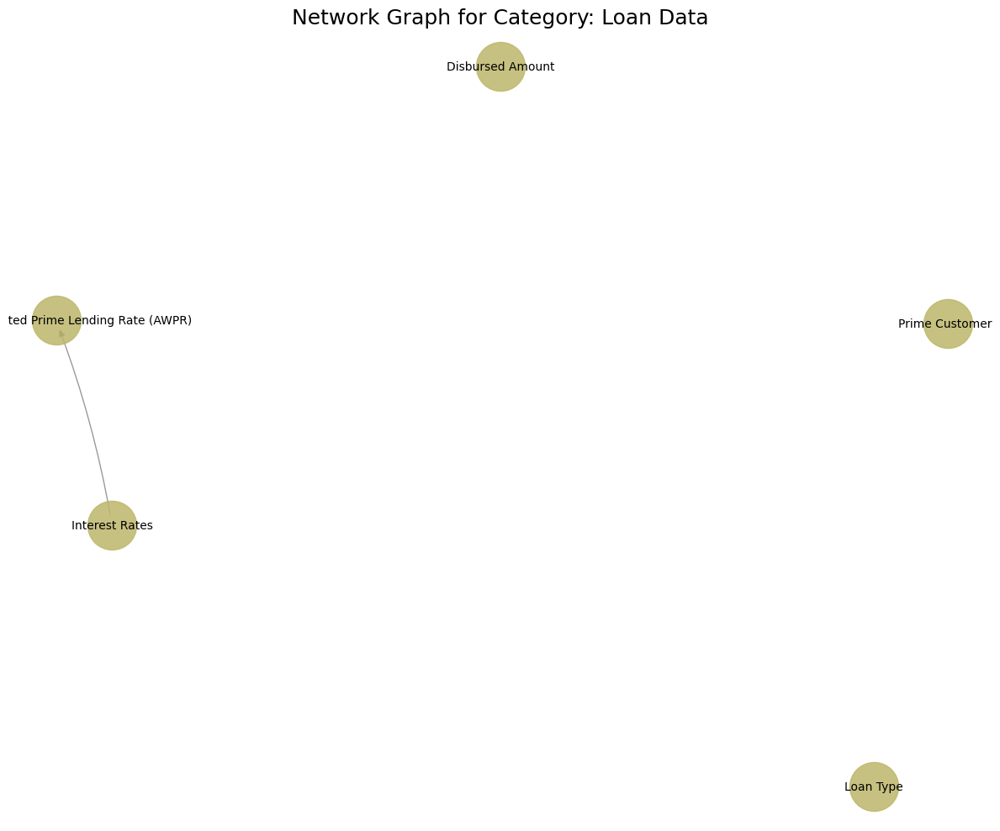


Processing category: Impact of Interest (Nodes: 3)
  Graph for 'Impact of Interest' has 3 nodes and 2 edges.


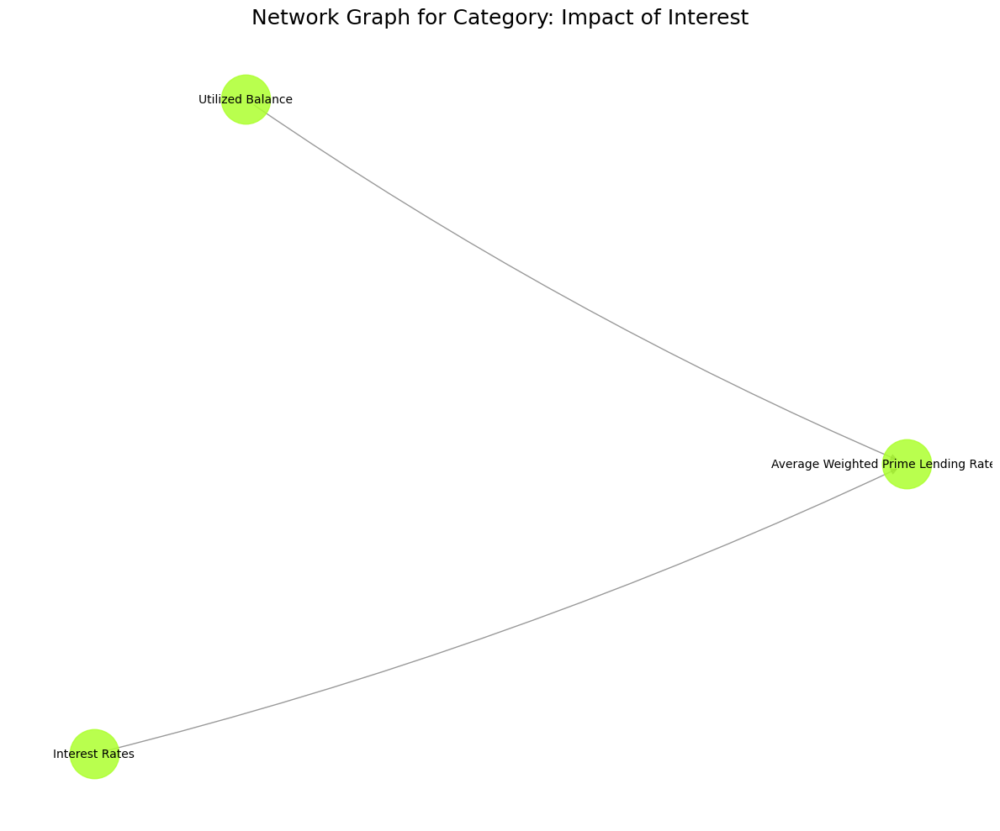


Processing category: Influence of Utilized (Nodes: 4)
  Graph for 'Influence of Utilized' has 4 nodes and 2 edges.


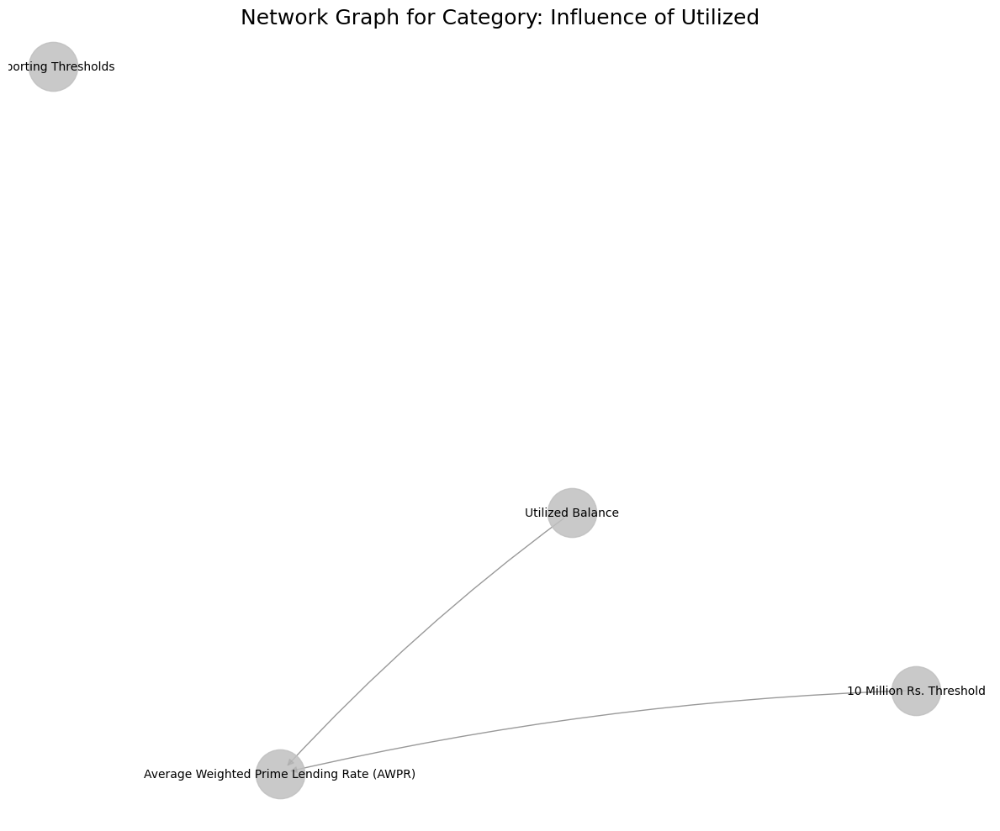


Processing category: Reporting Requirements (Nodes: 14)
  Graph for 'Reporting Requirements' has 14 nodes and 13 edges.


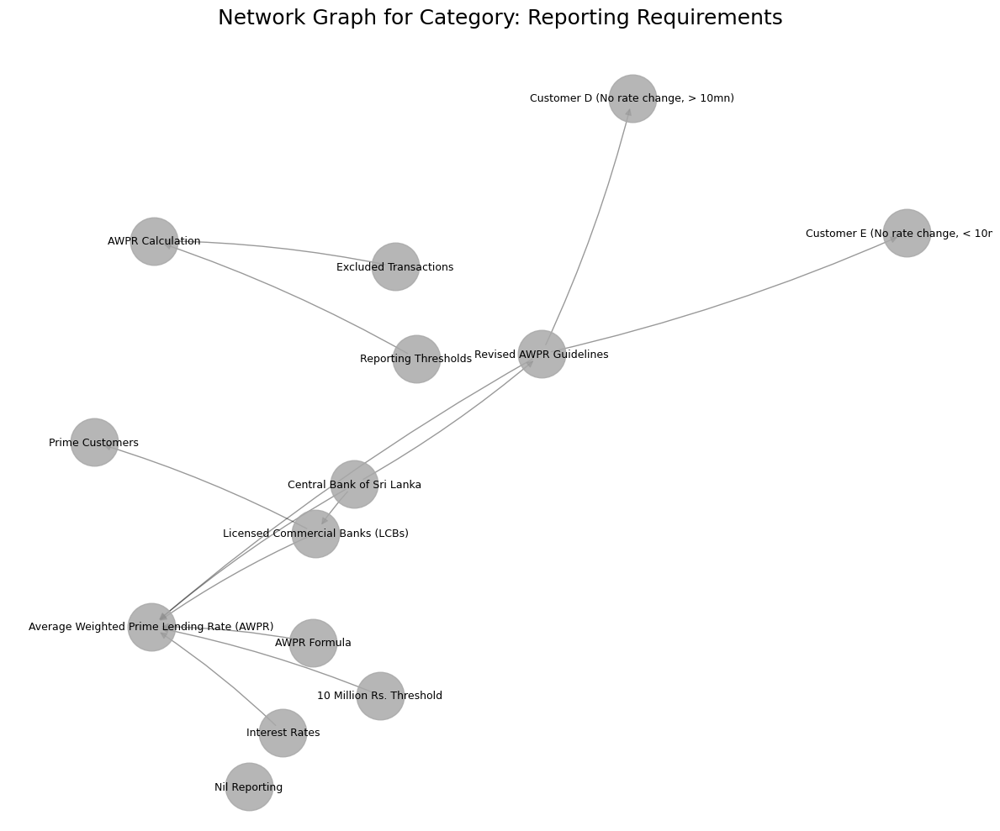


Processing category: Regulatory Context (Nodes: 4)
  Graph for 'Regulatory Context' has 4 nodes and 2 edges.


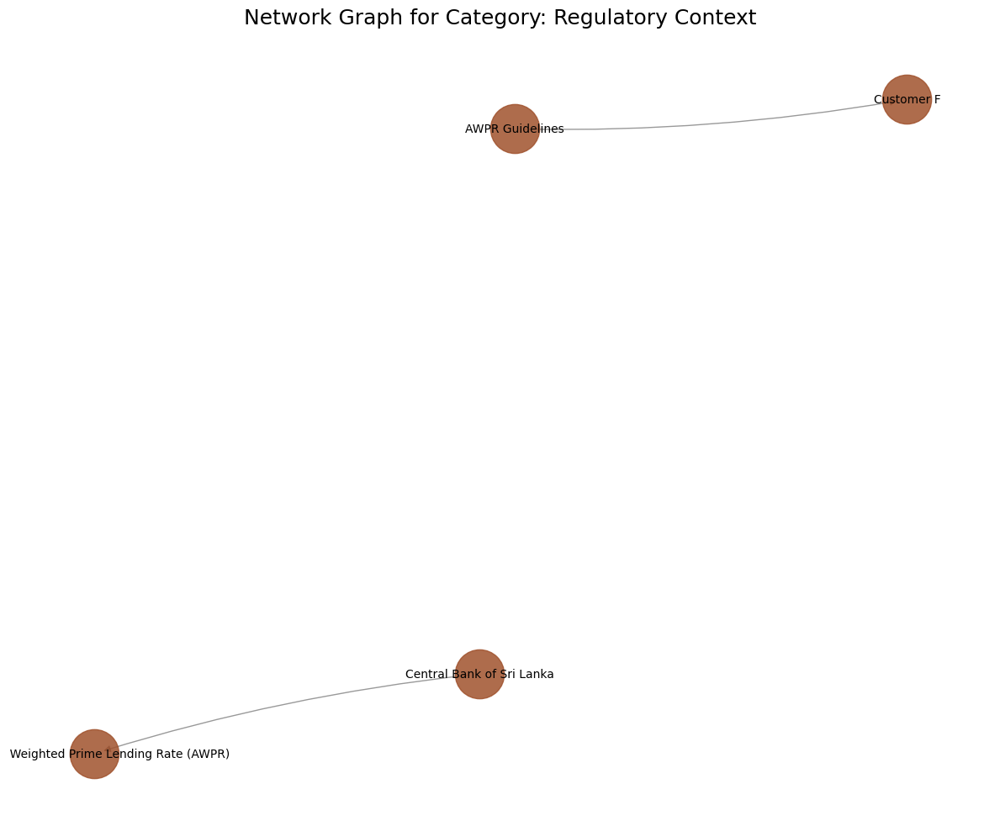


Processing category: AWPR Reporting Process (Nodes: 2)
  Graph for 'AWPR Reporting Process' has 2 nodes and 0 edges.


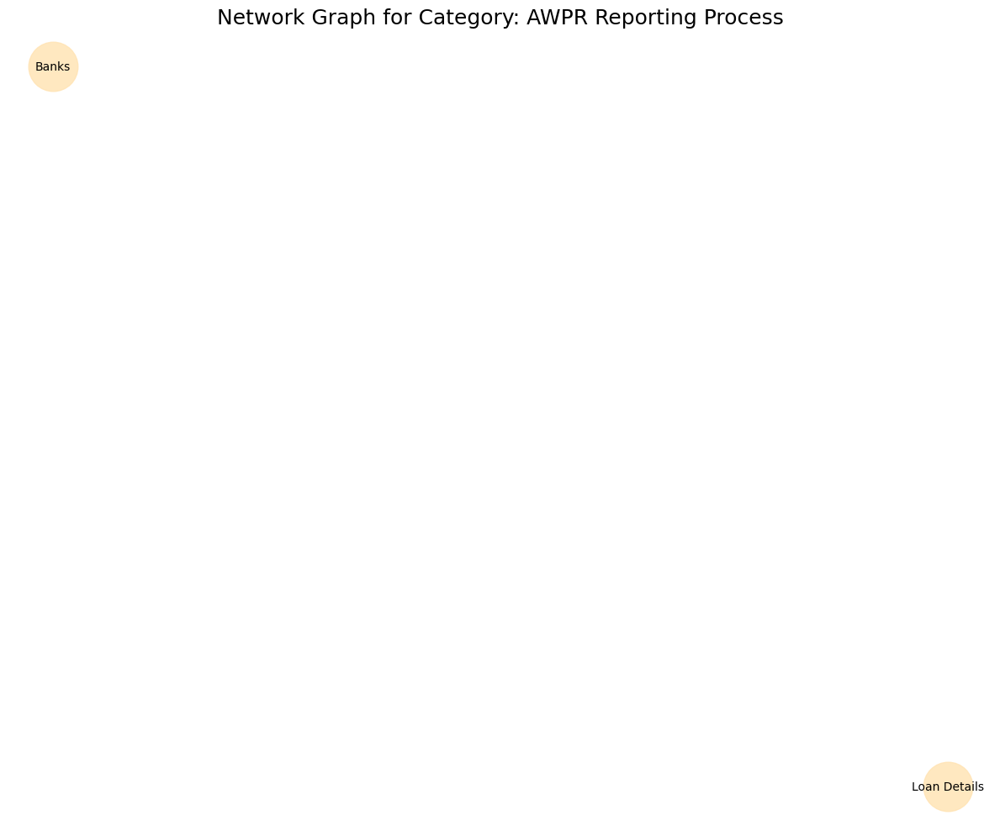


Processing category: Loan Data Requirements (Nodes: 1)
  Graph for 'Loan Data Requirements' has 1 nodes and 0 edges.


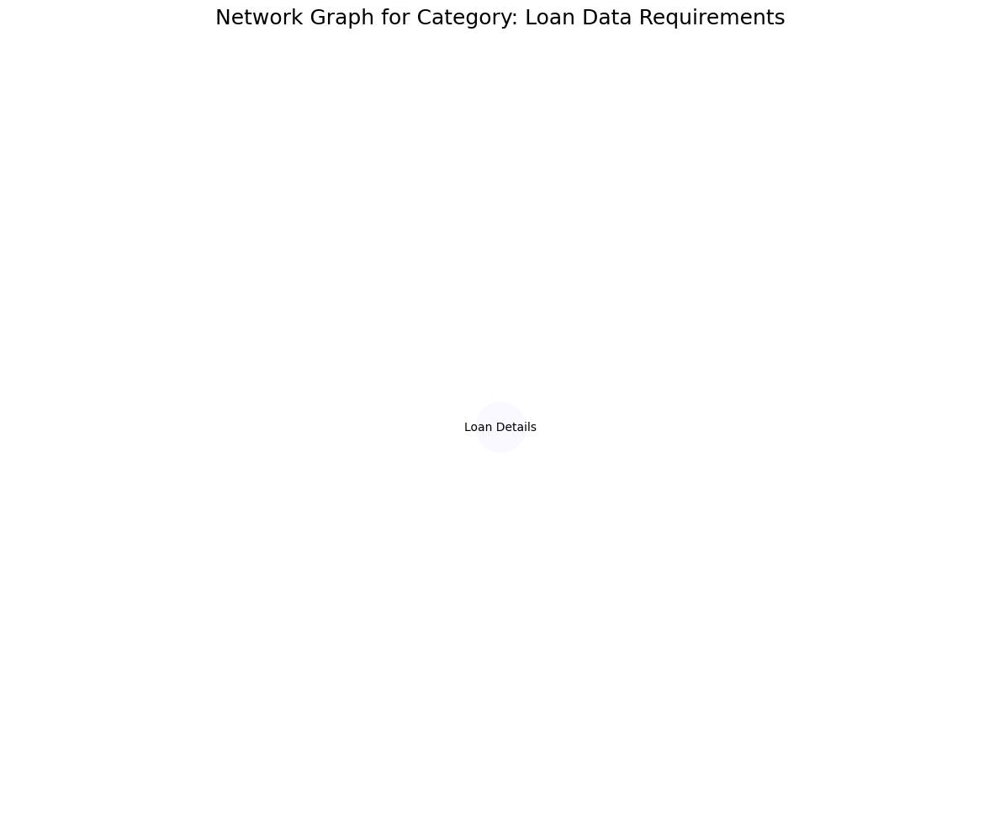


Processing category: AWPR Reporting for ODs (Nodes: 2)
  Graph for 'AWPR Reporting for ODs' has 2 nodes and 0 edges.


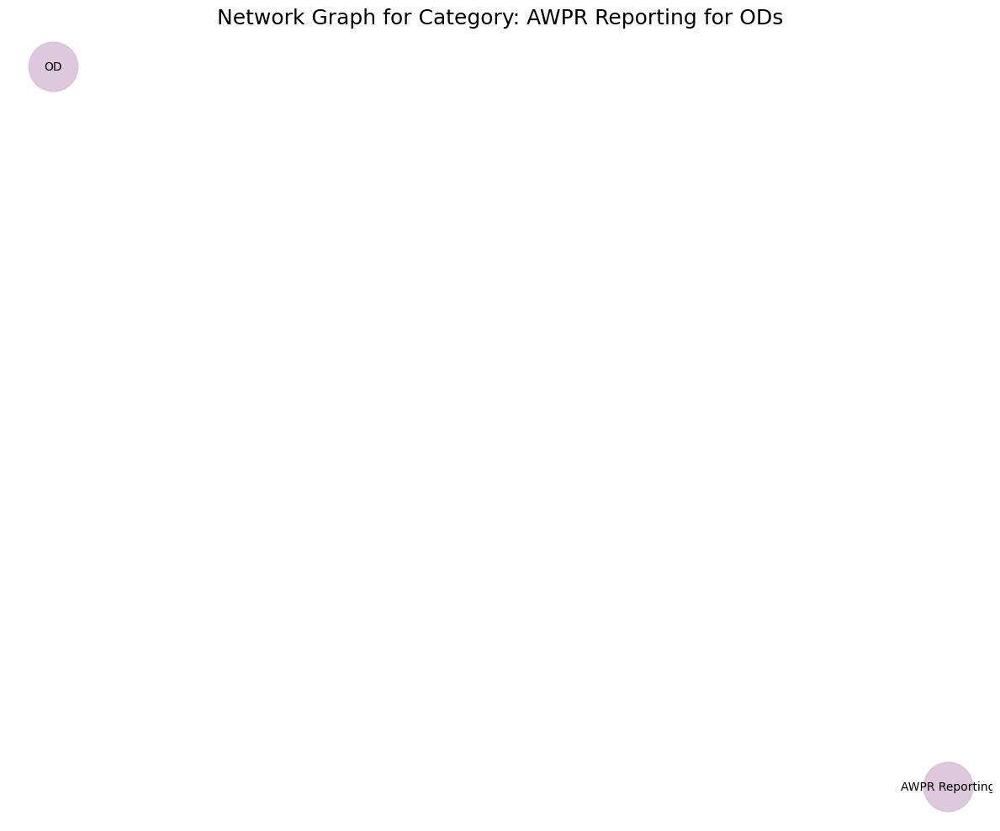

In [187]:
import networkx as nx
import json
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from collections import defaultdict
import random

def create_graph_from_json_data(json_data):
    """
    Creates a NetworkX MultiDiGraph from a JSON object.
    Nodes are expected to have an 'id' and optionally 'label', 'category' (list of strings),
    and 'page_numbers' (list of strings/integers).
    Edges should have 'source', 'target', 'label' (relationship type), and optionally 'page_numbers'.
    """
    if isinstance(json_data, str):
        data = json.loads(json_data)
    else:
        data = json_data

    graph = nx.MultiDiGraph()

    # Add nodes
    for node_info in data.get('nodes', []):
        node_id = node_info.get('id')
        if node_id:
            # Ensure category is a list, default to ['Uncategorized'] if missing or not a list
            categories = node_info.get('category', ['Uncategorized'])
            if not isinstance(categories, list) or not categories:
                categories = ['Uncategorized']
            
            # Ensure page_numbers is a list of strings
            page_numbers = node_info.get('page_numbers', [])
            if not isinstance(page_numbers, list):
                page_numbers = [str(page_numbers)] if page_numbers else []
            else:
                page_numbers = [str(pn) for pn in page_numbers]

            attributes = {
                'label': node_info.get('label', node_id),
                'description': node_info.get('description'),
                'category': categories,
                'page_numbers': page_numbers
            }
            graph.add_node(node_id, **{k: v for k, v in attributes.items() if v is not None})

    # Add edges
    for edge_info in data.get('edges', []):
        source_id = edge_info.get('source')
        target_id = edge_info.get('target')
        edge_key = edge_info.get('label')  # Relationship type
        context = edge_info.get('context') # Changed from 'details' to 'context' to match example
        
        # Ensure page_numbers is a list of strings for edges
        page_numbers_edge = edge_info.get('page_numbers', [])
        if not isinstance(page_numbers_edge, list):
            page_numbers_edge = [str(page_numbers_edge)] if page_numbers_edge else []
        else:
            page_numbers_edge = [str(pn) for pn in page_numbers_edge]


        if source_id and target_id and edge_key:
            # Ensure nodes exist. If not, add them with default attributes.
            if not graph.has_node(source_id):
                graph.add_node(source_id, label=source_id, category=['Uncategorized'], page_numbers=[])
            if not graph.has_node(target_id):
                graph.add_node(target_id, label=target_id, category=['Uncategorized'], page_numbers=[])

            edge_attributes = {
                'context': context, 
                'relationship_type': edge_key,
                'page_numbers': page_numbers_edge
            }
            graph.add_edge(source_id, target_id, key=edge_key, **{k:v for k,v in edge_attributes.items() if v is not None})
            
    return graph

def visualize_category_graph(graph, category_name, category_color='skyblue'):
    """
    Visualizes a single graph, typically representing a specific category.
    Nodes are colored with a specific category_color.
    Focuses on readability.
    """
    if not graph.nodes:
        print(f"Graph for category '{category_name}' has no nodes to visualize.")
        return

    num_nodes = len(graph.nodes())
    plt.figure(figsize=(min(20, max(12, num_nodes * 0.5)), min(18, max(10, num_nodes * 0.4)))) # Dynamic figure size
    
    k_val = 2.0 / (num_nodes**0.5) if num_nodes > 1 else 2.0
    try:
        pos = nx.spring_layout(graph, k=k_val, iterations=max(50, num_nodes * 2), seed=42, scale=2)
        if num_nodes < 20 and graph.number_of_edges() > num_nodes * 1.5:
             pos = nx.kamada_kawai_layout(graph, scale=2)

    except Exception as e: 
        print(f"Layout failed for {category_name}, using simpler spring_layout. Error: {e}")
        pos = nx.spring_layout(graph, k=0.9, iterations=30, seed=42)


    node_labels = {node: graph.nodes[node].get('label', node) for node in graph.nodes()}
    
    node_size = max(300, 1800 - num_nodes * 10) if num_nodes < 150 else 300
    font_size = max(6, 10 - num_nodes // 10) if num_nodes < 80 else 6
    
    nx.draw_networkx_nodes(graph, pos, node_color=category_color, node_size=node_size, alpha=0.85)
    nx.draw_networkx_edges(graph, pos, alpha=0.4, width=1.0, arrowsize=12, connectionstyle='arc3,rad=0.05')
    nx.draw_networkx_labels(graph, pos, labels=node_labels, font_size=font_size, font_weight='normal')

    plt.title(f"Network Graph for Category: {category_name}", fontsize=18)
    plt.axis('off')
    plt.tight_layout()
    plt.show()

def create_and_visualize_graphs_by_category(main_graph):
    """
    Creates and visualizes separate graphs for each category.
    A node can belong to multiple categories and will appear in each respective graph.
    """
    if not main_graph.nodes:
        print("Main graph has no nodes. Cannot create category-specific graphs.")
        return

    nodes_by_category = defaultdict(set) 
    all_categories = set()

    for node, data in main_graph.nodes(data=True):
        node_categories = data.get('category', ['Uncategorized'])
        if not isinstance(node_categories, list) or not node_categories: 
            node_categories = ['Uncategorized']
        for cat in node_categories:
            nodes_by_category[cat].add(node)
            all_categories.add(cat)

    if not all_categories:
        print("No categories found in the graph nodes.")
        return

    unique_categories = sorted(list(all_categories))
    
    base_colors = list(mcolors.TABLEAU_COLORS.values()) + \
                  list(mcolors.CSS4_COLORS.values()) 
    random.shuffle(base_colors) 

    if len(unique_categories) > len(base_colors):
        for _ in range(len(unique_categories) - len(base_colors)):
            base_colors.append("#"+''.join([random.choice('0123456789ABCDEF') for _ in range(6)]))
    
    category_to_color = {cat: base_colors[i % len(base_colors)] for i, cat in enumerate(unique_categories)}
    if 'Uncategorized' not in category_to_color:
        category_to_color['Uncategorized'] = '#CCCCCC'
    else:
        category_to_color['Uncategorized'] = category_to_color.get('Uncategorized', '#CCCCCC')


    print(f"\nFound categories: {', '.join(unique_categories)}")

    for category_name, category_node_ids in nodes_by_category.items():
        print(f"\nProcessing category: {category_name} (Nodes: {len(category_node_ids)})")
        
        category_graph = nx.MultiDiGraph()
        
        for node_id in category_node_ids:
            if main_graph.has_node(node_id): 
                 category_graph.add_node(node_id, **main_graph.nodes[node_id])
            
        for u, v, k, data in main_graph.edges(keys=True, data=True):
            if u in category_node_ids and v in category_node_ids:
                category_graph.add_edge(u, v, key=k, **data)
        
        if category_graph.number_of_nodes() > 0:
            print(f"  Graph for '{category_name}' has {category_graph.number_of_nodes()} nodes and {category_graph.number_of_edges()} edges.")
            visualize_category_graph(category_graph, category_name, category_color=category_to_color.get(category_name, '#AAAAAA'))
        else:
            print(f"  No nodes or only isolated nodes for category '{category_name}' after filtering. Skipping visualization or graph is empty.")


if __name__ == "__main__":
    # Make sure the JSON file path is correct and the JSON structure includes 'page_numbers'
    json_file_path = "/Users/shirsama/dtcc-hackathon/dtcc-ai-hackathon-2025/graph_json/AWPR Version 1_text.json" 
    
    try:
        with open(json_file_path, 'r') as f:
            graph_data = json.load(f)
        
        print(f"Successfully loaded JSON data from: {json_file_path}")
        
        main_graph = create_graph_from_json_data(graph_data)
        print(f"Main graph created with {main_graph.number_of_nodes()} nodes and {main_graph.number_of_edges()} edges.")

        print("saved graph to file")

        import pickle

        file_name = os.path.basename(json_file_path).split('.')[0]


        # save graph object to file
        pickle.dump(main_graph, open(f'{file_name}_graph.pickle', 'wb'))


        # Optional: Verify page_numbers parsing for a few nodes/edges
        # print("\nVerifying page_numbers for a few nodes:")
        # count = 0
        # for node_id, data in main_graph.nodes(data=True):
        #     if count < 3:
        #         print(f"  Node ID: {node_id}, Label: {data.get('label')}, Page Numbers: {data.get('page_numbers')}")
        #         count += 1
        #     else:
        #         break
        
        # print("\nVerifying page_numbers for a few edges:")
        # count = 0
        # for u, v, data in main_graph.edges(data=True):
        #     if count < 3:
        #         print(f"  Edge: ({u} -> {v}), Type: {data.get('relationship_type')}, Page Numbers: {data.get('page_numbers')}")
        #         count += 1
        #     else:
        #         break

        create_and_visualize_graphs_by_category(main_graph)
        
    except FileNotFoundError:
        print(f"Error: The file '{json_file_path}' was not found.")
    except json.JSONDecodeError:
        print(f"Error: Could not decode JSON from the file '{json_file_path}'. Please check its format.")
    except Exception as e:
        print(f"An unexpected error occurred: {e}")
        import traceback
        traceback.print_exc()


Successfully loaded JSON data from: /Users/shirsama/dtcc-hackathon/dtcc-ai-hackathon-2025/graph_json/AWPR Version 2_text.json
Main graph created with 41 nodes and 29 edges.
saved graph to file

Found categories: AWPR Calculation, AWPR Reporting, Customer Segmentation, Data Governance, Institutional Context, Overdraft Example, Regulatory Guidance, Reporting Procedures, Revision of, Scope of Prime, Uncategorized

Processing category: AWPR Reporting (Nodes: 13)
  Graph for 'AWPR Reporting' has 13 nodes and 12 edges.


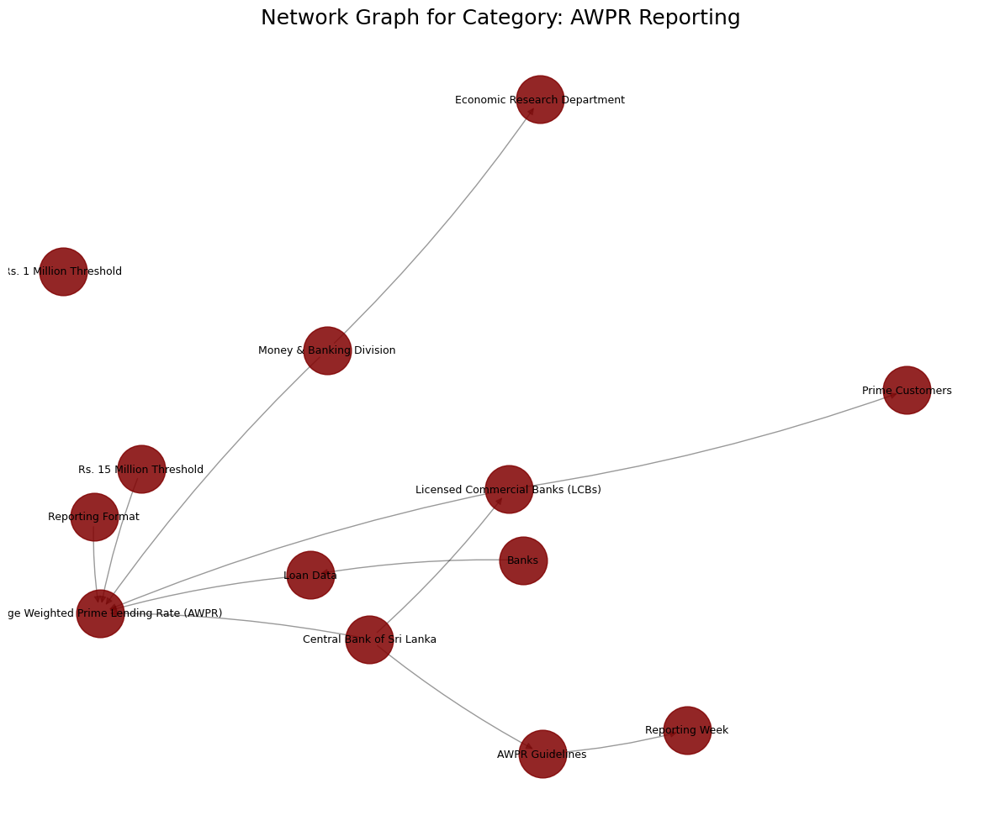


Processing category: Revision of (Nodes: 5)
  Graph for 'Revision of' has 5 nodes and 3 edges.


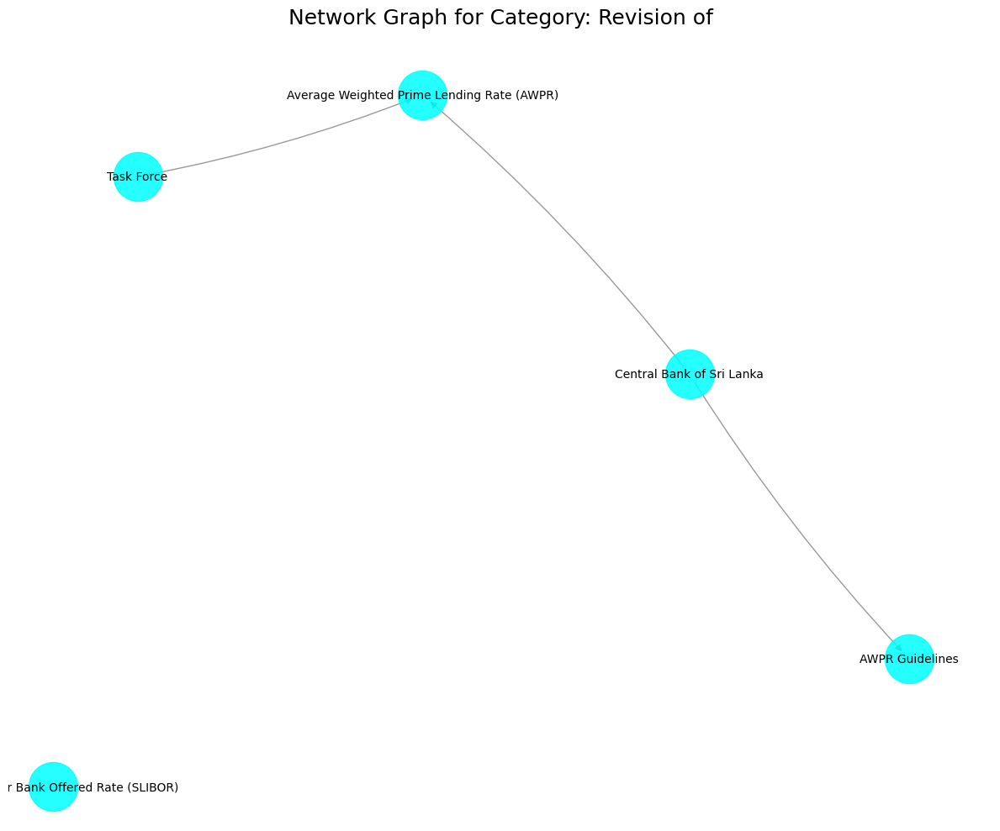


Processing category: Reporting Procedures (Nodes: 5)
  Graph for 'Reporting Procedures' has 5 nodes and 1 edges.


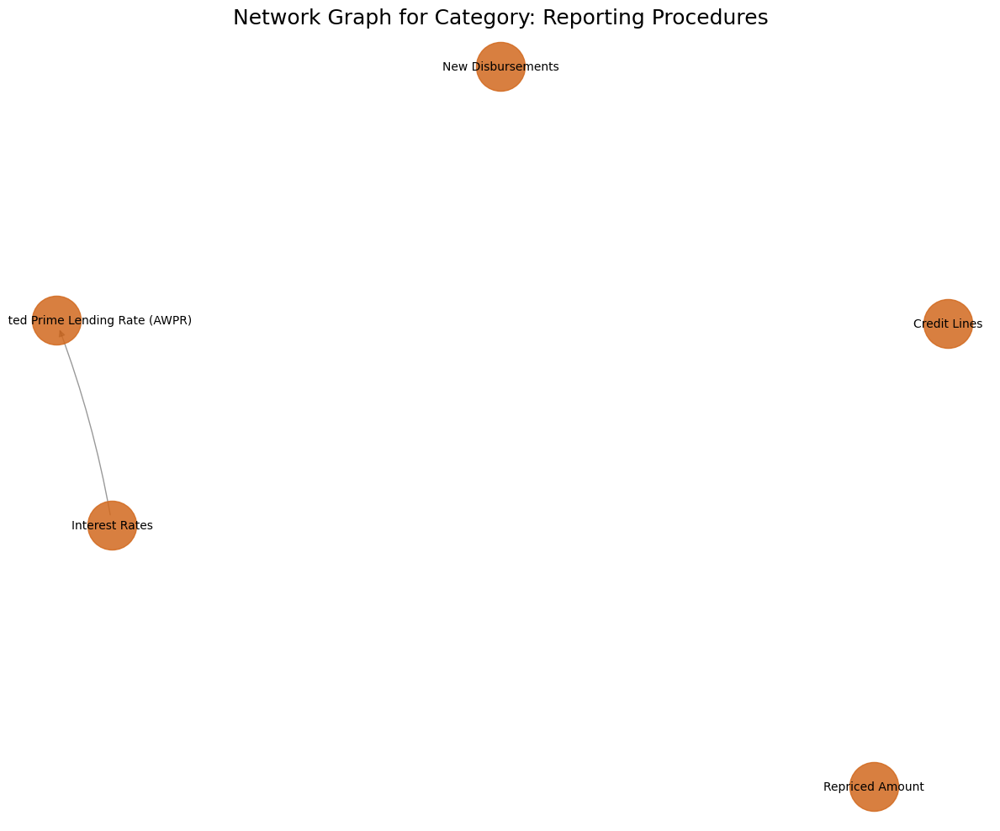


Processing category: AWPR Calculation (Nodes: 11)
  Graph for 'AWPR Calculation' has 11 nodes and 8 edges.


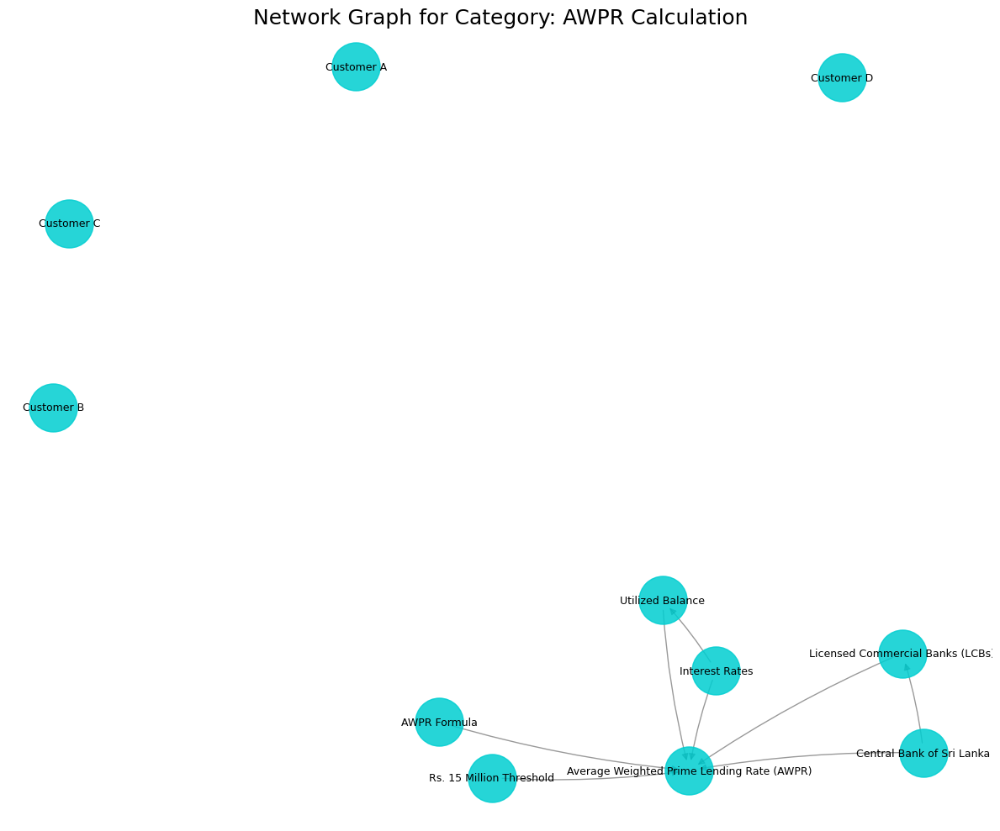


Processing category: Data Governance (Nodes: 2)
  Graph for 'Data Governance' has 2 nodes and 1 edges.


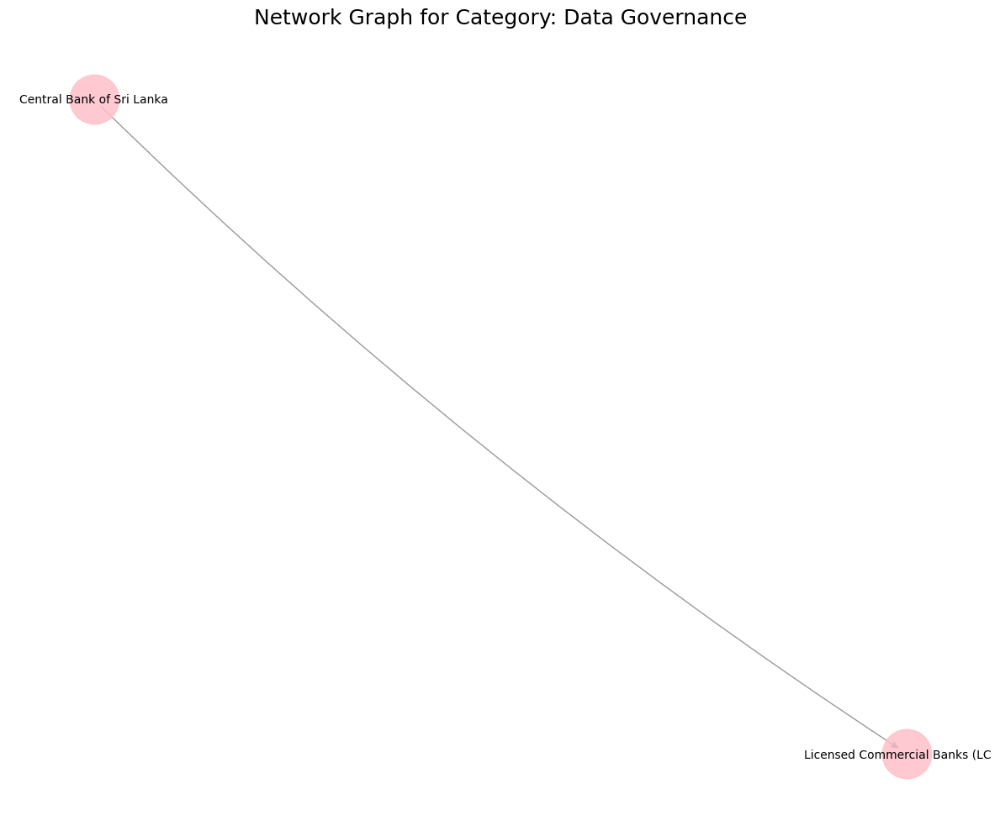


Processing category: Regulatory Guidance (Nodes: 2)
  Graph for 'Regulatory Guidance' has 2 nodes and 1 edges.


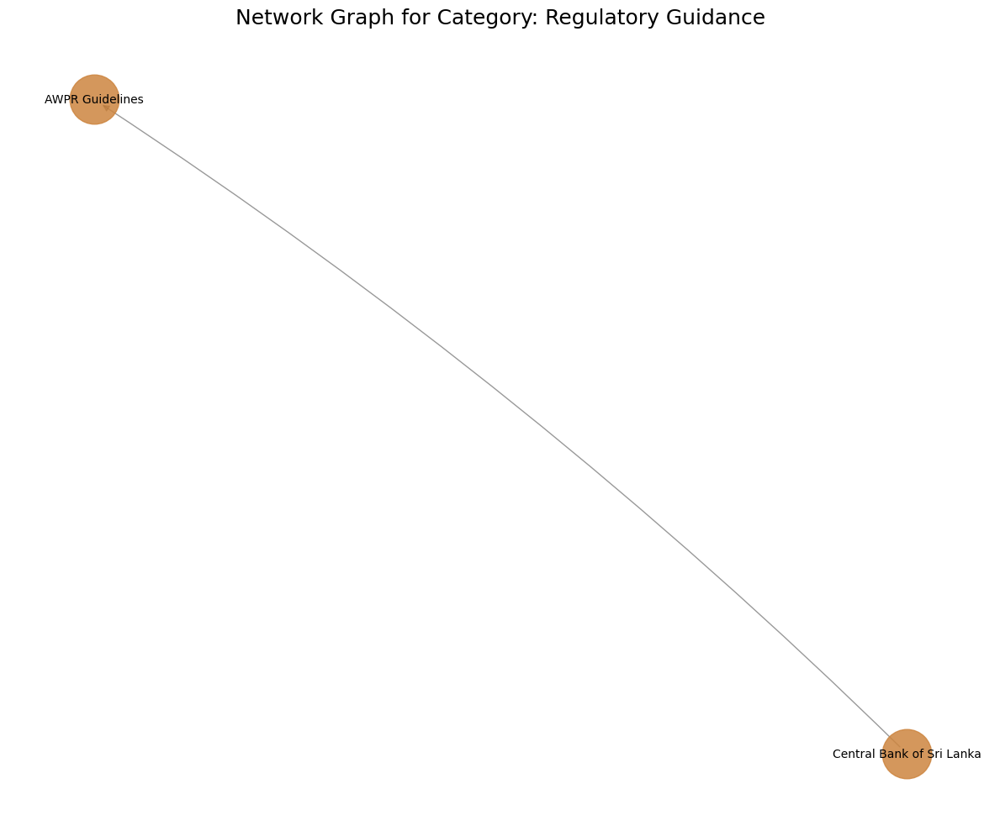


Processing category: Institutional Context (Nodes: 3)
  Graph for 'Institutional Context' has 3 nodes and 1 edges.


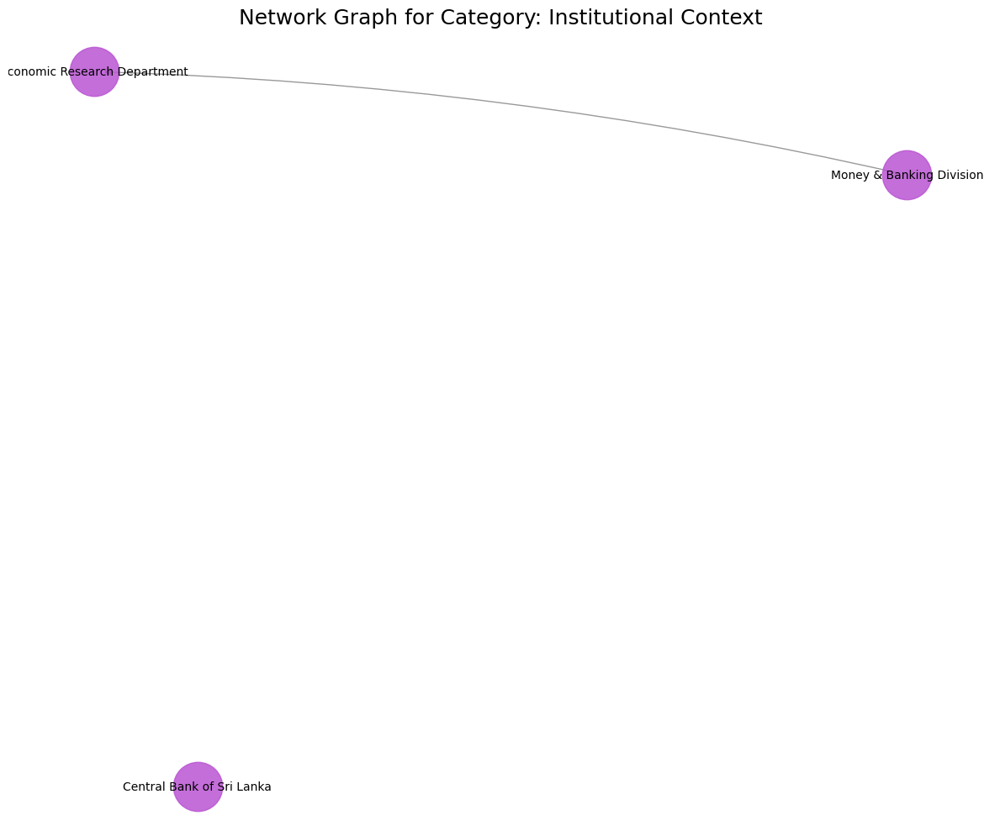


Processing category: Scope of Prime (Nodes: 5)
  Graph for 'Scope of Prime' has 5 nodes and 4 edges.


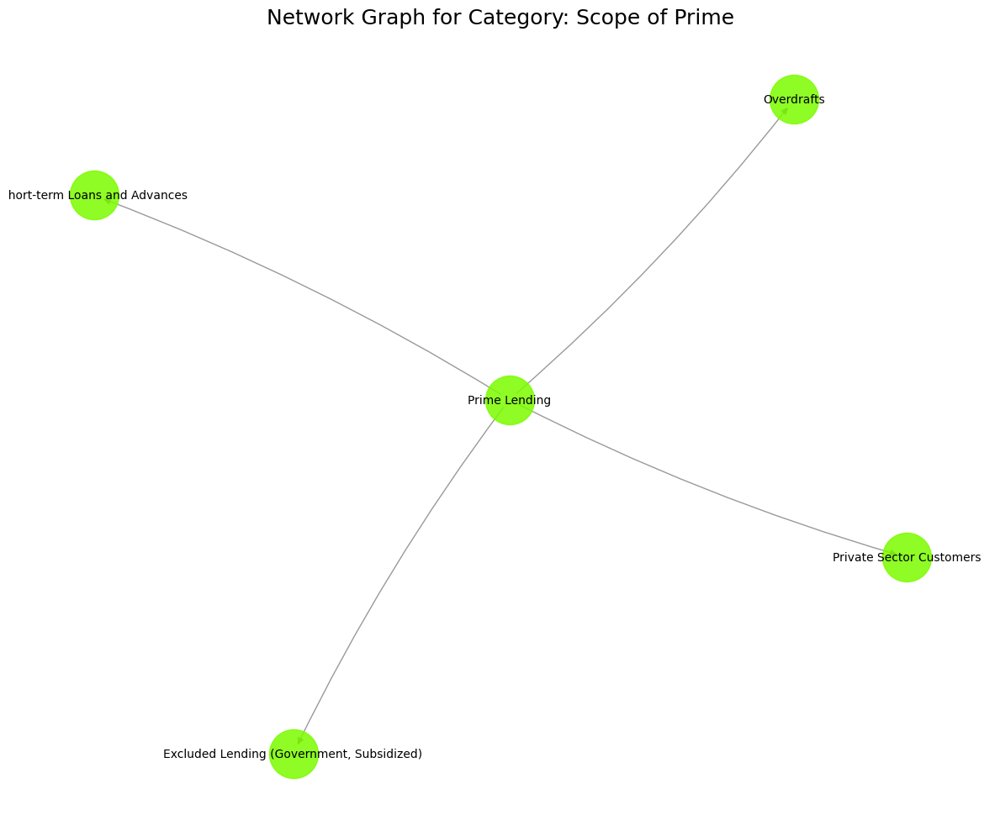


Processing category: Overdraft Example (Nodes: 3)
  Graph for 'Overdraft Example' has 3 nodes and 1 edges.


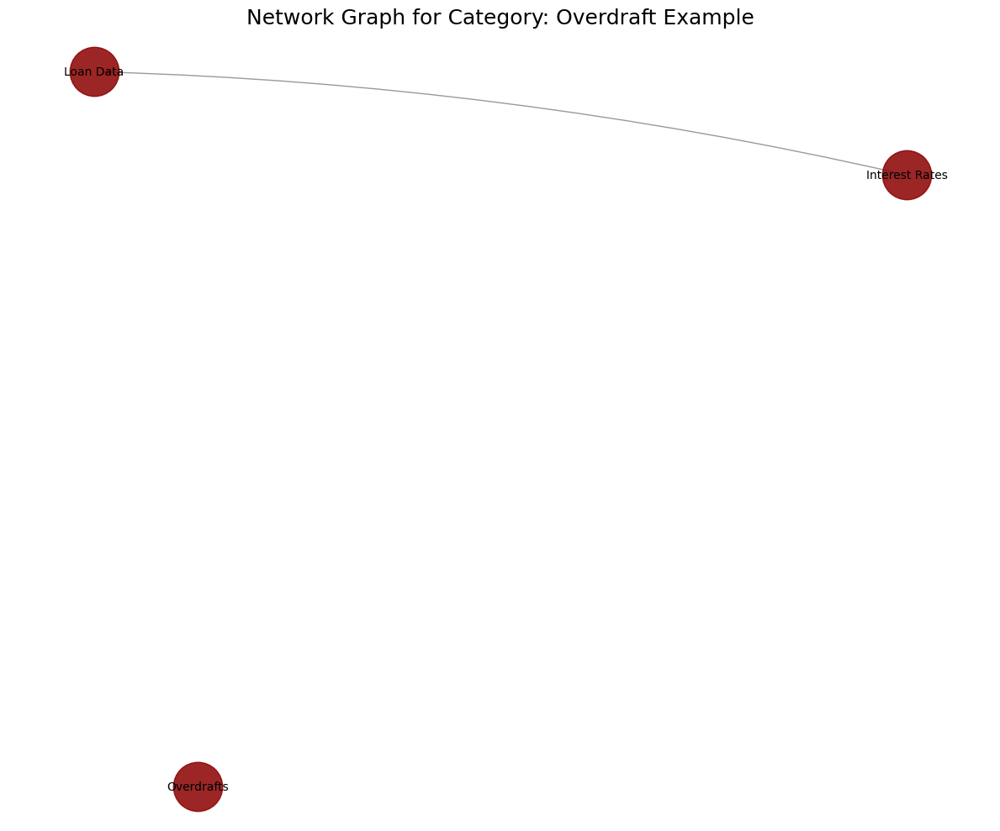


Processing category: Uncategorized (Nodes: 7)
  Graph for 'Uncategorized' has 7 nodes and 1 edges.


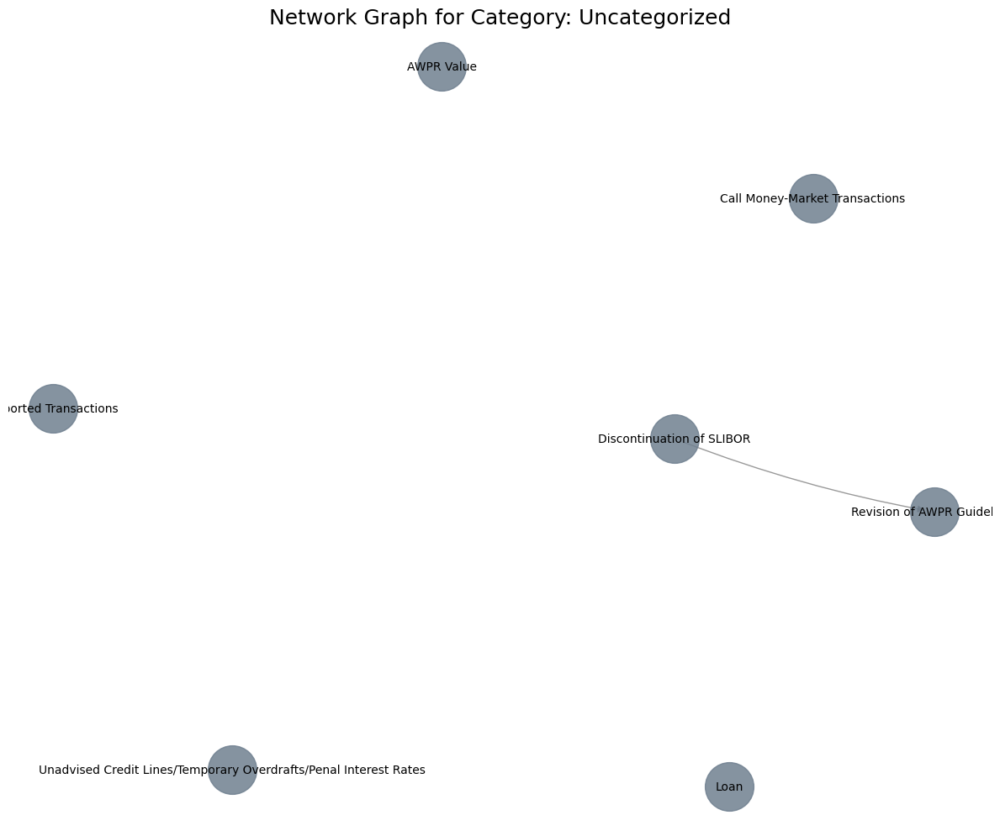


Processing category: Customer Segmentation (Nodes: 5)
  Graph for 'Customer Segmentation' has 5 nodes and 0 edges.


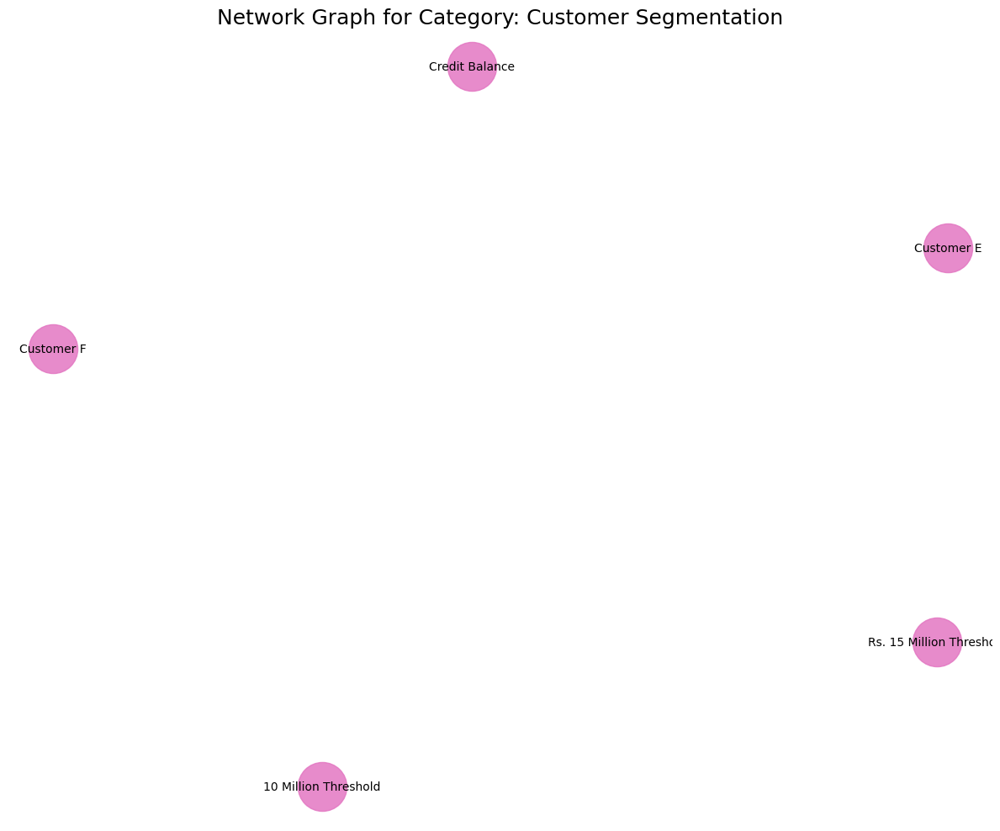

In [188]:
import networkx as nx
import json
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from collections import defaultdict
import random

def create_graph_from_json_data(json_data):
    """
    Creates a NetworkX MultiDiGraph from a JSON object.
    Nodes are expected to have an 'id' and optionally 'label', 'category' (list of strings),
    and 'page_numbers' (list of strings/integers).
    Edges should have 'source', 'target', 'label' (relationship type), and optionally 'page_numbers'.
    """
    if isinstance(json_data, str):
        data = json.loads(json_data)
    else:
        data = json_data

    graph = nx.MultiDiGraph()

    # Add nodes
    for node_info in data.get('nodes', []):
        node_id = node_info.get('id')
        if node_id:
            # Ensure category is a list, default to ['Uncategorized'] if missing or not a list
            categories = node_info.get('category', ['Uncategorized'])
            if not isinstance(categories, list) or not categories:
                categories = ['Uncategorized']
            
            # Ensure page_numbers is a list of strings
            page_numbers = node_info.get('page_numbers', [])
            if not isinstance(page_numbers, list):
                page_numbers = [str(page_numbers)] if page_numbers else []
            else:
                page_numbers = [str(pn) for pn in page_numbers]

            attributes = {
                'label': node_info.get('label', node_id),
                'description': node_info.get('description'),
                'category': categories,
                'page_numbers': page_numbers
            }
            graph.add_node(node_id, **{k: v for k, v in attributes.items() if v is not None})

    # Add edges
    for edge_info in data.get('edges', []):
        source_id = edge_info.get('source')
        target_id = edge_info.get('target')
        edge_key = edge_info.get('label')  # Relationship type
        context = edge_info.get('context') # Changed from 'details' to 'context' to match example
        
        # Ensure page_numbers is a list of strings for edges
        page_numbers_edge = edge_info.get('page_numbers', [])
        if not isinstance(page_numbers_edge, list):
            page_numbers_edge = [str(page_numbers_edge)] if page_numbers_edge else []
        else:
            page_numbers_edge = [str(pn) for pn in page_numbers_edge]


        if source_id and target_id and edge_key:
            # Ensure nodes exist. If not, add them with default attributes.
            if not graph.has_node(source_id):
                graph.add_node(source_id, label=source_id, category=['Uncategorized'], page_numbers=[])
            if not graph.has_node(target_id):
                graph.add_node(target_id, label=target_id, category=['Uncategorized'], page_numbers=[])

            edge_attributes = {
                'context': context, 
                'relationship_type': edge_key,
                'page_numbers': page_numbers_edge
            }
            graph.add_edge(source_id, target_id, key=edge_key, **{k:v for k,v in edge_attributes.items() if v is not None})
            
    return graph

def visualize_category_graph(graph, category_name, category_color='skyblue'):
    """
    Visualizes a single graph, typically representing a specific category.
    Nodes are colored with a specific category_color.
    Focuses on readability.
    """
    if not graph.nodes:
        print(f"Graph for category '{category_name}' has no nodes to visualize.")
        return

    num_nodes = len(graph.nodes())
    plt.figure(figsize=(min(20, max(12, num_nodes * 0.5)), min(18, max(10, num_nodes * 0.4)))) # Dynamic figure size
    
    k_val = 2.0 / (num_nodes**0.5) if num_nodes > 1 else 2.0
    try:
        pos = nx.spring_layout(graph, k=k_val, iterations=max(50, num_nodes * 2), seed=42, scale=2)
        if num_nodes < 20 and graph.number_of_edges() > num_nodes * 1.5:
             pos = nx.kamada_kawai_layout(graph, scale=2)

    except Exception as e: 
        print(f"Layout failed for {category_name}, using simpler spring_layout. Error: {e}")
        pos = nx.spring_layout(graph, k=0.9, iterations=30, seed=42)


    node_labels = {node: graph.nodes[node].get('label', node) for node in graph.nodes()}
    
    node_size = max(300, 1800 - num_nodes * 10) if num_nodes < 150 else 300
    font_size = max(6, 10 - num_nodes // 10) if num_nodes < 80 else 6
    
    nx.draw_networkx_nodes(graph, pos, node_color=category_color, node_size=node_size, alpha=0.85)
    nx.draw_networkx_edges(graph, pos, alpha=0.4, width=1.0, arrowsize=12, connectionstyle='arc3,rad=0.05')
    nx.draw_networkx_labels(graph, pos, labels=node_labels, font_size=font_size, font_weight='normal')

    plt.title(f"Network Graph for Category: {category_name}", fontsize=18)
    plt.axis('off')
    plt.tight_layout()
    plt.show()

def create_and_visualize_graphs_by_category(main_graph):
    """
    Creates and visualizes separate graphs for each category.
    A node can belong to multiple categories and will appear in each respective graph.
    """
    if not main_graph.nodes:
        print("Main graph has no nodes. Cannot create category-specific graphs.")
        return

    nodes_by_category = defaultdict(set) 
    all_categories = set()

    for node, data in main_graph.nodes(data=True):
        node_categories = data.get('category', ['Uncategorized'])
        if not isinstance(node_categories, list) or not node_categories: 
            node_categories = ['Uncategorized']
        for cat in node_categories:
            nodes_by_category[cat].add(node)
            all_categories.add(cat)

    if not all_categories:
        print("No categories found in the graph nodes.")
        return

    unique_categories = sorted(list(all_categories))
    
    base_colors = list(mcolors.TABLEAU_COLORS.values()) + \
                  list(mcolors.CSS4_COLORS.values()) 
    random.shuffle(base_colors) 

    if len(unique_categories) > len(base_colors):
        for _ in range(len(unique_categories) - len(base_colors)):
            base_colors.append("#"+''.join([random.choice('0123456789ABCDEF') for _ in range(6)]))
    
    category_to_color = {cat: base_colors[i % len(base_colors)] for i, cat in enumerate(unique_categories)}
    if 'Uncategorized' not in category_to_color:
        category_to_color['Uncategorized'] = '#CCCCCC'
    else:
        category_to_color['Uncategorized'] = category_to_color.get('Uncategorized', '#CCCCCC')


    print(f"\nFound categories: {', '.join(unique_categories)}")

    for category_name, category_node_ids in nodes_by_category.items():
        print(f"\nProcessing category: {category_name} (Nodes: {len(category_node_ids)})")
        
        category_graph = nx.MultiDiGraph()
        
        for node_id in category_node_ids:
            if main_graph.has_node(node_id): 
                 category_graph.add_node(node_id, **main_graph.nodes[node_id])
            
        for u, v, k, data in main_graph.edges(keys=True, data=True):
            if u in category_node_ids and v in category_node_ids:
                category_graph.add_edge(u, v, key=k, **data)
        
        if category_graph.number_of_nodes() > 0:
            print(f"  Graph for '{category_name}' has {category_graph.number_of_nodes()} nodes and {category_graph.number_of_edges()} edges.")
            visualize_category_graph(category_graph, category_name, category_color=category_to_color.get(category_name, '#AAAAAA'))
        else:
            print(f"  No nodes or only isolated nodes for category '{category_name}' after filtering. Skipping visualization or graph is empty.")


if __name__ == "__main__":
    # Make sure the JSON file path is correct and the JSON structure includes 'page_numbers'
    json_file_path = "/Users/shirsama/dtcc-hackathon/dtcc-ai-hackathon-2025/graph_json/AWPR Version 2_text.json" 
    
    try:
        with open(json_file_path, 'r') as f:
            graph_data = json.load(f)
        
        print(f"Successfully loaded JSON data from: {json_file_path}")
        
        main_graph = create_graph_from_json_data(graph_data)
        print(f"Main graph created with {main_graph.number_of_nodes()} nodes and {main_graph.number_of_edges()} edges.")

        print("saved graph to file")

        import pickle

        file_name = os.path.basename(json_file_path).split('.')[0]


        # save graph object to file
        pickle.dump(main_graph, open(f'{file_name}_graph.pickle', 'wb'))


        # Optional: Verify page_numbers parsing for a few nodes/edges
        # print("\nVerifying page_numbers for a few nodes:")
        # count = 0
        # for node_id, data in main_graph.nodes(data=True):
        #     if count < 3:
        #         print(f"  Node ID: {node_id}, Label: {data.get('label')}, Page Numbers: {data.get('page_numbers')}")
        #         count += 1
        #     else:
        #         break
        
        # print("\nVerifying page_numbers for a few edges:")
        # count = 0
        # for u, v, data in main_graph.edges(data=True):
        #     if count < 3:
        #         print(f"  Edge: ({u} -> {v}), Type: {data.get('relationship_type')}, Page Numbers: {data.get('page_numbers')}")
        #         count += 1
        #     else:
        #         break

        create_and_visualize_graphs_by_category(main_graph)
        
    except FileNotFoundError:
        print(f"Error: The file '{json_file_path}' was not found.")
    except json.JSONDecodeError:
        print(f"Error: Could not decode JSON from the file '{json_file_path}'. Please check its format.")
    except Exception as e:
        print(f"An unexpected error occurred: {e}")
        import traceback
        traceback.print_exc()


In [200]:
from langchain_core.prompts import HumanMessagePromptTemplate, ChatPromptTemplate
from langchain_google_vertexai import VertexAI # Or ChatVertexAI if you're using a chat model
import os
import traceback # For more detailed error printing

def get_graph_prompt():
    prompt = """**Objective:** You will be provided with two structured summaries, one from Version 1 and one from Version 2 of a document, corresponding to the same page or conceptual section. Your goal is to compare these two summaries, identify any differences in entities (nodes) or relationships (edges), and if differences exist, output a single JSON object detailing these changes. If there are no differences between the two provided summaries, you should output an empty JSON object `{{}}`.

            summary_version_1
            -----------------
            {summary_v1}

            summary_version_2
            -----------------
            {summary_v2}

            **Input:**
            You will receive two text inputs:
            1.  `summary_v1`: A structured summary from Version 1 of the document.
            2.  `summary_v2`: A structured summary from Version 2 of the document, corresponding to the same page/section as summary_v1.

            Each summary (if not empty) will typically include:
            *   Overall Summary
            *   Key Entities/Concepts (Nodes) with descriptions.
            *   Key Relationships/Interactions (Edges) with source, target, and nature of relationship.
            *   Main Theme/Information Clusters.

            **Instructions:**

            1.  **Compare Summaries:** Carefully compare both the summaries.
            2.  **Identify Differences:** Look for:
                *   Entities present in one version but not the other.
                *   Relationships present in one version but not the other.
                *   Changes in the description or attributes of common entities.
                *   Changes in the nature or attributes of common relationships.
            3.  **Output JSON (Only if Differences Exist):**
                *   If and only if you find any differences, generate a single JSON object with two main keys: `"nodes_diff"` and `"edges_diff"`.
                *   If there are NO differences between them output an empty JSON object.

            **JSON Structure (if differences exist):**

            *   **`"nodes_diff"`**: (Object) Contains details about node differences.
                *   `"added_in_v2"`: (Array of Objects) Nodes present in `summary_v2` but not in `summary_v1`.
                    *   Each object: `{{"label": "Node Label", "description": "Node Description from V2"}}`
                *   `"removed_from_v1"`: (Array of Objects) Nodes present in `summary_v1` but not in `summary_v2`.
                    *   Each object: `{{"label": "Node Label", "description": "Node Description from V1"}}`
                *   `"modified"`: (Array of Objects) Nodes present in both but with changed attributes.
                    *   Each object: `{{"label": "Common Node Label", "v1_description": "Desc in V1", "v2_description": "Desc in V2", "other_changed_attributes": {{"attr_name": {{"v1_value": "val1", "v2_value": "val2"}}}}}}` (other_changed_attributes is optional)

            *   **`"edges_diff"`**: (Object) Contains details about edge differences.
                *   `"added_in_v2"`: (Array of Objects) Edges present in `summary_v2` but not in `summary_v1`.
                    *   Each object: `{{"source_label": "Source Node Label", "target_label": "Target Node Label", "relationship_label": "Relationship Label from V2", "details": "Details from V2"}}`
                *   `"removed_from_v1"`: (Array of Objects) Edges present in `summary_v1` but not in `summary_v2`.
                    *   Each object: `{{"source_label": "Source Node Label", "target_label": "Target Node Label", "relationship_label": "Relationship Label from V1", "details": "Details from V1"}}`
                *   `"modified"`: (Array of Objects) Edges between the same entities but with changed relationship label or details.
                    *   Each object: `{{"source_label": "Source Node Label", "target_label": "Target Node Label", "v1_relationship_label": "Rel Label V1", "v2_relationship_label": "Rel Label V2", "v1_details": "Details V1", "v2_details": "Details V2"}}`

            **CRITICAL: The entire response must be ONLY the JSON object (or `{{}}` if no differences). Ensure it is complete, valid, and not truncated. Do not include any explanatory text.**

            **Example JSON Output (If Differences Exist):**
            ```json
            {{
              "nodes_diff": {{
                "added_in_v2": [
                  {{
                    "label": "New Regulatory Body",
                    "description": "A body introduced in V2 to oversee compliance."
                  }}
                ],
                "removed_from_v1": [],
                "modified": [
                  {{
                    "label": "EMIR Regulation",
                    "v1_description": "Financial regulation being updated.",
                    "v2_description": "Financial regulation extensively revised with new reporting mandates.",
                    "other_changed_attributes": {{}}
                  }}
                ]
              }},
              "edges_diff": {{
                "added_in_v2": [
                  {{
                    "source_label": "New Regulatory Body",
                    "target_label": "EMIR Regulation",
                    "relationship_label": "oversees",
                    "details": "The new body will ensure adherence to the revised EMIR."
                  }}
                ],
                "removed_from_v1": [
                  {{
                    "source_label": "Old Task Force",
                    "target_label": "EMIR Regulation",
                    "relationship_label": "monitored",
                    "details": "The task force was responsible for initial monitoring."
                  }}
                ],
                "modified": []
              }}
            }}
            ```

            **Example JSON Output (If NO Differences Exist):**
            ```json
            {{}}
            ```
            """
    return prompt

def send_data_to_vertex_ai(summary_v1_path, summary_v2_path, output_json_path):
    """
    Compares two summary files and generates a JSON diff if changes are found.
    """
    try:
        with open(summary_v1_path, 'r', encoding='utf-8') as f1, \
             open(summary_v2_path, 'r', encoding='utf-8') as f2:
            summary_v1_content = f1.read()
            summary_v2_content = f2.read()
    except FileNotFoundError as e:
        print(f"Error: Could not read summary files: {e}")
        return None
    except Exception as e:
        print(f"An unexpected error occurred while reading files: {e}")
        return None

    if not summary_v1_content and not summary_v2_content:
        print("Both summary files are empty. No comparison to perform.")
        try:
            with open(output_json_path, 'w', encoding='utf-8') as f:
                f.write("{}") # Write an empty JSON object string
            print(f"Wrote empty JSON to {output_json_path} as both summaries were empty.")
        except IOError as e:
            print(f"Error writing empty JSON to {output_json_path}: {e}")
        return "{}" # Return the string representation of an empty JSON

    print(f"--- Comparing summaries and sending to Vertex AI for diff generation ---")
    
    template_string = get_graph_prompt()
    human_message_prompt = HumanMessagePromptTemplate.from_template(template_string)
    chat_prompt = ChatPromptTemplate.from_messages([human_message_prompt])

    try:
        formatted_messages = chat_prompt.format_prompt(
            summary_v1=summary_v1_content,
            summary_v2=summary_v2_content
        ).to_messages()
    except Exception as e:
        print(f"Error during chat_prompt.format_prompt: {e}")
        traceback.print_exc()
        return None

    print(f"Formatted Messages to LLM: {[msg.content for msg in formatted_messages]}") # For debugging


    llm = VertexAILangchainLLM({})
    try:
        response_content = llm._call(prompt=str(formatted_messages))

        output_dir = os.path.dirname(output_json_path)
        if output_dir and not os.path.exists(output_dir):
            os.makedirs(output_dir)
            print(f"Created output directory: {output_dir}")

        with open(output_json_path, 'w', encoding='utf-8') as f:
            f.write(response_content)
        print(f"Successfully wrote diff JSON to: {output_json_path}")
        return response_content
    except Exception as e:
        print(f"Error during Vertex AI call or writing JSON: {e}")
        traceback.print_exc()
        return None


if __name__ == "__main__":
    BASE_SUMMARY_PATH_V1 = "/Users/shirsama/dtcc-hackathon/dtcc-ai-hackathon-2025/summary/AWPR Version 1_text"
    BASE_SUMMARY_PATH_V2 = "/Users/shirsama/dtcc-hackathon/dtcc-ai-hackathon-2025/summary/AWPR Version 2_text"
    OUTPUT_JSON_DIFF_BASE_PATH = "/Users/shirsama/dtcc-hackathon/dtcc-ai-hackathon-2025/graph_diff_json"

    if not os.path.exists(OUTPUT_JSON_DIFF_BASE_PATH):
        os.makedirs(OUTPUT_JSON_DIFF_BASE_PATH)
        print(f"Created output directory: {OUTPUT_JSON_DIFF_BASE_PATH}")

    try:
        v1_summary_files = sorted([
            f for f in os.listdir(BASE_SUMMARY_PATH_V1) 
            if f.endswith(".txt") and os.path.isfile(os.path.join(BASE_SUMMARY_PATH_V1, f))
        ])
    except FileNotFoundError:
        print(f"Error: Version 1 summary folder not found at {BASE_SUMMARY_PATH_V1}")
        v1_summary_files = [] # Initialize to empty list to prevent further errors
    except Exception as e:
        print(f"Error listing files in Version 1 summary folder: {e}")
        v1_summary_files = []

    if not v1_summary_files:
        print(f"No summary files found in {BASE_SUMMARY_PATH_V1}. Exiting.")
    else:
        print(f"Found {len(v1_summary_files)} summary files in {BASE_SUMMARY_PATH_V1}. Processing...")

        for summary_filename in v1_summary_files:
            summary_v1_filepath = os.path.join(BASE_SUMMARY_PATH_V1, summary_filename)
            summary_v2_filepath = os.path.join(BASE_SUMMARY_PATH_V2, summary_filename) 

            base_name_without_ext = os.path.splitext(summary_filename)[0]
            output_json_filename = f"{base_name_without_ext}_diff.json"
            output_json_filepath = os.path.join(OUTPUT_JSON_DIFF_BASE_PATH, output_json_filename)

            print(f"\nProcessing pair:")
            print(f"  V1 Summary: {summary_v1_filepath}")
            print(f"  V2 Summary: {summary_v2_filepath}")
            print(f"  Output JSON: {output_json_filepath}")

            if os.path.exists(summary_v1_filepath) and os.path.exists(summary_v2_filepath):
                send_data_to_vertex_ai(summary_v1_filepath, summary_v2_filepath, output_json_filepath)
            else:
                if not os.path.exists(summary_v1_filepath):
                    print(f"  Skipping: Version 1 summary file not found: {summary_v1_filepath}")
                if not os.path.exists(summary_v2_filepath):
                    print(f"  Skipping: Version 2 summary file not found: {summary_v2_filepath}")
    
    print("\nFinished processing all summary file pairs.")


Found 7 summary files in /Users/shirsama/dtcc-hackathon/dtcc-ai-hackathon-2025/summary/AWPR Version 1_text. Processing...

Processing pair:
  V1 Summary: /Users/shirsama/dtcc-hackathon/dtcc-ai-hackathon-2025/summary/AWPR Version 1_text/chunk_1.txt
  V2 Summary: /Users/shirsama/dtcc-hackathon/dtcc-ai-hackathon-2025/summary/AWPR Version 2_text/chunk_1.txt
  Output JSON: /Users/shirsama/dtcc-hackathon/dtcc-ai-hackathon-2025/graph_diff_json/chunk_1_diff.json
--- Comparing summaries and sending to Vertex AI for diff generation ---
Formatted Messages to LLM: ['**Objective:** You will be provided with two structured summaries, one from Version 1 and one from Version 2 of a document, corresponding to the same page or conceptual section. Your goal is to compare these two summaries, identify any differences in entities (nodes) or relationships (edges), and if differences exist, output a single JSON object detailing these changes. If there are no differences between the two provided summaries, yo


Processing file: /Users/shirsama/dtcc-hackathon/dtcc-ai-hackathon-2025/graph_diff_json/chunk_7_diff.json
  Successfully created graph from chunk_7_diff.json. Nodes: 8, Edges: 3

Processing file: /Users/shirsama/dtcc-hackathon/dtcc-ai-hackathon-2025/graph_diff_json/chunk_1_diff.json
  Successfully created graph from chunk_1_diff.json. Nodes: 9, Edges: 6

Processing file: /Users/shirsama/dtcc-hackathon/dtcc-ai-hackathon-2025/graph_diff_json/chunk_6_diff.json
  Successfully created graph from chunk_6_diff.json. Nodes: 13, Edges: 5

Processing file: /Users/shirsama/dtcc-hackathon/dtcc-ai-hackathon-2025/graph_diff_json/chunk_5_diff.json
  Successfully created graph from chunk_5_diff.json. Nodes: 9, Edges: 4

Processing file: /Users/shirsama/dtcc-hackathon/dtcc-ai-hackathon-2025/graph_diff_json/chunk_3_diff.json
  Successfully created graph from chunk_3_diff.json. Nodes: 9, Edges: 3

Processing file: /Users/shirsama/dtcc-hackathon/dtcc-ai-hackathon-2025/graph_diff_json/chunk_4_diff.json
  S

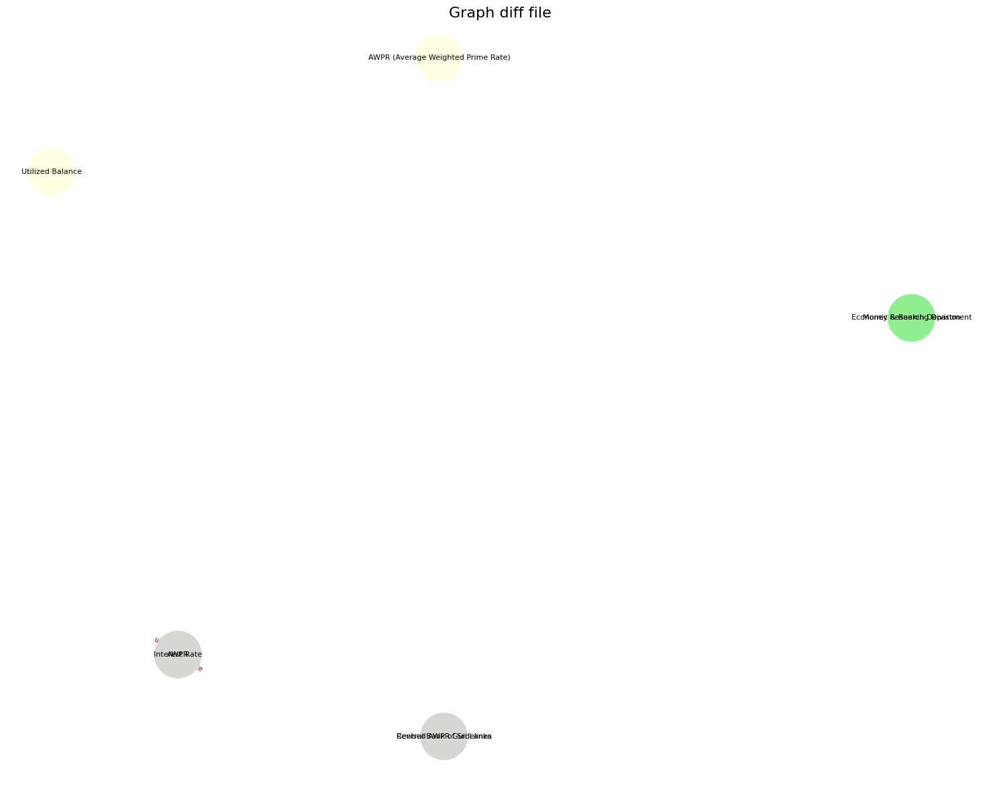


Visualizing the first graph from the processed diff files...


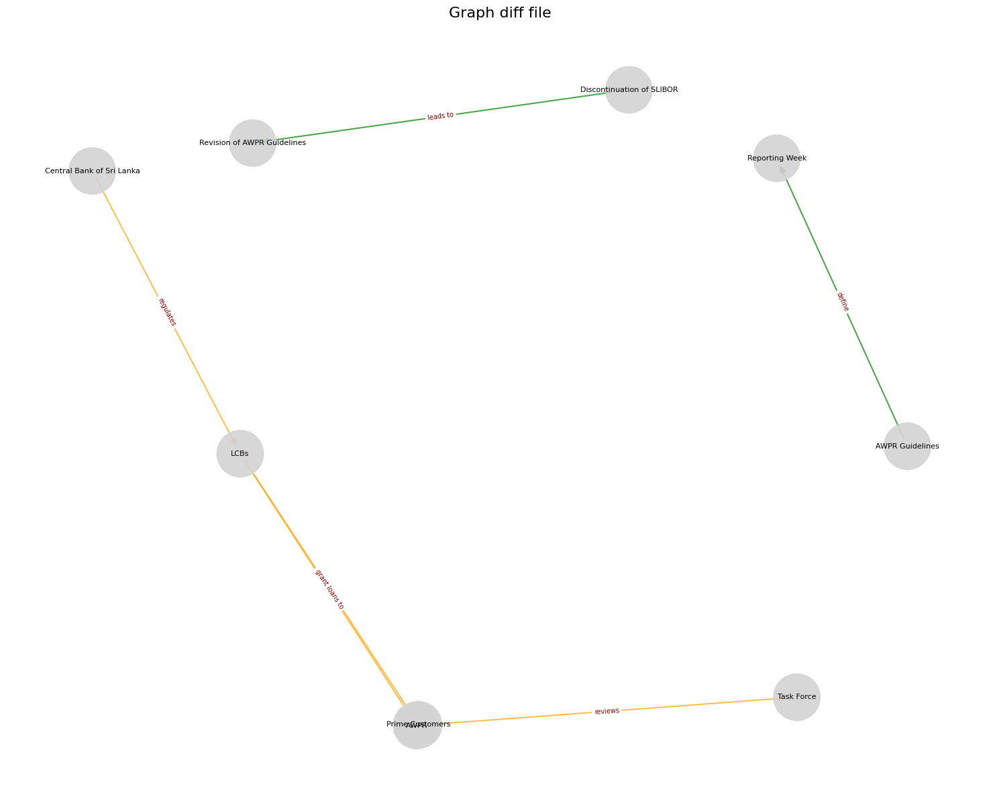


Visualizing the first graph from the processed diff files...


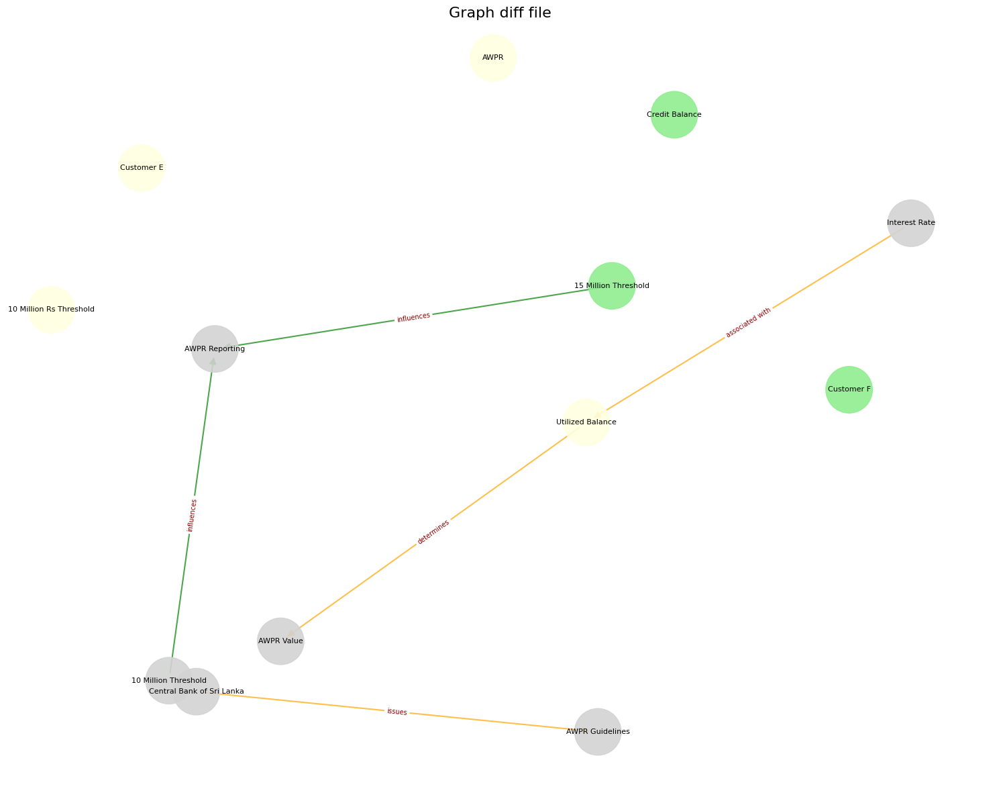


Visualizing the first graph from the processed diff files...


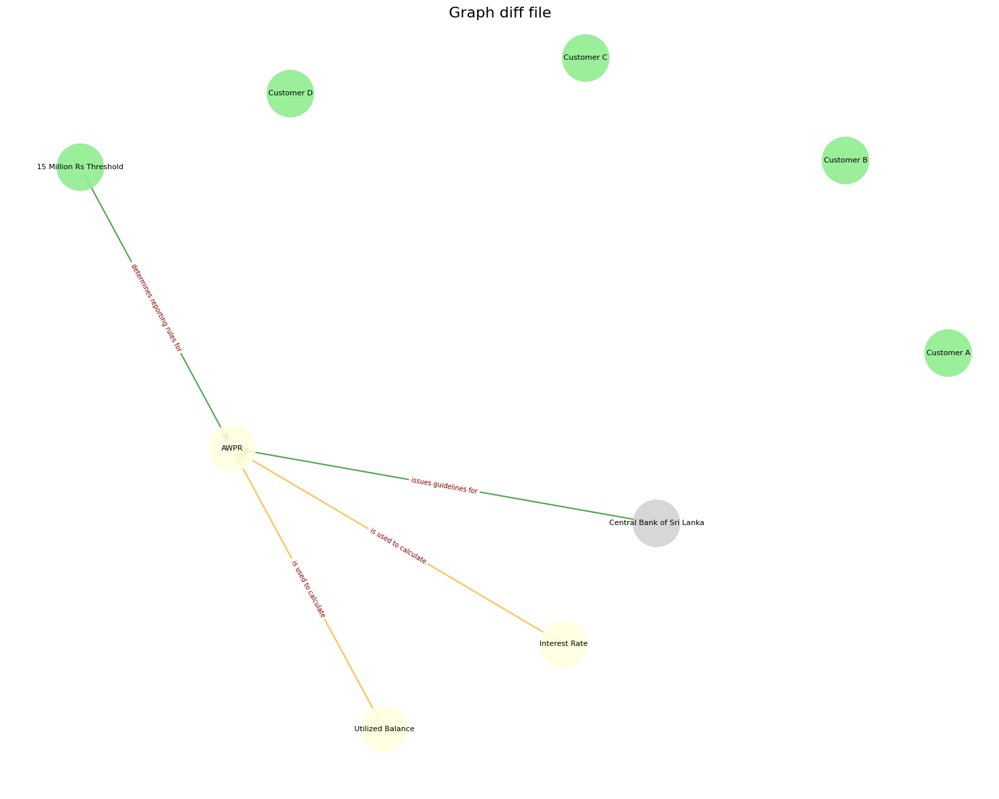


Visualizing the first graph from the processed diff files...


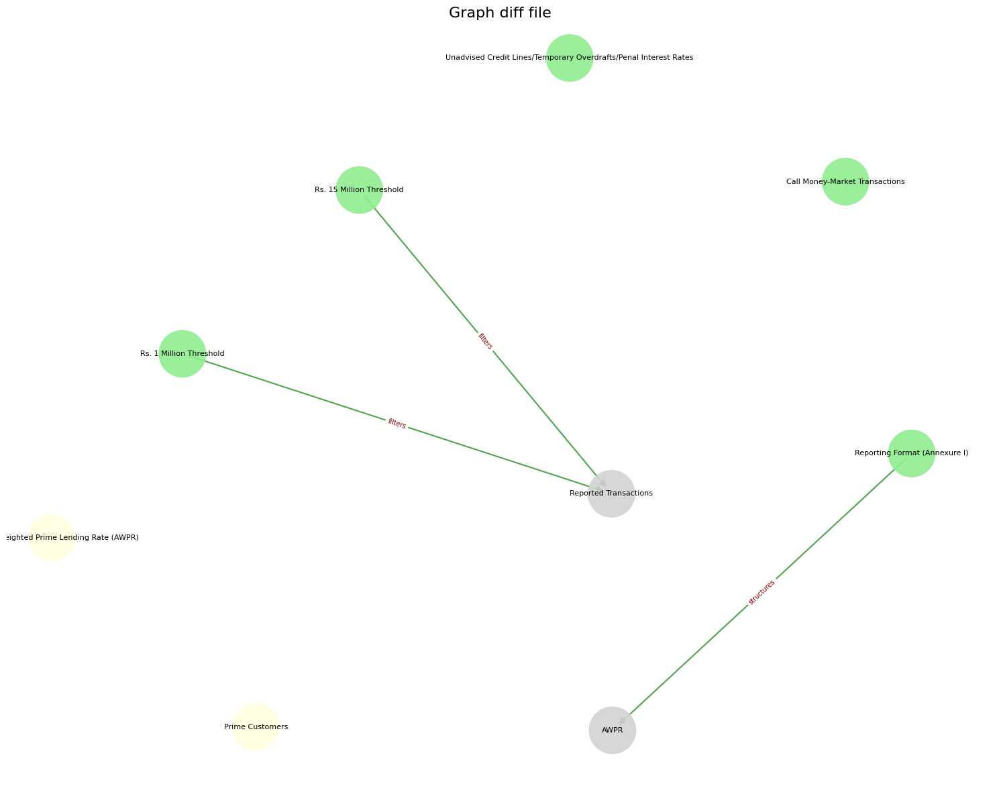


Visualizing the first graph from the processed diff files...


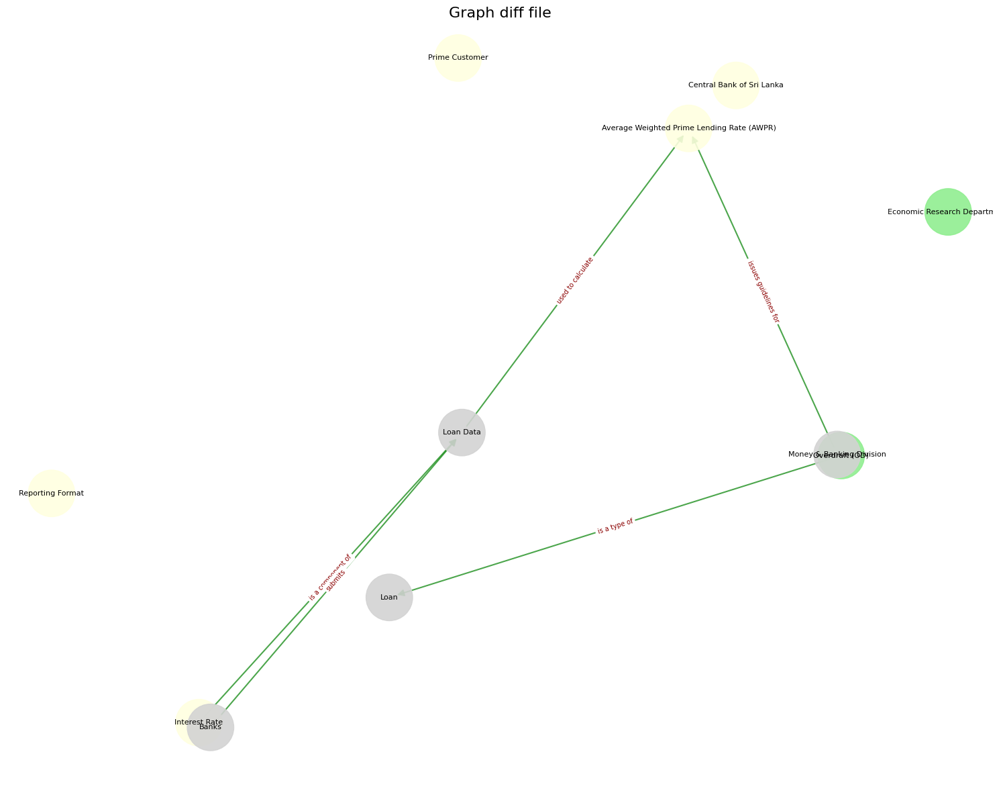


Visualizing the first graph from the processed diff files...


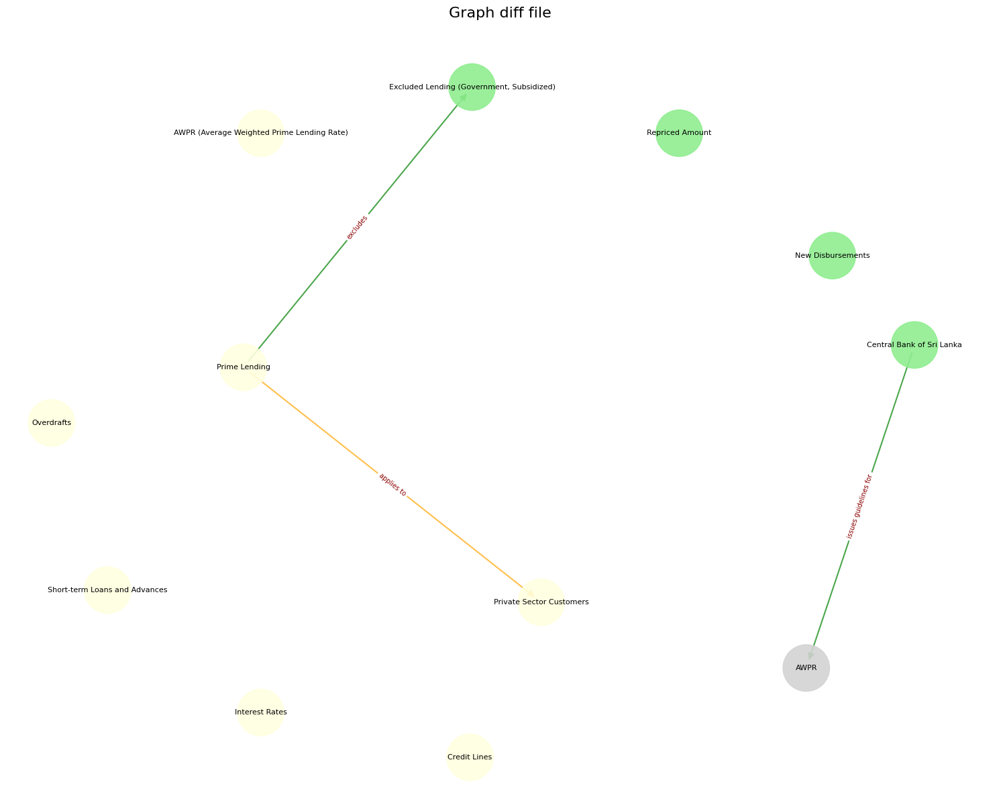


Merging all graphs and visualizing...
  Total nodes in merged graph: 51
  Total edges in merged graph: 27


In [209]:
import networkx as nx
import json
import os # Added for os.listdir and os.path.join

def create_graph_from_diff(diff_json_string):
    """
    Creates a NetworkX graph from a JSON string detailing differences
    between two graph versions.

    The graph will represent the state of entities and relationships
    as described by the "v2" (Version 2) or current state in the diff.
    It will also mark nodes and edges with their change status.
    """
    try:
        diff_data = json.loads(diff_json_string)
    except json.JSONDecodeError as e:
        print(f"Error decoding JSON: {e}")
        print(f"Problematic JSON string: {diff_json_string[:500]}...") # Print first 500 chars
        return None # Return None or an empty graph if JSON is invalid
        
    graph = nx.DiGraph() # Using a directed graph

    # Helper to add or update node attributes
    def add_node_with_attributes(node_label, attributes, change_status):
        if not graph.has_node(node_label):
            graph.add_node(node_label, label=node_label, **attributes, change_status=change_status)
        else:
            graph.nodes[node_label].update(attributes)
            graph.nodes[node_label]['change_status'] = change_status
            if 'label' not in graph.nodes[node_label]:
                 graph.nodes[node_label]['label'] = node_label


    # Process nodes
    if 'nodes_diff' in diff_data:
        nodes_diff = diff_data['nodes_diff']
        for node_data in nodes_diff.get('added_in_v2', []):
            attributes = {'description': node_data.get('description')}
            add_node_with_attributes(node_data['label'], attributes, 'added')

        for node_data in nodes_diff.get('modified', []):
            attributes = {'description': node_data.get('v2_description')}
            add_node_with_attributes(node_data['label'], attributes, 'modified')
            graph.nodes[node_data['label']]['v1_description'] = node_data.get('v1_description')

    # Process edges
    if 'edges_diff' in diff_data:
        edges_diff = diff_data['edges_diff']
        for edge_data in edges_diff.get('added_in_v2', []):
            source = edge_data['source_label']
            target = edge_data['target_label']
            
            if not graph.has_node(source):
                add_node_with_attributes(source, {}, 'implicit_from_edge') 
            if not graph.has_node(target):
                add_node_with_attributes(target, {}, 'implicit_from_edge') 

            graph.add_edge(
                source,
                target,
                label=edge_data['relationship_label'],
                details=edge_data.get('details'),
                change_status='added'
            )

        for edge_data in edges_diff.get('modified', []):
            source = edge_data['source_label']
            target = edge_data['target_label']

            if not graph.has_node(source):
                add_node_with_attributes(source, {}, 'implicit_from_edge')
            if not graph.has_node(target):
                add_node_with_attributes(target, {}, 'implicit_from_edge')
            
            graph.add_edge(
                source,
                target,
                label=edge_data['v2_relationship_label'], 
                details=edge_data.get('v2_details'),
                change_status='modified',
                v1_relationship_label=edge_data.get('v1_relationship_label'),
                v1_details=edge_data.get('v1_details')
            )
    return graph

def process_all_diff_jsons(folder_path):
    """
    Parses all JSON files in the given folder, creates a graph from each,
    and returns a list of these graphs.
    """
    all_graphs = []
    if not os.path.isdir(folder_path):
        print(f"Error: Folder not found at {folder_path}")
        return all_graphs

    for filename in os.listdir(folder_path):
        if filename.endswith(".json"):
            file_path = os.path.join(folder_path, filename)
            print(f"\nProcessing file: {file_path}")
            try:
                with open(file_path, 'r', encoding='utf-8') as f:
                    json_string = f.read()
                    # Check for empty or malformed JSON before parsing
                    if not json_string.strip() or json_string.strip() == "{}":
                        print(f"  Skipping empty or placeholder JSON file: {filename}")
                        continue
                    graph = create_graph_from_diff(json_string)
                    if graph: # Only add if graph creation was successful
                        all_graphs.append(graph)
                        print(f"  Successfully created graph from {filename}. Nodes: {graph.number_of_nodes()}, Edges: {graph.number_of_edges()}")
                    else:
                        print(f"  Failed to create graph from {filename} (likely due to JSON error or empty diff).")
            except Exception as e:
                print(f"  Error processing file {filename}: {e}")
    return all_graphs

def visualize_graph(graph, title="Graph Visualization"):
    """
    Visualizes a NetworkX graph using Matplotlib.
    """
    if not isinstance(graph, nx.Graph) or graph.number_of_nodes() == 0:
        print("Graph is empty or not a valid NetworkX graph. Cannot visualize.")
        return

    plt.figure(figsize=(15, 12)) # Adjust figure size as needed
    
    # Use a layout algorithm
    # spring_layout, kamada_kawai_layout, circular_layout, random_layout, shell_layout, spectral_layout
    pos = nx.kamada_kawai_layout(graph) 

    # Node colors based on 'change_status'
    node_colors = []
    for node in graph.nodes():
        status = graph.nodes[node].get('change_status', 'unknown')
        if status == 'added':
            node_colors.append('lightgreen')
        elif status == 'modified':
            node_colors.append('lightyellow')
        elif status == 'implicit_from_edge':
            node_colors.append('lightgray')
        else:
            node_colors.append('skyblue')

    # Edge colors based on 'change_status'
    edge_colors = []
    for u, v, data in graph.edges(data=True):
        status = data.get('change_status', 'unknown')
        if status == 'added':
            edge_colors.append('green')
        elif status == 'modified':
            edge_colors.append('orange')
        else:
            edge_colors.append('black')
            
    nx.draw_networkx_nodes(graph, pos, node_color=node_colors, node_size=2500, alpha=0.9)
    nx.draw_networkx_edges(graph, pos, edge_color=edge_colors, width=1.5, alpha=0.7, arrows=True, arrowstyle='-|>', arrowsize=15)
    
    # Node labels (using the 'label' attribute)
    node_labels = {node: graph.nodes[node].get('label', node) for node in graph.nodes()}
    nx.draw_networkx_labels(graph, pos, labels=node_labels, font_size=8)

    # Edge labels (using the 'label' attribute of the edge)
    edge_labels = {(u,v): data.get('label', '') for u,v,data in graph.edges(data=True)}
    nx.draw_networkx_edge_labels(graph, pos, edge_labels=edge_labels, font_size=7, font_color='darkred')

    plt.title(title, fontsize=16)
    plt.axis('off') # Turn off the axis
    plt.tight_layout()
    plt.show()

if __name__ == "__main__":
    DIFF_JSON_FOLDER = "/Users/shirsama/dtcc-hackathon/dtcc-ai-hackathon-2025/graph_diff_json"
    
    list_of_graphs = process_all_diff_jsons(DIFF_JSON_FOLDER)

    print(f"\n--- Summary ---")
    print(f"Total graphs created: {len(list_of_graphs)}")

    if list_of_graphs:
    #     # Visualize the first graph as an example
        for graph in list_of_graphs:
            print("\nVisualizing the first graph from the processed diff files...")
            visualize_graph(graph, title=f"Graph diff file")

        # If you want to merge and visualize all graphs:
    print("\nMerging all graphs and visualizing...")
    merged_graph = nx.DiGraph()
    for i, graph_to_merge in enumerate(list_of_graphs):
        # A more careful merge might be needed if node IDs overlap with different attributes
        # For now, nx.compose will overwrite attributes if nodes/edges are the same.
        # You might need a custom merge if you want to combine attributes or handle conflicts.
        for node, data in graph_to_merge.nodes(data=True):
            if not merged_graph.has_node(node):
                merged_graph.add_node(node, **data)
            else: # Basic conflict handling: update if new data has more keys or different status
                if len(data) > len(merged_graph.nodes[node]) or merged_graph.nodes[node].get('change_status') != data.get('change_status'):
                    merged_graph.nodes[node].update(data)
        
        for u, v, data in graph_to_merge.edges(data=True):
            if not merged_graph.has_edge(u,v): # Assuming only one edge between u,v for simplicity here
                merged_graph.add_edge(u,v,**data)
            else:
                if len(data) > len(merged_graph.get_edge_data(u,v)) or merged_graph.get_edge_data(u,v).get('change_status') != data.get('change_status'):
                        merged_graph.get_edge_data(u,v).update(data)


    print(f"  Total nodes in merged graph: {merged_graph.number_of_nodes()}")
    print(f"  Total edges in merged graph: {merged_graph.number_of_edges()}")

    import pickle

    file_name = "merged"


    # save graph object to file
    pickle.dump(main_graph, open(f'{file_name}_graph.pickle', 'wb'))

    
    # visualize_graph(merged_graph, title="Merged Graph of All Diffs")




Processing file: /Users/shirsama/dtcc-hackathon/dtcc-ai-hackathon-2025/graph_diff_json/chunk_7_diff.json
  Successfully created graph from chunk_7_diff.json. Nodes: 8, Edges: 3

Processing file: /Users/shirsama/dtcc-hackathon/dtcc-ai-hackathon-2025/graph_diff_json/chunk_1_diff.json
  Successfully created graph from chunk_1_diff.json. Nodes: 9, Edges: 6

Processing file: /Users/shirsama/dtcc-hackathon/dtcc-ai-hackathon-2025/graph_diff_json/chunk_6_diff.json
  Successfully created graph from chunk_6_diff.json. Nodes: 13, Edges: 5

Processing file: /Users/shirsama/dtcc-hackathon/dtcc-ai-hackathon-2025/graph_diff_json/chunk_5_diff.json
  Successfully created graph from chunk_5_diff.json. Nodes: 9, Edges: 4

Processing file: /Users/shirsama/dtcc-hackathon/dtcc-ai-hackathon-2025/graph_diff_json/chunk_3_diff.json
  Successfully created graph from chunk_3_diff.json. Nodes: 9, Edges: 3

Processing file: /Users/shirsama/dtcc-hackathon/dtcc-ai-hackathon-2025/graph_diff_json/chunk_4_diff.json
  S

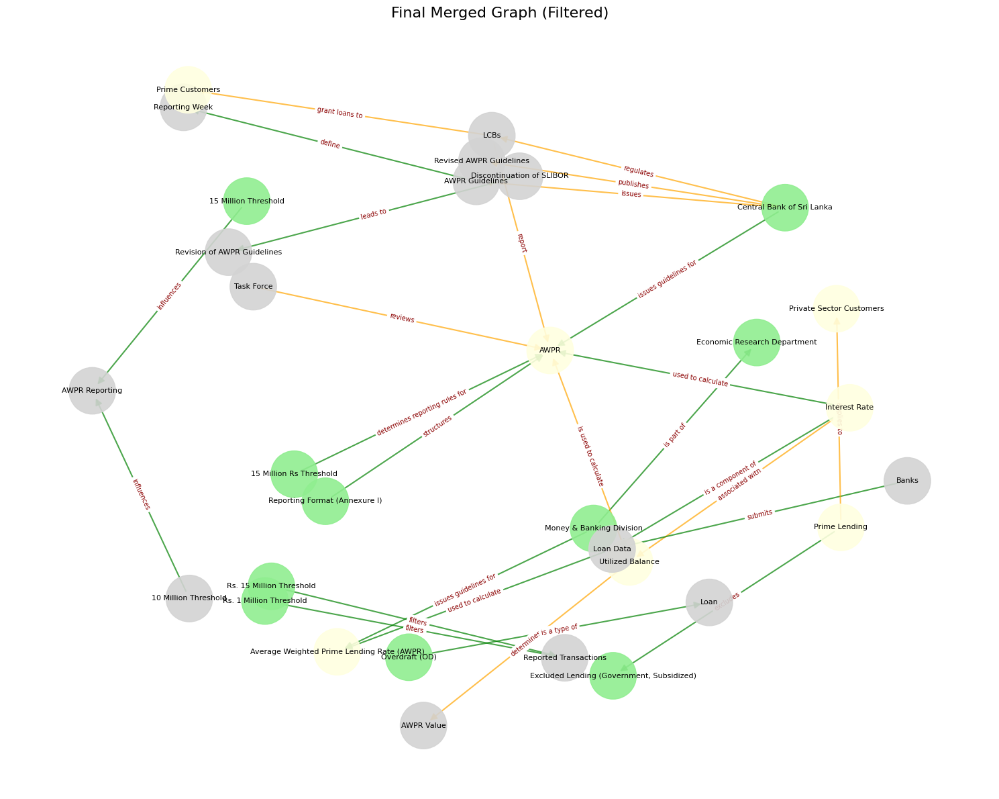

In [211]:
import networkx as nx
import json
import os
import pickle # Added for saving the graph

# Assuming matplotlib is used for visualization, though not directly requested for JSON output
# import matplotlib.pyplot as plt

def create_graph_from_diff(diff_json_string):
    """
    Creates a NetworkX graph from a JSON string detailing differences
    between two graph versions.

    The graph will represent the state of entities and relationships
    as described by the "v2" (Version 2) or current state in the diff.
    It will also mark nodes and edges with their change status.
    """
    try:
        diff_data = json.loads(diff_json_string)
    except json.JSONDecodeError as e:
        print(f"Error decoding JSON: {e}")
        print(f"Problematic JSON string: {diff_json_string[:500]}...")
        return None
        
    graph = nx.DiGraph()

    def add_node_with_attributes(node_label, attributes, change_status):
        if not graph.has_node(node_label):
            graph.add_node(node_label, label=node_label, **attributes, change_status=change_status)
        else:
            graph.nodes[node_label].update(attributes)
            graph.nodes[node_label]['change_status'] = change_status
            if 'label' not in graph.nodes[node_label]:
                 graph.nodes[node_label]['label'] = node_label

    if 'nodes_diff' in diff_data:
        nodes_diff = diff_data['nodes_diff']
        for node_data in nodes_diff.get('added_in_v2', []):
            attributes = {'description': node_data.get('description')}
            add_node_with_attributes(node_data['label'], attributes, 'added')

        for node_data in nodes_diff.get('modified', []):
            attributes = {'description': node_data.get('v2_description')}
            add_node_with_attributes(node_data['label'], attributes, 'modified')
            graph.nodes[node_data['label']]['v1_description'] = node_data.get('v1_description')

    if 'edges_diff' in diff_data:
        edges_diff = diff_data['edges_diff']
        for edge_data in edges_diff.get('added_in_v2', []):
            source = edge_data['source_label']
            target = edge_data['target_label']
            
            if not graph.has_node(source):
                add_node_with_attributes(source, {}, 'implicit_from_edge') 
            if not graph.has_node(target):
                add_node_with_attributes(target, {}, 'implicit_from_edge') 

            graph.add_edge(
                source,
                target,
                label=edge_data['relationship_label'],
                details=edge_data.get('details'),
                change_status='added'
            )

        for edge_data in edges_diff.get('modified', []):
            source = edge_data['source_label']
            target = edge_data['target_label']

            if not graph.has_node(source):
                add_node_with_attributes(source, {}, 'implicit_from_edge')
            if not graph.has_node(target):
                add_node_with_attributes(target, {}, 'implicit_from_edge')
            
            graph.add_edge(
                source,
                target,
                label=edge_data['v2_relationship_label'], 
                details=edge_data.get('v2_details'),
                change_status='modified',
                v1_relationship_label=edge_data.get('v1_relationship_label'),
                v1_details=edge_data.get('v1_details')
            )
    return graph

def process_all_diff_jsons(folder_path):
    """
    Parses all JSON files in the given folder, creates a graph from each,
    and returns a list of these graphs.
    """
    all_graphs = []
    if not os.path.isdir(folder_path):
        print(f"Error: Folder not found at {folder_path}")
        return all_graphs

    for filename in os.listdir(folder_path):
        if filename.endswith(".json"):
            file_path = os.path.join(folder_path, filename)
            print(f"\nProcessing file: {file_path}")
            try:
                with open(file_path, 'r', encoding='utf-8') as f:
                    json_string = f.read()
                    if not json_string.strip() or json_string.strip() == "{}":
                        print(f"  Skipping empty or placeholder JSON file: {filename}")
                        continue
                    graph = create_graph_from_diff(json_string)
                    if graph:
                        all_graphs.append(graph)
                        print(f"  Successfully created graph from {filename}. Nodes: {graph.number_of_nodes()}, Edges: {graph.number_of_edges()}")
                    else:
                        print(f"  Failed to create graph from {filename} (likely due to JSON error or empty diff).")
            except Exception as e:
                print(f"  Error processing file {filename}: {e}")
    return all_graphs

def filter_isolated_nodes(graph):
    """
    Removes nodes that have no incoming or outgoing edges.
    """
    isolated = [node for node, degree in graph.degree() if degree == 0]
    graph.remove_nodes_from(isolated)
    print(f"  Removed {len(isolated)} isolated nodes.")
    return graph

def graph_to_json(graph):
    """
    Converts a NetworkX graph to a JSON format suitable for many graph databases
    or for simple serialization. Nodes and edges are listed separately.
    Assumes node IDs are strings and edge data includes a 'label'.
    """
    output_json = {
        "nodes": [],
        "edges": []
    }
    for node, data in graph.nodes(data=True):
        node_data = {"id": node, **data} # Include the node ID itself in the attributes
        output_json["nodes"].append(node_data)

    for source, target, data in graph.edges(data=True):
        edge_data = {
            "source": source,
            "target": target,
            "relationship": data.get("label", "RELATED_TO"), # Use 'label' as relationship type
            **data  # Include all other edge attributes
        }
        output_json["edges"].append(edge_data)
    return output_json


if __name__ == "__main__":
    DIFF_JSON_FOLDER = "/Users/shirsama/dtcc-hackathon/dtcc-ai-hackathon-2025/graph_diff_json"
    OUTPUT_JSON_PATH = "merged_graph_output.json"
    OUTPUT_PICKLE_PATH = "merged_graph.pickle" # For saving the NetworkX object

    list_of_graphs = process_all_diff_jsons(DIFF_JSON_FOLDER)

    print(f"\n--- Summary ---")
    print(f"Total graphs created from diff files: {len(list_of_graphs)}")

    merged_graph = nx.DiGraph()
    if list_of_graphs:
        print("\nMerging all graphs...")
        for i, graph_to_merge in enumerate(list_of_graphs):
            for node, data in graph_to_merge.nodes(data=True):
                if not merged_graph.has_node(node):
                    merged_graph.add_node(node, **data)
                else:
                    # More robust attribute merging: prioritize 'added' or 'modified' status
                    # and update if new data has more specific info or a more "active" status.
                    current_status = merged_graph.nodes[node].get('change_status')
                    new_status = data.get('change_status')
                    
                    # Prioritize more "active" statuses or update if new data is more complete
                    should_update = False
                    if new_status == 'added' and current_status != 'added':
                        should_update = True
                    elif new_status == 'modified' and current_status not in ['added', 'modified']:
                        should_update = True
                    elif len(data) > len(merged_graph.nodes[node]) and current_status != 'added': # if new data has more attributes
                        should_update = True
                    
                    if should_update:
                        merged_graph.nodes[node].update(data)
                    # Ensure 'label' is present if it was in the original data
                    if 'label' in data and 'label' not in merged_graph.nodes[node]:
                        merged_graph.nodes[node]['label'] = data['label']


            for u, v, data in graph_to_merge.edges(data=True):
                if not merged_graph.has_edge(u,v): # Assuming one edge type for simplicity
                    merged_graph.add_edge(u,v,**data)
                else: # Basic conflict handling for edges
                    current_edge_data = merged_graph.get_edge_data(u,v)
                    new_status = data.get('change_status')
                    current_status = current_edge_data.get('change_status')

                    should_update_edge = False
                    if new_status == 'added' and current_status != 'added':
                        should_update_edge = True
                    elif new_status == 'modified' and current_status not in ['added', 'modified']:
                        should_update_edge = True
                    elif len(data) > len(current_edge_data) and current_status != 'added':
                        should_update_edge = True

                    if should_update_edge:
                        current_edge_data.update(data)


        print(f"  Total nodes in merged graph before filtering: {merged_graph.number_of_nodes()}")
        print(f"  Total edges in merged graph before filtering: {merged_graph.number_of_edges()}")

        # Filter out isolated nodes
        merged_graph = filter_isolated_nodes(merged_graph)

        print(f"  Total nodes in merged graph after filtering: {merged_graph.number_of_nodes()}")
        print(f"  Total edges in merged graph after filtering: {merged_graph.number_of_edges()}")

        # Convert the final merged graph to JSON
        final_graph_json = graph_to_json(merged_graph)

        # Save the JSON to a file
        try:
            with open(OUTPUT_JSON_PATH, 'w', encoding='utf-8') as f:
                json.dump(final_graph_json, f, indent=2, ensure_ascii=False)
            print(f"\nSuccessfully saved merged graph to JSON: {OUTPUT_JSON_PATH}")
        except IOError as e:
            print(f"Error saving JSON file: {e}")

        # Save the NetworkX graph object to a pickle file
        try:
            with open(OUTPUT_PICKLE_PATH, 'wb') as f:
                pickle.dump(merged_graph, f)
            print(f"Successfully saved merged graph object to pickle: {OUTPUT_PICKLE_PATH}")
        except IOError as e:
            print(f"Error saving pickle file: {e}")

    else:
        print("No graphs were created to merge or save.")

    # Visualization part is removed as the primary request is JSON output
    # If you still need visualization, you can uncomment the visualize_graph function
    # and call it here with merged_graph.
    # For example:
    if merged_graph.number_of_nodes() > 0:
        import matplotlib.pyplot as plt # Import here if only used for optional viz
        visualize_graph(merged_graph, title="Final Merged Graph (Filtered)")
